In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import librosa
import soundfile as sf
import os
import sklearn
from sklearn.model_selection import train_test_split
import math
from collections import OrderedDict
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import TensorDataset, DataLoader
import os
import time
from collections import OrderedDict
from numba import jit
import copy
import math
import string

#import hparams as hp
import utils

import sklearn as sk
from sklearn import preprocessing
import scipy as sp
from scipy.io.wavfile import write

from torch.utils.data import TensorDataset, DataLoader
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import TransformerEncoder, TransformerEncoderLayer
import glob
import os

import librosa
import numpy as np
import torch
from sklearn.preprocessing import LabelBinarizer
from torch.utils.data.dataloader import DataLoader
from torch.utils.data.dataset import Dataset

import random
import math

from scipy.io.wavfile import read
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile
#import numpy
#from scipy.io import wavfile
#from IPython.display import Audio
#import matplotlib.pyplot as plt
#import warnings
#warnings.filterwarnings('ignore')
#%matplotlib inline

C:\Users\Alexandra\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:20: UserWarning: Pandas requires version '2.7.3' or newer of 'numexpr' (version '2.7.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


http://andrewslotnick.com/posts/speeding-up-a-speech.html

In [2]:
speech_rate, speech_data = wavfile.read('moskva3.wav')

# Нормализация текста + ударение

In [3]:
#!pip install ruaccent

In [4]:
from ruaccent import RUAccent

accentizer = RUAccent()
accentizer.load(omograph_model_size='turbo', use_dictionary=True)

In [5]:
#txt = lst_string_letter_2
#for i in range(len(lst_string_letter_1)):
#    if lst_string_letter_1[i] == ["+"]:
#        x = txt.replace('+', '-')

<ipython-input-408-b0476519c2a9>:504: ComplexWarning: Casting complex values to real discards the imaginary part
  sp.io.wavfile.write('zz.wav', 41050, lst.astype(speech_data.dtype))


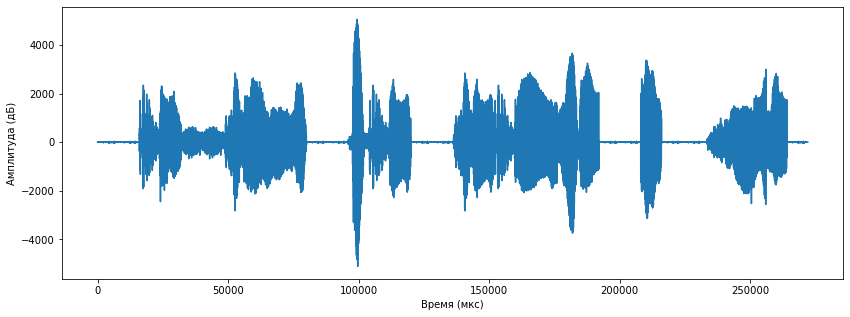

In [408]:
import re
#string = "     печень очень хочу "
#string = "   .  не  хватает  пива  и  чипсов. "
string = "       . рассказ  про  корову  и  фею ."
#string = "       . рассказ  про  школу ."
#string = "       . папа  не  стар ."
#string = "       .  я  хочу  рассказать  про  школу ."
#string = ".  Я  очень  стараюсь  ."
#string = "       Она так красива"
#string = "       Какой он врач"
#string = "      очень"
#string = "       Вася где работает?"
#string = "       это москва?"
lst_string_letter_2 = accentizer.process_all(string)
lower_string = lst_string_letter_2.lower()
no_number_string = re.sub(r'\d+','',lower_string)
#no_punc_string = re.sub(r'[^\w\s]','', no_number_string)
no_wspace_string = no_number_string.strip()
lst_string = [no_wspace_string][0].split()
lst_string_letter = [no_wspace_string][0].split()
lst_string_letter_1 = []
for j in range(len(no_wspace_string)):
    for i in range(len(no_wspace_string[j])):
        lst_string_letter_0 = [no_wspace_string][0][j].split()
        lst_string_letter_1.append(lst_string_letter_0)
#print(lst_string_letter_1) 
phoneme = {
    "001": "а",
    "002": "б",
    "102": "б'",
    "003": "в",
    "103": "в'",
    "004": "г",
    "104": "г'",
    "005": "д",
    "105": "д'",
    "006": "е",
    "007": "ё",
    "008": "ж",
    "108": "ж'",
    "009": "з",
    "109": "з'",
    "010": "и",
    "011": "й",
    "012": "к",
    "112": "к'",
    "013": "л",
    "113": "л'",
    "014": "м",
    "114": "м'",
    "015": "н",
    "115": "н'",
    "016": "о",
    "017": "п",
    "117": "п'",
    "018": "р",
    "118": "р'",
    "019": "с",
    "119": "с'",
    "020": "т",
    "120": "т'",
    "021": "у",
    "022": "ф",
    "122": "ф'",
    "023": "х",
    "123": "х'",
    "024": "ц",
    "025": "ч",
    "026": "ш",
    "027": "щ",
    "028": "ь",
    "029": "ы",
    "030": "ъ",
    "031": "э",
    "032": "ю",
    "033": "я",
    "034": '',
    "035": "?",
    "036": "-",
    "037": ",",
    "038": ".",
    "039": "+",
    "040": "А",
    "041": "Е",
    "042": "Ё",
    "043": "И",
    "044": "О",
    "045": "У",
    "046": "Ы",
    "047": "Э",
    "048": "Ю",
    "049": "Я"
}
grapheme = []
for i in range(len(lst_string_letter_1)):
    xs = lst_string_letter_1[i]
    s = ''.join(str(x) for x in xs)
    target_grade = s

    keys = list(phoneme.keys())
    index = list(phoneme.values()).index(target_grade)
    key = keys[index]
    grapheme.append(key)
#grapheme
phoneme1 = {
    "002": "б",
    "003": "в",
    "004": "г",
    "005": "д",
    "008": "ж",
    "009": "з",
    "012": "к",
    "013": "л",
    "014": "м",
    "015": "н",
    "017": "п",
    "018": "р",
    "019": "с",
    "020": "т",
    "022": "ф",
    "023": "х",
 #   "024": "ц",
 #   "025": "ч",
 #   "026": "ш",
 #   "027": "щ"
}
phoneme2 = {
    "102": "б'",
    "103": "в'",
    "104": "г'",
    "105": "д'",
    "108": "ж'",
    "109": "з'",
    "112": "к'",
    "113": "л'",
    "114": "м'",
    "115": "н'",
    "117": "п'",
    "118": "р'",
    "119": "с'",
    "120": "т'",
    "122": "ф'",
    "123": "х'"
}
phoneme4 = {
    "001": "а",
    "006": "е",
    "007": "ё",
    "010": "и",
    "016": "о",
    "021": "у",
    "028": "ь",
    "029": "ы",
#    "030": "ъ",
    "031": "э",
    "032": "ю",
    "033": "я"
}
phoneme5 = {
    "006": "е",
    "007": "ё",
    "010": "и",
    "032": "ю",
    "033": "я",
    "028": "ь"
}
phoneme_iskl = {
    "035": "?",
    "036": "-",
    "037": ",",
    "038": "."
}
phoneme44 = {
    "040": "А",
    "041": "Е",
    "042": "Ё",
    "043": "И",
    "044": "О",
    "045": "У",
    "028": "ь",
    "046": "Ы",
#    "030": "ъ",
    "047": "Э",
    "048": "Ю",
    "049": "Я"
}
grapheme_phoneme4 = list(phoneme4.keys())
grapheme_phoneme44 = list(phoneme44.keys())
grapheme0 = list(phoneme.keys())
grapheme1 = list(phoneme5.keys())
grapheme2 = list(phoneme1.keys())
grapheme_iskl = list(phoneme_iskl.keys())
a = grapheme1
b = grapheme
x = []
c = []
x2 = []

for i in a:
    for j in b:
        if i == j:
            c.append(i)
            break
#print(c)
for j in range(len(c)):
    x.append([i for i, ltr in enumerate(grapheme) if ltr == c[j]])
#print(x)   
x2 = [element for each_list in x for element in each_list]
#print(x2)
index_grapheme1 = x2
index_phonem_grapheme1 = c
a = grapheme2
b = grapheme
x = []
c = []
x2 = []

for i in a:
    for j in b:
        if i == j:
            c.append(i)
            break
#print(c)
for j in range(len(c)):
    x.append([i for i, ltr in enumerate(grapheme) if ltr == c[j]])
#print(x)   
x2 = [element for each_list in x for element in each_list]
#print(x2)
index_grapheme2 = x2
index_phonem_grapheme2 = c
a = grapheme_iskl
b = grapheme
x = []
c = []
x2 = []

for i in a:
    for j in b:
        if i == j:
            c.append(i)
            break
#print(c)
for j in range(len(c)):
    x.append([i for i, ltr in enumerate(grapheme) if ltr == c[j]])
#print(x)   
x2 = [element for each_list in x for element in each_list]
#print(x2)
index_grapheme_iskl = x2
index_phonem_grapheme_iskl = c
#//////////////////////////////////////////////////////////////////////////////////
phoneme4 = {
    "001": "а",
    "006": "е",
    "007": "ё",
    "010": "и",
    "016": "о",
    "021": "у",
#    "028": "ь",
    "029": "ы",
#    "030": "ъ",
    "031": "э",
    "032": "ю",
    "033": "я"
}
grapheme_phoneme4 = list(phoneme4.keys())
phoneme44 = {
    "040": "А",
    "041": "Е",
    "042": "Ё",
    "043": "И",
    "044": "О",
    "045": "У",
#    "028": "ь",
    "046": "Ы",
#    "030": "ъ",
    "047": "Э",
    "048": "Ю",
    "049": "Я"
}
grapheme_phoneme44 = list(phoneme44.keys())
phoneme_445 = {
    "041": "Е",
    "042": "Ё",
    "043": "И",
    "048": "Ю",
    "049": "Я",
    "028": "ь"
}
grapheme_phoneme_445 = list(phoneme_445.keys())
cc_1 = []
cc_2 = []
for i in range(len(grapheme)):
    if '039' == grapheme[i]:
        cc_1.append(i)
        cc_2.append(i+1)
cc_3 = []
cc_4 = []
cc_5 = []
for i in range(len(grapheme)):
    for j in range(len(grapheme_phoneme44)):
        if grapheme[i] == "039":
            if grapheme_phoneme4[j] == grapheme[i+1]:
                cc_3.append(i+1)
                cc_4.append(j)
                cc_5.append(j+1)
for j in range(len(cc_3)):
    grapheme[cc_3[j]] = grapheme_phoneme44[cc_4[j]]
grapheme123321 = []
for i in range(len(grapheme)):
    if grapheme[i] != "039":
        grapheme123321.append(grapheme[i]) 
grapheme123321 = []
for i in range(len(grapheme)):
    if grapheme[i] != '039':
        grapheme123321.append(grapheme[i]) 
#grapheme123321 = grapheme
grapheme = grapheme123321
#///////////////////////////////////////////////////////////
a = grapheme_phoneme_445
b = grapheme
x = []
c = []
x2 = []

for i in a:
    for j in b:
        if i == j:
            c.append(i)
            break
#print(c)
for j in range(len(c)):
    x.append([i for i, ltr in enumerate(grapheme) if ltr == c[j]])
#print(x)   
x2 = [element for each_list in x for element in each_list]
#print(x2)
index_grapheme_phoneme_445 = x2
index_phonem_graphemephoneme_445 = c
a = grapheme2
b = grapheme
x = []
c = []
x2 = []

for i in a:
    for j in b:
        if i == j:
            c.append(i)
            break
#print(c)
for j in range(len(c)):
    x.append([i for i, ltr in enumerate(grapheme) if ltr == c[j]])
#print(x)   
x2 = [element for each_list in x for element in each_list]
#print(x2)
index_grapheme2 = x2
index_phonem_grapheme2 = c
#################################################################################
#ВЫБОР МЯГКОЙ ФОНЕМЫ
str1 = "1"
ind=[]
cc = []
grapheme4 = []
for i in index_grapheme2:
    for j in index_grapheme_phoneme_445:
        if i+1 == j:
            cc.append(i)
            #break
            my_string = grapheme[i]
            result_string = ""
            index = 0
            for k in range(len(my_string)):
                if k != index:
                    result_string += my_string[k]
            grapheme4.append(str1+result_string)
grapheme5 = grapheme
for i in range(len(cc)):
    grapheme5[cc[i]] = grapheme4[i]
#######################################################################
#####/////////////////////////////////////////////////////////////////
#///////////////////////////////////////////////////////////
grapheme55 = []
for i in range(len(grapheme5)):
    if grapheme5[i] != '028':
        grapheme55.append(grapheme5[i]) 
#######################################################################
#####/////////////////////////////////////////////////////////////////
#///////////////////////////////////////////////////////////
grapheme55 = []
for i in range(len(grapheme5)):
    if grapheme5[i] != '028':
        grapheme55.append(grapheme5[i]) 
#////////////////////////////////////////////////////////////////////////////////////
data_bis1=[]
for i in range(len(keys)): 
    #rate, data = sp.io.wavfile.read(keys[i] + '1' + '.wav')
    rate, data = sp.io.wavfile.read("gen" + keys[i] + '.wav')
    data_bis = np.fft.ifft(np.fft.fft(data))
    data_bis1.append(data_bis)
d = {}
d = {
    keys[0]: data_bis1[0],
    keys[1]: data_bis1[1],
    keys[2]: data_bis1[2],
    keys[3]: data_bis1[3],
    keys[4]: data_bis1[4],
    keys[5]: data_bis1[5],
    keys[6]: data_bis1[6],
    keys[7]: data_bis1[7],
    keys[8]: data_bis1[8],
    keys[9]: data_bis1[9],
    keys[10]: data_bis1[10],
    keys[11]: data_bis1[11],
    keys[12]: data_bis1[12],
    keys[13]: data_bis1[13],
    keys[14]: data_bis1[14],
    keys[15]: data_bis1[15],
    keys[16]: data_bis1[16],
    keys[17]: data_bis1[17],
    keys[18]: data_bis1[18],
    keys[19]: data_bis1[19],
    keys[20]: data_bis1[20],
    keys[21]: data_bis1[21],
    keys[22]: data_bis1[22],
    keys[23]: data_bis1[23],
    keys[24]: data_bis1[24],
    keys[25]: data_bis1[25],
    keys[26]: data_bis1[26],
    keys[27]: data_bis1[27],
    keys[28]: data_bis1[28],
    keys[29]: data_bis1[29],
    keys[30]: data_bis1[30],
    keys[31]: data_bis1[31],
    keys[32]: data_bis1[32],
    keys[33]: data_bis1[33],
    keys[34]: data_bis1[34],
    keys[35]: data_bis1[35],
    keys[36]: data_bis1[36],
    keys[37]: data_bis1[37],
    keys[38]: data_bis1[38],
    keys[39]: data_bis1[39],
    keys[40]: data_bis1[40],
    keys[41]: data_bis1[41],
    keys[42]: data_bis1[42],
    keys[43]: data_bis1[43],
    keys[44]: data_bis1[44],
    keys[45]: data_bis1[45],
    keys[46]: data_bis1[46],
    keys[47]: data_bis1[47],
    keys[48]: data_bis1[48],
    keys[49]: data_bis1[49],
    keys[50]: data_bis1[50],
    keys[51]: data_bis1[51],
    keys[52]: data_bis1[52],
    keys[53]: data_bis1[53],
    keys[54]: data_bis1[54],
    keys[55]: data_bis1[55],
    keys[56]: data_bis1[56],
    keys[57]: data_bis1[57],
    keys[58]: data_bis1[58],
    keys[59]: data_bis1[59],
    keys[60]: data_bis1[60],
    keys[61]: data_bis1[61],
    keys[62]: data_bis1[62],
    keys[63]: data_bis1[63],
    keys[64]: data_bis1[64],
}
keys2= list(d.keys())
phonemes = []
phon = []
for i in range(len(grapheme)):
    phon = d[grapheme[i]]
    phonemes.append(phon)
################################################удаляем тишину
#new_list=grapheme.copy()
new_list=grapheme
for i in grapheme:
    for j in [grapheme0[50]]:
        if i == j:
            new_list.remove(grapheme0[49])
            #print('1')
            break
phonemes = []
phon = []
for i in range(len(grapheme)):
    phon = d[grapheme[i]]
    phonemes.append(phon)
ind=[]
cc1 = []
cc2 = []
for i in index_grapheme2:
    for j in index_grapheme1:
        if i+1 == j:
            cc1.append(i)
            cc2.append(j)
            break
x = len(phonemes[0])
y = len(phonemes)

lst = []
for i in range(y):
    for j in phonemes[i]:
        lst.append(j)
lst = np.array(lst, dtype=np.complex128)
sp.io.wavfile.write('zz.wav', 41050, lst.astype(speech_data.dtype))
input_data = read("zz.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('zz.wav')

<ipython-input-412-1a3119144335>:25: ComplexWarning: Casting complex values to real discards the imaginary part
  sp.io.wavfile.write('var1.wav', 41050, results_lst.astype(speech_data.dtype))


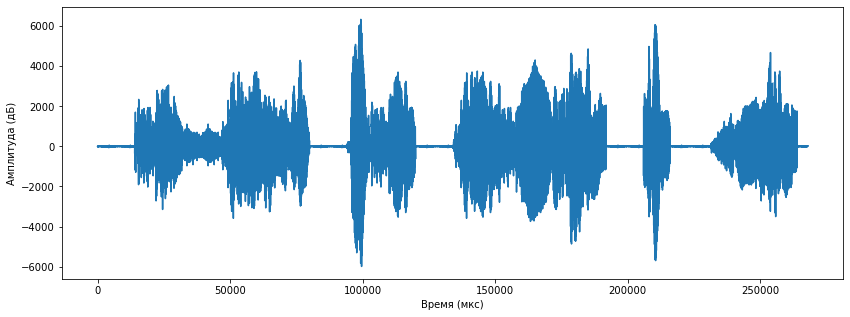

In [412]:
sr, y = wavfile.read('zz.wav')
#window_size = 1500
#h = 2000
window_size = 2000
h = 2000
results = []
result = []
phase  = np.zeros(window_size)
hanning_window = np.hanning(window_size)
for i in np.arange(0, len(y)-(window_size+h), h):
    a1 = y[i: i + window_size]
    a2 = y[i + h: i + window_size + h]
    s1 =  np.fft.ifft(np.fft.fft(a1))
    s2 =  np.fft.ifft(np.fft.fft(a2))
    result = s1 + s2
    results.append(result)
x = len(results[0])
y = len(results)

results_lst = []
for i in range(y):
    for j in results[i]:
        results_lst.append(j)
results_lst = np.array(results_lst)
sp.io.wavfile.write('var1.wav', 41050, results_lst.astype(speech_data.dtype))
input_data = read("var1.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('var1.wav')

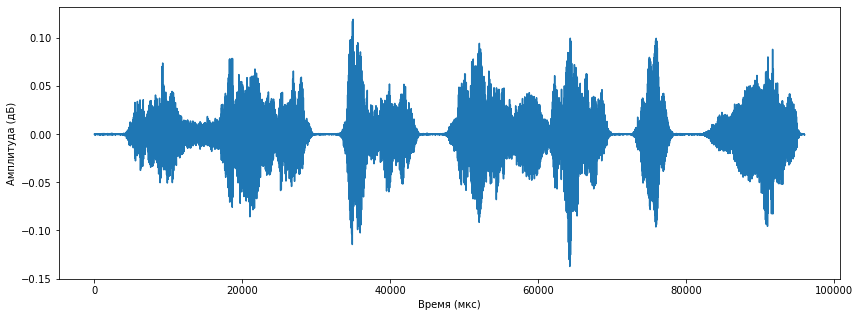

In [413]:
song, fs = librosa.load("var1.wav")
song_2_times_faster = librosa.effects.time_stretch(song, rate=1.5)
sp.io.wavfile.write("var4.wav", fs, song_2_times_faster)

input_data = read("var4.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('var4.wav')

# ИК-7 ////////////////////////////////////////////////////////////////////////////////

In [10]:
#"Какой он врач!».

In [11]:
def speedx(sound_array, indices):
    #return sound_array[ indices.astype(int) ]
    return sound_array[ indices ]

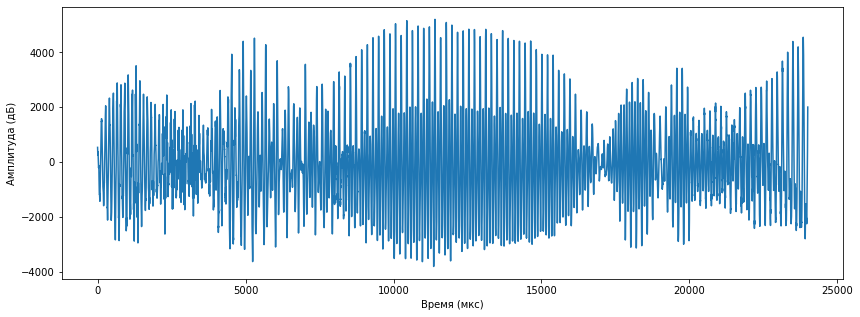

In [12]:
sr, y = wavfile.read('zz0.wav')
#y1 = np.array(y[int(index1[0]*8000):int((index1[2]+3)*8000)])
y1 = np.array(y[int(2*8000):int(5*8000)])
y2 = np.array(y[int(2*8000):int(5*8000)])
#y1 = np.array(y[int((len(y)/8000-3)*8000):])
for i in range(len(y1)):
    y1[i] = y1[i] + y1[i]*(i/50000)
#y1 = np.array(y1)
sp.io.wavfile.write('phon05.wav', 41050, y2.astype(np.int16))
input_data = read("phon05.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('phon05.wav')

In [13]:
len(y2)/80

300.0

<ipython-input-11-b5d2b687cba1>:3: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return sound_array[ indices ]


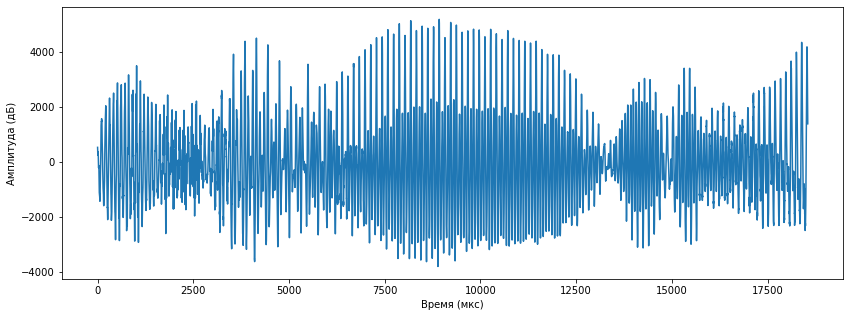

In [20]:
sr, y = wavfile.read('phon05.wav')
indices0 = []
indices00 = []
indices000 = []
for i in range(80):
    indices0 = np.array((np.round(np.arange(0, i*300, 0.4+i/90) )).astype(int))
    #indices0 = np.array((np.round(np.arange(0, i*300, 0.3+i/90) )).astype(int))
    indices00 = indices0[indices0 < i*300].astype(int)
indices000.append(indices00.astype(int))
#yp = y[60000:]
pop = speedx(y,indices000)
#pop1 = pop
#for i in range(len(pop)):
#    #pop1[i] = pop1[i] + pop1[i]*(i/3500)
#    pop1[i] = pop1[i] - pop1[i]*(i/10000)
sp.io.wavfile.write('phon005.wav', 41050, pop)
input_data = read("phon005.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('phon005.wav')

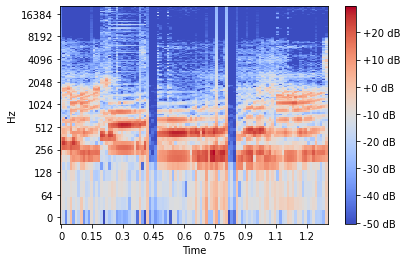

In [23]:
sr, y = wavfile.read('zz0.wav')
sr1, y1 = wavfile.read('phon005.wav')
speech_data3 = np.append(np.array(y[:int(2*8000)]), np.array(y1))
speech_data4 = np.append(speech_data3, np.array(y[int(6*8000):]))
sp.io.wavfile.write('IK-7.wav', 41050, speech_data4.astype(np.int16))
arr, sr = librosa.load('IK-7.wav', sr=41050)
X = librosa.stft(arr, n_fft=1024, hop_length=1024)
Xdb = librosa.amplitude_to_db(abs(X))
fig, ax = plt.subplots()
img = librosa.display.specshow(Xdb, x_axis='time', y_axis='log', sr=sr, ax=ax)
plt.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()
ipd.Audio('IK-7.wav')

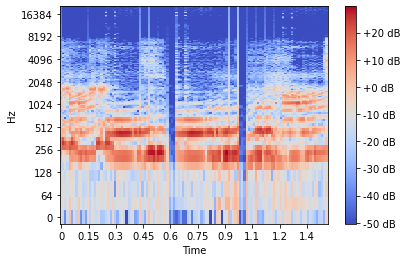

In [16]:
arr, sr = librosa.load('zz0.wav', sr=41050)
X = librosa.stft(arr, n_fft=1024, hop_length=1024)
Xdb = librosa.amplitude_to_db(abs(X))
fig, ax = plt.subplots()
img = librosa.display.specshow(Xdb, x_axis='time', y_axis='log', sr=sr, ax=ax)
plt.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()
ipd.Audio('zz0.wav')

# ИК-5 ////////////////////////////////////////////////////////////////////////////////////

In [2279]:
#"Она так красива!».

In [27]:
def speedx(sound_array, indices):
    #return sound_array[ indices.astype(int) ]
    return sound_array[ indices ]

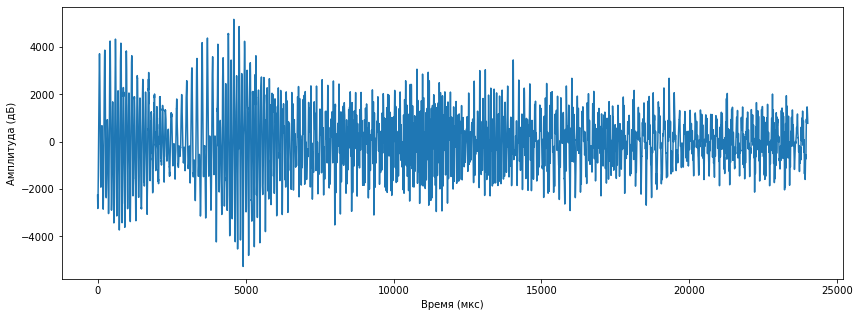

In [28]:
sr, y = wavfile.read('zz0.wav')
#y1 = np.array(y[int(index1[0]*8000):int((index1[2]+3)*8000)])
y1 = np.array(y[int(5*8000):int(8*8000)])
y2 = np.array(y[int(5*8000):int(8*8000)])
#y1 = np.array(y[int((len(y)/8000-3)*8000):])
for i in range(len(y1)):
    y1[i] = y1[i] + y1[i]*(i/50000)
#y1 = np.array(y1)
sp.io.wavfile.write('phon03.wav', 41050, y2.astype(np.int16))
input_data = read("phon03.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('phon03.wav')

In [29]:
len(y2)/80

300.0

<ipython-input-27-b5d2b687cba1>:3: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return sound_array[ indices ]


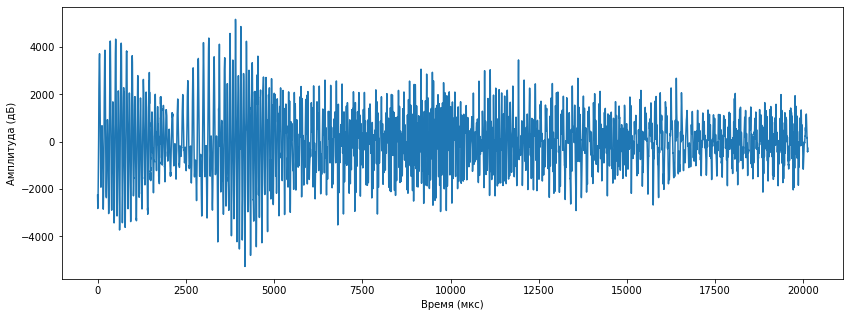

In [42]:
sr, y = wavfile.read('phon03.wav')
indices0 = []
indices00 = []
indices000 = []
for i in range(80):
    indices0 = np.array((np.round(np.arange(0, i*300, 0.3+i/90) )).astype(int))
    #indices0 = np.array((np.round(np.arange(0, i*300, 0.6+i/90) )).astype(int))
    indices00 = indices0[indices0 < i*300].astype(int)
indices000.append(indices00.astype(int))
#yp = y[60000:]
pop = speedx(y,indices000)
#pop1 = pop
#for i in range(len(pop)):
#    #pop1[i] = pop1[i] + pop1[i]*(i/3500)
#    pop1[i] = pop1[i] - pop1[i]*(i/10000)
sp.io.wavfile.write('phon003.wav', 41050, pop)
input_data = read("phon003.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('phon003.wav')

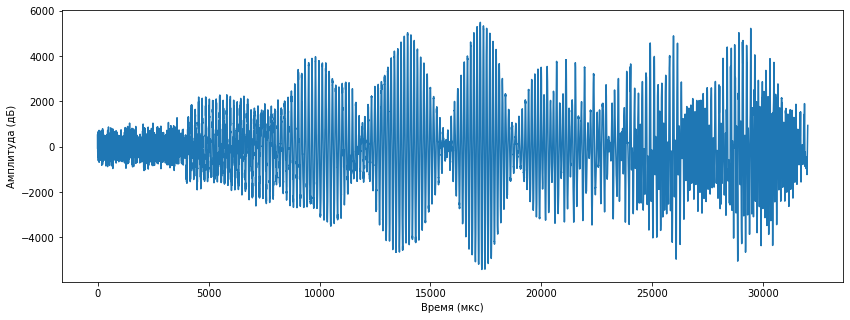

In [43]:
sr, y = wavfile.read('zz0.wav')
#y1 = np.array(y[int(index1[0]*8000):int((index1[2]+3)*8000)])
y1 = np.array(y[int(13*8000):])
y2 = np.array(y[int(13*8000):])
#y1 = np.array(y[int((len(y)/8000-3)*8000):])
for i in range(len(y1)):
    y1[i] = y1[i] + y1[i]*(i/50000)
#y1 = np.array(y1)
sp.io.wavfile.write('phon04.wav', 41050, y2.astype(np.int16))
input_data = read("phon04.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('phon04.wav')

In [44]:
len(y2)/14

2285.714285714286

<ipython-input-27-b5d2b687cba1>:3: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return sound_array[ indices ]


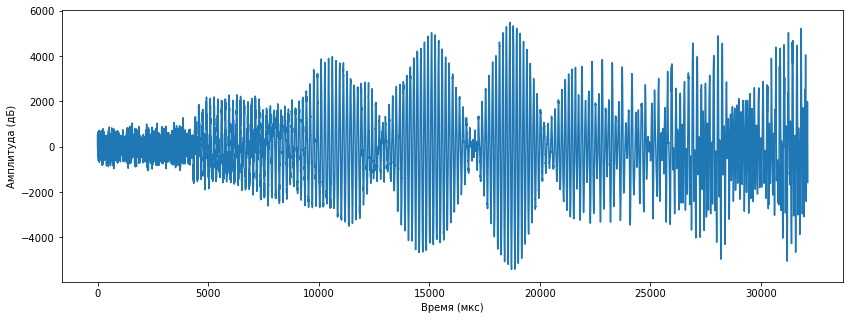

In [56]:
sr, y = wavfile.read('phon04.wav')
indices0 = []
indices00 = []
indices000 = []
for i in range(14):
    #indices0 = np.array((np.round(np.arange(0, i*1230, 0.8+i/25) )).astype(int))
    #indices0 = np.array((np.round(np.arange(0, i*2857, 1-i/50) )).astype(int))
    #indices00 = indices0[indices0 < i*2857].astype(int)
    indices0 = np.array((np.round(np.arange(0, i*2285, 1.25-i/40) )).astype(int))
    #indices0 = np.array((np.round(np.arange(0, i*2285, 1.1-i/40) )).astype(int))
    indices00 = indices0[indices0 < i*2285].astype(int)
indices000.append(indices00.astype(int))
#yp = y[60000:]
pop = speedx(y,indices000)
#pop1 = pop
#for i in range(len(pop)):
#    pop1[i] = pop1[i] + pop1[i]*(i/100000)
sp.io.wavfile.write('phon004.wav', 41050, pop)
input_data = read("phon004.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('phon004.wav')

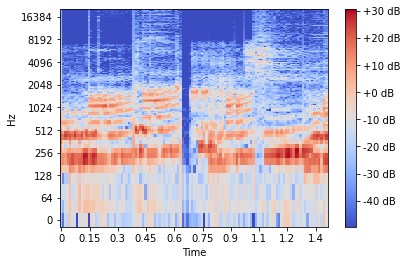

In [59]:
sr, y = wavfile.read('zz0.wav')
sr1, y1 = wavfile.read('phon003.wav')
sr2, y2 = wavfile.read('phon004.wav')
speech_data3 = np.append(np.array(y[:int(4*8000)]), np.array(y1))
speech_data4 = np.append(speech_data3, np.array(y[int(9*8000):int(13*8000)]))
speech_data5 = np.append(speech_data4, np.array(y2))
sp.io.wavfile.write('IK-5.wav', 41050, speech_data5.astype(np.int16))
arr, sr = librosa.load('IK-5.wav', sr=41050)
X = librosa.stft(arr, n_fft=1024, hop_length=1024)
Xdb = librosa.amplitude_to_db(abs(X))
fig, ax = plt.subplots()
img = librosa.display.specshow(Xdb, x_axis='time', y_axis='log', sr=sr, ax=ax)
plt.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()
ipd.Audio('IK-5.wav')

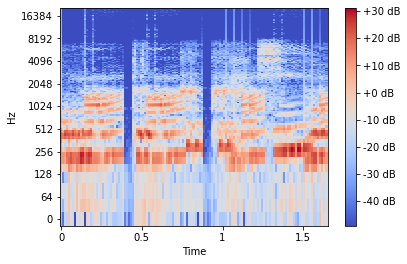

In [60]:
arr, sr = librosa.load('zz0.wav', sr=41050)
X = librosa.stft(arr, n_fft=1024, hop_length=1024)
Xdb = librosa.amplitude_to_db(abs(X))
fig, ax = plt.subplots()
img = librosa.display.specshow(Xdb, x_axis='time', y_axis='log', sr=sr, ax=ax)
plt.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()
ipd.Audio('zz0.wav')

# ИК-2 /////////////////////////////////////////////////////////////////////////////////////////

In [64]:
import re
dif = []
dif2 = []
dictionary = ['Кто','кто','Что','что','Какой','какой','Который','который','Где','где',
              'Когда','когда','Почему','почему','Зачем','зачем','Куда','куда','Откуда','откуда',
              'Сколько','сколько','Чей','чей','Как','как']
string = "       вася где работает?"
sm = set(string.split())
if set(dictionary) & set(string.split()):
    dif.append(1)
dif2 = [a for a in sm if a in dictionary]
#lst_string_letter_2 = accentizer.process_all(string)
lower_string = string.lower()
no_number_string = re.sub(r'\d+','',lower_string)
#no_punc_string = re.sub(r'[^\w\s]','', no_number_string)
no_wspace_string = no_number_string.strip()
lst_string = [no_wspace_string][0].split()
lst_string_letter = [no_wspace_string][0].split()
lst_string_letter_1 = []
for j in range(len(no_wspace_string)):
    for i in range(len(no_wspace_string[j])):
        lst_string_letter_0 = [no_wspace_string][0][j].split()
        lst_string_letter_1.append(lst_string_letter_0)
#print(lst_string_letter_1) 
graph_string = []
for i in range(len(lst_string_letter_1)):
    xs = lst_string_letter_1[i]
    s = ''.join(str(x) for x in xs)
    target_grade = s

    keys = list(phoneme.keys())
    index = list(phoneme.values()).index(target_grade)
    key = keys[index]
    graph_string.append(key)
    
symbols = []
for symbol in dif2:
    symbols += symbol
    
graph_dif = []
for i in range(len(symbol)):
    xs = symbol[i]
    s = ''.join(str(x) for x in xs)
    target_grade = s

    keys = list(phoneme.keys())
    index = list(phoneme.values()).index(target_grade)
    key = keys[index]
    graph_dif.append(key)

In [65]:
x = string
index = []
index1 = []
for i in range(len(dif2)):
    y = dif2[i]
    rx = re.compile(y)
    found = False
    for z in rx.finditer(x):
        #print(z.span()[0]-6)
        index.append(z.span()[0]-6)
        index.append(z.span()[1]-7)
        for i in range(index[0],index[1]+1):
            index1.append(i)
        found = True
    if not found:
        print("Слово не найдено")

In [66]:
index1[2]

8

In [67]:
index1

[6, 7, 8]

In [68]:
def speedx(sound_array, indices):
    #return sound_array[ indices.astype(int) ]
    return sound_array[ indices ]

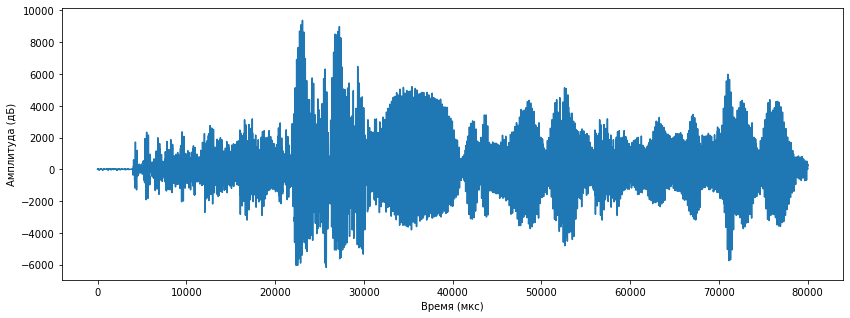

In [75]:
sr, y = wavfile.read('zz0.wav')
#y1 = np.array(y[int(index1[0]*8000):int((index1[2]+3)*8000)])
y1 = np.array(y[int(index1[0]*8000)+8000*3:])
y2 = np.array(y[int(index1[0]*8000)+8000*3:])
#y1 = np.array(y[int(index1[0]*8000):])
#y2 = np.array(y[int(index1[0]*8000):])
#y1 = np.array(y[int((len(y)/8000-3)*8000):])
for i in range(len(y1)):
    y1[i] = y1[i] + y1[i]*(i/50000)
#y1 = np.array(y1)
sp.io.wavfile.write('phon2.wav', 41050, y2.astype(np.int16))
ipd.Audio('phon2.wav')
input_data = read("phon2.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('phon2.wav')

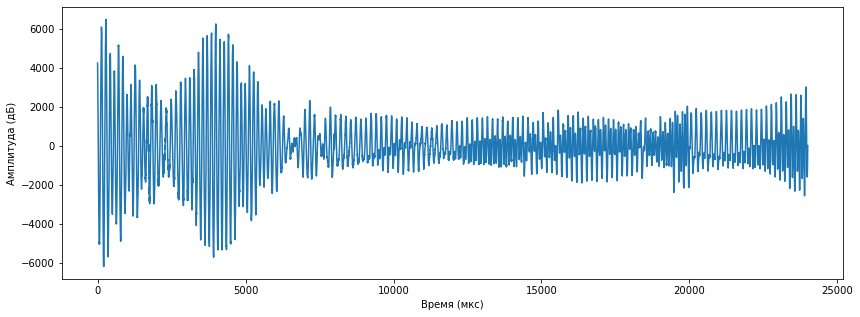

In [84]:
sr, y = wavfile.read('zz0.wav')
#y1 = np.array(y[int(index1[0]*8000):int((index1[2]+3)*8000)])
y1 = np.array(y[int(index1[0]*8000):])
y2 = np.array(y[int(index1[0]*8000):(index1[0]*8000)+8000*3])
#y1 = np.array(y[int((len(y)/8000-3)*8000):])
for i in range(len(y1)):
    y1[i] = y1[i] + y1[i]*(i/50000)
#y1 = np.array(y1)
sp.io.wavfile.write('phon02.wav', 41050, y2.astype(np.int16))
input_data = read("phon02.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('phon02.wav')

<ipython-input-68-b5d2b687cba1>:3: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return sound_array[ indices ]


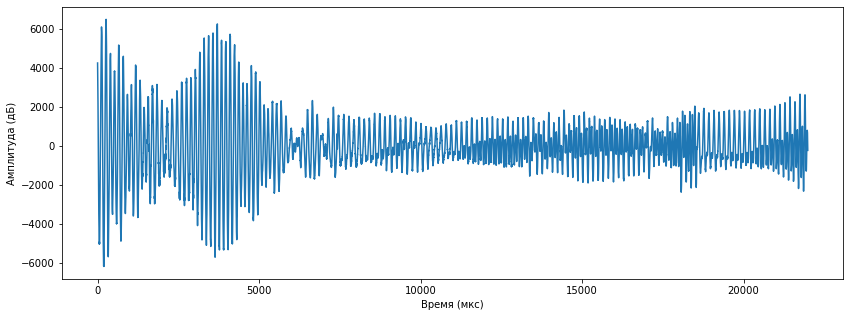

In [96]:
sr, y = wavfile.read('phon02.wav')
indices0 = []
indices00 = []
indices000 = []
for i in range(80):
    indices0 = np.array((np.round(np.arange(0, i*300, 0.2+i/90) )).astype(int))
    #indices0 = np.array((np.round(np.arange(0, i*300, 0.6+i/90) )).astype(int))
    indices00 = indices0[indices0 < i*300].astype(int)
indices000.append(indices00.astype(int))
#yp = y[60000:]
pop = speedx(y,indices000)
#pop1 = pop
#for i in range(len(pop)):
#    #pop1[i] = pop1[i] + pop1[i]*(i/3500)
#    pop1[i] = pop1[i] - pop1[i]*(i/10000)
sp.io.wavfile.write('phon022.wav', 41050, pop)
input_data = read("phon022.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('phon022.wav')

<ipython-input-68-b5d2b687cba1>:3: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return sound_array[ indices ]


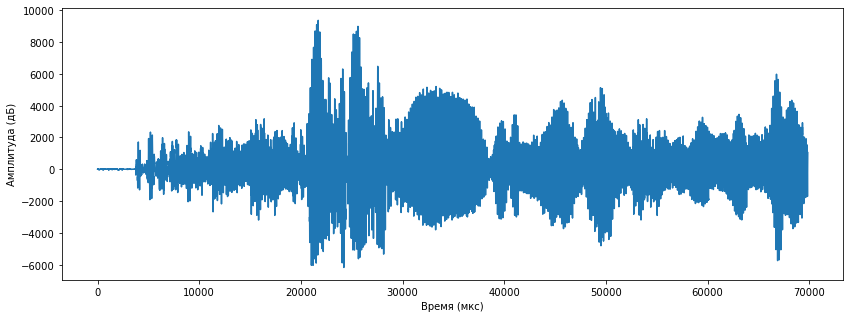

In [97]:
sr, y = wavfile.read('phon2.wav')
indices0 = []
indices00 = []
indices000 = []
for i in range(14):
    #indices0 = np.array((np.round(np.arange(0, i*1230, 0.8+i/25) )).astype(int))
    #indices0 = np.array((np.round(np.arange(0, i*2857, 1-i/50) )).astype(int))
    #indices00 = indices0[indices0 < i*2857].astype(int)
    indices0 = np.array((np.round(np.arange(0, i*5714, 1.28-i/60) )).astype(int))
    #indices0 = np.array((np.round(np.arange(0, i*5714, 1.0-i/60) )).astype(int))
    indices00 = indices0[indices0 < i*5714].astype(int)
indices000.append(indices00.astype(int))
#yp = y[60000:]
pop = speedx(y,indices000)
#pop1 = pop
#for i in range(len(pop)):
#    pop1[i] = pop1[i] + pop1[i]*(i/100000)
sp.io.wavfile.write('phon22.wav', 41050, pop)
input_data = read("phon22.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('phon22.wav')

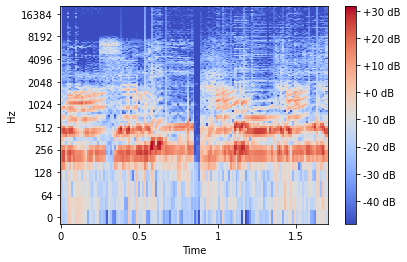

In [100]:
sr, y = wavfile.read('zz0.wav')
sr1, y1 = wavfile.read('phon022.wav')
sr2, y2 = wavfile.read('phon22.wav')
speech_data3 = np.append(np.array(y[:int(index1[0]*8000)]), np.array(y1))
speech_data4 = np.append(speech_data3,np.array(y2))
sp.io.wavfile.write('IK-2.wav', 41050, speech_data4.astype(np.int16))
arr, sr = librosa.load('IK-2.wav', sr=41050)
X = librosa.stft(arr, n_fft=1024, hop_length=1024)
Xdb = librosa.amplitude_to_db(abs(X))
fig, ax = plt.subplots()
img = librosa.display.specshow(Xdb, x_axis='time', y_axis='log', sr=sr, ax=ax)
plt.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()
ipd.Audio('IK-2.wav')

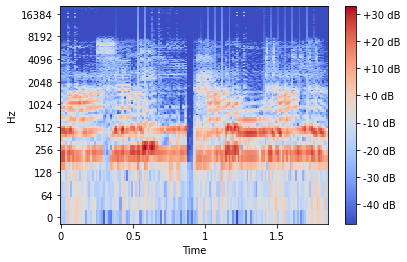

In [99]:
arr, sr = librosa.load('zz0.wav', sr=41050)
X = librosa.stft(arr, n_fft=1024, hop_length=1024)
Xdb = librosa.amplitude_to_db(abs(X))
fig, ax = plt.subplots()
img = librosa.display.specshow(Xdb, x_axis='time', y_axis='log', sr=sr, ax=ax)
plt.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()
ipd.Audio('zz0.wav')

# ИК-3 /////////////////////////////////////////////////////////////////////////////////////////

In [104]:
#Это Москва?

In [105]:
def speedx(sound_array, indices):
    #return sound_array[ indices.astype(int) ]
    return sound_array[ indices ]

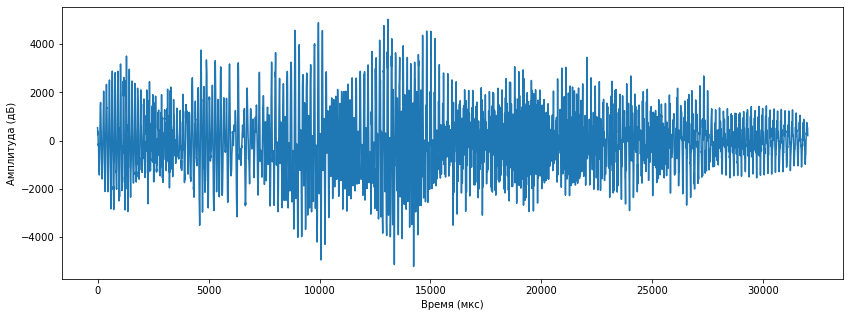

In [106]:
sr, y = wavfile.read('zz0.wav')
#y1 = [None for i in range(int((len(y)/8000-2)*8000))]
#y1 = np.array(y[int((len(y)/8000-4)*8000):])
y1 = np.array(y[int((len(y)/8000-4)*8000):])
y2 = np.array(y[int((len(y)/8000-4)*8000):])
for i in range(len(y1)):
    y1[i] = y1[i] + y1[i]*(i/18000)
#y1 = np.array(y1)
sp.io.wavfile.write('zz00.wav', 41050, y2.astype(np.int16))
ipd.Audio('zz00.wav')
input_data = read("zz00.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('zz00.wav')

<ipython-input-105-b5d2b687cba1>:3: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return sound_array[ indices ]


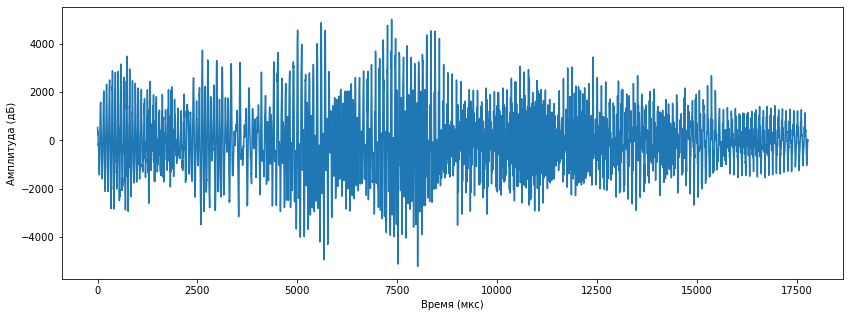

In [107]:
sr, y = wavfile.read('zz00.wav')
indices0 = []
indices00 = []
indices000 = []
for i in range(80):
    indices0 = np.array((np.round(np.arange(0, i*400, 0.9+i/90) )).astype(int))
    #indices0 = np.array((np.round(np.arange(0, i*2000, 0.6+i/25) )).astype(int))
    indices00 = indices0[indices0 < i*400].astype(int)
indices000.append(indices00.astype(int))
#yp = y[60000:]
pop = speedx(y,indices000)
#pop1 = pop
#for i in range(len(pop)):
#    #pop1[i] = pop1[i] + pop1[i]*(i/3500)
#    pop1[i] = pop1[i] - pop1[i]*(i/10000)
sp.io.wavfile.write('zz11.wav', 41050, pop)
input_data = read("zz11.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('zz11.wav')

<ipython-input-105-b5d2b687cba1>:3: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return sound_array[ indices ]


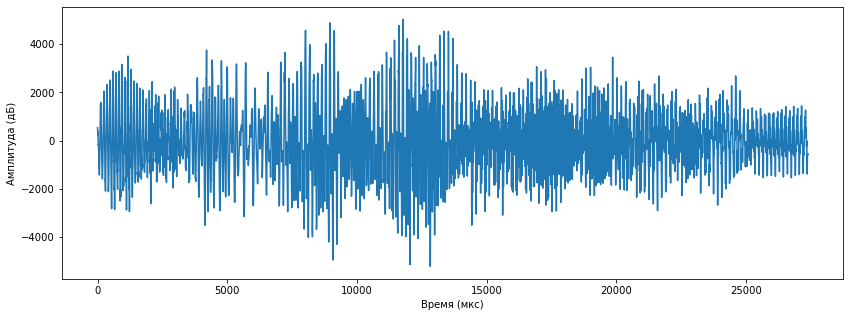

In [121]:
sr, y = wavfile.read('zz00.wav')
indices0 = []
indices00 = []
indices000 = []
for i in range(20):
    indices0 = np.array((np.round(np.arange(0, i*1600, 0.35+i/25) )).astype(int))
    #indices0 = np.array((np.round(np.arange(0, i*2000, 0.6+i/25) )).astype(int))
    indices00 = indices0[indices0 < i*1600].astype(int)
indices000.append(indices00.astype(int))
#yp = y[60000:]
pop = speedx(y,indices000)
#pop1 = pop
#for i in range(len(pop)):
#    #pop1[i] = pop1[i] + pop1[i]*(i/3500)
#    pop1[i] = pop1[i] - pop1[i]*(i/10000)
sp.io.wavfile.write('zz1.wav', 41050, pop)
input_data = read("zz1.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('zz1.wav')

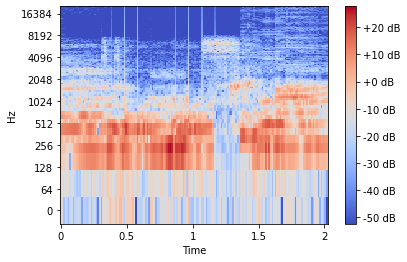

In [124]:
sr, y = wavfile.read('zz0.wav')
sr1, y1 = wavfile.read('zz1.wav')
speech_data3 = np.append(np.array(y[:len(y)-int(4*8000)]), np.array(y1))
#speech_data4 = np.append(speech_data3,y[int(index1[2]*8000):])
sp.io.wavfile.write('IK-3.wav', 41050, speech_data3.astype(np.int16))
arr, sr = librosa.load('IK-3.wav', sr=41050)
X = librosa.stft(arr, n_fft=512, hop_length=512)
Xdb = librosa.amplitude_to_db(abs(X))
fig, ax = plt.subplots()
img = librosa.display.specshow(Xdb, x_axis='time', y_axis='log', sr=sr, ax=ax)
plt.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()
ipd.Audio('IK-3.wav')

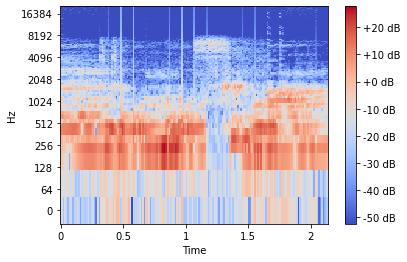

In [123]:
arr, sr = librosa.load('zz0.wav', sr=41050)
X = librosa.stft(arr, n_fft=512, hop_length=512)
Xdb = librosa.amplitude_to_db(abs(X))
fig, ax = plt.subplots()
img = librosa.display.specshow(Xdb, x_axis='time', y_axis='log', sr=sr, ax=ax)
#img = librosa.display.specshow(Xdb, y_axis='Частота (Гц)', x_axis='Время (мкс)')
plt.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()
ipd.Audio('zz0.wav')

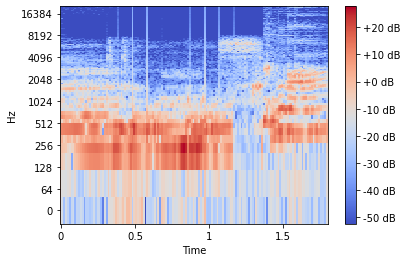

In [118]:
sr, y = wavfile.read('zz0.wav')
sr1, y1 = wavfile.read('zz11.wav')
speech_data3 = np.append(np.array(y[:len(y)-int(4*8000)]), np.array(y1))
#speech_data4 = np.append(speech_data3,y[int(index1[2]*8000):])
sp.io.wavfile.write('zzzz1.wav', 41050, speech_data3.astype(np.int16))
arr, sr = librosa.load('zzzz1.wav', sr=41050)
X = librosa.stft(arr, n_fft=512, hop_length=512)
Xdb = librosa.amplitude_to_db(abs(X))
fig, ax = plt.subplots()
img = librosa.display.specshow(Xdb, x_axis='time', y_axis='log', sr=sr, ax=ax)
plt.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()
ipd.Audio('zzzz1.wav')

# ###################################################

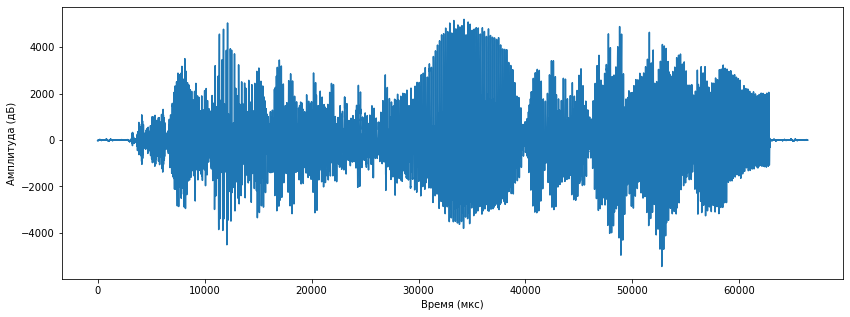

In [962]:
input_data = read("corova1.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('corova1.wav')

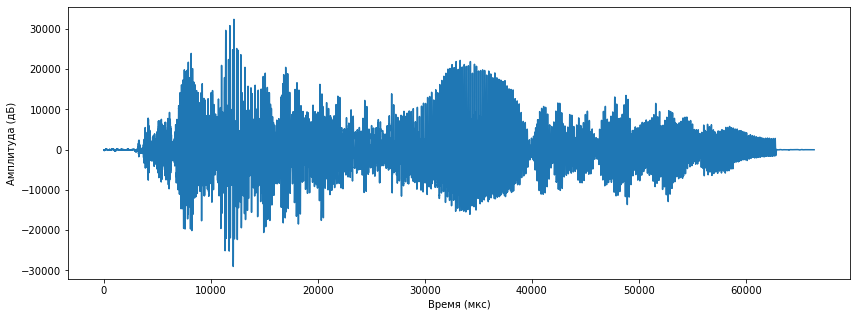

In [963]:
sr, y = wavfile.read('corova1.wav')
pop1 = y
j = 0
for i in range((len(y)-1),0,-1):
    j = j+1
    pop1[i] = y[i] + y[i]*(j/10000)
sp.io.wavfile.write('corova11.wav', 41100, pop1)
input_data = read("corova11.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('corova11.wav')

In [984]:
len(y)/100

663.89

<ipython-input-607-b5d2b687cba1>:3: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return sound_array[ indices ]


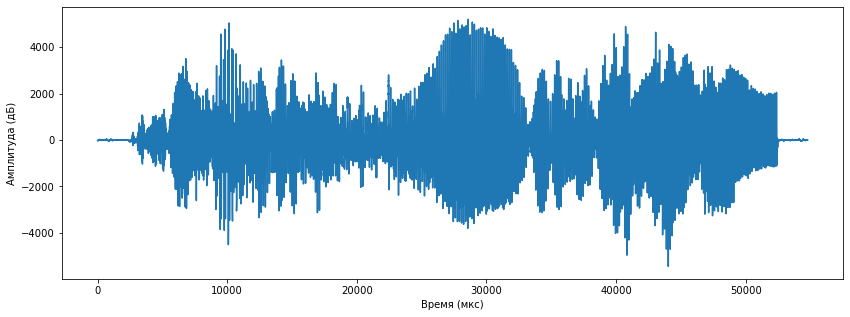

In [988]:
sr, y = wavfile.read('corova1.wav')
indices0 = []
indices00 = []
indices000 = []
for i in range(100):
    indices0 = np.array((np.round(np.arange(0, i*663, 1 + i/500) )).astype(int))
    indices00 = indices0[indices0 < i*663].astype(int)
indices000.append(indices00.astype(int))
#yp = y[60000:]
pop = speedx(y,indices000)
sp.io.wavfile.write('corova111.wav', 41100, pop)
input_data = read("corova111.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('corova111.wav')

<ipython-input-607-b5d2b687cba1>:3: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return sound_array[ indices ]


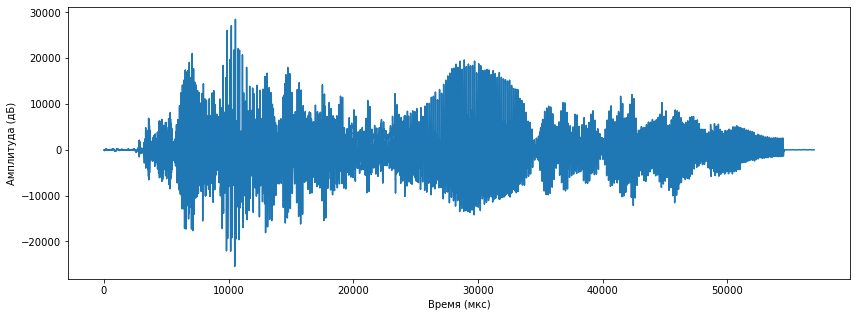

In [995]:
sr, y = wavfile.read('corova1.wav')
indices0 = []
indices00 = []
indices000 = []
for i in range(100):
    indices0 = np.array((np.round(np.arange(0, i*663, 1 + i/650) )).astype(int))
    indices00 = indices0[indices0 < i*663].astype(int)
indices000.append(indices00.astype(int))
#yp = y[60000:]
pop = speedx(y,indices000)
pop1 = pop
j = 0
for i in range((len(pop)-1),0,-1):
    j = j+1
    pop1[i] = pop[i] + pop[i]*(j/10000)
sp.io.wavfile.write('corova1111.wav', 41100, pop1)
input_data = read("corova1111.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('corova1111.wav')

In [85]:
#for i in range(100):
#    print(1 + i/500)

In [86]:
#indices00

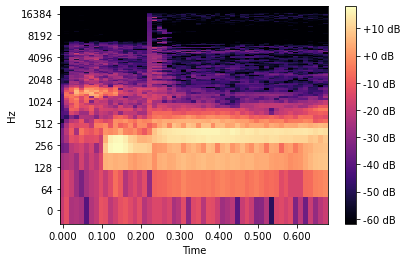

In [87]:
arr, sr = librosa.load('corova1.wav', sr=41050)
X = librosa.stft(arr, n_fft=512, hop_length=512)
Xdb = librosa.amplitude_to_db(abs(X))
fig, ax = plt.subplots()
img = librosa.display.specshow(Xdb, x_axis='time', y_axis='log', sr=sr, ax=ax)
plt.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

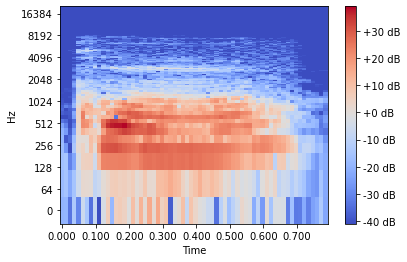

In [88]:
arr, sr = librosa.load('corova11.wav', sr=41050)
X = librosa.stft(arr, n_fft=512, hop_length=512)
Xdb = librosa.amplitude_to_db(abs(X))
fig, ax = plt.subplots()
img = librosa.display.specshow(Xdb, x_axis='time', y_axis='log', sr=sr, ax=ax)
plt.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

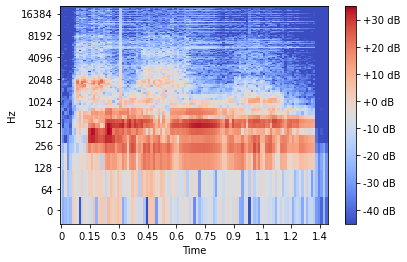

In [996]:
arr, sr = librosa.load('corova1111.wav', sr=41050)
X = librosa.stft(arr, n_fft=512, hop_length=512)
Xdb = librosa.amplitude_to_db(abs(X))
fig, ax = plt.subplots()
img = librosa.display.specshow(Xdb, x_axis='time', y_axis='log', sr=sr, ax=ax)
plt.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

<ipython-input-31-f64e54511e90>:25: ComplexWarning: Casting complex values to real discards the imaginary part
  sp.io.wavfile.write('phonemesstress_corova1.wav', 41050, results_lst.astype(speech_data.dtype))


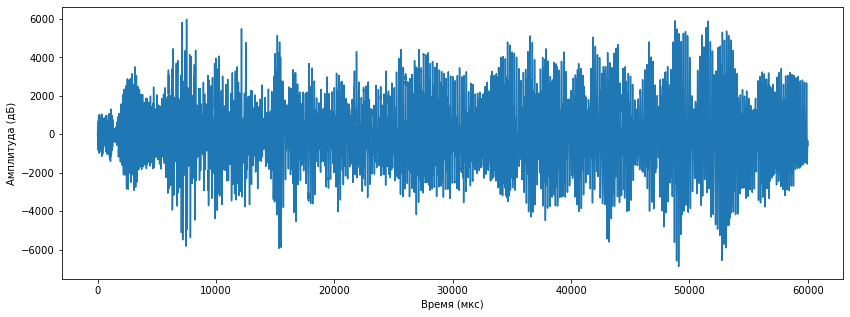

In [31]:
sr, y = wavfile.read('corova1.wav')
#window_size = 1500
#h = 2000
window_size = 5000
h = 5000
results = []
result = []
phase  = np.zeros(window_size)
hanning_window = np.hanning(window_size)
for i in np.arange(0, len(y)-(window_size+h), h):
    a1 = y[i: i + window_size]
    a2 = y[i + h: i + window_size + h]
    s1 =  np.fft.ifft(np.fft.fft(a1))
    s2 =  np.fft.ifft(np.fft.fft(a2))
    result = s1 + s2
    results.append(result)
x = len(results[0])
y = len(results)

results_lst = []
for i in range(y):
    for j in results[i]:
        results_lst.append(j)
results_lst = np.array(results_lst)
sp.io.wavfile.write('phonemesstress_corova1.wav', 41050, results_lst.astype(speech_data.dtype))
input_data = read("phonemesstress_corova1.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('phonemesstress_corova1.wav')

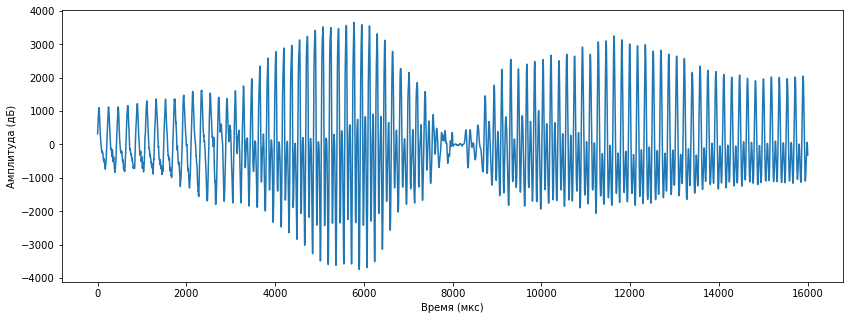

In [104]:
input_data = read("vu.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
ipd.Audio('vu.wav')

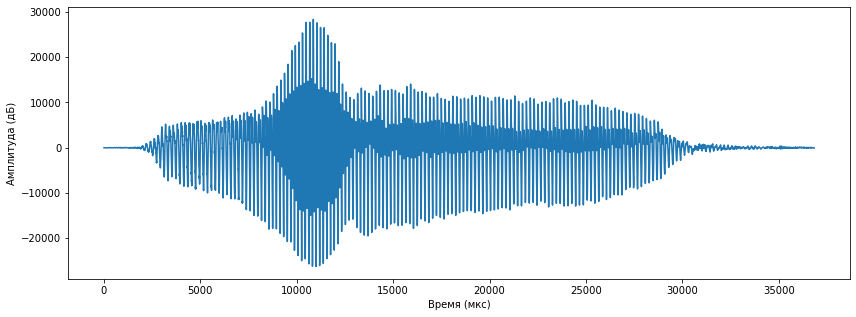

In [105]:
input_data = read("vu2.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
ipd.Audio('vu2.wav')

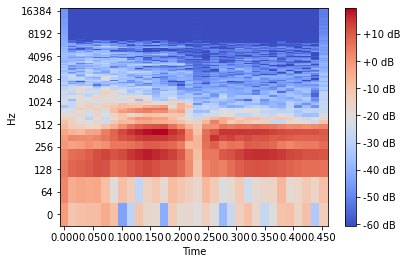

In [106]:
arr, sr = librosa.load('vu.wav', sr=35050)
X = librosa.stft(arr, n_fft=512, hop_length=512)
Xdb = librosa.amplitude_to_db(abs(X))
fig, ax = plt.subplots()
img = librosa.display.specshow(Xdb, x_axis='time', y_axis='log', sr=sr, ax=ax)
plt.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

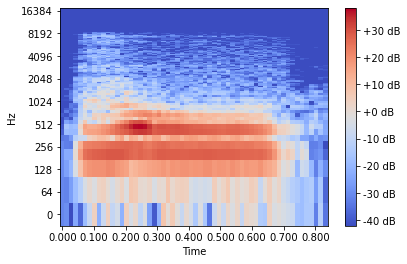

In [107]:
arr, sr = librosa.load('vu2.wav', sr=35050)
X = librosa.stft(arr, n_fft=512, hop_length=512)
Xdb = librosa.amplitude_to_db(abs(X))
fig, ax = plt.subplots()
img = librosa.display.specshow(Xdb, x_axis='time', y_axis='log', sr=sr, ax=ax)
plt.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

# НЕЙРОНКА ДЛЯ КЛАССИФИКАЦИИ ИК

In [271]:
38*4

152

In [46]:
string_sp4=['Кто это ?',
            'Кто я ?',
            'Кто они нам ?',
            'Что он сказал ?',
            'Почему ты молчишь ?',
            'Почему ты кричишь ?',
            'Почему мы это делаем ?',
            'Где ты живешь ?',
            'Куда ты поедешь в этом году ?',
            'Куда мы поедем в этом году ?',
            'Куда ты смотришь ?',
            'Куда его ведут ?',
            'Когда это произошло ?',
            'Какой день был самым счастливым для тебя ?',
            'Какой уровень образования ?',
            'В каком доме ты живёшь ?',
            'В каком году ты родился ?',
            'В какой школе ты учился ?',
            'Какую последнюю книгу ты прочитал ?',
            'Какую музыку ты слушаешь ?',
            'Какую татуировку ты сделал ?',
            'Сколько друзей у тебя ?',
            'Сколько растений у тебя ?',
            'Сколько книг ты написал ?',
            'Сколько ты заработала ?',
            'С кем ты ходил вчера в кино ?',
            'С кем ты обычно общаешься ?',
            'О ком ты думаешь ?',
            'О ком ты мечтаешь ?',
            'К кому мы пойдём завтра ?',
            'К кому он направился ?',
            'Без чего ты не можешь жить ?',
            'К чему ты это говоришь ?',
            'К чему эти ссоры ?',
            'К чему эти цветы ?',
            'С чем это связано ?',
            'С чем этот тот ?',
            'О чём ты хочешь рассказать ?',
            
            'Это машина ?',
            'Это корова ?',
            'Это Москва ?',
            'Ты русская ?',
            'Ты здесь ?',
            'Женя был в Москве ?',
            'Они были в Москве ?',
            'Ты одна ?',
            'Он один ?',
            'Мы Вместе ?',
            'Это хороший пример ?',
            'Вот это разве его дом ?',
            'У Иры есть телефон ?',
            'У Маргариты нет телефона ?',
            'Ты вчера был в магазине ?',
            'Вы всегда вежливы ?',
            'Они были в школе ?',
            'Они пришли в университет ?',
            'Ты идешь сегодня в школу ?',
            'Вы не спите ?',
            'Ты любишь заниматься йогой ?',
            'Вы играете в теннис ?',
            'Она рядом с тобой ?',
            'Сегодня есть уроки ?',
            'Завтра свободный день ?',
            'Мы выступаем сегодня ?',
            'Кровать новая ?',
            'Лестница есть ?',
            'Тебе нужен новый компьютер ?',
            'Нам необходимо поговорить ?',
            'Они хотели быть там ?',
            'Все поддержали тебя ?',
            'Хорошо было там ?',
            'Можешь говорить громче ?',
            'Мы всегда так ругались ?',
            'Хочешь меня утешить ?',
            'Думаешь это поможет ?',
            'Может перестанешь ?',
            
            "Сколько фруктов !", 
            "Столько подарков !", 
            "Сколько она страдала !", 
            "Как он поёт !", 
            "Как она готовит !", 
            "Какой у неё характер !",
            "Какой у него телефон !",
            "Она так соскучилась !",
            "Я так волновалась !",
            "Они так спешили !",
            "Мы так боялись !",
            "Ох уж этот дождь !",
            "Ох уж эта романтика !",
            "Ох уж эти мальчики !",
            "Как он мне надоел !",
            "Как они бесят !",
            "Вы такой надежный !",
            "Это очень интересный город !",
            "Я очень рада !",
            "Это очень красивый город !",
            "Это было так весело !",
            "Какая у него специальность !",
            "Какая у него работа !",
            "Какой сегодня день !",
            "Какой завтра важный день !",
            'Как хорошо !',
            'Как плохо !',
            'Как много !',
            'Как мало !',
            'Как я устала !',
            'Какой сегодня день !',
            'Как он плавает !',
            'Сколько он работает !',
            'Сколько он заработал !',
            'Как я устал !',
            "Какой уж там настрой !",
            "Какая уж там учеба !",
            "Какая уж там интерес !",
            
            "Да куда ему с этим справиться .",
            "Да какой это праздник .",
            "Да какой это холодильник .",
            "Какая она красавица .",
            "Как у вас весело .",
            "Как у вас всё здорово .",
            "Не хорошо ты поступил .",
            "Не по совести это .",
            "Какие они друзья .",
            "Какие там друзья .",
            "Какие там родители .",
            "Какие им здоровые отношения .",
            "Какие там рабочие отношения .",
            "Да зачем я вам нужна .",
            "Да ладно вам уже .",
            "Да куда мне до вас .",
            "Куда ему в университет .",
            "Куда там ему .",
            "Куда ему в столицу .",
            "О чём мне с вами разговаривать .",
            "О чём с тобой разговаривать .",
            "О чём с ним можно говорить .",
            "О чём с ним молчать .",
            "Ну что ты наделал .",
            "Ну что он делает .",
            "Ну зачем ты это сказал .",
            "Да где ему пенсия .",
            "Да куда ему .",
            "Что за отпуск это .",
            "Что за работа это .",
            "Какая у тебя фигура .",
            "Какой у него талант .",
            "Какой это праздник .",
            "Да куда там кино .",
            "Где там пообедал .",
            "Какой он отец .",
            "Какой из него руководитель .",
            "Да кому он нужен .",
            
          ]

In [47]:
string_sp44=['Кто это ?',
            'Кто я ?',
            'Кто они нам ?',
            'Что он сказал ?',
            'Почему ты молчишь ?',
            'Почему ты кричишь ?',
            'Почему мы это делаем ?',
            'Где ты живешь ?',
            'Куда ты поедешь в этом году ?',
            'Куда мы поедем в этом году ?',
            'Куда ты смотришь ?',
            'Куда его ведут ?',
            'Когда это произошло ?',
            'Какой день был самым счастливым для тебя ?',
            'Какой уровень образования ?',
            'В каком доме ты живёшь ?',
            'В каком году ты родился ?',
            'В какой школе ты учился ?',
            'Какую последнюю книгу ты прочитал ?',
            'Какую музыку ты слушаешь ?',
            'Какую татуировку ты сделал ?',
            'Сколько друзей у тебя ?',
            'Сколько растений у тебя ?',
            'Сколько книг ты написал ?',
            'Сколько ты заработала ?',
            'С кем ты ходил вчера в кино ?',
            'С кем ты обычно общаешься ?',
            'О ком ты думаешь ?',
            'О ком ты мечтаешь ?',
            'К кому мы пойдём завтра ?',
            'К кому он направился ?',
            'Без чего ты не можешь жить ?',
            'К чему ты это говоришь ?',
            'К чему эти ссоры ?',
            'К чему эти цветы ?',
            'С чем это связано ?',
            'С чем этот тот ?',
            'О чём ты хочешь рассказать ?',
            
            "Сколько фруктов !", 
            "Столько подарков !", 
            "Сколько она страдала !", 
            "Как он поёт !", 
            "Как она готовит !", 
            "Какой у неё характер !",
            "Какой у него телефон !",
            "Она так соскучилась !",
            "Я так волновалась !",
            "Они так спешили !",
            "Мы так боялись !",
            "Ох уж этот дождь !",
            "Ох уж эта романтика !",
            "Ох уж эти мальчики !",
            "Как он мне надоел !",
            "Как они бесят !",
            "Вы такой надежный !",
            "Это очень интересный город !",
            "Я очень рада !",
            "Это очень красивый город !",
            "Это было так весело !",
            "Какая у него специальность !",
            "Какая у него работа !",
            "Какой сегодня день !",
            "Какой завтра важный день !",
            'Как хорошо !',
            'Как плохо !',
            'Как много !',
            'Как мало !',
            'Как я устала !',
            'Какой сегодня день !',
            'Как он плавает !',
            'Сколько он работает !',
            'Сколько он заработал !',
            'Как я устал !',
            "Какой уж там настрой !",
            "Какая уж там учеба !",
            "Какая уж там интерес !",
          ]

In [48]:
string_sp3=['Кто это ?',
            'Что он сказал ?',
            'Почему ты молчишь ?',
            'Где ты живешь ?',
            'Куда ты поедешь в этом году ?',
            'Когда это произошло ?',
            'Какой день был самым счастливым для тебя ?',
            'В каком доме ты живёшь ?',
            'В какой школе ты учился ?',
            'Какую последнюю книгу ты прочитал ?',
           'Сколько друзей у тебя ?',
            'С кем ты ходил вчера в кино ?',
            'О ком ты думаешь ?',
            'К кому мы пойдём завтра ?',
            'Без чего ты не можешь жить ?',
            'К чему ты это говоришь ?',
            'С чем это связано ?',
            'О чём ты хочешь рассказать ?',
            
            'Это машина ?',
            'Это Москва ?',
            'Ты русская ?',
            'Женя был в Москве ?',
            'Ты одна ?',
            'Это хороший пример ?',
            'Это разве его дом ?',
            'У Иры есть телефон ?',
            'Ты вчера был в магазине ?',
            'Вы всегда вежливы ?',
            'Они были в школе ?',
            'Ты идешь сегодня в школу ?',
            'Ты не спишь ?',
            'Ты любишь заниматься йогой ?',
            'Вы играете в теннис ?',
            'Она рядом с тобой ?',
            'Сегодня есть уроки ?',
            'Мы выступаем сегодня ?',
            
            "Сколько фруктов !", 
            "Как он поёт !", 
            "Какой у неё характер !",
            "Она так соскучилась !",
            "Ох уж этот дождь !",
            "Как он мне надоел !",
            "Это очень интересный город !",
            "Какая у него специальность !",
            "Какой сегодня день !",
            'Как хорошо !',
            'Как плохо !',
            'Как много !',
            'Как мало !',
            'Какой сегодня день !',
            'Как он плавает !',
            'Сколько он работает !',
            'Как я устал !',
            "Какой уж там настрой !",
            
            "Да куда ему с этим справиться .",
            "Да какой это праздник .",
            "Какая она красавица .",
            "Как у вас весело .",
            "Не хорошо ты поступил .",
            "Какие они друзья .",
            "Да зачем я вам нужна .",
            "Куда ему в университет .",
            "О чём мне с вами разговаривать .",
            "Ну что ты наделал .",
            "Да где ему пенсия .",
            "Что за отпуск это .",
            "Какая у тебя фигура .",
            "Какой это праздник .",
            "Да куда там кино .",
            "Где там пообедал .",
            "Какой он отец .",
            "Да кому он нужен .",
            
          ]

In [49]:
string_sp2=['Кто это',
            'Что он сказал',
            'Почему ты молчишь',
            'Где ты живешь',
            'Куда ты поедешь в этом году',
            'Когда это произошло',
            'Какой день был самым счастливым для тебя',
            'В каком доме ты живёшь',
            'В какой школе ты учился',
            'Какую последнюю книгу ты прочитал',
           'Сколько друзей у тебя',
            'С кем ты ходил вчера в кино',
            'О ком ты думаешь',
            'К кому мы пойдём завтра',
            'Без чего ты не можешь жить',
            'К чему ты это говоришь',
            'С чем это связано',
            'О чём ты хочешь рассказать',
            
            'Это машина',
            'Это Москва',
            'Ты русская',
            'Женя был в Москве',
            'Ты одна',
            'Это хороший пример',
            'Это разве его дом',
            'У Иры есть телефон',
            'Ты вчера был в магазине',
            'Вы всегда вежливы',
            'Они были в школе',
            'Ты идешь сегодня в школу',
            'Ты не спишь',
            'Ты любишь заниматься йогой',
            'Вы играете в теннис',
            'Она рядом с тобой',
            'Сегодня есть уроки',
            'Мы выступаем сегодня'
          ]

In [50]:
18*2

36

# Удаление стоп слов и приведение к нормальной форме слова

In [809]:
import nltk
nltk.download("stopwords")
from nltk.corpus import stopwords
from string import punctuation
russian_stopwords = stopwords.words("russian")

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Alexandra\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


In [1071]:
stopwords = []
stopwords = ['и', 'в', 'во', 'не', 'он', 'на' ,'я', 'с', 'со', 'а', 'то', 'все', 'она', 'так', 'его', 'но', 'ты', 'к', 'у', 'же', 'вы', 'за', 'бы', 'по', 'только', 'ее', 'мне', 'было', 'вот', 'от', 'меня', 'еще', 'нет', 'о', 'из', 'ему', 'теперь', 'даже', 'ну', 'вдруг', 'ли', 'если', 'уже', 'или', 'ни', 'быть', 'был', 'него', 'до', 'вас', 'нибудь', 'опять', 'вам', 'ведь', 'там', 'потом', 'себя', 'ничего', 'ей', 'может', 'они', 'тут', 'есть', 'надо', 'ней', 'для', 'мы', 'тебя', 'их', 'была', 'сам', 'чтоб', 'без', 'будто', 'раз', 'тоже', 'себе', 'под', 'будет', 'ж', 'тогда', 'этот', 'того', 'потому', 'этого', 'совсем', 'ним', 'здесь', 'этом', 'один', 'почти', 'мой', 'тем', 'нее', 'сейчас', 'были', 'всех', 'никогда', 'можно', 'при', 'наконец', 'два', 'об', 'другой', 'хоть', 'после', 'над', 'больше', 'тот', 'через', 'эти', 'нас', 'про', 'всего', 'них', 'много', 'разве', 'три', 'эту', 'моя', 'впрочем', 'хорошо', 'свою', 'этой', 'перед', 'иногда', 'лучше', 'чуть', 'том', 'нельзя', 'такой', 'им', 'более', 'всегда', 'конечно', 'всю', 'между'] 

In [932]:
import pymorphy2
morph = pymorphy2.MorphAnalyzer()
#word = "стали"
#p = morph.parse(word)[0]  # Делаем полный разбор, и берем первый вариант разбора (условно "самый вероятный", но не факт что правильный)
#print(p.normal_form) 

In [943]:
import re
string_letter = []
for i in range(len(string_sp4)):
    #lst_string_letter_1 = []
    lower_string = string_sp4[i].lower()
    no_number_string = re.sub(r'\d+','',lower_string)
    #no_punc_string = re.sub(r'[^\w\s]','', no_number_string)
    no_wspace_string = no_number_string.strip()
    lst_string = [no_wspace_string][0].split()
    lst_string_letter = [no_wspace_string][0].split()
    lst_string_letter_1 = []
    string_letter.append(lst_string_letter)

In [934]:
sentens_norm = []
tok = []
p = []
for i in range(len(string_letter)):
    for j in range(len(string_letter[i])):
        p = (morph.parse(string_letter[i][j])[0])
        tok.append(p.normal_form)
    sentens_norm.append(tok)
    tok = []

In [1072]:
def remove_stopwords(text):
    return [word for word in text if word not in stopwords]

In [1073]:
new_list = []
str_letter = []
for i in range(len(sentens_norm)):
    new_list.append(remove_stopwords(sentens_norm[i]))
#str_letter.append(new_list)
#new_list = []

# Способ 1

In [1075]:
#import re
#string_letter = []
#for i in range(len(string_sp4)):
#    #lst_string_letter_1 = []
#    lower_string = string_sp4[i].lower()
#    no_number_string = re.sub(r'\d+','',lower_string)
#    #no_punc_string = re.sub(r'[^\w\s]','', no_number_string)
#    no_wspace_string = no_number_string.strip()
#    lst_string = [no_wspace_string][0].split()
#    lst_string_letter = [no_wspace_string][0].split()
#    lst_string_letter_1 = []
#    string_letter.append(lst_string_letter)

In [1076]:
string_letter = new_list

In [1077]:
sentens = []
for i in range(len(string_letter)):
    for j in range(len(string_letter[i])):
        sentens.append(string_letter[i][j])

In [1078]:
unique_words = set(sentens)
word_id = {word:i for (i,word) in enumerate(unique_words)}
id_word = {i:word for (i,word) in enumerate(unique_words)}

In [1079]:
sentens_token = []
tok = []
for i in range(len(string_letter)):
    for j in range(len(string_letter[i])):
        tok.append(word_id[string_letter[i][j]])
    sentens_token.append(tok)
    tok = []

In [1080]:
len(sentens_token)

152

In [1081]:
sentens_token_set = []

In [1082]:
#sentens_token_set = sentens_token
#toki = sentens_token[5][0] - sentens_token[5][0]
#for j in range(len(sentens_token)):
#    while len(sentens_token[j]) != len(sentens_token[13]):
#        sentens_token_set[j].append(toki)
        #print("1")

In [1083]:
sentens_token_set = sentens_token
toki = sentens_token[5][0] - sentens_token[5][0]
for j in range(len(sentens_token)):
    while len(sentens_token[j]) != 5:
        sentens_token_set[j].insert(0, toki)
        #print("1")

In [1084]:
sentens_token_set[0]

[0, 0, 104, 119, 136]

# Способ 2

In [1329]:
string_letter = new_list

In [1330]:
sentens = []
for i in range(len(string_letter)):
    for j in range(len(string_letter[i])):
        sentens.append(string_letter[i][j])

In [1331]:
unique_words = set(sentens)
word_id = {word:i for (i,word) in enumerate(unique_words)}
id_word = {i:word for (i,word) in enumerate(unique_words)}

In [1090]:
vect = []
tok = []
results = np.zeros(len(unique_words))
for i in range(len(string_letter)):
    for j in range(len(string_letter[i])):
        results[word_id[string_letter[i][j]]]=1
    vect.append(results)
    results = np.zeros(len(unique_words))

In [1091]:
results = np.zeros(len(unique_words))
len(results)

162

In [1328]:
#vect[0]

In [1093]:
word_id[string_letter[0][0]]

104

# Способ 3

In [1820]:
string_letter = new_list

In [1821]:
sentens = []
for i in range(len(string_letter)):
    for j in range(len(string_letter[i])):
        sentens.append(string_letter[i][j])

In [1822]:
unique_words = set(sentens)
word_id = {word:i for (i,word) in enumerate(unique_words)}
id_word = {i:word for (i,word) in enumerate(unique_words)}

In [1823]:
vect = []
tok = []
results = np.zeros(len(unique_words))
for i in range(len(string_letter)):
    for j in range(len(string_letter[i])):
        results[word_id[string_letter[i][j]]]=1
        tok.append(results)
        results = np.zeros(len(unique_words))
    vect.append(tok)
    tok = []

In [1824]:
len(vect)

152

In [1825]:
vect2 = vect
toki = vect2[5][0] - vect2[5][0]
for j in range(len(vect)):
    while len(vect[j]) != len(vect[13]):
        vect2[j].insert(0, toki)
        #print("1")

# Разряженные матрицы

In [1424]:
vect = []
tok = []
results = np.zeros(len(unique_words))
for i in range(len(string_letter)):
    for j in range(len(string_letter[i])):
        results[word_id[string_letter[i][j]]]=1
        tok.append(results)
        results = np.zeros(len(unique_words))
    vect.append(tok)
    tok = []

In [1425]:
xx = []
new = []
results = []
for i in range(len(vect)):
    for j in range(len(vect[i])):
        for k in range(len(vect2[i][j])):
            if vect[i][j][k] == 1:
                #new.append([i, j, k, 1])
                new.extend([j, k, 1])
    results.append(new)
    new = []

In [1426]:
len(results)

152

In [1427]:
results[0]

[0, 104, 1, 1, 119, 1, 2, 136, 1]

In [1428]:
vect2[0][2][104]

1.0

In [1429]:
vect3 = results
toki = 0
for j in range(len(vect3)):
    while len(vect3[j]) != len(vect3[13]):
        vect3[j].insert(0, 0)
        #print("1")

In [1430]:
len(vect3)

152

In [1431]:
vect3[0]

[0, 0, 0, 0, 0, 0, 0, 104, 1, 1, 119, 1, 2, 136, 1]

In [121]:
#url = 'https://storage.yandexcloud.net/natasha-navec/packs/navec_hudlit_v1_12B_500K_300d_100q.tar'
#filename = wget.download(url)
#https://github.com/natasha/navec
from navec import Navec

path = 'navec_hudlit_v1_12B_500K_300d_100q.tar'
navec = Navec.load(path)
#vec = []
#for i in range(len(string_letter)):
#    vec.append(navec[string_letter[i]])
#vec2 = vec[5] - vec[5]

In [117]:
vec22 = []
vec221 = []
for i in range(len(string_letter)):
    for j in range(len(string_letter[i])):
        if string_letter[i][j] == '?':
            vekt = np.ones(300)*(20)
        if string_letter[i][j] == "!":
            vekt = np.ones(300)*(10)
        if string_letter[i][j] == ".":
            vekt = np.ones(300)*(5)
        if string_letter[i][j] != "." and string_letter[i][j] != "!" and string_letter[i][j] != '?' and string_letter[i][j] != ".":
            vekt = navec[string_letter[i][j]]
        vec22.append(np.fft.ifft(np.fft.fft(vekt)))
    vec221.append(vec22)
    vec22 = []

In [125]:
#vec22 = []
#vec221 = []
#for i in range(len(string_letter)):
#    for j in range(len(string_letter[i])):
#        if string_letter[i][j] == '?':
#            vekt = np.ones(300)*(20)
#        if string_letter[i][j] == "!":
#            vekt = np.ones(300)*(10)
#        if string_letter[i][j] == ".":
#            vekt = np.ones(300)*(5)
#        if string_letter[i][j] != "." and string_letter[i][j] != "!" and string_letter[i][j] != '?' and string_letter[i][j] != ".":
#            vekt = navec[string_letter[i][j]]
#        vec22.append(vekt)
#    vec221.append(vec22)
#    vec22 = []

In [126]:
#vec22 = []
#vec221 = []
#for i in range(len(string_letter)):
#    for j in range(len(string_letter[i])):
#        vekt = navec[string_letter[i][j]]
#        vec22.append(vekt)
#    vec221.append(vec22)
#    vec22 = []

In [128]:
#for i in range(len(vec221)):
#    print(len(vec221[i]))

In [129]:
vec221_set = vec221
vec2 = vec221[5][0] - vec221[5][0]
for j in range(len(vec221)):
    while len(vec221[j]) != len(vec221[13]):
        vec221_set[j].append(vec2)
        #print("1")

In [130]:
classes = ('IK1', 'IK2', 'IK3')

In [131]:
IK = [ 0,  0, 0, 0,  0,  0,
        1, 1, 1, 1, 1, 1,
       2,  2, 2, 2,  2,  2]

In [132]:
IK2 = [ 0,  0, 0, 0,  0,  0,
       0,  0, 0, 0,  0,  0,
       0,  0, 0, 0,  0,  0,
        1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1]

In [133]:
IK3 = [ [0,  1], [0, 1],  [0,  1],
       [0,  1], [0, 1],  [0,  1],
       [0,  1], [0, 1],  [0,  1],
       [0,  1], [0, 1],  [0,  1],
       [0,  1], [0, 1],  [0,  1],
       [0,  1], [0, 1],  [0,  1],
       [1,  0], [1, 0],  [1,  0],
       [1,  0], [1, 0],  [1,  0],
       [1,  0], [1, 0],  [1,  0],
       [1,  0], [1, 0],  [1,  0],
       [1,  0], [1, 0],  [1,  0],
       [1,  0], [1, 0],  [1,  0],
      ]

In [135]:
IK4 = [[1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0], 
       
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],
       
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],
       
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],
      ]

In [136]:
len(IK4)

152

In [137]:
#наличие вопросит слова, вопрос, восклицание, точка.

In [1647]:
IK5 = [[1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0],  [1,  1, 0, 0],
       [1,  1, 0, 0], [1, 1, 0, 0], 
       
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0], 
       
       [1,  0, 1, 0], [1, 0, 1, 0],  [1,  0, 1, 0],
       [1,  0, 1, 0], [1, 0, 1, 0],  [1,  0, 1, 0],
       [1,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [1,  0, 1, 0],
       [1,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [1,  0, 1, 0], [1, 0, 1, 0],  [1,  0, 1, 0],
       [1,  0, 1, 0], [1, 0, 1, 0],  [1,  0, 1, 0],
       [1,  0, 1, 0], [1, 0, 1, 0],  [1,  0, 1, 0],
       [1,  0, 1, 0], [1, 0, 1, 0],  [1,  0, 1, 0],
       [1,  0, 1, 0], [1, 0, 1, 0],  [1,  0, 1, 0],
       [1,  0, 1, 0], [1, 0, 1, 0],
       
       [1,  0, 0, 1], [1, 0, 0, 1],  [1,  0, 0, 1],
       [1,  0, 0, 1], [1, 0, 0, 1],  [1,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [1,  0, 0, 1],
       [1,  0, 0, 1], [1, 0, 0, 1],  [1,  0, 0, 1],
       [1,  0, 0, 1], [1, 0, 0, 1],  [0,  0, 0, 1],
       [1,  0, 0, 1], [1, 0, 0, 1],  [1,  0, 0, 1],
       [1,  0, 0, 1], [1, 0, 0, 1],  [1,  0, 0, 1],
       [1,  0, 0, 1], [1, 0, 0, 1],  [1,  0, 0, 1],
       [1,  0, 0, 1], [1, 0, 0, 1],  [1,  0, 0, 1],
       [1,  0, 0, 1], [1, 0, 0, 1],  [1,  0, 0, 1],
       [1,  0, 0, 1], [1, 0, 0, 1],  [1,  0, 0, 1],
       [1,  0, 0, 1], [1, 0, 0, 1],  [1,  0, 0, 1],
       [1,  0, 0, 1], [0, 0, 0, 1],
      ]

In [1649]:
IK5 = np.array(IK5)
IK5.astype(float)

array([[1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],


In [753]:
IK55 = [[1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],
       
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],
      ]

In [81]:
IK6 = [[0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0],  [0,  1, 0, 0],
       [0,  1, 0, 0], [0, 1, 0, 0], 
       
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],  [1,  0, 0, 0],
       [1,  0, 0, 0], [1, 0, 0, 0],
       
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],  [0,  0, 1, 0],
       [0,  0, 1, 0], [0, 0, 1, 0],
       
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],  [0,  0, 0, 1],
       [0,  0, 0, 1], [0, 0, 0, 1],
      ]

In [1166]:
IK5 = [[1.0,  1.0, 0.0, 0.0], [1.0,  1.0, 0.0, 0.0],  [1.0,  1.0, 0.0, 0.0],
       [1.0,  1.0, 0.0, 0.0], [1.0,  1.0, 0.0, 0.0],  [1.0,  1.0, 0.0, 0.0],
       [1.0,  1.0, 0.0, 0.0], [1.0,  1.0, 0.0, 0.0],  [1.0,  1.0, 0.0, 0.0],
       [1.0,  1.0, 0.0, 0.0], [1.0,  1.0, 0.0, 0.0],  [1.0,  1.0, 0.0, 0.0],
       [1.0,  1.0, 0.0, 0.0], [1.0,  1.0, 0.0, 0.0],  [1.0,  1.0, 0.0, 0.0],
       [1.0,  1.0, 0.0, 0.0], [1.0,  1.0, 0.0, 0.0],  [1.0,  1.0, 0.0, 0.0],
       [1.0,  1.0, 0.0, 0.0], [1.0,  1.0, 0.0, 0.0],  [1.0,  1.0, 0.0, 0.0],
       [1.0,  1.0, 0.0, 0.0], [1.0,  1.0, 0.0, 0.0],  [1.0,  1.0, 0.0, 0.0],
       [1.0,  1.0, 0.0, 0.0], [1.0,  1.0, 0.0, 0.0],  [1.0,  1.0, 0.0, 0.0],
       [1.0,  1.0, 0.0, 0.0], [1.0,  1.0, 0.0, 0.0],  [1.0,  1.0, 0.0, 0.0],
       [1.0,  1.0, 0.0, 0.0], [1.0,  1.0, 0.0, 0.0],  [1.0,  1.0, 0.0, 0.0],
       [1.0,  1.0, 0.0, 0.0], [1.0,  1.0, 0.0, 0.0],  [1.0,  1.0, 0.0, 0.0],
       [1.0,  1.0, 0.0, 0.0], [1.0,  1.0, 0.0, 0.0], 
       
       [0.0,  1.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0],  [0.0,  1.0, 0.0, 0.0],
       [0.0,  1.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0],  [0.0,  1.0, 0.0, 0.0],
       [0.0,  1.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0],  [0.0,  1.0, 0.0, 0.0],
       [0.0,  1.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0],  [0.0,  1.0, 0.0, 0.0],
       [0.0,  1.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0],  [0.0,  1.0, 0.0, 0.0],
       [0.0,  1.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0],  [0.0,  1.0, 0.0, 0.0],
       [0.0,  1.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0],  [0.0,  1.0, 0.0, 0.0],
       [0.0,  1.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0],  [0.0,  1.0, 0.0, 0.0],
       [0.0,  1.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0],  [0.0,  1.0, 0.0, 0.0],
       [0.0,  1.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0],  [0.0,  1.0, 0.0, 0.0],
       [0.0,  1.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0],  [0.0,  1.0, 0.0, 0.0],
       [0.0,  1.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0],  [0.0,  1.0, 0.0, 0.0],
       [0.0,  1.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0],  
       
       [1.0,  0.0, 1.0, 0.0], [1.0, 0.0, 1.0, 0.0],  [1.0,  0.0, 1.0, 0.0],
       [1.0,  0.0, 1.0, 0.0], [1.0, 0.0, 1.0, 0.0],  [1.0,  0.0, 1.0, 0.0],
       [1.0,  0.0, 1.0, 0.0], [1.0, 0.0, 1.0, 0.0],  [1.0,  0.0, 1.0, 0.0],
       [1.0,  0.0, 1.0, 0.0], [1.0, 0.0, 1.0, 0.0],  [1.0,  0.0, 1.0, 0.0],
       [1.0,  0.0, 1.0, 0.0], [1.0, 0.0, 1.0, 0.0],  [1.0,  0.0, 1.0, 0.0],
       [1.0,  0.0, 1.0, 0.0], [1.0, 0.0, 1.0, 0.0],  [1.0,  0.0, 1.0, 0.0],
       [1.0,  0.0, 1.0, 0.0], [1.0, 0.0, 1.0, 0.0],  [1.0,  0.0, 1.0, 0.0],
       [1.0,  0.0, 1.0, 0.0], [1.0, 0.0, 1.0, 0.0],  [1.0,  0.0, 1.0, 0.0],
       [1.0,  0.0, 1.0, 0.0], [1.0, 0.0, 1.0, 0.0],  [1.0,  0.0, 1.0, 0.0],
       [1.0,  0.0, 1.0, 0.0], [1.0, 0.0, 1.0, 0.0],  [1.0,  0.0, 1.0, 0.0],
       [1.0,  0.0, 1.0, 0.0], [1.0, 0.0, 1.0, 0.0],  [1.0,  0.0, 1.0, 0.0],
       [1.0,  0.0, 1.0, 0.0], [1.0, 0.0, 1.0, 0.0],  [1.0,  0.0, 1.0, 0.0],
       [1.0,  0.0, 1.0, 0.0], [1.0, 0.0, 1.0, 0.0],
       
       [1.0,  0.0, 0.0, 1.0], [1.0, 0.0, 0.0, 1.0],  [1.0,  0.0, 0.0, 1.0],
       [1.0,  0.0, 0.0, 1.0], [1.0, 0.0, 0.0, 1.0],  [1.0,  0.0, 0.0, 1.0],
       [1.0,  0.0, 0.0, 1.0], [1.0, 0.0, 0.0, 1.0],  [1.0,  0.0, 0.0, 1.0],
       [1.0,  0.0, 0.0, 1.0], [1.0, 0.0, 0.0, 1.0],  [1.0,  0.0, 0.0, 1.0],
       [1.0,  0.0, 0.0, 1.0], [1.0, 0.0, 0.0, 1.0],  [1.0,  0.0, 0.0, 1.0],
       [1.0,  0.0, 0.0, 1.0], [1.0, 0.0, 0.0, 1.0],  [1.0,  0.0, 0.0, 1.0],
       [1.0,  0.0, 0.0, 1.0], [1.0, 0.0, 0.0, 1.0],  [1.0,  0.0, 0.0, 1.0],
       [1.0,  0.0, 0.0, 1.0], [1.0, 0.0, 0.0, 1.0],  [1.0,  0.0, 0.0, 1.0],
       [1.0,  0.0, 0.0, 1.0], [1.0, 0.0, 0.0, 1.0],  [1.0,  0.0, 0.0, 1.0],
       [1.0,  0.0, 0.0, 1.0], [1.0, 0.0, 0.0, 1.0],  [1.0,  0.0, 0.0, 1.0],
       [1.0,  0.0, 0.0, 1.0], [1.0, 0.0, 0.0, 1.0],  [1.0,  0.0, 0.0, 1.0],
       [1.0,  0.0, 0.0, 1.0], [1.0, 0.0, 0.0, 1.0],  [1.0,  0.0, 0.0, 1.0],
       [1.0,  0.0, 0.0, 1.0], [1.0, 0.0, 0.0, 1.0],  
      ]

In [2516]:
#IK = np.array(IK5)
#X_train, X_test, y_train, y_test = train_test_split(IK, MFCCS, test_size=0.1)
X_train = []
X_train = vect3
y_train = []
y_train = IK5
#y_train = np.array(y_train)
y_train = torch.Tensor(y_train)
#y_train = torch.unsqueeze(y_train, 0)
#y_train = [t.numpy() for t in y_train]
X_train = np.array(X_train)
X_train = torch.Tensor(X_train)
X_train = [t.numpy() for t in X_train]
X_train = np.array(X_train)
X_train = torch.Tensor(X_train)
#X_train = torch.unsqueeze(X_train, 0)
#y_train = np.array(y_train)
#y_train = torch.Tensor(y_train)
#y_train = torch.unsqueeze(y_train, 0)
#X_train1 = X_train.flatten(1, 2)
batch_size = 512
train_dataset = TensorDataset(X_train, X_train)
val_dataset = TensorDataset(X_train, X_train)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

In [2517]:
X_train.shape

torch.Size([152, 15])

In [2518]:
y_train.shape

torch.Size([152, 4])

# Способ 0

In [2332]:
IK = np.array(IK5)
X_train, X_test, y_train, y_test = train_test_split(vect2, IK, test_size=0.5)
#X_train = []
#X_train = vect2
#y_train = []
#y_train = IK
#y_train = np.array(y_train)
y_train = torch.Tensor(y_train)
y_test = torch.Tensor(y_test)
#y_train = torch.unsqueeze(y_train, 0)
#y_train = [t.numpy() for t in y_train]
X_train = np.array(X_train)
X_train = torch.Tensor(X_train)
X_train = [t.numpy() for t in X_train]
X_train = np.array(X_train)
X_train = torch.Tensor(X_train)

X_test = np.array(X_test)
X_test = torch.Tensor(X_test)
X_test = [t.numpy() for t in X_test]
X_test = np.array(X_test)
X_test = torch.Tensor(X_test)

#X_train = torch.unsqueeze(X_train, 0)
#y_train = np.array(y_train)
#y_train = torch.Tensor(y_train)
#y_train = torch.unsqueeze(y_train, 0)
##X_train = X_train.flatten(1, 2)
##X_test = X_test.flatten(1, 2)
batch_size = 512
train_dataset = TensorDataset(X_train, X_train)
val_dataset = TensorDataset(X_test, X_test)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

In [2333]:
X_train.shape

torch.Size([76, 5, 162])

In [2409]:
y_train.shape

torch.Size([76, 4])

In [2502]:
class  Net (nn.Module): 
    def  __init__ ( self, input_dim, output_dim ):
        super (Net, self).__init__() 
        self.model = nn.Sequential( 
            nn.Conv1d(input_dim, 76, 12),
            nn.MaxPool2d(2 , 2),
            nn.LeakyReLU(),
            nn.Conv1d(38, 12, 2),
            nn.Dropout1d(p=0.2),
            nn.MaxPool2d(2 , 2),
            nn.Conv1d(6, 76, 24),
            nn.MaxPool2d(2 , 2),
            nn.LeakyReLU(),
            nn.Conv1d(38, 24, 6),
            nn.MaxPool2d(2 , 2),
            nn.Conv1d(12, output_dim, 1),
            nn.Flatten(1,2),
            nn.Sigmoid()   
         ) 

    def  forward ( self, x ): 
        return self.model(x)

In [2503]:
input_dim = 5
output_dim = 4   
net = Net(input_dim, output_dim)

In [2504]:
X_train_2 = net(X_train)
np.shape(X_train_2)

torch.Size([76, 4])

In [2505]:
from sklearn.metrics import log_loss
from torch import optim
def lossFunc(input, target):
    return F.binary_cross_entropy(torch.sigmoid(input),target)
#optimizer = optim.SGD(net.parameters(), lr=0.01, momentum=0.9)
optimizer = torch.optim.Adam(net.parameters(), lr=0.002)
criterion = nn.CrossEntropyLoss()

In [2507]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(20):
    for data in train_dataloader:
        outputs = net(X_train)
        gen_optimizer.zero_grad()
        labs = y_train
        loss = lossFunc(outputs, labs)
        loss.backward()
        optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")

[ 0] [epoch=    1] Train Loss: 0.678
[ 1] [epoch=    2] Train Loss: 0.677
[ 2] [epoch=    3] Train Loss: 0.677
[ 3] [epoch=    4] Train Loss: 0.677
[ 4] [epoch=    5] Train Loss: 0.677
[ 5] [epoch=    6] Train Loss: 0.677
[ 6] [epoch=    7] Train Loss: 0.677
[ 7] [epoch=    8] Train Loss: 0.677
[ 8] [epoch=    9] Train Loss: 0.676
[ 9] [epoch=   10] Train Loss: 0.676
[10] [epoch=   11] Train Loss: 0.678
[11] [epoch=   12] Train Loss: 0.686
[12] [epoch=   13] Train Loss: 0.687
[13] [epoch=   14] Train Loss: 0.686
[14] [epoch=   15] Train Loss: 0.678
[15] [epoch=   16] Train Loss: 0.676
[16] [epoch=   17] Train Loss: 0.677
[17] [epoch=   18] Train Loss: 0.677
[18] [epoch=   19] Train Loss: 0.677
[19] [epoch=   20] Train Loss: 0.677


In [2509]:
torch.round(outputs)

tensor([[1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1.,

In [2508]:
outputs

tensor([[1.0000e+00, 2.0689e-36, 0.0000e+00, 0.0000e+00],
        [1.0000e+00, 5.3886e-24, 6.2084e-38, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
        [1.0000e+00, 3.4863e-33, 0.0000e+00, 0.0000e+00],
        [1.0000e+00, 1.1705e-32, 0.0000e+00, 0.0000e+00],
        [1.0000e+00, 1.0535e-36, 0.0000e+00, 0.0000e+00],
        [1.0000e+00, 4.0038e-29, 0.0000e+00, 0.0000e+00],
        [1.0000e+00, 3.0502e-36, 0.0000e+00, 0.0000e+00],
        [1.0000e+00, 1.0628e-38, 0.0000e+00, 0.0000e+00],
        [1.0000e+00, 3.7865e-30, 0.0000e+00, 0.0000e+00],
        [1.0000e+00, 4.2381e-37, 0.0000e+00, 0.0000e+00],
        [1.0000e+00, 4.6185e-30, 0.0000e+00, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
        [1.0000e+00, 3.8335e-35, 0.0000e+00, 0.0000e+00],
        [1.0000e+00, 2.4056e-21, 5.6290e-34, 1.1484e-37],
        [1.0000e+00, 2.9701e-31, 0.0000e+00, 0.0000e+00],
        [1.0000e+00, 1.0806e-35, 0.0000e+00, 0.0000e+00],
        [1.000

# Способ 3

In [1889]:
class  Discriminator0 (nn.Module): 
    def  __init__ ( self, input_dim, output_dim ):
        super (Discriminator0, self).__init__() 
        self.model = nn.Sequential( 
            nn.Linear(input_dim, 152),
            nn.LeakyReLU(),
            nn.Linear(152 , 150), 
            nn.LeakyReLU(),
            nn.Linear(150 , 100), 
            #nn.LeakyReLU(),
            nn.Linear(100 , 75), 
            #nn.LeakyReLU(),
            nn.Linear(75 , 50), 
            nn.LeakyReLU(),
            nn.Linear(50 , 25), 
            nn.Dropout1d(p=0.2),
            nn.Linear(25 , output_dim), 
            nn.LeakyReLU(),
            nn.Sigmoid()   
         ) 

    def  forward ( self, x ): 
        return self.model(x)

In [1890]:
input_dim = 2008
output_dim = 4   
generator0 = Discriminator0(input_dim, output_dim)

In [1891]:
X_train_2 = generator0(X_train1)
np.shape(X_train_2)

torch.Size([152, 4])

In [1892]:
def lossFunc(input, target):
    return F.binary_cross_entropy(torch.sigmoid(input),target)

In [1893]:
from sklearn.metrics import log_loss
from torch import optim
criterion = nn.CrossEntropyLoss()
#criterion = nn.BCEWithLogitsLoss()
#gen_optimizer = optim.SGD(generator0.parameters(), lr=0.002, momentum=0.9)
optimizer = optim.SGD(generator0.parameters(), lr=0.01, momentum=0.9)
gen_optimizer = torch.optim.Adam(generator0.parameters(), lr=0.002)
#disc_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.002,  weight_decay=0.0001)

In [1903]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
#lossgrad = []
i = 0
for epoch in range(5000):
    for data in train_dataloader:
        #start_time = time.time()
        
        outputs = generator0(X_train1)
        gen_optimizer.zero_grad()
        labs = y_train.to(device)
        loss = lossFunc(outputs, labs)
        #loss.retain_grad()
        loss.backward()
        #lossgrad.append(loss.grad) 
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            #end_time = time.time()
            #elapsed_time = end_time - start_time
            #print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 0.657
[ 1] [epoch=    2] Train Loss: 0.652
[ 2] [epoch=    3] Train Loss: 0.658
[ 3] [epoch=    4] Train Loss: 0.650
[ 4] [epoch=    5] Train Loss: 0.656
[ 5] [epoch=    6] Train Loss: 0.654
[ 6] [epoch=    7] Train Loss: 0.664
[ 7] [epoch=    8] Train Loss: 0.659
[ 8] [epoch=    9] Train Loss: 0.652
[ 9] [epoch=   10] Train Loss: 0.650
[10] [epoch=   11] Train Loss: 0.660
[11] [epoch=   12] Train Loss: 0.655
[12] [epoch=   13] Train Loss: 0.650
[13] [epoch=   14] Train Loss: 0.648
[14] [epoch=   15] Train Loss: 0.651
[15] [epoch=   16] Train Loss: 0.656
[16] [epoch=   17] Train Loss: 0.650
[17] [epoch=   18] Train Loss: 0.647
[18] [epoch=   19] Train Loss: 0.656
[19] [epoch=   20] Train Loss: 0.649
[20] [epoch=   21] Train Loss: 0.647
[21] [epoch=   22] Train Loss: 0.651
[22] [epoch=   23] Train Loss: 0.649
[23] [epoch=   24] Train Loss: 0.654
[24] [epoch=   25] Train Loss: 0.657
[25] [epoch=   26] Train Loss: 0.654
[26] [epoch=   27] Train Loss: 0.654
[

[221] [epoch=  222] Train Loss: 0.646
[222] [epoch=  223] Train Loss: 0.653
[223] [epoch=  224] Train Loss: 0.657
[224] [epoch=  225] Train Loss: 0.658
[225] [epoch=  226] Train Loss: 0.645
[226] [epoch=  227] Train Loss: 0.651
[227] [epoch=  228] Train Loss: 0.646
[228] [epoch=  229] Train Loss: 0.653
[229] [epoch=  230] Train Loss: 0.656
[230] [epoch=  231] Train Loss: 0.653
[231] [epoch=  232] Train Loss: 0.658
[232] [epoch=  233] Train Loss: 0.659
[233] [epoch=  234] Train Loss: 0.650
[234] [epoch=  235] Train Loss: 0.653
[235] [epoch=  236] Train Loss: 0.658
[236] [epoch=  237] Train Loss: 0.645
[237] [epoch=  238] Train Loss: 0.640
[238] [epoch=  239] Train Loss: 0.659
[239] [epoch=  240] Train Loss: 0.650
[240] [epoch=  241] Train Loss: 0.657
[241] [epoch=  242] Train Loss: 0.657
[242] [epoch=  243] Train Loss: 0.659
[243] [epoch=  244] Train Loss: 0.661
[244] [epoch=  245] Train Loss: 0.650
[245] [epoch=  246] Train Loss: 0.659
[246] [epoch=  247] Train Loss: 0.657
[247] [epoch

[443] [epoch=  444] Train Loss: 0.650
[444] [epoch=  445] Train Loss: 0.647
[445] [epoch=  446] Train Loss: 0.651
[446] [epoch=  447] Train Loss: 0.658
[447] [epoch=  448] Train Loss: 0.657
[448] [epoch=  449] Train Loss: 0.667
[449] [epoch=  450] Train Loss: 0.657
[450] [epoch=  451] Train Loss: 0.649
[451] [epoch=  452] Train Loss: 0.647
[452] [epoch=  453] Train Loss: 0.652
[453] [epoch=  454] Train Loss: 0.651
[454] [epoch=  455] Train Loss: 0.646
[455] [epoch=  456] Train Loss: 0.653
[456] [epoch=  457] Train Loss: 0.660
[457] [epoch=  458] Train Loss: 0.651
[458] [epoch=  459] Train Loss: 0.650
[459] [epoch=  460] Train Loss: 0.648
[460] [epoch=  461] Train Loss: 0.667
[461] [epoch=  462] Train Loss: 0.646
[462] [epoch=  463] Train Loss: 0.657
[463] [epoch=  464] Train Loss: 0.660
[464] [epoch=  465] Train Loss: 0.660
[465] [epoch=  466] Train Loss: 0.649
[466] [epoch=  467] Train Loss: 0.643
[467] [epoch=  468] Train Loss: 0.654
[468] [epoch=  469] Train Loss: 0.661
[469] [epoch

[676] [epoch=  677] Train Loss: 0.659
[677] [epoch=  678] Train Loss: 0.656
[678] [epoch=  679] Train Loss: 0.655
[679] [epoch=  680] Train Loss: 0.648
[680] [epoch=  681] Train Loss: 0.646
[681] [epoch=  682] Train Loss: 0.644
[682] [epoch=  683] Train Loss: 0.645
[683] [epoch=  684] Train Loss: 0.650
[684] [epoch=  685] Train Loss: 0.647
[685] [epoch=  686] Train Loss: 0.652
[686] [epoch=  687] Train Loss: 0.647
[687] [epoch=  688] Train Loss: 0.652
[688] [epoch=  689] Train Loss: 0.649
[689] [epoch=  690] Train Loss: 0.647
[690] [epoch=  691] Train Loss: 0.650
[691] [epoch=  692] Train Loss: 0.654
[692] [epoch=  693] Train Loss: 0.651
[693] [epoch=  694] Train Loss: 0.650
[694] [epoch=  695] Train Loss: 0.657
[695] [epoch=  696] Train Loss: 0.651
[696] [epoch=  697] Train Loss: 0.646
[697] [epoch=  698] Train Loss: 0.653
[698] [epoch=  699] Train Loss: 0.651
[699] [epoch=  700] Train Loss: 0.656
[700] [epoch=  701] Train Loss: 0.646
[701] [epoch=  702] Train Loss: 0.649
[702] [epoch

[898] [epoch=  899] Train Loss: 0.646
[899] [epoch=  900] Train Loss: 0.644
[900] [epoch=  901] Train Loss: 0.651
[901] [epoch=  902] Train Loss: 0.643
[902] [epoch=  903] Train Loss: 0.652
[903] [epoch=  904] Train Loss: 0.644
[904] [epoch=  905] Train Loss: 0.652
[905] [epoch=  906] Train Loss: 0.651
[906] [epoch=  907] Train Loss: 0.650
[907] [epoch=  908] Train Loss: 0.651
[908] [epoch=  909] Train Loss: 0.651
[909] [epoch=  910] Train Loss: 0.651
[910] [epoch=  911] Train Loss: 0.660
[911] [epoch=  912] Train Loss: 0.661
[912] [epoch=  913] Train Loss: 0.652
[913] [epoch=  914] Train Loss: 0.645
[914] [epoch=  915] Train Loss: 0.654
[915] [epoch=  916] Train Loss: 0.645
[916] [epoch=  917] Train Loss: 0.661
[917] [epoch=  918] Train Loss: 0.657
[918] [epoch=  919] Train Loss: 0.641
[919] [epoch=  920] Train Loss: 0.652
[920] [epoch=  921] Train Loss: 0.645
[921] [epoch=  922] Train Loss: 0.657
[922] [epoch=  923] Train Loss: 0.648
[923] [epoch=  924] Train Loss: 0.651
[924] [epoch

[1117] [epoch= 1118] Train Loss: 0.651
[1118] [epoch= 1119] Train Loss: 0.650
[1119] [epoch= 1120] Train Loss: 0.646
[1120] [epoch= 1121] Train Loss: 0.659
[1121] [epoch= 1122] Train Loss: 0.646
[1122] [epoch= 1123] Train Loss: 0.666
[1123] [epoch= 1124] Train Loss: 0.650
[1124] [epoch= 1125] Train Loss: 0.643
[1125] [epoch= 1126] Train Loss: 0.653
[1126] [epoch= 1127] Train Loss: 0.657
[1127] [epoch= 1128] Train Loss: 0.646
[1128] [epoch= 1129] Train Loss: 0.655
[1129] [epoch= 1130] Train Loss: 0.661
[1130] [epoch= 1131] Train Loss: 0.647
[1131] [epoch= 1132] Train Loss: 0.645
[1132] [epoch= 1133] Train Loss: 0.658
[1133] [epoch= 1134] Train Loss: 0.642
[1134] [epoch= 1135] Train Loss: 0.650
[1135] [epoch= 1136] Train Loss: 0.654
[1136] [epoch= 1137] Train Loss: 0.653
[1137] [epoch= 1138] Train Loss: 0.651
[1138] [epoch= 1139] Train Loss: 0.644
[1139] [epoch= 1140] Train Loss: 0.656
[1140] [epoch= 1141] Train Loss: 0.648
[1141] [epoch= 1142] Train Loss: 0.665
[1142] [epoch= 1143] Trai

[1338] [epoch= 1339] Train Loss: 0.649
[1339] [epoch= 1340] Train Loss: 0.649
[1340] [epoch= 1341] Train Loss: 0.652
[1341] [epoch= 1342] Train Loss: 0.649
[1342] [epoch= 1343] Train Loss: 0.657
[1343] [epoch= 1344] Train Loss: 0.649
[1344] [epoch= 1345] Train Loss: 0.652
[1345] [epoch= 1346] Train Loss: 0.654
[1346] [epoch= 1347] Train Loss: 0.661
[1347] [epoch= 1348] Train Loss: 0.648
[1348] [epoch= 1349] Train Loss: 0.646
[1349] [epoch= 1350] Train Loss: 0.654
[1350] [epoch= 1351] Train Loss: 0.663
[1351] [epoch= 1352] Train Loss: 0.647
[1352] [epoch= 1353] Train Loss: 0.661
[1353] [epoch= 1354] Train Loss: 0.649
[1354] [epoch= 1355] Train Loss: 0.654
[1355] [epoch= 1356] Train Loss: 0.650
[1356] [epoch= 1357] Train Loss: 0.642
[1357] [epoch= 1358] Train Loss: 0.651
[1358] [epoch= 1359] Train Loss: 0.658
[1359] [epoch= 1360] Train Loss: 0.652
[1360] [epoch= 1361] Train Loss: 0.648
[1361] [epoch= 1362] Train Loss: 0.648
[1362] [epoch= 1363] Train Loss: 0.652
[1363] [epoch= 1364] Trai

[1554] [epoch= 1555] Train Loss: 0.657
[1555] [epoch= 1556] Train Loss: 0.647
[1556] [epoch= 1557] Train Loss: 0.653
[1557] [epoch= 1558] Train Loss: 0.652
[1558] [epoch= 1559] Train Loss: 0.653
[1559] [epoch= 1560] Train Loss: 0.650
[1560] [epoch= 1561] Train Loss: 0.649
[1561] [epoch= 1562] Train Loss: 0.656
[1562] [epoch= 1563] Train Loss: 0.643
[1563] [epoch= 1564] Train Loss: 0.651
[1564] [epoch= 1565] Train Loss: 0.647
[1565] [epoch= 1566] Train Loss: 0.657
[1566] [epoch= 1567] Train Loss: 0.650
[1567] [epoch= 1568] Train Loss: 0.655
[1568] [epoch= 1569] Train Loss: 0.656
[1569] [epoch= 1570] Train Loss: 0.644
[1570] [epoch= 1571] Train Loss: 0.652
[1571] [epoch= 1572] Train Loss: 0.654
[1572] [epoch= 1573] Train Loss: 0.641
[1573] [epoch= 1574] Train Loss: 0.653
[1574] [epoch= 1575] Train Loss: 0.654
[1575] [epoch= 1576] Train Loss: 0.646
[1576] [epoch= 1577] Train Loss: 0.647
[1577] [epoch= 1578] Train Loss: 0.661
[1578] [epoch= 1579] Train Loss: 0.652
[1579] [epoch= 1580] Trai

[1781] [epoch= 1782] Train Loss: 0.655
[1782] [epoch= 1783] Train Loss: 0.653
[1783] [epoch= 1784] Train Loss: 0.652
[1784] [epoch= 1785] Train Loss: 0.654
[1785] [epoch= 1786] Train Loss: 0.654
[1786] [epoch= 1787] Train Loss: 0.654
[1787] [epoch= 1788] Train Loss: 0.651
[1788] [epoch= 1789] Train Loss: 0.655
[1789] [epoch= 1790] Train Loss: 0.646
[1790] [epoch= 1791] Train Loss: 0.655
[1791] [epoch= 1792] Train Loss: 0.655
[1792] [epoch= 1793] Train Loss: 0.653
[1793] [epoch= 1794] Train Loss: 0.654
[1794] [epoch= 1795] Train Loss: 0.640
[1795] [epoch= 1796] Train Loss: 0.648
[1796] [epoch= 1797] Train Loss: 0.642
[1797] [epoch= 1798] Train Loss: 0.660
[1798] [epoch= 1799] Train Loss: 0.659
[1799] [epoch= 1800] Train Loss: 0.648
[1800] [epoch= 1801] Train Loss: 0.649
[1801] [epoch= 1802] Train Loss: 0.647
[1802] [epoch= 1803] Train Loss: 0.657
[1803] [epoch= 1804] Train Loss: 0.660
[1804] [epoch= 1805] Train Loss: 0.651
[1805] [epoch= 1806] Train Loss: 0.662
[1806] [epoch= 1807] Trai

[2000] [epoch= 2001] Train Loss: 0.655
[2001] [epoch= 2002] Train Loss: 0.649
[2002] [epoch= 2003] Train Loss: 0.654
[2003] [epoch= 2004] Train Loss: 0.657
[2004] [epoch= 2005] Train Loss: 0.651
[2005] [epoch= 2006] Train Loss: 0.656
[2006] [epoch= 2007] Train Loss: 0.661
[2007] [epoch= 2008] Train Loss: 0.648
[2008] [epoch= 2009] Train Loss: 0.648
[2009] [epoch= 2010] Train Loss: 0.650
[2010] [epoch= 2011] Train Loss: 0.652
[2011] [epoch= 2012] Train Loss: 0.650
[2012] [epoch= 2013] Train Loss: 0.646
[2013] [epoch= 2014] Train Loss: 0.659
[2014] [epoch= 2015] Train Loss: 0.646
[2015] [epoch= 2016] Train Loss: 0.653
[2016] [epoch= 2017] Train Loss: 0.656
[2017] [epoch= 2018] Train Loss: 0.649
[2018] [epoch= 2019] Train Loss: 0.653
[2019] [epoch= 2020] Train Loss: 0.657
[2020] [epoch= 2021] Train Loss: 0.654
[2021] [epoch= 2022] Train Loss: 0.652
[2022] [epoch= 2023] Train Loss: 0.659
[2023] [epoch= 2024] Train Loss: 0.656
[2024] [epoch= 2025] Train Loss: 0.652
[2025] [epoch= 2026] Trai

[2224] [epoch= 2225] Train Loss: 0.658
[2225] [epoch= 2226] Train Loss: 0.650
[2226] [epoch= 2227] Train Loss: 0.657
[2227] [epoch= 2228] Train Loss: 0.655
[2228] [epoch= 2229] Train Loss: 0.646
[2229] [epoch= 2230] Train Loss: 0.644
[2230] [epoch= 2231] Train Loss: 0.653
[2231] [epoch= 2232] Train Loss: 0.649
[2232] [epoch= 2233] Train Loss: 0.652
[2233] [epoch= 2234] Train Loss: 0.656
[2234] [epoch= 2235] Train Loss: 0.648
[2235] [epoch= 2236] Train Loss: 0.657
[2236] [epoch= 2237] Train Loss: 0.654
[2237] [epoch= 2238] Train Loss: 0.655
[2238] [epoch= 2239] Train Loss: 0.648
[2239] [epoch= 2240] Train Loss: 0.651
[2240] [epoch= 2241] Train Loss: 0.653
[2241] [epoch= 2242] Train Loss: 0.656
[2242] [epoch= 2243] Train Loss: 0.664
[2243] [epoch= 2244] Train Loss: 0.656
[2244] [epoch= 2245] Train Loss: 0.653
[2245] [epoch= 2246] Train Loss: 0.643
[2246] [epoch= 2247] Train Loss: 0.657
[2247] [epoch= 2248] Train Loss: 0.656
[2248] [epoch= 2249] Train Loss: 0.653
[2249] [epoch= 2250] Trai

[2436] [epoch= 2437] Train Loss: 0.644
[2437] [epoch= 2438] Train Loss: 0.653
[2438] [epoch= 2439] Train Loss: 0.656
[2439] [epoch= 2440] Train Loss: 0.654
[2440] [epoch= 2441] Train Loss: 0.650
[2441] [epoch= 2442] Train Loss: 0.659
[2442] [epoch= 2443] Train Loss: 0.650
[2443] [epoch= 2444] Train Loss: 0.650
[2444] [epoch= 2445] Train Loss: 0.654
[2445] [epoch= 2446] Train Loss: 0.653
[2446] [epoch= 2447] Train Loss: 0.651
[2447] [epoch= 2448] Train Loss: 0.649
[2448] [epoch= 2449] Train Loss: 0.652
[2449] [epoch= 2450] Train Loss: 0.651
[2450] [epoch= 2451] Train Loss: 0.656
[2451] [epoch= 2452] Train Loss: 0.654
[2452] [epoch= 2453] Train Loss: 0.650
[2453] [epoch= 2454] Train Loss: 0.651
[2454] [epoch= 2455] Train Loss: 0.666
[2455] [epoch= 2456] Train Loss: 0.652
[2456] [epoch= 2457] Train Loss: 0.655
[2457] [epoch= 2458] Train Loss: 0.656
[2458] [epoch= 2459] Train Loss: 0.654
[2459] [epoch= 2460] Train Loss: 0.648
[2460] [epoch= 2461] Train Loss: 0.660
[2461] [epoch= 2462] Trai

[2653] [epoch= 2654] Train Loss: 0.650
[2654] [epoch= 2655] Train Loss: 0.658
[2655] [epoch= 2656] Train Loss: 0.657
[2656] [epoch= 2657] Train Loss: 0.660
[2657] [epoch= 2658] Train Loss: 0.649
[2658] [epoch= 2659] Train Loss: 0.645
[2659] [epoch= 2660] Train Loss: 0.655
[2660] [epoch= 2661] Train Loss: 0.648
[2661] [epoch= 2662] Train Loss: 0.647
[2662] [epoch= 2663] Train Loss: 0.645
[2663] [epoch= 2664] Train Loss: 0.648
[2664] [epoch= 2665] Train Loss: 0.647
[2665] [epoch= 2666] Train Loss: 0.656
[2666] [epoch= 2667] Train Loss: 0.642
[2667] [epoch= 2668] Train Loss: 0.653
[2668] [epoch= 2669] Train Loss: 0.654
[2669] [epoch= 2670] Train Loss: 0.651
[2670] [epoch= 2671] Train Loss: 0.653
[2671] [epoch= 2672] Train Loss: 0.651
[2672] [epoch= 2673] Train Loss: 0.658
[2673] [epoch= 2674] Train Loss: 0.650
[2674] [epoch= 2675] Train Loss: 0.651
[2675] [epoch= 2676] Train Loss: 0.643
[2676] [epoch= 2677] Train Loss: 0.656
[2677] [epoch= 2678] Train Loss: 0.661
[2678] [epoch= 2679] Trai

[2866] [epoch= 2867] Train Loss: 0.648
[2867] [epoch= 2868] Train Loss: 0.654
[2868] [epoch= 2869] Train Loss: 0.657
[2869] [epoch= 2870] Train Loss: 0.651
[2870] [epoch= 2871] Train Loss: 0.644
[2871] [epoch= 2872] Train Loss: 0.647
[2872] [epoch= 2873] Train Loss: 0.655
[2873] [epoch= 2874] Train Loss: 0.647
[2874] [epoch= 2875] Train Loss: 0.650
[2875] [epoch= 2876] Train Loss: 0.657
[2876] [epoch= 2877] Train Loss: 0.651
[2877] [epoch= 2878] Train Loss: 0.652
[2878] [epoch= 2879] Train Loss: 0.664
[2879] [epoch= 2880] Train Loss: 0.651
[2880] [epoch= 2881] Train Loss: 0.650
[2881] [epoch= 2882] Train Loss: 0.655
[2882] [epoch= 2883] Train Loss: 0.648
[2883] [epoch= 2884] Train Loss: 0.655
[2884] [epoch= 2885] Train Loss: 0.656
[2885] [epoch= 2886] Train Loss: 0.643
[2886] [epoch= 2887] Train Loss: 0.643
[2887] [epoch= 2888] Train Loss: 0.649
[2888] [epoch= 2889] Train Loss: 0.652
[2889] [epoch= 2890] Train Loss: 0.651
[2890] [epoch= 2891] Train Loss: 0.657
[2891] [epoch= 2892] Trai

[3089] [epoch= 3090] Train Loss: 0.648
[3090] [epoch= 3091] Train Loss: 0.644
[3091] [epoch= 3092] Train Loss: 0.664
[3092] [epoch= 3093] Train Loss: 0.645
[3093] [epoch= 3094] Train Loss: 0.653
[3094] [epoch= 3095] Train Loss: 0.654
[3095] [epoch= 3096] Train Loss: 0.647
[3096] [epoch= 3097] Train Loss: 0.648
[3097] [epoch= 3098] Train Loss: 0.647
[3098] [epoch= 3099] Train Loss: 0.651
[3099] [epoch= 3100] Train Loss: 0.651
[3100] [epoch= 3101] Train Loss: 0.653
[3101] [epoch= 3102] Train Loss: 0.650
[3102] [epoch= 3103] Train Loss: 0.649
[3103] [epoch= 3104] Train Loss: 0.655
[3104] [epoch= 3105] Train Loss: 0.651
[3105] [epoch= 3106] Train Loss: 0.653
[3106] [epoch= 3107] Train Loss: 0.645
[3107] [epoch= 3108] Train Loss: 0.649
[3108] [epoch= 3109] Train Loss: 0.649
[3109] [epoch= 3110] Train Loss: 0.661
[3110] [epoch= 3111] Train Loss: 0.652
[3111] [epoch= 3112] Train Loss: 0.651
[3112] [epoch= 3113] Train Loss: 0.661
[3113] [epoch= 3114] Train Loss: 0.646
[3114] [epoch= 3115] Trai

[3313] [epoch= 3314] Train Loss: 0.659
[3314] [epoch= 3315] Train Loss: 0.645
[3315] [epoch= 3316] Train Loss: 0.649
[3316] [epoch= 3317] Train Loss: 0.651
[3317] [epoch= 3318] Train Loss: 0.664
[3318] [epoch= 3319] Train Loss: 0.644
[3319] [epoch= 3320] Train Loss: 0.649
[3320] [epoch= 3321] Train Loss: 0.646
[3321] [epoch= 3322] Train Loss: 0.660
[3322] [epoch= 3323] Train Loss: 0.653
[3323] [epoch= 3324] Train Loss: 0.651
[3324] [epoch= 3325] Train Loss: 0.654
[3325] [epoch= 3326] Train Loss: 0.653
[3326] [epoch= 3327] Train Loss: 0.655
[3327] [epoch= 3328] Train Loss: 0.655
[3328] [epoch= 3329] Train Loss: 0.654
[3329] [epoch= 3330] Train Loss: 0.655
[3330] [epoch= 3331] Train Loss: 0.665
[3331] [epoch= 3332] Train Loss: 0.653
[3332] [epoch= 3333] Train Loss: 0.659
[3333] [epoch= 3334] Train Loss: 0.653
[3334] [epoch= 3335] Train Loss: 0.646
[3335] [epoch= 3336] Train Loss: 0.657
[3336] [epoch= 3337] Train Loss: 0.650
[3337] [epoch= 3338] Train Loss: 0.661
[3338] [epoch= 3339] Trai

[3525] [epoch= 3526] Train Loss: 0.653
[3526] [epoch= 3527] Train Loss: 0.654
[3527] [epoch= 3528] Train Loss: 0.658
[3528] [epoch= 3529] Train Loss: 0.647
[3529] [epoch= 3530] Train Loss: 0.658
[3530] [epoch= 3531] Train Loss: 0.655
[3531] [epoch= 3532] Train Loss: 0.653
[3532] [epoch= 3533] Train Loss: 0.646
[3533] [epoch= 3534] Train Loss: 0.658
[3534] [epoch= 3535] Train Loss: 0.646
[3535] [epoch= 3536] Train Loss: 0.656
[3536] [epoch= 3537] Train Loss: 0.657
[3537] [epoch= 3538] Train Loss: 0.657
[3538] [epoch= 3539] Train Loss: 0.647
[3539] [epoch= 3540] Train Loss: 0.654
[3540] [epoch= 3541] Train Loss: 0.656
[3541] [epoch= 3542] Train Loss: 0.646
[3542] [epoch= 3543] Train Loss: 0.652
[3543] [epoch= 3544] Train Loss: 0.662
[3544] [epoch= 3545] Train Loss: 0.655
[3545] [epoch= 3546] Train Loss: 0.653
[3546] [epoch= 3547] Train Loss: 0.650
[3547] [epoch= 3548] Train Loss: 0.652
[3548] [epoch= 3549] Train Loss: 0.659
[3549] [epoch= 3550] Train Loss: 0.648
[3550] [epoch= 3551] Trai

[3743] [epoch= 3744] Train Loss: 0.665
[3744] [epoch= 3745] Train Loss: 0.642
[3745] [epoch= 3746] Train Loss: 0.653
[3746] [epoch= 3747] Train Loss: 0.642
[3747] [epoch= 3748] Train Loss: 0.649
[3748] [epoch= 3749] Train Loss: 0.646
[3749] [epoch= 3750] Train Loss: 0.652
[3750] [epoch= 3751] Train Loss: 0.649
[3751] [epoch= 3752] Train Loss: 0.654
[3752] [epoch= 3753] Train Loss: 0.657
[3753] [epoch= 3754] Train Loss: 0.654
[3754] [epoch= 3755] Train Loss: 0.652
[3755] [epoch= 3756] Train Loss: 0.652
[3756] [epoch= 3757] Train Loss: 0.656
[3757] [epoch= 3758] Train Loss: 0.641
[3758] [epoch= 3759] Train Loss: 0.650
[3759] [epoch= 3760] Train Loss: 0.656
[3760] [epoch= 3761] Train Loss: 0.645
[3761] [epoch= 3762] Train Loss: 0.664
[3762] [epoch= 3763] Train Loss: 0.651
[3763] [epoch= 3764] Train Loss: 0.648
[3764] [epoch= 3765] Train Loss: 0.648
[3765] [epoch= 3766] Train Loss: 0.644
[3766] [epoch= 3767] Train Loss: 0.655
[3767] [epoch= 3768] Train Loss: 0.653
[3768] [epoch= 3769] Trai

[3954] [epoch= 3955] Train Loss: 0.653
[3955] [epoch= 3956] Train Loss: 0.650
[3956] [epoch= 3957] Train Loss: 0.641
[3957] [epoch= 3958] Train Loss: 0.654
[3958] [epoch= 3959] Train Loss: 0.653
[3959] [epoch= 3960] Train Loss: 0.648
[3960] [epoch= 3961] Train Loss: 0.651
[3961] [epoch= 3962] Train Loss: 0.666
[3962] [epoch= 3963] Train Loss: 0.647
[3963] [epoch= 3964] Train Loss: 0.653
[3964] [epoch= 3965] Train Loss: 0.660
[3965] [epoch= 3966] Train Loss: 0.651
[3966] [epoch= 3967] Train Loss: 0.642
[3967] [epoch= 3968] Train Loss: 0.662
[3968] [epoch= 3969] Train Loss: 0.654
[3969] [epoch= 3970] Train Loss: 0.648
[3970] [epoch= 3971] Train Loss: 0.650
[3971] [epoch= 3972] Train Loss: 0.648
[3972] [epoch= 3973] Train Loss: 0.652
[3973] [epoch= 3974] Train Loss: 0.653
[3974] [epoch= 3975] Train Loss: 0.653
[3975] [epoch= 3976] Train Loss: 0.642
[3976] [epoch= 3977] Train Loss: 0.650
[3977] [epoch= 3978] Train Loss: 0.649
[3978] [epoch= 3979] Train Loss: 0.642
[3979] [epoch= 3980] Trai

[4173] [epoch= 4174] Train Loss: 0.650
[4174] [epoch= 4175] Train Loss: 0.651
[4175] [epoch= 4176] Train Loss: 0.651
[4176] [epoch= 4177] Train Loss: 0.645
[4177] [epoch= 4178] Train Loss: 0.656
[4178] [epoch= 4179] Train Loss: 0.651
[4179] [epoch= 4180] Train Loss: 0.649
[4180] [epoch= 4181] Train Loss: 0.650
[4181] [epoch= 4182] Train Loss: 0.649
[4182] [epoch= 4183] Train Loss: 0.657
[4183] [epoch= 4184] Train Loss: 0.657
[4184] [epoch= 4185] Train Loss: 0.651
[4185] [epoch= 4186] Train Loss: 0.647
[4186] [epoch= 4187] Train Loss: 0.656
[4187] [epoch= 4188] Train Loss: 0.656
[4188] [epoch= 4189] Train Loss: 0.655
[4189] [epoch= 4190] Train Loss: 0.659
[4190] [epoch= 4191] Train Loss: 0.656
[4191] [epoch= 4192] Train Loss: 0.650
[4192] [epoch= 4193] Train Loss: 0.655
[4193] [epoch= 4194] Train Loss: 0.654
[4194] [epoch= 4195] Train Loss: 0.657
[4195] [epoch= 4196] Train Loss: 0.657
[4196] [epoch= 4197] Train Loss: 0.663
[4197] [epoch= 4198] Train Loss: 0.658
[4198] [epoch= 4199] Trai

[4388] [epoch= 4389] Train Loss: 0.654
[4389] [epoch= 4390] Train Loss: 0.659
[4390] [epoch= 4391] Train Loss: 0.651
[4391] [epoch= 4392] Train Loss: 0.654
[4392] [epoch= 4393] Train Loss: 0.654
[4393] [epoch= 4394] Train Loss: 0.668
[4394] [epoch= 4395] Train Loss: 0.657
[4395] [epoch= 4396] Train Loss: 0.653
[4396] [epoch= 4397] Train Loss: 0.652
[4397] [epoch= 4398] Train Loss: 0.645
[4398] [epoch= 4399] Train Loss: 0.651
[4399] [epoch= 4400] Train Loss: 0.646
[4400] [epoch= 4401] Train Loss: 0.645
[4401] [epoch= 4402] Train Loss: 0.662
[4402] [epoch= 4403] Train Loss: 0.654
[4403] [epoch= 4404] Train Loss: 0.658
[4404] [epoch= 4405] Train Loss: 0.652
[4405] [epoch= 4406] Train Loss: 0.646
[4406] [epoch= 4407] Train Loss: 0.642
[4407] [epoch= 4408] Train Loss: 0.651
[4408] [epoch= 4409] Train Loss: 0.653
[4409] [epoch= 4410] Train Loss: 0.649
[4410] [epoch= 4411] Train Loss: 0.651
[4411] [epoch= 4412] Train Loss: 0.651
[4412] [epoch= 4413] Train Loss: 0.652
[4413] [epoch= 4414] Trai

[4604] [epoch= 4605] Train Loss: 0.651
[4605] [epoch= 4606] Train Loss: 0.647
[4606] [epoch= 4607] Train Loss: 0.652
[4607] [epoch= 4608] Train Loss: 0.658
[4608] [epoch= 4609] Train Loss: 0.646
[4609] [epoch= 4610] Train Loss: 0.650
[4610] [epoch= 4611] Train Loss: 0.651
[4611] [epoch= 4612] Train Loss: 0.644
[4612] [epoch= 4613] Train Loss: 0.648
[4613] [epoch= 4614] Train Loss: 0.649
[4614] [epoch= 4615] Train Loss: 0.654
[4615] [epoch= 4616] Train Loss: 0.654
[4616] [epoch= 4617] Train Loss: 0.654
[4617] [epoch= 4618] Train Loss: 0.649
[4618] [epoch= 4619] Train Loss: 0.658
[4619] [epoch= 4620] Train Loss: 0.655
[4620] [epoch= 4621] Train Loss: 0.651
[4621] [epoch= 4622] Train Loss: 0.662
[4622] [epoch= 4623] Train Loss: 0.653
[4623] [epoch= 4624] Train Loss: 0.653
[4624] [epoch= 4625] Train Loss: 0.657
[4625] [epoch= 4626] Train Loss: 0.660
[4626] [epoch= 4627] Train Loss: 0.659
[4627] [epoch= 4628] Train Loss: 0.657
[4628] [epoch= 4629] Train Loss: 0.659
[4629] [epoch= 4630] Trai

[4821] [epoch= 4822] Train Loss: 0.660
[4822] [epoch= 4823] Train Loss: 0.650
[4823] [epoch= 4824] Train Loss: 0.655
[4824] [epoch= 4825] Train Loss: 0.644
[4825] [epoch= 4826] Train Loss: 0.658
[4826] [epoch= 4827] Train Loss: 0.649
[4827] [epoch= 4828] Train Loss: 0.650
[4828] [epoch= 4829] Train Loss: 0.649
[4829] [epoch= 4830] Train Loss: 0.646
[4830] [epoch= 4831] Train Loss: 0.652
[4831] [epoch= 4832] Train Loss: 0.658
[4832] [epoch= 4833] Train Loss: 0.650
[4833] [epoch= 4834] Train Loss: 0.644
[4834] [epoch= 4835] Train Loss: 0.654
[4835] [epoch= 4836] Train Loss: 0.652
[4836] [epoch= 4837] Train Loss: 0.652
[4837] [epoch= 4838] Train Loss: 0.652
[4838] [epoch= 4839] Train Loss: 0.661
[4839] [epoch= 4840] Train Loss: 0.653
[4840] [epoch= 4841] Train Loss: 0.641
[4841] [epoch= 4842] Train Loss: 0.644
[4842] [epoch= 4843] Train Loss: 0.650
[4843] [epoch= 4844] Train Loss: 0.649
[4844] [epoch= 4845] Train Loss: 0.657
[4845] [epoch= 4846] Train Loss: 0.654
[4846] [epoch= 4847] Trai

In [1904]:
outputs

tensor([[1.0000e+00, 1.4526e-10, 2.5769e-11, 1.2349e-13],
        [1.0000e+00, 3.7789e-13, 4.2732e-14, 5.1187e-17],
        [1.0000e+00, 4.8269e-19, 1.9536e-20, 9.9212e-25],
        [6.0067e-01, 4.8506e-01, 4.8209e-01, 4.6040e-01],
        [6.0067e-01, 4.8506e-01, 4.8209e-01, 4.6040e-01],
        [1.0000e+00, 1.0486e-15, 7.5844e-17, 2.3094e-20],
        [1.0000e+00, 6.4439e-11, 1.0682e-11, 4.2664e-14],
        [1.0000e+00, 4.4963e-16, 3.0511e-17, 7.6256e-21],
        [1.0000e+00, 1.0376e-28, 7.7699e-31, 2.2131e-37],
        [1.0000e+00, 2.9463e-33, 9.9861e-36, 0.0000e+00],
        [1.0000e+00, 6.1636e-15, 5.0970e-16, 2.3450e-19],
        [1.0000e+00, 4.3847e-16, 2.9669e-17, 7.3802e-21],
        [1.0000e+00, 4.8891e-11, 7.9565e-12, 2.9717e-14],
        [1.0000e+00, 5.1932e-35, 1.2949e-37, 0.0000e+00],
        [1.0000e+00, 1.0484e-20, 3.1750e-22, 6.6066e-27],
        [1.0000e+00, 5.4056e-26, 6.5025e-28, 7.9516e-34],
        [1.0000e+00, 4.6087e-27, 4.6017e-29, 3.1698e-35],
        [1.000

In [1905]:
torch.round(outputs[0:38])

tensor([[1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.]], grad_fn=<Ro

In [1906]:
y_train[38:76]

tensor([[0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.]])

In [1907]:
torch.round(outputs)

tensor([[1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0.,

In [1857]:
outputsnew = outputs

In [1913]:
torch.round(outputsnew[114:152])

tensor([[1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.]], grad_fn=<Ro

In [1912]:
76+38*2

152

# Способ 2

In [2511]:
class  Discriminator0 (nn.Module): 
    def  __init__ ( self, input_dim, output_dim ):
        super (Discriminator0, self).__init__() 
        self.model = nn.Sequential( 
            nn.Linear(input_dim, 152),
            nn.LeakyReLU(),
            nn.Linear(152 , 150), 
            nn.LeakyReLU(),
            nn.Linear(150 , 100), 
            #nn.LeakyReLU(),
            nn.Linear(100 , 75), 
            #nn.LeakyReLU(),
            nn.Linear(75 , 50), 
            nn.LeakyReLU(),
            nn.Linear(50 , 25), 
            nn.Dropout1d(p=0.2),
            nn.Linear(25 , output_dim), 
            nn.LeakyReLU(),
            nn.Sigmoid()   
         ) 

    def  forward ( self, x ): 
        return self.model(x)

In [2512]:
input_dim = 251
output_dim = 4   
generator0 = Discriminator0(input_dim, output_dim)

In [2513]:
X_train_2 = generator0(X_train)
np.shape(X_train_2)

RuntimeError: mat1 and mat2 shapes cannot be multiplied (152x15 and 251x152)

In [265]:
def lossFunc(input, target):
    return F.binary_cross_entropy(torch.sigmoid(input),target)

In [266]:
from sklearn.metrics import log_loss
from torch import optim
criterion = nn.CrossEntropyLoss()
#criterion = nn.BCEWithLogitsLoss()
#gen_optimizer = optim.SGD(generator0.parameters(), lr=0.002, momentum=0.9)
optimizer = optim.SGD(generator0.parameters(), lr=0.01, momentum=0.9)
gen_optimizer = torch.optim.Adam(generator0.parameters(), lr=0.002)
#disc_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.002,  weight_decay=0.0001)

In [1837]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
#lossgrad = []
i = 0
for epoch in range(500):
    for data in train_dataloader:
        #start_time = time.time()
        
        outputs = generator0(X_train)
        gen_optimizer.zero_grad()
        labs = y_train.to(device)
        loss = lossFunc(outputs, labs)
        #loss.retain_grad()
        loss.backward()
        #lossgrad.append(loss.grad) 
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            #end_time = time.time()
            #elapsed_time = end_time - start_time
            #print('Time: ', elapsed_time)

RuntimeError: mat1 and mat2 shapes cannot be multiplied (760x162 and 2008x152)

In [1838]:
#torch.round(outputs)

In [269]:
outputs

tensor([[2.3123e-22, 9.6264e-36, 1.1759e-25, 5.8077e-23],
        [1.2361e-21, 1.4515e-34, 8.1176e-25, 3.2528e-22],
        [1.1090e-26, 0.0000e+00, 1.2370e-30, 2.1127e-27],
        [1.8022e-26, 0.0000e+00, 2.1646e-30, 3.4796e-27],
        [1.7339e-25, 0.0000e+00, 2.9416e-29, 3.5651e-26],
        [4.9637e-01, 4.9624e-01, 4.9968e-01, 4.9704e-01],
        [4.9637e-01, 4.9624e-01, 4.9968e-01, 4.9704e-01],
        [2.0050e-26, 0.0000e+00, 2.4477e-30, 3.8827e-27],
        [6.0385e-39, 0.0000e+00, 0.0000e+00, 0.0000e+00],
        [3.3956e-39, 0.0000e+00, 0.0000e+00, 0.0000e+00],
        [1.1704e-25, 0.0000e+00, 1.8701e-29, 2.3806e-26],
        [1.4957e-25, 0.0000e+00, 2.4812e-29, 3.0632e-26],
        [5.7515e-25, 0.0000e+00, 1.1716e-28, 1.2227e-25],
        [4.9637e-01, 4.9624e-01, 4.9968e-01, 4.9704e-01],
        [9.1321e-26, 0.0000e+00, 1.4050e-29, 1.8446e-26],
        [4.9637e-01, 4.9624e-01, 4.9968e-01, 4.9704e-01],
        [4.9637e-01, 4.9624e-01, 4.9968e-01, 4.9704e-01],
        [5.084

# Способ 1

In [2591]:
class  Discriminator0 (nn.Module): 
    def  __init__ ( self, input_dim, output_dim ):
        super (Discriminator0, self).__init__() 
        self.model = nn.Sequential( 
            nn.Linear(input_dim, 150),
            nn.LeakyReLU(),
            nn.Linear(150 , 125), 
            #nn.LeakyReLU(),
            nn.Linear(125 , 100), 
            #nn.LeakyReLU(),
            nn.Linear(100 , 75), 
            #nn.LeakyReLU(),
            nn.Linear(75 , 50), 
            nn.LeakyReLU(),
            nn.Linear(50 , 25), 
            nn.Dropout1d(p=0.2),
            nn.Linear(25 , output_dim), 
            #nn.LeakyReLU(),
            nn.Sigmoid()   
         ) 

    def  forward ( self, x ): 
        return self.model(x)

In [2592]:
#input_dim = 5
input_dim = 15
output_dim = 4   
generator0 = Discriminator0(input_dim, output_dim)

In [2593]:
X_train_2 = generator0(X_train)
np.shape(X_train_2)

torch.Size([152, 4])

In [2594]:
def lossFunc(input, target):
    return F.binary_cross_entropy(torch.sigmoid(input),target)

In [2595]:
from sklearn.metrics import log_loss
from torch import optim
criterion = nn.CrossEntropyLoss()
#criterion = nn.BCEWithLogitsLoss()
#gen_optimizer = optim.SGD(generator0.parameters(), lr=0.002, momentum=0.9)
optimizer = optim.SGD(generator0.parameters(), lr=0.01, momentum=0.9)
gen_optimizer = torch.optim.Adam(generator0.parameters(), lr=0.002)
#gen_optimizer = torch.optim.Adadelta(generator0.parameters(), lr=0.002)
#disc_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.002,  weight_decay=0.0001)

In [2600]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
correct_pred = []
acc = []
i = 0
for epoch in range(5000):
    for data in train_dataloader:
        #start_time = time.time()
        
        outputs = generator0(X_train)
        gen_optimizer.zero_grad()
        labs = y_train.to(device)
        #loss = lossFunc(torch.round(outputs), labs)
        loss = lossFunc(outputs, labs)
        #loss.retain_grad()
        loss.backward()
        #lossgrad.append(loss.grad) 
        correct_pred = (outputs == labs).float()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            #acc = correct_pred.sum() / len(correct_pred)
            acc = correct_pred.sum().float() / float(y_train.size(0))    
            acc = torch.round(acc * 100)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f} Accuracy: {acc:.3f} ")
            #end_time = time.time()
            #elapsed_time = end_time - start_time
            #print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 0.685 Accuracy: 211.000 
[ 1] [epoch=    2] Train Loss: 0.684 Accuracy: 218.000 
[ 2] [epoch=    3] Train Loss: 0.684 Accuracy: 209.000 
[ 3] [epoch=    4] Train Loss: 0.684 Accuracy: 201.000 
[ 4] [epoch=    5] Train Loss: 0.683 Accuracy: 219.000 
[ 5] [epoch=    6] Train Loss: 0.683 Accuracy: 213.000 
[ 6] [epoch=    7] Train Loss: 0.684 Accuracy: 201.000 
[ 7] [epoch=    8] Train Loss: 0.688 Accuracy: 202.000 
[ 8] [epoch=    9] Train Loss: 0.681 Accuracy: 207.000 
[ 9] [epoch=   10] Train Loss: 0.678 Accuracy: 206.000 
[10] [epoch=   11] Train Loss: 0.683 Accuracy: 205.000 
[11] [epoch=   12] Train Loss: 0.683 Accuracy: 195.000 
[12] [epoch=   13] Train Loss: 0.685 Accuracy: 193.000 
[13] [epoch=   14] Train Loss: 0.686 Accuracy: 190.000 
[14] [epoch=   15] Train Loss: 0.682 Accuracy: 192.000 
[15] [epoch=   16] Train Loss: 0.682 Accuracy: 203.000 
[16] [epoch=   17] Train Loss: 0.683 Accuracy: 205.000 
[17] [epoch=   18] Train Loss: 0.686 Accuracy: 2

[148] [epoch=  149] Train Loss: 0.684 Accuracy: 194.000 
[149] [epoch=  150] Train Loss: 0.686 Accuracy: 211.000 
[150] [epoch=  151] Train Loss: 0.684 Accuracy: 200.000 
[151] [epoch=  152] Train Loss: 0.687 Accuracy: 197.000 
[152] [epoch=  153] Train Loss: 0.687 Accuracy: 205.000 
[153] [epoch=  154] Train Loss: 0.682 Accuracy: 209.000 
[154] [epoch=  155] Train Loss: 0.682 Accuracy: 209.000 
[155] [epoch=  156] Train Loss: 0.686 Accuracy: 197.000 
[156] [epoch=  157] Train Loss: 0.685 Accuracy: 201.000 
[157] [epoch=  158] Train Loss: 0.687 Accuracy: 188.000 
[158] [epoch=  159] Train Loss: 0.683 Accuracy: 205.000 
[159] [epoch=  160] Train Loss: 0.686 Accuracy: 211.000 
[160] [epoch=  161] Train Loss: 0.682 Accuracy: 206.000 
[161] [epoch=  162] Train Loss: 0.687 Accuracy: 200.000 
[162] [epoch=  163] Train Loss: 0.684 Accuracy: 201.000 
[163] [epoch=  164] Train Loss: 0.682 Accuracy: 208.000 
[164] [epoch=  165] Train Loss: 0.686 Accuracy: 194.000 
[165] [epoch=  166] Train Loss:

[313] [epoch=  314] Train Loss: 0.683 Accuracy: 205.000 
[314] [epoch=  315] Train Loss: 0.683 Accuracy: 211.000 
[315] [epoch=  316] Train Loss: 0.682 Accuracy: 197.000 
[316] [epoch=  317] Train Loss: 0.689 Accuracy: 178.000 
[317] [epoch=  318] Train Loss: 0.687 Accuracy: 186.000 
[318] [epoch=  319] Train Loss: 0.684 Accuracy: 202.000 
[319] [epoch=  320] Train Loss: 0.686 Accuracy: 205.000 
[320] [epoch=  321] Train Loss: 0.681 Accuracy: 218.000 
[321] [epoch=  322] Train Loss: 0.683 Accuracy: 199.000 
[322] [epoch=  323] Train Loss: 0.682 Accuracy: 199.000 
[323] [epoch=  324] Train Loss: 0.682 Accuracy: 216.000 
[324] [epoch=  325] Train Loss: 0.682 Accuracy: 213.000 
[325] [epoch=  326] Train Loss: 0.684 Accuracy: 221.000 
[326] [epoch=  327] Train Loss: 0.683 Accuracy: 207.000 
[327] [epoch=  328] Train Loss: 0.687 Accuracy: 197.000 
[328] [epoch=  329] Train Loss: 0.684 Accuracy: 198.000 
[329] [epoch=  330] Train Loss: 0.685 Accuracy: 199.000 
[330] [epoch=  331] Train Loss:

[487] [epoch=  488] Train Loss: 0.683 Accuracy: 209.000 
[488] [epoch=  489] Train Loss: 0.685 Accuracy: 214.000 
[489] [epoch=  490] Train Loss: 0.682 Accuracy: 211.000 
[490] [epoch=  491] Train Loss: 0.682 Accuracy: 194.000 
[491] [epoch=  492] Train Loss: 0.686 Accuracy: 201.000 
[492] [epoch=  493] Train Loss: 0.684 Accuracy: 208.000 
[493] [epoch=  494] Train Loss: 0.685 Accuracy: 201.000 
[494] [epoch=  495] Train Loss: 0.684 Accuracy: 197.000 
[495] [epoch=  496] Train Loss: 0.682 Accuracy: 205.000 
[496] [epoch=  497] Train Loss: 0.687 Accuracy: 202.000 
[497] [epoch=  498] Train Loss: 0.687 Accuracy: 198.000 
[498] [epoch=  499] Train Loss: 0.686 Accuracy: 205.000 
[499] [epoch=  500] Train Loss: 0.685 Accuracy: 196.000 
[500] [epoch=  501] Train Loss: 0.686 Accuracy: 198.000 
[501] [epoch=  502] Train Loss: 0.682 Accuracy: 211.000 
[502] [epoch=  503] Train Loss: 0.685 Accuracy: 202.000 
[503] [epoch=  504] Train Loss: 0.680 Accuracy: 212.000 
[504] [epoch=  505] Train Loss:

[659] [epoch=  660] Train Loss: 0.683 Accuracy: 208.000 
[660] [epoch=  661] Train Loss: 0.684 Accuracy: 199.000 
[661] [epoch=  662] Train Loss: 0.683 Accuracy: 193.000 
[662] [epoch=  663] Train Loss: 0.683 Accuracy: 206.000 
[663] [epoch=  664] Train Loss: 0.684 Accuracy: 200.000 
[664] [epoch=  665] Train Loss: 0.683 Accuracy: 203.000 
[665] [epoch=  666] Train Loss: 0.684 Accuracy: 199.000 
[666] [epoch=  667] Train Loss: 0.687 Accuracy: 204.000 
[667] [epoch=  668] Train Loss: 0.685 Accuracy: 195.000 
[668] [epoch=  669] Train Loss: 0.684 Accuracy: 206.000 
[669] [epoch=  670] Train Loss: 0.682 Accuracy: 201.000 
[670] [epoch=  671] Train Loss: 0.684 Accuracy: 201.000 
[671] [epoch=  672] Train Loss: 0.681 Accuracy: 202.000 
[672] [epoch=  673] Train Loss: 0.687 Accuracy: 203.000 
[673] [epoch=  674] Train Loss: 0.684 Accuracy: 212.000 
[674] [epoch=  675] Train Loss: 0.687 Accuracy: 197.000 
[675] [epoch=  676] Train Loss: 0.681 Accuracy: 215.000 
[676] [epoch=  677] Train Loss:

[803] [epoch=  804] Train Loss: 0.682 Accuracy: 188.000 
[804] [epoch=  805] Train Loss: 0.687 Accuracy: 196.000 
[805] [epoch=  806] Train Loss: 0.682 Accuracy: 213.000 
[806] [epoch=  807] Train Loss: 0.683 Accuracy: 203.000 
[807] [epoch=  808] Train Loss: 0.684 Accuracy: 184.000 
[808] [epoch=  809] Train Loss: 0.686 Accuracy: 203.000 
[809] [epoch=  810] Train Loss: 0.683 Accuracy: 221.000 
[810] [epoch=  811] Train Loss: 0.684 Accuracy: 206.000 
[811] [epoch=  812] Train Loss: 0.681 Accuracy: 210.000 
[812] [epoch=  813] Train Loss: 0.683 Accuracy: 218.000 
[813] [epoch=  814] Train Loss: 0.683 Accuracy: 209.000 
[814] [epoch=  815] Train Loss: 0.688 Accuracy: 196.000 
[815] [epoch=  816] Train Loss: 0.680 Accuracy: 214.000 
[816] [epoch=  817] Train Loss: 0.684 Accuracy: 199.000 
[817] [epoch=  818] Train Loss: 0.683 Accuracy: 201.000 
[818] [epoch=  819] Train Loss: 0.680 Accuracy: 205.000 
[819] [epoch=  820] Train Loss: 0.684 Accuracy: 207.000 
[820] [epoch=  821] Train Loss:

[972] [epoch=  973] Train Loss: 0.685 Accuracy: 205.000 
[973] [epoch=  974] Train Loss: 0.684 Accuracy: 205.000 
[974] [epoch=  975] Train Loss: 0.685 Accuracy: 210.000 
[975] [epoch=  976] Train Loss: 0.683 Accuracy: 203.000 
[976] [epoch=  977] Train Loss: 0.681 Accuracy: 201.000 
[977] [epoch=  978] Train Loss: 0.681 Accuracy: 219.000 
[978] [epoch=  979] Train Loss: 0.683 Accuracy: 207.000 
[979] [epoch=  980] Train Loss: 0.684 Accuracy: 189.000 
[980] [epoch=  981] Train Loss: 0.684 Accuracy: 211.000 
[981] [epoch=  982] Train Loss: 0.684 Accuracy: 203.000 
[982] [epoch=  983] Train Loss: 0.686 Accuracy: 190.000 
[983] [epoch=  984] Train Loss: 0.683 Accuracy: 193.000 
[984] [epoch=  985] Train Loss: 0.687 Accuracy: 205.000 
[985] [epoch=  986] Train Loss: 0.683 Accuracy: 201.000 
[986] [epoch=  987] Train Loss: 0.680 Accuracy: 203.000 
[987] [epoch=  988] Train Loss: 0.685 Accuracy: 209.000 
[988] [epoch=  989] Train Loss: 0.681 Accuracy: 194.000 
[989] [epoch=  990] Train Loss:

[1144] [epoch= 1145] Train Loss: 0.685 Accuracy: 201.000 
[1145] [epoch= 1146] Train Loss: 0.684 Accuracy: 211.000 
[1146] [epoch= 1147] Train Loss: 0.684 Accuracy: 192.000 
[1147] [epoch= 1148] Train Loss: 0.685 Accuracy: 194.000 
[1148] [epoch= 1149] Train Loss: 0.683 Accuracy: 201.000 
[1149] [epoch= 1150] Train Loss: 0.679 Accuracy: 194.000 
[1150] [epoch= 1151] Train Loss: 0.680 Accuracy: 208.000 
[1151] [epoch= 1152] Train Loss: 0.682 Accuracy: 199.000 
[1152] [epoch= 1153] Train Loss: 0.683 Accuracy: 203.000 
[1153] [epoch= 1154] Train Loss: 0.687 Accuracy: 196.000 
[1154] [epoch= 1155] Train Loss: 0.685 Accuracy: 188.000 
[1155] [epoch= 1156] Train Loss: 0.682 Accuracy: 197.000 
[1156] [epoch= 1157] Train Loss: 0.685 Accuracy: 203.000 
[1157] [epoch= 1158] Train Loss: 0.683 Accuracy: 214.000 
[1158] [epoch= 1159] Train Loss: 0.684 Accuracy: 204.000 
[1159] [epoch= 1160] Train Loss: 0.683 Accuracy: 198.000 
[1160] [epoch= 1161] Train Loss: 0.686 Accuracy: 193.000 
[1161] [epoch=

[1316] [epoch= 1317] Train Loss: 0.683 Accuracy: 208.000 
[1317] [epoch= 1318] Train Loss: 0.682 Accuracy: 217.000 
[1318] [epoch= 1319] Train Loss: 0.684 Accuracy: 209.000 
[1319] [epoch= 1320] Train Loss: 0.680 Accuracy: 186.000 
[1320] [epoch= 1321] Train Loss: 0.682 Accuracy: 222.000 
[1321] [epoch= 1322] Train Loss: 0.685 Accuracy: 186.000 
[1322] [epoch= 1323] Train Loss: 0.685 Accuracy: 198.000 
[1323] [epoch= 1324] Train Loss: 0.682 Accuracy: 200.000 
[1324] [epoch= 1325] Train Loss: 0.684 Accuracy: 199.000 
[1325] [epoch= 1326] Train Loss: 0.686 Accuracy: 199.000 
[1326] [epoch= 1327] Train Loss: 0.684 Accuracy: 202.000 
[1327] [epoch= 1328] Train Loss: 0.682 Accuracy: 192.000 
[1328] [epoch= 1329] Train Loss: 0.680 Accuracy: 201.000 
[1329] [epoch= 1330] Train Loss: 0.682 Accuracy: 211.000 
[1330] [epoch= 1331] Train Loss: 0.680 Accuracy: 217.000 
[1331] [epoch= 1332] Train Loss: 0.683 Accuracy: 207.000 
[1332] [epoch= 1333] Train Loss: 0.683 Accuracy: 203.000 
[1333] [epoch=

[1484] [epoch= 1485] Train Loss: 0.678 Accuracy: 207.000 
[1485] [epoch= 1486] Train Loss: 0.684 Accuracy: 210.000 
[1486] [epoch= 1487] Train Loss: 0.685 Accuracy: 192.000 
[1487] [epoch= 1488] Train Loss: 0.682 Accuracy: 203.000 
[1488] [epoch= 1489] Train Loss: 0.687 Accuracy: 203.000 
[1489] [epoch= 1490] Train Loss: 0.688 Accuracy: 177.000 
[1490] [epoch= 1491] Train Loss: 0.680 Accuracy: 201.000 
[1491] [epoch= 1492] Train Loss: 0.683 Accuracy: 193.000 
[1492] [epoch= 1493] Train Loss: 0.683 Accuracy: 206.000 
[1493] [epoch= 1494] Train Loss: 0.687 Accuracy: 188.000 
[1494] [epoch= 1495] Train Loss: 0.684 Accuracy: 195.000 
[1495] [epoch= 1496] Train Loss: 0.682 Accuracy: 205.000 
[1496] [epoch= 1497] Train Loss: 0.683 Accuracy: 207.000 
[1497] [epoch= 1498] Train Loss: 0.683 Accuracy: 188.000 
[1498] [epoch= 1499] Train Loss: 0.686 Accuracy: 180.000 
[1499] [epoch= 1500] Train Loss: 0.682 Accuracy: 195.000 
[1500] [epoch= 1501] Train Loss: 0.682 Accuracy: 211.000 
[1501] [epoch=

[1645] [epoch= 1646] Train Loss: 0.681 Accuracy: 196.000 
[1646] [epoch= 1647] Train Loss: 0.684 Accuracy: 203.000 
[1647] [epoch= 1648] Train Loss: 0.684 Accuracy: 207.000 
[1648] [epoch= 1649] Train Loss: 0.684 Accuracy: 184.000 
[1649] [epoch= 1650] Train Loss: 0.684 Accuracy: 211.000 
[1650] [epoch= 1651] Train Loss: 0.684 Accuracy: 205.000 
[1651] [epoch= 1652] Train Loss: 0.685 Accuracy: 203.000 
[1652] [epoch= 1653] Train Loss: 0.681 Accuracy: 204.000 
[1653] [epoch= 1654] Train Loss: 0.685 Accuracy: 199.000 
[1654] [epoch= 1655] Train Loss: 0.681 Accuracy: 210.000 
[1655] [epoch= 1656] Train Loss: 0.680 Accuracy: 195.000 
[1656] [epoch= 1657] Train Loss: 0.684 Accuracy: 201.000 
[1657] [epoch= 1658] Train Loss: 0.684 Accuracy: 217.000 
[1658] [epoch= 1659] Train Loss: 0.680 Accuracy: 207.000 
[1659] [epoch= 1660] Train Loss: 0.684 Accuracy: 203.000 
[1660] [epoch= 1661] Train Loss: 0.682 Accuracy: 205.000 
[1661] [epoch= 1662] Train Loss: 0.682 Accuracy: 203.000 
[1662] [epoch=

[1806] [epoch= 1807] Train Loss: 0.681 Accuracy: 208.000 
[1807] [epoch= 1808] Train Loss: 0.685 Accuracy: 215.000 
[1808] [epoch= 1809] Train Loss: 0.684 Accuracy: 213.000 
[1809] [epoch= 1810] Train Loss: 0.684 Accuracy: 204.000 
[1810] [epoch= 1811] Train Loss: 0.683 Accuracy: 214.000 
[1811] [epoch= 1812] Train Loss: 0.682 Accuracy: 209.000 
[1812] [epoch= 1813] Train Loss: 0.685 Accuracy: 209.000 
[1813] [epoch= 1814] Train Loss: 0.681 Accuracy: 207.000 
[1814] [epoch= 1815] Train Loss: 0.685 Accuracy: 202.000 
[1815] [epoch= 1816] Train Loss: 0.682 Accuracy: 199.000 
[1816] [epoch= 1817] Train Loss: 0.684 Accuracy: 215.000 
[1817] [epoch= 1818] Train Loss: 0.682 Accuracy: 207.000 
[1818] [epoch= 1819] Train Loss: 0.683 Accuracy: 203.000 
[1819] [epoch= 1820] Train Loss: 0.684 Accuracy: 211.000 
[1820] [epoch= 1821] Train Loss: 0.681 Accuracy: 194.000 
[1821] [epoch= 1822] Train Loss: 0.683 Accuracy: 205.000 
[1822] [epoch= 1823] Train Loss: 0.680 Accuracy: 198.000 
[1823] [epoch=

[1975] [epoch= 1976] Train Loss: 0.682 Accuracy: 193.000 
[1976] [epoch= 1977] Train Loss: 0.679 Accuracy: 198.000 
[1977] [epoch= 1978] Train Loss: 0.683 Accuracy: 207.000 
[1978] [epoch= 1979] Train Loss: 0.682 Accuracy: 198.000 
[1979] [epoch= 1980] Train Loss: 0.684 Accuracy: 203.000 
[1980] [epoch= 1981] Train Loss: 0.683 Accuracy: 217.000 
[1981] [epoch= 1982] Train Loss: 0.682 Accuracy: 190.000 
[1982] [epoch= 1983] Train Loss: 0.683 Accuracy: 218.000 
[1983] [epoch= 1984] Train Loss: 0.682 Accuracy: 212.000 
[1984] [epoch= 1985] Train Loss: 0.688 Accuracy: 196.000 
[1985] [epoch= 1986] Train Loss: 0.683 Accuracy: 197.000 
[1986] [epoch= 1987] Train Loss: 0.682 Accuracy: 199.000 
[1987] [epoch= 1988] Train Loss: 0.686 Accuracy: 184.000 
[1988] [epoch= 1989] Train Loss: 0.681 Accuracy: 194.000 
[1989] [epoch= 1990] Train Loss: 0.682 Accuracy: 201.000 
[1990] [epoch= 1991] Train Loss: 0.683 Accuracy: 209.000 
[1991] [epoch= 1992] Train Loss: 0.681 Accuracy: 207.000 
[1992] [epoch=

[2139] [epoch= 2140] Train Loss: 0.684 Accuracy: 199.000 
[2140] [epoch= 2141] Train Loss: 0.681 Accuracy: 209.000 
[2141] [epoch= 2142] Train Loss: 0.684 Accuracy: 203.000 
[2142] [epoch= 2143] Train Loss: 0.681 Accuracy: 207.000 
[2143] [epoch= 2144] Train Loss: 0.682 Accuracy: 207.000 
[2144] [epoch= 2145] Train Loss: 0.688 Accuracy: 200.000 
[2145] [epoch= 2146] Train Loss: 0.680 Accuracy: 211.000 
[2146] [epoch= 2147] Train Loss: 0.683 Accuracy: 193.000 
[2147] [epoch= 2148] Train Loss: 0.685 Accuracy: 210.000 
[2148] [epoch= 2149] Train Loss: 0.682 Accuracy: 198.000 
[2149] [epoch= 2150] Train Loss: 0.687 Accuracy: 195.000 
[2150] [epoch= 2151] Train Loss: 0.682 Accuracy: 191.000 
[2151] [epoch= 2152] Train Loss: 0.683 Accuracy: 195.000 
[2152] [epoch= 2153] Train Loss: 0.682 Accuracy: 206.000 
[2153] [epoch= 2154] Train Loss: 0.683 Accuracy: 216.000 
[2154] [epoch= 2155] Train Loss: 0.682 Accuracy: 202.000 
[2155] [epoch= 2156] Train Loss: 0.682 Accuracy: 196.000 
[2156] [epoch=

[2304] [epoch= 2305] Train Loss: 0.677 Accuracy: 210.000 
[2305] [epoch= 2306] Train Loss: 0.686 Accuracy: 215.000 
[2306] [epoch= 2307] Train Loss: 0.680 Accuracy: 211.000 
[2307] [epoch= 2308] Train Loss: 0.679 Accuracy: 208.000 
[2308] [epoch= 2309] Train Loss: 0.685 Accuracy: 185.000 
[2309] [epoch= 2310] Train Loss: 0.684 Accuracy: 211.000 
[2310] [epoch= 2311] Train Loss: 0.682 Accuracy: 211.000 
[2311] [epoch= 2312] Train Loss: 0.681 Accuracy: 189.000 
[2312] [epoch= 2313] Train Loss: 0.681 Accuracy: 206.000 
[2313] [epoch= 2314] Train Loss: 0.685 Accuracy: 205.000 
[2314] [epoch= 2315] Train Loss: 0.681 Accuracy: 209.000 
[2315] [epoch= 2316] Train Loss: 0.680 Accuracy: 209.000 
[2316] [epoch= 2317] Train Loss: 0.682 Accuracy: 202.000 
[2317] [epoch= 2318] Train Loss: 0.681 Accuracy: 217.000 
[2318] [epoch= 2319] Train Loss: 0.685 Accuracy: 195.000 
[2319] [epoch= 2320] Train Loss: 0.680 Accuracy: 195.000 
[2320] [epoch= 2321] Train Loss: 0.680 Accuracy: 211.000 
[2321] [epoch=

[2469] [epoch= 2470] Train Loss: 0.680 Accuracy: 216.000 
[2470] [epoch= 2471] Train Loss: 0.685 Accuracy: 198.000 
[2471] [epoch= 2472] Train Loss: 0.682 Accuracy: 207.000 
[2472] [epoch= 2473] Train Loss: 0.683 Accuracy: 195.000 
[2473] [epoch= 2474] Train Loss: 0.686 Accuracy: 201.000 
[2474] [epoch= 2475] Train Loss: 0.685 Accuracy: 205.000 
[2475] [epoch= 2476] Train Loss: 0.683 Accuracy: 212.000 
[2476] [epoch= 2477] Train Loss: 0.681 Accuracy: 201.000 
[2477] [epoch= 2478] Train Loss: 0.681 Accuracy: 208.000 
[2478] [epoch= 2479] Train Loss: 0.681 Accuracy: 196.000 
[2479] [epoch= 2480] Train Loss: 0.682 Accuracy: 212.000 
[2480] [epoch= 2481] Train Loss: 0.685 Accuracy: 194.000 
[2481] [epoch= 2482] Train Loss: 0.681 Accuracy: 191.000 
[2482] [epoch= 2483] Train Loss: 0.682 Accuracy: 211.000 
[2483] [epoch= 2484] Train Loss: 0.681 Accuracy: 220.000 
[2484] [epoch= 2485] Train Loss: 0.685 Accuracy: 199.000 
[2485] [epoch= 2486] Train Loss: 0.680 Accuracy: 201.000 
[2486] [epoch=

[2613] [epoch= 2614] Train Loss: 0.683 Accuracy: 195.000 
[2614] [epoch= 2615] Train Loss: 0.684 Accuracy: 215.000 
[2615] [epoch= 2616] Train Loss: 0.682 Accuracy: 206.000 
[2616] [epoch= 2617] Train Loss: 0.681 Accuracy: 207.000 
[2617] [epoch= 2618] Train Loss: 0.683 Accuracy: 214.000 
[2618] [epoch= 2619] Train Loss: 0.681 Accuracy: 205.000 
[2619] [epoch= 2620] Train Loss: 0.682 Accuracy: 205.000 
[2620] [epoch= 2621] Train Loss: 0.682 Accuracy: 191.000 
[2621] [epoch= 2622] Train Loss: 0.684 Accuracy: 208.000 
[2622] [epoch= 2623] Train Loss: 0.683 Accuracy: 205.000 
[2623] [epoch= 2624] Train Loss: 0.682 Accuracy: 213.000 
[2624] [epoch= 2625] Train Loss: 0.682 Accuracy: 217.000 
[2625] [epoch= 2626] Train Loss: 0.682 Accuracy: 212.000 
[2626] [epoch= 2627] Train Loss: 0.678 Accuracy: 199.000 
[2627] [epoch= 2628] Train Loss: 0.685 Accuracy: 204.000 
[2628] [epoch= 2629] Train Loss: 0.682 Accuracy: 202.000 
[2629] [epoch= 2630] Train Loss: 0.682 Accuracy: 191.000 
[2630] [epoch=

[2764] [epoch= 2765] Train Loss: 0.681 Accuracy: 212.000 
[2765] [epoch= 2766] Train Loss: 0.683 Accuracy: 203.000 
[2766] [epoch= 2767] Train Loss: 0.683 Accuracy: 201.000 
[2767] [epoch= 2768] Train Loss: 0.684 Accuracy: 202.000 
[2768] [epoch= 2769] Train Loss: 0.683 Accuracy: 201.000 
[2769] [epoch= 2770] Train Loss: 0.682 Accuracy: 201.000 
[2770] [epoch= 2771] Train Loss: 0.681 Accuracy: 201.000 
[2771] [epoch= 2772] Train Loss: 0.682 Accuracy: 205.000 
[2772] [epoch= 2773] Train Loss: 0.686 Accuracy: 195.000 
[2773] [epoch= 2774] Train Loss: 0.681 Accuracy: 212.000 
[2774] [epoch= 2775] Train Loss: 0.681 Accuracy: 203.000 
[2775] [epoch= 2776] Train Loss: 0.683 Accuracy: 201.000 
[2776] [epoch= 2777] Train Loss: 0.683 Accuracy: 205.000 
[2777] [epoch= 2778] Train Loss: 0.680 Accuracy: 205.000 
[2778] [epoch= 2779] Train Loss: 0.683 Accuracy: 207.000 
[2779] [epoch= 2780] Train Loss: 0.683 Accuracy: 200.000 
[2780] [epoch= 2781] Train Loss: 0.683 Accuracy: 209.000 
[2781] [epoch=

[2917] [epoch= 2918] Train Loss: 0.682 Accuracy: 205.000 
[2918] [epoch= 2919] Train Loss: 0.683 Accuracy: 199.000 
[2919] [epoch= 2920] Train Loss: 0.682 Accuracy: 209.000 
[2920] [epoch= 2921] Train Loss: 0.681 Accuracy: 187.000 
[2921] [epoch= 2922] Train Loss: 0.686 Accuracy: 203.000 
[2922] [epoch= 2923] Train Loss: 0.684 Accuracy: 209.000 
[2923] [epoch= 2924] Train Loss: 0.681 Accuracy: 200.000 
[2924] [epoch= 2925] Train Loss: 0.685 Accuracy: 191.000 
[2925] [epoch= 2926] Train Loss: 0.682 Accuracy: 201.000 
[2926] [epoch= 2927] Train Loss: 0.685 Accuracy: 211.000 
[2927] [epoch= 2928] Train Loss: 0.682 Accuracy: 205.000 
[2928] [epoch= 2929] Train Loss: 0.684 Accuracy: 192.000 
[2929] [epoch= 2930] Train Loss: 0.684 Accuracy: 209.000 
[2930] [epoch= 2931] Train Loss: 0.685 Accuracy: 201.000 
[2931] [epoch= 2932] Train Loss: 0.684 Accuracy: 182.000 
[2932] [epoch= 2933] Train Loss: 0.682 Accuracy: 190.000 
[2933] [epoch= 2934] Train Loss: 0.682 Accuracy: 217.000 
[2934] [epoch=

[3079] [epoch= 3080] Train Loss: 0.683 Accuracy: 212.000 
[3080] [epoch= 3081] Train Loss: 0.681 Accuracy: 218.000 
[3081] [epoch= 3082] Train Loss: 0.680 Accuracy: 186.000 
[3082] [epoch= 3083] Train Loss: 0.684 Accuracy: 198.000 
[3083] [epoch= 3084] Train Loss: 0.680 Accuracy: 205.000 
[3084] [epoch= 3085] Train Loss: 0.685 Accuracy: 206.000 
[3085] [epoch= 3086] Train Loss: 0.683 Accuracy: 194.000 
[3086] [epoch= 3087] Train Loss: 0.684 Accuracy: 198.000 
[3087] [epoch= 3088] Train Loss: 0.684 Accuracy: 219.000 
[3088] [epoch= 3089] Train Loss: 0.683 Accuracy: 213.000 
[3089] [epoch= 3090] Train Loss: 0.679 Accuracy: 191.000 
[3090] [epoch= 3091] Train Loss: 0.683 Accuracy: 198.000 
[3091] [epoch= 3092] Train Loss: 0.683 Accuracy: 204.000 
[3092] [epoch= 3093] Train Loss: 0.684 Accuracy: 205.000 
[3093] [epoch= 3094] Train Loss: 0.683 Accuracy: 205.000 
[3094] [epoch= 3095] Train Loss: 0.683 Accuracy: 193.000 
[3095] [epoch= 3096] Train Loss: 0.685 Accuracy: 191.000 
[3096] [epoch=

[3236] [epoch= 3237] Train Loss: 0.682 Accuracy: 204.000 
[3237] [epoch= 3238] Train Loss: 0.681 Accuracy: 205.000 
[3238] [epoch= 3239] Train Loss: 0.685 Accuracy: 202.000 
[3239] [epoch= 3240] Train Loss: 0.684 Accuracy: 194.000 
[3240] [epoch= 3241] Train Loss: 0.681 Accuracy: 211.000 
[3241] [epoch= 3242] Train Loss: 0.684 Accuracy: 203.000 
[3242] [epoch= 3243] Train Loss: 0.682 Accuracy: 188.000 
[3243] [epoch= 3244] Train Loss: 0.679 Accuracy: 193.000 
[3244] [epoch= 3245] Train Loss: 0.681 Accuracy: 210.000 
[3245] [epoch= 3246] Train Loss: 0.682 Accuracy: 208.000 
[3246] [epoch= 3247] Train Loss: 0.683 Accuracy: 203.000 
[3247] [epoch= 3248] Train Loss: 0.682 Accuracy: 211.000 
[3248] [epoch= 3249] Train Loss: 0.680 Accuracy: 201.000 
[3249] [epoch= 3250] Train Loss: 0.681 Accuracy: 207.000 
[3250] [epoch= 3251] Train Loss: 0.685 Accuracy: 205.000 
[3251] [epoch= 3252] Train Loss: 0.679 Accuracy: 176.000 
[3252] [epoch= 3253] Train Loss: 0.683 Accuracy: 204.000 
[3253] [epoch=

[3400] [epoch= 3401] Train Loss: 0.679 Accuracy: 199.000 
[3401] [epoch= 3402] Train Loss: 0.682 Accuracy: 199.000 
[3402] [epoch= 3403] Train Loss: 0.679 Accuracy: 206.000 
[3403] [epoch= 3404] Train Loss: 0.683 Accuracy: 189.000 
[3404] [epoch= 3405] Train Loss: 0.682 Accuracy: 201.000 
[3405] [epoch= 3406] Train Loss: 0.682 Accuracy: 206.000 
[3406] [epoch= 3407] Train Loss: 0.680 Accuracy: 208.000 
[3407] [epoch= 3408] Train Loss: 0.683 Accuracy: 200.000 
[3408] [epoch= 3409] Train Loss: 0.683 Accuracy: 205.000 
[3409] [epoch= 3410] Train Loss: 0.680 Accuracy: 218.000 
[3410] [epoch= 3411] Train Loss: 0.684 Accuracy: 195.000 
[3411] [epoch= 3412] Train Loss: 0.685 Accuracy: 193.000 
[3412] [epoch= 3413] Train Loss: 0.683 Accuracy: 199.000 
[3413] [epoch= 3414] Train Loss: 0.683 Accuracy: 214.000 
[3414] [epoch= 3415] Train Loss: 0.683 Accuracy: 210.000 
[3415] [epoch= 3416] Train Loss: 0.683 Accuracy: 201.000 
[3416] [epoch= 3417] Train Loss: 0.686 Accuracy: 196.000 
[3417] [epoch=

[3559] [epoch= 3560] Train Loss: 0.687 Accuracy: 209.000 
[3560] [epoch= 3561] Train Loss: 0.684 Accuracy: 202.000 
[3561] [epoch= 3562] Train Loss: 0.680 Accuracy: 203.000 
[3562] [epoch= 3563] Train Loss: 0.683 Accuracy: 202.000 
[3563] [epoch= 3564] Train Loss: 0.683 Accuracy: 202.000 
[3564] [epoch= 3565] Train Loss: 0.687 Accuracy: 184.000 
[3565] [epoch= 3566] Train Loss: 0.684 Accuracy: 197.000 
[3566] [epoch= 3567] Train Loss: 0.685 Accuracy: 197.000 
[3567] [epoch= 3568] Train Loss: 0.682 Accuracy: 209.000 
[3568] [epoch= 3569] Train Loss: 0.684 Accuracy: 205.000 
[3569] [epoch= 3570] Train Loss: 0.680 Accuracy: 201.000 
[3570] [epoch= 3571] Train Loss: 0.680 Accuracy: 210.000 
[3571] [epoch= 3572] Train Loss: 0.682 Accuracy: 205.000 
[3572] [epoch= 3573] Train Loss: 0.683 Accuracy: 197.000 
[3573] [epoch= 3574] Train Loss: 0.682 Accuracy: 194.000 
[3574] [epoch= 3575] Train Loss: 0.681 Accuracy: 208.000 
[3575] [epoch= 3576] Train Loss: 0.682 Accuracy: 200.000 
[3576] [epoch=

[3722] [epoch= 3723] Train Loss: 0.683 Accuracy: 209.000 
[3723] [epoch= 3724] Train Loss: 0.682 Accuracy: 215.000 
[3724] [epoch= 3725] Train Loss: 0.680 Accuracy: 206.000 
[3725] [epoch= 3726] Train Loss: 0.681 Accuracy: 206.000 
[3726] [epoch= 3727] Train Loss: 0.681 Accuracy: 210.000 
[3727] [epoch= 3728] Train Loss: 0.682 Accuracy: 218.000 
[3728] [epoch= 3729] Train Loss: 0.681 Accuracy: 194.000 
[3729] [epoch= 3730] Train Loss: 0.680 Accuracy: 195.000 
[3730] [epoch= 3731] Train Loss: 0.679 Accuracy: 202.000 
[3731] [epoch= 3732] Train Loss: 0.683 Accuracy: 180.000 
[3732] [epoch= 3733] Train Loss: 0.683 Accuracy: 212.000 
[3733] [epoch= 3734] Train Loss: 0.683 Accuracy: 203.000 
[3734] [epoch= 3735] Train Loss: 0.685 Accuracy: 205.000 
[3735] [epoch= 3736] Train Loss: 0.680 Accuracy: 217.000 
[3736] [epoch= 3737] Train Loss: 0.684 Accuracy: 199.000 
[3737] [epoch= 3738] Train Loss: 0.683 Accuracy: 212.000 
[3738] [epoch= 3739] Train Loss: 0.682 Accuracy: 212.000 
[3739] [epoch=

[3887] [epoch= 3888] Train Loss: 0.681 Accuracy: 190.000 
[3888] [epoch= 3889] Train Loss: 0.686 Accuracy: 188.000 
[3889] [epoch= 3890] Train Loss: 0.683 Accuracy: 188.000 
[3890] [epoch= 3891] Train Loss: 0.682 Accuracy: 188.000 
[3891] [epoch= 3892] Train Loss: 0.680 Accuracy: 200.000 
[3892] [epoch= 3893] Train Loss: 0.684 Accuracy: 203.000 
[3893] [epoch= 3894] Train Loss: 0.679 Accuracy: 188.000 
[3894] [epoch= 3895] Train Loss: 0.684 Accuracy: 201.000 
[3895] [epoch= 3896] Train Loss: 0.681 Accuracy: 199.000 
[3896] [epoch= 3897] Train Loss: 0.678 Accuracy: 220.000 
[3897] [epoch= 3898] Train Loss: 0.686 Accuracy: 200.000 
[3898] [epoch= 3899] Train Loss: 0.682 Accuracy: 207.000 
[3899] [epoch= 3900] Train Loss: 0.681 Accuracy: 202.000 
[3900] [epoch= 3901] Train Loss: 0.684 Accuracy: 204.000 
[3901] [epoch= 3902] Train Loss: 0.680 Accuracy: 210.000 
[3902] [epoch= 3903] Train Loss: 0.683 Accuracy: 208.000 
[3903] [epoch= 3904] Train Loss: 0.685 Accuracy: 195.000 
[3904] [epoch=

[4045] [epoch= 4046] Train Loss: 0.685 Accuracy: 200.000 
[4046] [epoch= 4047] Train Loss: 0.683 Accuracy: 216.000 
[4047] [epoch= 4048] Train Loss: 0.681 Accuracy: 203.000 
[4048] [epoch= 4049] Train Loss: 0.683 Accuracy: 215.000 
[4049] [epoch= 4050] Train Loss: 0.686 Accuracy: 205.000 
[4050] [epoch= 4051] Train Loss: 0.682 Accuracy: 212.000 
[4051] [epoch= 4052] Train Loss: 0.681 Accuracy: 199.000 
[4052] [epoch= 4053] Train Loss: 0.682 Accuracy: 202.000 
[4053] [epoch= 4054] Train Loss: 0.683 Accuracy: 201.000 
[4054] [epoch= 4055] Train Loss: 0.682 Accuracy: 220.000 
[4055] [epoch= 4056] Train Loss: 0.682 Accuracy: 199.000 
[4056] [epoch= 4057] Train Loss: 0.680 Accuracy: 195.000 
[4057] [epoch= 4058] Train Loss: 0.680 Accuracy: 189.000 
[4058] [epoch= 4059] Train Loss: 0.680 Accuracy: 197.000 
[4059] [epoch= 4060] Train Loss: 0.681 Accuracy: 195.000 
[4060] [epoch= 4061] Train Loss: 0.683 Accuracy: 207.000 
[4061] [epoch= 4062] Train Loss: 0.682 Accuracy: 212.000 
[4062] [epoch=

[4198] [epoch= 4199] Train Loss: 0.685 Accuracy: 213.000 
[4199] [epoch= 4200] Train Loss: 0.684 Accuracy: 196.000 
[4200] [epoch= 4201] Train Loss: 0.683 Accuracy: 212.000 
[4201] [epoch= 4202] Train Loss: 0.683 Accuracy: 210.000 
[4202] [epoch= 4203] Train Loss: 0.682 Accuracy: 201.000 
[4203] [epoch= 4204] Train Loss: 0.683 Accuracy: 199.000 
[4204] [epoch= 4205] Train Loss: 0.684 Accuracy: 210.000 
[4205] [epoch= 4206] Train Loss: 0.681 Accuracy: 213.000 
[4206] [epoch= 4207] Train Loss: 0.681 Accuracy: 203.000 
[4207] [epoch= 4208] Train Loss: 0.682 Accuracy: 186.000 
[4208] [epoch= 4209] Train Loss: 0.682 Accuracy: 204.000 
[4209] [epoch= 4210] Train Loss: 0.680 Accuracy: 207.000 
[4210] [epoch= 4211] Train Loss: 0.684 Accuracy: 216.000 
[4211] [epoch= 4212] Train Loss: 0.682 Accuracy: 215.000 
[4212] [epoch= 4213] Train Loss: 0.684 Accuracy: 185.000 
[4213] [epoch= 4214] Train Loss: 0.680 Accuracy: 199.000 
[4214] [epoch= 4215] Train Loss: 0.683 Accuracy: 207.000 
[4215] [epoch=

[4354] [epoch= 4355] Train Loss: 0.685 Accuracy: 214.000 
[4355] [epoch= 4356] Train Loss: 0.686 Accuracy: 201.000 
[4356] [epoch= 4357] Train Loss: 0.682 Accuracy: 209.000 
[4357] [epoch= 4358] Train Loss: 0.681 Accuracy: 203.000 
[4358] [epoch= 4359] Train Loss: 0.683 Accuracy: 211.000 
[4359] [epoch= 4360] Train Loss: 0.684 Accuracy: 207.000 
[4360] [epoch= 4361] Train Loss: 0.683 Accuracy: 214.000 
[4361] [epoch= 4362] Train Loss: 0.679 Accuracy: 209.000 
[4362] [epoch= 4363] Train Loss: 0.687 Accuracy: 201.000 
[4363] [epoch= 4364] Train Loss: 0.679 Accuracy: 199.000 
[4364] [epoch= 4365] Train Loss: 0.682 Accuracy: 207.000 
[4365] [epoch= 4366] Train Loss: 0.682 Accuracy: 209.000 
[4366] [epoch= 4367] Train Loss: 0.682 Accuracy: 211.000 
[4367] [epoch= 4368] Train Loss: 0.682 Accuracy: 187.000 
[4368] [epoch= 4369] Train Loss: 0.684 Accuracy: 205.000 
[4369] [epoch= 4370] Train Loss: 0.680 Accuracy: 214.000 
[4370] [epoch= 4371] Train Loss: 0.683 Accuracy: 201.000 
[4371] [epoch=

[4508] [epoch= 4509] Train Loss: 0.683 Accuracy: 210.000 
[4509] [epoch= 4510] Train Loss: 0.683 Accuracy: 200.000 
[4510] [epoch= 4511] Train Loss: 0.680 Accuracy: 211.000 
[4511] [epoch= 4512] Train Loss: 0.682 Accuracy: 211.000 
[4512] [epoch= 4513] Train Loss: 0.682 Accuracy: 201.000 
[4513] [epoch= 4514] Train Loss: 0.684 Accuracy: 209.000 
[4514] [epoch= 4515] Train Loss: 0.681 Accuracy: 210.000 
[4515] [epoch= 4516] Train Loss: 0.684 Accuracy: 204.000 
[4516] [epoch= 4517] Train Loss: 0.682 Accuracy: 207.000 
[4517] [epoch= 4518] Train Loss: 0.684 Accuracy: 212.000 
[4518] [epoch= 4519] Train Loss: 0.682 Accuracy: 212.000 
[4519] [epoch= 4520] Train Loss: 0.684 Accuracy: 195.000 
[4520] [epoch= 4521] Train Loss: 0.681 Accuracy: 190.000 
[4521] [epoch= 4522] Train Loss: 0.680 Accuracy: 203.000 
[4522] [epoch= 4523] Train Loss: 0.686 Accuracy: 197.000 
[4523] [epoch= 4524] Train Loss: 0.684 Accuracy: 204.000 
[4524] [epoch= 4525] Train Loss: 0.681 Accuracy: 219.000 
[4525] [epoch=

[4673] [epoch= 4674] Train Loss: 0.683 Accuracy: 194.000 
[4674] [epoch= 4675] Train Loss: 0.681 Accuracy: 201.000 
[4675] [epoch= 4676] Train Loss: 0.682 Accuracy: 204.000 
[4676] [epoch= 4677] Train Loss: 0.684 Accuracy: 199.000 
[4677] [epoch= 4678] Train Loss: 0.684 Accuracy: 214.000 
[4678] [epoch= 4679] Train Loss: 0.681 Accuracy: 201.000 
[4679] [epoch= 4680] Train Loss: 0.682 Accuracy: 191.000 
[4680] [epoch= 4681] Train Loss: 0.683 Accuracy: 210.000 
[4681] [epoch= 4682] Train Loss: 0.684 Accuracy: 213.000 
[4682] [epoch= 4683] Train Loss: 0.684 Accuracy: 211.000 
[4683] [epoch= 4684] Train Loss: 0.681 Accuracy: 198.000 
[4684] [epoch= 4685] Train Loss: 0.683 Accuracy: 212.000 
[4685] [epoch= 4686] Train Loss: 0.682 Accuracy: 209.000 
[4686] [epoch= 4687] Train Loss: 0.681 Accuracy: 203.000 
[4687] [epoch= 4688] Train Loss: 0.684 Accuracy: 208.000 
[4688] [epoch= 4689] Train Loss: 0.681 Accuracy: 195.000 
[4689] [epoch= 4690] Train Loss: 0.684 Accuracy: 192.000 
[4690] [epoch=

[4839] [epoch= 4840] Train Loss: 0.682 Accuracy: 214.000 
[4840] [epoch= 4841] Train Loss: 0.684 Accuracy: 214.000 
[4841] [epoch= 4842] Train Loss: 0.683 Accuracy: 212.000 
[4842] [epoch= 4843] Train Loss: 0.677 Accuracy: 206.000 
[4843] [epoch= 4844] Train Loss: 0.681 Accuracy: 206.000 
[4844] [epoch= 4845] Train Loss: 0.685 Accuracy: 207.000 
[4845] [epoch= 4846] Train Loss: 0.682 Accuracy: 185.000 
[4846] [epoch= 4847] Train Loss: 0.681 Accuracy: 211.000 
[4847] [epoch= 4848] Train Loss: 0.682 Accuracy: 211.000 
[4848] [epoch= 4849] Train Loss: 0.685 Accuracy: 199.000 
[4849] [epoch= 4850] Train Loss: 0.683 Accuracy: 195.000 
[4850] [epoch= 4851] Train Loss: 0.680 Accuracy: 218.000 
[4851] [epoch= 4852] Train Loss: 0.682 Accuracy: 201.000 
[4852] [epoch= 4853] Train Loss: 0.686 Accuracy: 186.000 
[4853] [epoch= 4854] Train Loss: 0.685 Accuracy: 201.000 
[4854] [epoch= 4855] Train Loss: 0.685 Accuracy: 207.000 
[4855] [epoch= 4856] Train Loss: 0.683 Accuracy: 207.000 
[4856] [epoch=

[4987] [epoch= 4988] Train Loss: 0.688 Accuracy: 203.000 
[4988] [epoch= 4989] Train Loss: 0.681 Accuracy: 207.000 
[4989] [epoch= 4990] Train Loss: 0.682 Accuracy: 208.000 
[4990] [epoch= 4991] Train Loss: 0.683 Accuracy: 205.000 
[4991] [epoch= 4992] Train Loss: 0.686 Accuracy: 188.000 
[4992] [epoch= 4993] Train Loss: 0.682 Accuracy: 190.000 
[4993] [epoch= 4994] Train Loss: 0.681 Accuracy: 214.000 
[4994] [epoch= 4995] Train Loss: 0.680 Accuracy: 203.000 
[4995] [epoch= 4996] Train Loss: 0.680 Accuracy: 200.000 
[4996] [epoch= 4997] Train Loss: 0.682 Accuracy: 208.000 
[4997] [epoch= 4998] Train Loss: 0.684 Accuracy: 190.000 
[4998] [epoch= 4999] Train Loss: 0.684 Accuracy: 214.000 
[4999] [epoch= 5000] Train Loss: 0.682 Accuracy: 210.000 


In [2601]:
torch.save(generator0, 'generator000.pth')
model = torch.load('generator000.pth')
outputs12 = model(X_train)

<ipython-input-2601-6b5eaa953e79>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('generator000.pth')


In [1816]:
correct_pred1 = (outputs == labs).float()

In [1817]:
torch.round(outputs[26])

tensor([1., 0., 0., 0.], grad_fn=<RoundBackward0>)

In [1818]:
labs[26]

tensor([1., 1., 0., 0.])

In [1819]:
torch.round(outputs)

tensor([[1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 1., 0., 0.],
        [1., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [0.,

In [1804]:
torch.round(outputs[114:152])

tensor([[1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [1., 0., 0., 0.]], grad_fn=<Ro

In [1801]:
y_train[114:152]

tensor([[1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [0., 0., 0., 1.],
        [0., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [0., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [0., 0., 0., 1.]])

In [1798]:
38*4

152

In [1752]:
152/4

38.0

In [1779]:
outputs

tensor([[9.9995e-01, 1.9885e-35, 1.1832e-22, 3.4111e-17],
        [0.0000e+00, 1.0000e+00, 2.3862e-16, 1.5718e-15],
        [0.0000e+00, 1.0000e+00, 2.3862e-16, 1.5718e-15],
        [5.5931e-01, 1.9333e-01, 5.2693e-02, 5.1967e-02],
        [5.5931e-01, 1.9333e-01, 5.2693e-02, 5.1967e-02],
        [9.9981e-01, 4.4777e-22, 9.0738e-34, 7.6549e-17],
        [1.0000e+00, 0.0000e+00, 4.1981e-30, 9.8758e-18],
        [1.0000e+00, 0.0000e+00, 2.2111e-04, 3.0496e-17],
        [1.0000e+00, 0.0000e+00, 1.6044e-07, 1.9448e-18],
        [1.0000e+00, 0.0000e+00, 1.6044e-07, 1.9448e-18],
        [5.5931e-01, 1.9333e-01, 5.2693e-02, 5.1967e-02],
        [1.0000e+00, 2.0273e-34, 1.2140e-26, 1.1596e-16],
        [1.0000e+00, 0.0000e+00, 1.1705e-18, 5.2367e-17],
        [5.5931e-01, 1.9333e-01, 5.2693e-02, 5.1967e-02],
        [0.0000e+00, 1.0000e+00, 0.0000e+00, 5.2443e-12],
        [1.0000e+00, 0.0000e+00, 2.5799e-10, 1.8490e-18],
        [1.0000e+00, 3.8379e-37, 2.6175e-24, 4.0986e-12],
        [1.000

In [1548]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
correct_pred = []
acc = []
#lossgrad = []
i = 0
for epoch in range(10000):
    for data in train_dataloader:
        #start_time = time.time()
        
        outputs = generator0(X_train)
        gen_optimizer.zero_grad()
        labs = y_train.to(device)
        loss = lossFunc(outputs, labs)
        #loss.retain_grad()
        loss.backward()
        #lossgrad.append(loss.grad) 
        correct_pred = (outputs == labs).float()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            #acc = correct_pred.sum() / len(correct_pred)
            acc = correct_pred.sum().float() / float(y_train.size(0))    
            acc = torch.round(acc * 100)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f} Accuracy: {acc:.3f} ")
            #end_time = time.time()
            #elapsed_time = end_time - start_time
            #print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 0.628 Accuracy: 65.000 
[ 1] [epoch=    2] Train Loss: 0.642 Accuracy: 54.000 
[ 2] [epoch=    3] Train Loss: 0.645 Accuracy: 59.000 
[ 3] [epoch=    4] Train Loss: 0.632 Accuracy: 62.000 
[ 4] [epoch=    5] Train Loss: 0.630 Accuracy: 61.000 
[ 5] [epoch=    6] Train Loss: 0.639 Accuracy: 56.000 
[ 6] [epoch=    7] Train Loss: 0.641 Accuracy: 60.000 
[ 7] [epoch=    8] Train Loss: 0.636 Accuracy: 57.000 
[ 8] [epoch=    9] Train Loss: 0.640 Accuracy: 57.000 
[ 9] [epoch=   10] Train Loss: 0.635 Accuracy: 54.000 
[10] [epoch=   11] Train Loss: 0.631 Accuracy: 63.000 
[11] [epoch=   12] Train Loss: 0.634 Accuracy: 66.000 
[12] [epoch=   13] Train Loss: 0.634 Accuracy: 59.000 
[13] [epoch=   14] Train Loss: 0.643 Accuracy: 53.000 
[14] [epoch=   15] Train Loss: 0.635 Accuracy: 66.000 
[15] [epoch=   16] Train Loss: 0.636 Accuracy: 59.000 
[16] [epoch=   17] Train Loss: 0.628 Accuracy: 66.000 
[17] [epoch=   18] Train Loss: 0.638 Accuracy: 60.000 
[18] [epoc

[159] [epoch=  160] Train Loss: 0.633 Accuracy: 61.000 
[160] [epoch=  161] Train Loss: 0.643 Accuracy: 49.000 
[161] [epoch=  162] Train Loss: 0.631 Accuracy: 59.000 
[162] [epoch=  163] Train Loss: 0.636 Accuracy: 57.000 
[163] [epoch=  164] Train Loss: 0.630 Accuracy: 62.000 
[164] [epoch=  165] Train Loss: 0.636 Accuracy: 59.000 
[165] [epoch=  166] Train Loss: 0.637 Accuracy: 57.000 
[166] [epoch=  167] Train Loss: 0.640 Accuracy: 55.000 
[167] [epoch=  168] Train Loss: 0.641 Accuracy: 53.000 
[168] [epoch=  169] Train Loss: 0.636 Accuracy: 59.000 
[169] [epoch=  170] Train Loss: 0.637 Accuracy: 60.000 
[170] [epoch=  171] Train Loss: 0.631 Accuracy: 64.000 
[171] [epoch=  172] Train Loss: 0.631 Accuracy: 64.000 
[172] [epoch=  173] Train Loss: 0.638 Accuracy: 61.000 
[173] [epoch=  174] Train Loss: 0.631 Accuracy: 66.000 
[174] [epoch=  175] Train Loss: 0.634 Accuracy: 63.000 
[175] [epoch=  176] Train Loss: 0.633 Accuracy: 63.000 
[176] [epoch=  177] Train Loss: 0.642 Accuracy: 

[309] [epoch=  310] Train Loss: 0.634 Accuracy: 64.000 
[310] [epoch=  311] Train Loss: 0.635 Accuracy: 61.000 
[311] [epoch=  312] Train Loss: 0.633 Accuracy: 64.000 
[312] [epoch=  313] Train Loss: 0.630 Accuracy: 65.000 
[313] [epoch=  314] Train Loss: 0.640 Accuracy: 55.000 
[314] [epoch=  315] Train Loss: 0.631 Accuracy: 60.000 
[315] [epoch=  316] Train Loss: 0.631 Accuracy: 64.000 
[316] [epoch=  317] Train Loss: 0.632 Accuracy: 61.000 
[317] [epoch=  318] Train Loss: 0.637 Accuracy: 60.000 
[318] [epoch=  319] Train Loss: 0.644 Accuracy: 58.000 
[319] [epoch=  320] Train Loss: 0.642 Accuracy: 54.000 
[320] [epoch=  321] Train Loss: 0.634 Accuracy: 63.000 
[321] [epoch=  322] Train Loss: 0.634 Accuracy: 62.000 
[322] [epoch=  323] Train Loss: 0.639 Accuracy: 59.000 
[323] [epoch=  324] Train Loss: 0.635 Accuracy: 59.000 
[324] [epoch=  325] Train Loss: 0.636 Accuracy: 57.000 
[325] [epoch=  326] Train Loss: 0.640 Accuracy: 58.000 
[326] [epoch=  327] Train Loss: 0.629 Accuracy: 

[474] [epoch=  475] Train Loss: 0.629 Accuracy: 64.000 
[475] [epoch=  476] Train Loss: 0.629 Accuracy: 62.000 
[476] [epoch=  477] Train Loss: 0.633 Accuracy: 65.000 
[477] [epoch=  478] Train Loss: 0.638 Accuracy: 56.000 
[478] [epoch=  479] Train Loss: 0.647 Accuracy: 51.000 
[479] [epoch=  480] Train Loss: 0.632 Accuracy: 61.000 
[480] [epoch=  481] Train Loss: 0.637 Accuracy: 55.000 
[481] [epoch=  482] Train Loss: 0.631 Accuracy: 65.000 
[482] [epoch=  483] Train Loss: 0.630 Accuracy: 62.000 
[483] [epoch=  484] Train Loss: 0.631 Accuracy: 59.000 
[484] [epoch=  485] Train Loss: 0.629 Accuracy: 62.000 
[485] [epoch=  486] Train Loss: 0.636 Accuracy: 61.000 
[486] [epoch=  487] Train Loss: 0.641 Accuracy: 61.000 
[487] [epoch=  488] Train Loss: 0.643 Accuracy: 54.000 
[488] [epoch=  489] Train Loss: 0.638 Accuracy: 62.000 
[489] [epoch=  490] Train Loss: 0.636 Accuracy: 59.000 
[490] [epoch=  491] Train Loss: 0.631 Accuracy: 61.000 
[491] [epoch=  492] Train Loss: 0.635 Accuracy: 

[639] [epoch=  640] Train Loss: 0.640 Accuracy: 61.000 
[640] [epoch=  641] Train Loss: 0.635 Accuracy: 62.000 
[641] [epoch=  642] Train Loss: 0.630 Accuracy: 65.000 
[642] [epoch=  643] Train Loss: 0.633 Accuracy: 61.000 
[643] [epoch=  644] Train Loss: 0.634 Accuracy: 64.000 
[644] [epoch=  645] Train Loss: 0.635 Accuracy: 60.000 
[645] [epoch=  646] Train Loss: 0.640 Accuracy: 55.000 
[646] [epoch=  647] Train Loss: 0.632 Accuracy: 62.000 
[647] [epoch=  648] Train Loss: 0.634 Accuracy: 63.000 
[648] [epoch=  649] Train Loss: 0.640 Accuracy: 61.000 
[649] [epoch=  650] Train Loss: 0.633 Accuracy: 64.000 
[650] [epoch=  651] Train Loss: 0.628 Accuracy: 62.000 
[651] [epoch=  652] Train Loss: 0.633 Accuracy: 61.000 
[652] [epoch=  653] Train Loss: 0.631 Accuracy: 61.000 
[653] [epoch=  654] Train Loss: 0.640 Accuracy: 58.000 
[654] [epoch=  655] Train Loss: 0.630 Accuracy: 65.000 
[655] [epoch=  656] Train Loss: 0.629 Accuracy: 63.000 
[656] [epoch=  657] Train Loss: 0.630 Accuracy: 

[813] [epoch=  814] Train Loss: 0.629 Accuracy: 65.000 
[814] [epoch=  815] Train Loss: 0.635 Accuracy: 64.000 
[815] [epoch=  816] Train Loss: 0.632 Accuracy: 62.000 
[816] [epoch=  817] Train Loss: 0.637 Accuracy: 57.000 
[817] [epoch=  818] Train Loss: 0.641 Accuracy: 57.000 
[818] [epoch=  819] Train Loss: 0.635 Accuracy: 60.000 
[819] [epoch=  820] Train Loss: 0.627 Accuracy: 67.000 
[820] [epoch=  821] Train Loss: 0.638 Accuracy: 57.000 
[821] [epoch=  822] Train Loss: 0.632 Accuracy: 62.000 
[822] [epoch=  823] Train Loss: 0.631 Accuracy: 66.000 
[823] [epoch=  824] Train Loss: 0.631 Accuracy: 63.000 
[824] [epoch=  825] Train Loss: 0.638 Accuracy: 64.000 
[825] [epoch=  826] Train Loss: 0.636 Accuracy: 62.000 
[826] [epoch=  827] Train Loss: 0.633 Accuracy: 62.000 
[827] [epoch=  828] Train Loss: 0.629 Accuracy: 65.000 
[828] [epoch=  829] Train Loss: 0.634 Accuracy: 59.000 
[829] [epoch=  830] Train Loss: 0.631 Accuracy: 62.000 
[830] [epoch=  831] Train Loss: 0.635 Accuracy: 

[981] [epoch=  982] Train Loss: 0.634 Accuracy: 62.000 
[982] [epoch=  983] Train Loss: 0.638 Accuracy: 64.000 
[983] [epoch=  984] Train Loss: 0.632 Accuracy: 66.000 
[984] [epoch=  985] Train Loss: 0.638 Accuracy: 61.000 
[985] [epoch=  986] Train Loss: 0.639 Accuracy: 59.000 
[986] [epoch=  987] Train Loss: 0.638 Accuracy: 57.000 
[987] [epoch=  988] Train Loss: 0.630 Accuracy: 64.000 
[988] [epoch=  989] Train Loss: 0.639 Accuracy: 61.000 
[989] [epoch=  990] Train Loss: 0.632 Accuracy: 62.000 
[990] [epoch=  991] Train Loss: 0.637 Accuracy: 66.000 
[991] [epoch=  992] Train Loss: 0.637 Accuracy: 63.000 
[992] [epoch=  993] Train Loss: 0.627 Accuracy: 66.000 
[993] [epoch=  994] Train Loss: 0.641 Accuracy: 58.000 
[994] [epoch=  995] Train Loss: 0.646 Accuracy: 55.000 
[995] [epoch=  996] Train Loss: 0.632 Accuracy: 68.000 
[996] [epoch=  997] Train Loss: 0.633 Accuracy: 69.000 
[997] [epoch=  998] Train Loss: 0.641 Accuracy: 57.000 
[998] [epoch=  999] Train Loss: 0.637 Accuracy: 

[1162] [epoch= 1163] Train Loss: 0.630 Accuracy: 68.000 
[1163] [epoch= 1164] Train Loss: 0.639 Accuracy: 57.000 
[1164] [epoch= 1165] Train Loss: 0.633 Accuracy: 61.000 
[1165] [epoch= 1166] Train Loss: 0.633 Accuracy: 62.000 
[1166] [epoch= 1167] Train Loss: 0.633 Accuracy: 61.000 
[1167] [epoch= 1168] Train Loss: 0.630 Accuracy: 65.000 
[1168] [epoch= 1169] Train Loss: 0.641 Accuracy: 58.000 
[1169] [epoch= 1170] Train Loss: 0.630 Accuracy: 68.000 
[1170] [epoch= 1171] Train Loss: 0.632 Accuracy: 66.000 
[1171] [epoch= 1172] Train Loss: 0.636 Accuracy: 57.000 
[1172] [epoch= 1173] Train Loss: 0.631 Accuracy: 64.000 
[1173] [epoch= 1174] Train Loss: 0.635 Accuracy: 63.000 
[1174] [epoch= 1175] Train Loss: 0.624 Accuracy: 70.000 
[1175] [epoch= 1176] Train Loss: 0.632 Accuracy: 67.000 
[1176] [epoch= 1177] Train Loss: 0.623 Accuracy: 73.000 
[1177] [epoch= 1178] Train Loss: 0.630 Accuracy: 64.000 
[1178] [epoch= 1179] Train Loss: 0.631 Accuracy: 65.000 
[1179] [epoch= 1180] Train Loss

[1340] [epoch= 1341] Train Loss: 0.639 Accuracy: 59.000 
[1341] [epoch= 1342] Train Loss: 0.632 Accuracy: 61.000 
[1342] [epoch= 1343] Train Loss: 0.635 Accuracy: 61.000 
[1343] [epoch= 1344] Train Loss: 0.637 Accuracy: 56.000 
[1344] [epoch= 1345] Train Loss: 0.630 Accuracy: 64.000 
[1345] [epoch= 1346] Train Loss: 0.631 Accuracy: 65.000 
[1346] [epoch= 1347] Train Loss: 0.628 Accuracy: 67.000 
[1347] [epoch= 1348] Train Loss: 0.635 Accuracy: 62.000 
[1348] [epoch= 1349] Train Loss: 0.634 Accuracy: 65.000 
[1349] [epoch= 1350] Train Loss: 0.631 Accuracy: 64.000 
[1350] [epoch= 1351] Train Loss: 0.627 Accuracy: 68.000 
[1351] [epoch= 1352] Train Loss: 0.632 Accuracy: 66.000 
[1352] [epoch= 1353] Train Loss: 0.629 Accuracy: 66.000 
[1353] [epoch= 1354] Train Loss: 0.643 Accuracy: 54.000 
[1354] [epoch= 1355] Train Loss: 0.635 Accuracy: 67.000 
[1355] [epoch= 1356] Train Loss: 0.628 Accuracy: 68.000 
[1356] [epoch= 1357] Train Loss: 0.635 Accuracy: 62.000 
[1357] [epoch= 1358] Train Loss

[1506] [epoch= 1507] Train Loss: 0.634 Accuracy: 61.000 
[1507] [epoch= 1508] Train Loss: 0.643 Accuracy: 56.000 
[1508] [epoch= 1509] Train Loss: 0.634 Accuracy: 64.000 
[1509] [epoch= 1510] Train Loss: 0.629 Accuracy: 68.000 
[1510] [epoch= 1511] Train Loss: 0.635 Accuracy: 62.000 
[1511] [epoch= 1512] Train Loss: 0.639 Accuracy: 62.000 
[1512] [epoch= 1513] Train Loss: 0.638 Accuracy: 62.000 
[1513] [epoch= 1514] Train Loss: 0.631 Accuracy: 69.000 
[1514] [epoch= 1515] Train Loss: 0.640 Accuracy: 62.000 
[1515] [epoch= 1516] Train Loss: 0.632 Accuracy: 62.000 
[1516] [epoch= 1517] Train Loss: 0.634 Accuracy: 61.000 
[1517] [epoch= 1518] Train Loss: 0.644 Accuracy: 59.000 
[1518] [epoch= 1519] Train Loss: 0.631 Accuracy: 68.000 
[1519] [epoch= 1520] Train Loss: 0.631 Accuracy: 66.000 
[1520] [epoch= 1521] Train Loss: 0.635 Accuracy: 62.000 
[1521] [epoch= 1522] Train Loss: 0.643 Accuracy: 58.000 
[1522] [epoch= 1523] Train Loss: 0.627 Accuracy: 66.000 
[1523] [epoch= 1524] Train Loss

[1690] [epoch= 1691] Train Loss: 0.628 Accuracy: 67.000 
[1691] [epoch= 1692] Train Loss: 0.642 Accuracy: 53.000 
[1692] [epoch= 1693] Train Loss: 0.635 Accuracy: 62.000 
[1693] [epoch= 1694] Train Loss: 0.636 Accuracy: 64.000 
[1694] [epoch= 1695] Train Loss: 0.629 Accuracy: 67.000 
[1695] [epoch= 1696] Train Loss: 0.640 Accuracy: 61.000 
[1696] [epoch= 1697] Train Loss: 0.633 Accuracy: 64.000 
[1697] [epoch= 1698] Train Loss: 0.641 Accuracy: 58.000 
[1698] [epoch= 1699] Train Loss: 0.639 Accuracy: 59.000 
[1699] [epoch= 1700] Train Loss: 0.635 Accuracy: 59.000 
[1700] [epoch= 1701] Train Loss: 0.638 Accuracy: 63.000 
[1701] [epoch= 1702] Train Loss: 0.629 Accuracy: 69.000 
[1702] [epoch= 1703] Train Loss: 0.639 Accuracy: 62.000 
[1703] [epoch= 1704] Train Loss: 0.631 Accuracy: 69.000 
[1704] [epoch= 1705] Train Loss: 0.631 Accuracy: 66.000 
[1705] [epoch= 1706] Train Loss: 0.631 Accuracy: 65.000 
[1706] [epoch= 1707] Train Loss: 0.632 Accuracy: 68.000 
[1707] [epoch= 1708] Train Loss

[1871] [epoch= 1872] Train Loss: 0.627 Accuracy: 64.000 
[1872] [epoch= 1873] Train Loss: 0.629 Accuracy: 66.000 
[1873] [epoch= 1874] Train Loss: 0.634 Accuracy: 65.000 
[1874] [epoch= 1875] Train Loss: 0.633 Accuracy: 61.000 
[1875] [epoch= 1876] Train Loss: 0.633 Accuracy: 64.000 
[1876] [epoch= 1877] Train Loss: 0.627 Accuracy: 69.000 
[1877] [epoch= 1878] Train Loss: 0.634 Accuracy: 63.000 
[1878] [epoch= 1879] Train Loss: 0.633 Accuracy: 66.000 
[1879] [epoch= 1880] Train Loss: 0.633 Accuracy: 66.000 
[1880] [epoch= 1881] Train Loss: 0.633 Accuracy: 62.000 
[1881] [epoch= 1882] Train Loss: 0.635 Accuracy: 62.000 
[1882] [epoch= 1883] Train Loss: 0.632 Accuracy: 62.000 
[1883] [epoch= 1884] Train Loss: 0.637 Accuracy: 62.000 
[1884] [epoch= 1885] Train Loss: 0.645 Accuracy: 59.000 
[1885] [epoch= 1886] Train Loss: 0.636 Accuracy: 61.000 
[1886] [epoch= 1887] Train Loss: 0.635 Accuracy: 60.000 
[1887] [epoch= 1888] Train Loss: 0.634 Accuracy: 63.000 
[1888] [epoch= 1889] Train Loss

[2059] [epoch= 2060] Train Loss: 0.626 Accuracy: 70.000 
[2060] [epoch= 2061] Train Loss: 0.633 Accuracy: 66.000 
[2061] [epoch= 2062] Train Loss: 0.638 Accuracy: 59.000 
[2062] [epoch= 2063] Train Loss: 0.634 Accuracy: 60.000 
[2063] [epoch= 2064] Train Loss: 0.630 Accuracy: 68.000 
[2064] [epoch= 2065] Train Loss: 0.647 Accuracy: 51.000 
[2065] [epoch= 2066] Train Loss: 0.627 Accuracy: 65.000 
[2066] [epoch= 2067] Train Loss: 0.637 Accuracy: 66.000 
[2067] [epoch= 2068] Train Loss: 0.633 Accuracy: 64.000 
[2068] [epoch= 2069] Train Loss: 0.631 Accuracy: 68.000 
[2069] [epoch= 2070] Train Loss: 0.634 Accuracy: 61.000 
[2070] [epoch= 2071] Train Loss: 0.631 Accuracy: 67.000 
[2071] [epoch= 2072] Train Loss: 0.630 Accuracy: 67.000 
[2072] [epoch= 2073] Train Loss: 0.632 Accuracy: 69.000 
[2073] [epoch= 2074] Train Loss: 0.635 Accuracy: 64.000 
[2074] [epoch= 2075] Train Loss: 0.640 Accuracy: 62.000 
[2075] [epoch= 2076] Train Loss: 0.638 Accuracy: 64.000 
[2076] [epoch= 2077] Train Loss

[2244] [epoch= 2245] Train Loss: 0.635 Accuracy: 63.000 
[2245] [epoch= 2246] Train Loss: 0.629 Accuracy: 70.000 
[2246] [epoch= 2247] Train Loss: 0.642 Accuracy: 58.000 
[2247] [epoch= 2248] Train Loss: 0.631 Accuracy: 70.000 
[2248] [epoch= 2249] Train Loss: 0.634 Accuracy: 65.000 
[2249] [epoch= 2250] Train Loss: 0.628 Accuracy: 68.000 
[2250] [epoch= 2251] Train Loss: 0.638 Accuracy: 60.000 
[2251] [epoch= 2252] Train Loss: 0.636 Accuracy: 66.000 
[2252] [epoch= 2253] Train Loss: 0.638 Accuracy: 60.000 
[2253] [epoch= 2254] Train Loss: 0.628 Accuracy: 70.000 
[2254] [epoch= 2255] Train Loss: 0.634 Accuracy: 64.000 
[2255] [epoch= 2256] Train Loss: 0.633 Accuracy: 66.000 
[2256] [epoch= 2257] Train Loss: 0.638 Accuracy: 60.000 
[2257] [epoch= 2258] Train Loss: 0.632 Accuracy: 66.000 
[2258] [epoch= 2259] Train Loss: 0.633 Accuracy: 63.000 
[2259] [epoch= 2260] Train Loss: 0.639 Accuracy: 62.000 
[2260] [epoch= 2261] Train Loss: 0.636 Accuracy: 63.000 
[2261] [epoch= 2262] Train Loss

[2398] [epoch= 2399] Train Loss: 0.636 Accuracy: 61.000 
[2399] [epoch= 2400] Train Loss: 0.632 Accuracy: 69.000 
[2400] [epoch= 2401] Train Loss: 0.637 Accuracy: 62.000 
[2401] [epoch= 2402] Train Loss: 0.636 Accuracy: 66.000 
[2402] [epoch= 2403] Train Loss: 0.640 Accuracy: 58.000 
[2403] [epoch= 2404] Train Loss: 0.630 Accuracy: 69.000 
[2404] [epoch= 2405] Train Loss: 0.628 Accuracy: 72.000 
[2405] [epoch= 2406] Train Loss: 0.629 Accuracy: 64.000 
[2406] [epoch= 2407] Train Loss: 0.633 Accuracy: 63.000 
[2407] [epoch= 2408] Train Loss: 0.636 Accuracy: 62.000 
[2408] [epoch= 2409] Train Loss: 0.637 Accuracy: 62.000 
[2409] [epoch= 2410] Train Loss: 0.634 Accuracy: 64.000 
[2410] [epoch= 2411] Train Loss: 0.637 Accuracy: 65.000 
[2411] [epoch= 2412] Train Loss: 0.635 Accuracy: 66.000 
[2412] [epoch= 2413] Train Loss: 0.633 Accuracy: 59.000 
[2413] [epoch= 2414] Train Loss: 0.633 Accuracy: 65.000 
[2414] [epoch= 2415] Train Loss: 0.636 Accuracy: 60.000 
[2415] [epoch= 2416] Train Loss

[2546] [epoch= 2547] Train Loss: 0.635 Accuracy: 63.000 
[2547] [epoch= 2548] Train Loss: 0.627 Accuracy: 68.000 
[2548] [epoch= 2549] Train Loss: 0.635 Accuracy: 65.000 
[2549] [epoch= 2550] Train Loss: 0.633 Accuracy: 68.000 
[2550] [epoch= 2551] Train Loss: 0.634 Accuracy: 66.000 
[2551] [epoch= 2552] Train Loss: 0.629 Accuracy: 68.000 
[2552] [epoch= 2553] Train Loss: 0.636 Accuracy: 69.000 
[2553] [epoch= 2554] Train Loss: 0.628 Accuracy: 72.000 
[2554] [epoch= 2555] Train Loss: 0.633 Accuracy: 66.000 
[2555] [epoch= 2556] Train Loss: 0.628 Accuracy: 73.000 
[2556] [epoch= 2557] Train Loss: 0.627 Accuracy: 71.000 
[2557] [epoch= 2558] Train Loss: 0.632 Accuracy: 62.000 
[2558] [epoch= 2559] Train Loss: 0.633 Accuracy: 66.000 
[2559] [epoch= 2560] Train Loss: 0.635 Accuracy: 66.000 
[2560] [epoch= 2561] Train Loss: 0.631 Accuracy: 68.000 
[2561] [epoch= 2562] Train Loss: 0.633 Accuracy: 63.000 
[2562] [epoch= 2563] Train Loss: 0.634 Accuracy: 64.000 
[2563] [epoch= 2564] Train Loss

[2693] [epoch= 2694] Train Loss: 0.637 Accuracy: 63.000 
[2694] [epoch= 2695] Train Loss: 0.641 Accuracy: 65.000 
[2695] [epoch= 2696] Train Loss: 0.630 Accuracy: 70.000 
[2696] [epoch= 2697] Train Loss: 0.635 Accuracy: 66.000 
[2697] [epoch= 2698] Train Loss: 0.627 Accuracy: 69.000 
[2698] [epoch= 2699] Train Loss: 0.635 Accuracy: 64.000 
[2699] [epoch= 2700] Train Loss: 0.626 Accuracy: 72.000 
[2700] [epoch= 2701] Train Loss: 0.640 Accuracy: 64.000 
[2701] [epoch= 2702] Train Loss: 0.630 Accuracy: 70.000 
[2702] [epoch= 2703] Train Loss: 0.640 Accuracy: 61.000 
[2703] [epoch= 2704] Train Loss: 0.635 Accuracy: 66.000 
[2704] [epoch= 2705] Train Loss: 0.635 Accuracy: 67.000 
[2705] [epoch= 2706] Train Loss: 0.636 Accuracy: 63.000 
[2706] [epoch= 2707] Train Loss: 0.633 Accuracy: 67.000 
[2707] [epoch= 2708] Train Loss: 0.636 Accuracy: 66.000 
[2708] [epoch= 2709] Train Loss: 0.633 Accuracy: 66.000 
[2709] [epoch= 2710] Train Loss: 0.632 Accuracy: 64.000 
[2710] [epoch= 2711] Train Loss

[2837] [epoch= 2838] Train Loss: 0.640 Accuracy: 58.000 
[2838] [epoch= 2839] Train Loss: 0.629 Accuracy: 68.000 
[2839] [epoch= 2840] Train Loss: 0.633 Accuracy: 70.000 
[2840] [epoch= 2841] Train Loss: 0.635 Accuracy: 61.000 
[2841] [epoch= 2842] Train Loss: 0.632 Accuracy: 68.000 
[2842] [epoch= 2843] Train Loss: 0.627 Accuracy: 70.000 
[2843] [epoch= 2844] Train Loss: 0.631 Accuracy: 72.000 
[2844] [epoch= 2845] Train Loss: 0.635 Accuracy: 68.000 
[2845] [epoch= 2846] Train Loss: 0.640 Accuracy: 58.000 
[2846] [epoch= 2847] Train Loss: 0.634 Accuracy: 65.000 
[2847] [epoch= 2848] Train Loss: 0.633 Accuracy: 65.000 
[2848] [epoch= 2849] Train Loss: 0.633 Accuracy: 63.000 
[2849] [epoch= 2850] Train Loss: 0.631 Accuracy: 68.000 
[2850] [epoch= 2851] Train Loss: 0.628 Accuracy: 68.000 
[2851] [epoch= 2852] Train Loss: 0.631 Accuracy: 62.000 
[2852] [epoch= 2853] Train Loss: 0.633 Accuracy: 71.000 
[2853] [epoch= 2854] Train Loss: 0.636 Accuracy: 64.000 
[2854] [epoch= 2855] Train Loss

[2987] [epoch= 2988] Train Loss: 0.630 Accuracy: 64.000 
[2988] [epoch= 2989] Train Loss: 0.630 Accuracy: 73.000 
[2989] [epoch= 2990] Train Loss: 0.631 Accuracy: 67.000 
[2990] [epoch= 2991] Train Loss: 0.628 Accuracy: 75.000 
[2991] [epoch= 2992] Train Loss: 0.632 Accuracy: 65.000 
[2992] [epoch= 2993] Train Loss: 0.634 Accuracy: 64.000 
[2993] [epoch= 2994] Train Loss: 0.632 Accuracy: 68.000 
[2994] [epoch= 2995] Train Loss: 0.637 Accuracy: 68.000 
[2995] [epoch= 2996] Train Loss: 0.640 Accuracy: 59.000 
[2996] [epoch= 2997] Train Loss: 0.636 Accuracy: 62.000 
[2997] [epoch= 2998] Train Loss: 0.630 Accuracy: 69.000 
[2998] [epoch= 2999] Train Loss: 0.635 Accuracy: 61.000 
[2999] [epoch= 3000] Train Loss: 0.627 Accuracy: 73.000 
[3000] [epoch= 3001] Train Loss: 0.634 Accuracy: 66.000 
[3001] [epoch= 3002] Train Loss: 0.633 Accuracy: 65.000 
[3002] [epoch= 3003] Train Loss: 0.634 Accuracy: 64.000 
[3003] [epoch= 3004] Train Loss: 0.631 Accuracy: 67.000 
[3004] [epoch= 3005] Train Loss

[3159] [epoch= 3160] Train Loss: 0.634 Accuracy: 64.000 
[3160] [epoch= 3161] Train Loss: 0.632 Accuracy: 64.000 
[3161] [epoch= 3162] Train Loss: 0.633 Accuracy: 66.000 
[3162] [epoch= 3163] Train Loss: 0.637 Accuracy: 61.000 
[3163] [epoch= 3164] Train Loss: 0.631 Accuracy: 66.000 
[3164] [epoch= 3165] Train Loss: 0.630 Accuracy: 67.000 
[3165] [epoch= 3166] Train Loss: 0.632 Accuracy: 66.000 
[3166] [epoch= 3167] Train Loss: 0.642 Accuracy: 61.000 
[3167] [epoch= 3168] Train Loss: 0.635 Accuracy: 65.000 
[3168] [epoch= 3169] Train Loss: 0.633 Accuracy: 63.000 
[3169] [epoch= 3170] Train Loss: 0.632 Accuracy: 68.000 
[3170] [epoch= 3171] Train Loss: 0.635 Accuracy: 61.000 
[3171] [epoch= 3172] Train Loss: 0.632 Accuracy: 62.000 
[3172] [epoch= 3173] Train Loss: 0.635 Accuracy: 64.000 
[3173] [epoch= 3174] Train Loss: 0.627 Accuracy: 70.000 
[3174] [epoch= 3175] Train Loss: 0.633 Accuracy: 70.000 
[3175] [epoch= 3176] Train Loss: 0.628 Accuracy: 69.000 
[3176] [epoch= 3177] Train Loss

[3318] [epoch= 3319] Train Loss: 0.628 Accuracy: 72.000 
[3319] [epoch= 3320] Train Loss: 0.634 Accuracy: 66.000 
[3320] [epoch= 3321] Train Loss: 0.635 Accuracy: 66.000 
[3321] [epoch= 3322] Train Loss: 0.635 Accuracy: 68.000 
[3322] [epoch= 3323] Train Loss: 0.627 Accuracy: 70.000 
[3323] [epoch= 3324] Train Loss: 0.640 Accuracy: 62.000 
[3324] [epoch= 3325] Train Loss: 0.637 Accuracy: 68.000 
[3325] [epoch= 3326] Train Loss: 0.631 Accuracy: 71.000 
[3326] [epoch= 3327] Train Loss: 0.626 Accuracy: 69.000 
[3327] [epoch= 3328] Train Loss: 0.633 Accuracy: 68.000 
[3328] [epoch= 3329] Train Loss: 0.633 Accuracy: 70.000 
[3329] [epoch= 3330] Train Loss: 0.633 Accuracy: 69.000 
[3330] [epoch= 3331] Train Loss: 0.632 Accuracy: 66.000 
[3331] [epoch= 3332] Train Loss: 0.638 Accuracy: 62.000 
[3332] [epoch= 3333] Train Loss: 0.640 Accuracy: 61.000 
[3333] [epoch= 3334] Train Loss: 0.635 Accuracy: 66.000 
[3334] [epoch= 3335] Train Loss: 0.636 Accuracy: 64.000 
[3335] [epoch= 3336] Train Loss

[3477] [epoch= 3478] Train Loss: 0.633 Accuracy: 67.000 
[3478] [epoch= 3479] Train Loss: 0.630 Accuracy: 72.000 
[3479] [epoch= 3480] Train Loss: 0.628 Accuracy: 72.000 
[3480] [epoch= 3481] Train Loss: 0.631 Accuracy: 70.000 
[3481] [epoch= 3482] Train Loss: 0.632 Accuracy: 69.000 
[3482] [epoch= 3483] Train Loss: 0.636 Accuracy: 68.000 
[3483] [epoch= 3484] Train Loss: 0.632 Accuracy: 59.000 
[3484] [epoch= 3485] Train Loss: 0.636 Accuracy: 64.000 
[3485] [epoch= 3486] Train Loss: 0.633 Accuracy: 66.000 
[3486] [epoch= 3487] Train Loss: 0.637 Accuracy: 68.000 
[3487] [epoch= 3488] Train Loss: 0.637 Accuracy: 59.000 
[3488] [epoch= 3489] Train Loss: 0.641 Accuracy: 68.000 
[3489] [epoch= 3490] Train Loss: 0.630 Accuracy: 72.000 
[3490] [epoch= 3491] Train Loss: 0.634 Accuracy: 69.000 
[3491] [epoch= 3492] Train Loss: 0.628 Accuracy: 74.000 
[3492] [epoch= 3493] Train Loss: 0.633 Accuracy: 66.000 
[3493] [epoch= 3494] Train Loss: 0.637 Accuracy: 64.000 
[3494] [epoch= 3495] Train Loss

[3628] [epoch= 3629] Train Loss: 0.638 Accuracy: 64.000 
[3629] [epoch= 3630] Train Loss: 0.632 Accuracy: 72.000 
[3630] [epoch= 3631] Train Loss: 0.634 Accuracy: 70.000 
[3631] [epoch= 3632] Train Loss: 0.635 Accuracy: 64.000 
[3632] [epoch= 3633] Train Loss: 0.631 Accuracy: 70.000 
[3633] [epoch= 3634] Train Loss: 0.635 Accuracy: 67.000 
[3634] [epoch= 3635] Train Loss: 0.633 Accuracy: 68.000 
[3635] [epoch= 3636] Train Loss: 0.637 Accuracy: 66.000 
[3636] [epoch= 3637] Train Loss: 0.631 Accuracy: 66.000 
[3637] [epoch= 3638] Train Loss: 0.631 Accuracy: 68.000 
[3638] [epoch= 3639] Train Loss: 0.633 Accuracy: 66.000 
[3639] [epoch= 3640] Train Loss: 0.623 Accuracy: 76.000 
[3640] [epoch= 3641] Train Loss: 0.632 Accuracy: 71.000 
[3641] [epoch= 3642] Train Loss: 0.633 Accuracy: 64.000 
[3642] [epoch= 3643] Train Loss: 0.635 Accuracy: 64.000 
[3643] [epoch= 3644] Train Loss: 0.645 Accuracy: 57.000 
[3644] [epoch= 3645] Train Loss: 0.627 Accuracy: 71.000 
[3645] [epoch= 3646] Train Loss

[3787] [epoch= 3788] Train Loss: 0.635 Accuracy: 70.000 
[3788] [epoch= 3789] Train Loss: 0.636 Accuracy: 67.000 
[3789] [epoch= 3790] Train Loss: 0.631 Accuracy: 67.000 
[3790] [epoch= 3791] Train Loss: 0.641 Accuracy: 60.000 
[3791] [epoch= 3792] Train Loss: 0.637 Accuracy: 67.000 
[3792] [epoch= 3793] Train Loss: 0.634 Accuracy: 62.000 
[3793] [epoch= 3794] Train Loss: 0.627 Accuracy: 70.000 
[3794] [epoch= 3795] Train Loss: 0.638 Accuracy: 65.000 
[3795] [epoch= 3796] Train Loss: 0.629 Accuracy: 75.000 
[3796] [epoch= 3797] Train Loss: 0.631 Accuracy: 63.000 
[3797] [epoch= 3798] Train Loss: 0.633 Accuracy: 69.000 
[3798] [epoch= 3799] Train Loss: 0.634 Accuracy: 67.000 
[3799] [epoch= 3800] Train Loss: 0.640 Accuracy: 64.000 
[3800] [epoch= 3801] Train Loss: 0.630 Accuracy: 72.000 
[3801] [epoch= 3802] Train Loss: 0.629 Accuracy: 72.000 
[3802] [epoch= 3803] Train Loss: 0.639 Accuracy: 62.000 
[3803] [epoch= 3804] Train Loss: 0.633 Accuracy: 70.000 
[3804] [epoch= 3805] Train Loss

[3939] [epoch= 3940] Train Loss: 0.630 Accuracy: 74.000 
[3940] [epoch= 3941] Train Loss: 0.635 Accuracy: 68.000 
[3941] [epoch= 3942] Train Loss: 0.630 Accuracy: 73.000 
[3942] [epoch= 3943] Train Loss: 0.637 Accuracy: 62.000 
[3943] [epoch= 3944] Train Loss: 0.635 Accuracy: 62.000 
[3944] [epoch= 3945] Train Loss: 0.638 Accuracy: 67.000 
[3945] [epoch= 3946] Train Loss: 0.628 Accuracy: 74.000 
[3946] [epoch= 3947] Train Loss: 0.634 Accuracy: 68.000 
[3947] [epoch= 3948] Train Loss: 0.636 Accuracy: 63.000 
[3948] [epoch= 3949] Train Loss: 0.635 Accuracy: 65.000 
[3949] [epoch= 3950] Train Loss: 0.635 Accuracy: 62.000 
[3950] [epoch= 3951] Train Loss: 0.631 Accuracy: 70.000 
[3951] [epoch= 3952] Train Loss: 0.630 Accuracy: 68.000 
[3952] [epoch= 3953] Train Loss: 0.633 Accuracy: 70.000 
[3953] [epoch= 3954] Train Loss: 0.633 Accuracy: 66.000 
[3954] [epoch= 3955] Train Loss: 0.631 Accuracy: 66.000 
[3955] [epoch= 3956] Train Loss: 0.629 Accuracy: 68.000 
[3956] [epoch= 3957] Train Loss

[4093] [epoch= 4094] Train Loss: 0.629 Accuracy: 71.000 
[4094] [epoch= 4095] Train Loss: 0.638 Accuracy: 62.000 
[4095] [epoch= 4096] Train Loss: 0.638 Accuracy: 65.000 
[4096] [epoch= 4097] Train Loss: 0.638 Accuracy: 56.000 
[4097] [epoch= 4098] Train Loss: 0.635 Accuracy: 63.000 
[4098] [epoch= 4099] Train Loss: 0.633 Accuracy: 71.000 
[4099] [epoch= 4100] Train Loss: 0.633 Accuracy: 64.000 
[4100] [epoch= 4101] Train Loss: 0.636 Accuracy: 65.000 
[4101] [epoch= 4102] Train Loss: 0.638 Accuracy: 61.000 
[4102] [epoch= 4103] Train Loss: 0.629 Accuracy: 70.000 
[4103] [epoch= 4104] Train Loss: 0.635 Accuracy: 66.000 
[4104] [epoch= 4105] Train Loss: 0.631 Accuracy: 70.000 
[4105] [epoch= 4106] Train Loss: 0.627 Accuracy: 72.000 
[4106] [epoch= 4107] Train Loss: 0.634 Accuracy: 60.000 
[4107] [epoch= 4108] Train Loss: 0.636 Accuracy: 61.000 
[4108] [epoch= 4109] Train Loss: 0.630 Accuracy: 66.000 
[4109] [epoch= 4110] Train Loss: 0.630 Accuracy: 68.000 
[4110] [epoch= 4111] Train Loss

[4284] [epoch= 4285] Train Loss: 0.627 Accuracy: 65.000 
[4285] [epoch= 4286] Train Loss: 0.631 Accuracy: 63.000 
[4286] [epoch= 4287] Train Loss: 0.632 Accuracy: 67.000 
[4287] [epoch= 4288] Train Loss: 0.635 Accuracy: 66.000 
[4288] [epoch= 4289] Train Loss: 0.635 Accuracy: 68.000 
[4289] [epoch= 4290] Train Loss: 0.627 Accuracy: 72.000 
[4290] [epoch= 4291] Train Loss: 0.629 Accuracy: 70.000 
[4291] [epoch= 4292] Train Loss: 0.636 Accuracy: 70.000 
[4292] [epoch= 4293] Train Loss: 0.633 Accuracy: 72.000 
[4293] [epoch= 4294] Train Loss: 0.634 Accuracy: 66.000 
[4294] [epoch= 4295] Train Loss: 0.637 Accuracy: 64.000 
[4295] [epoch= 4296] Train Loss: 0.629 Accuracy: 72.000 
[4296] [epoch= 4297] Train Loss: 0.624 Accuracy: 73.000 
[4297] [epoch= 4298] Train Loss: 0.631 Accuracy: 74.000 
[4298] [epoch= 4299] Train Loss: 0.633 Accuracy: 72.000 
[4299] [epoch= 4300] Train Loss: 0.633 Accuracy: 73.000 
[4300] [epoch= 4301] Train Loss: 0.629 Accuracy: 70.000 
[4301] [epoch= 4302] Train Loss

[4430] [epoch= 4431] Train Loss: 0.639 Accuracy: 58.000 
[4431] [epoch= 4432] Train Loss: 0.637 Accuracy: 61.000 
[4432] [epoch= 4433] Train Loss: 0.632 Accuracy: 68.000 
[4433] [epoch= 4434] Train Loss: 0.633 Accuracy: 68.000 
[4434] [epoch= 4435] Train Loss: 0.637 Accuracy: 66.000 
[4435] [epoch= 4436] Train Loss: 0.632 Accuracy: 67.000 
[4436] [epoch= 4437] Train Loss: 0.634 Accuracy: 67.000 
[4437] [epoch= 4438] Train Loss: 0.632 Accuracy: 69.000 
[4438] [epoch= 4439] Train Loss: 0.630 Accuracy: 66.000 
[4439] [epoch= 4440] Train Loss: 0.630 Accuracy: 71.000 
[4440] [epoch= 4441] Train Loss: 0.629 Accuracy: 70.000 
[4441] [epoch= 4442] Train Loss: 0.633 Accuracy: 67.000 
[4442] [epoch= 4443] Train Loss: 0.630 Accuracy: 68.000 
[4443] [epoch= 4444] Train Loss: 0.632 Accuracy: 62.000 
[4444] [epoch= 4445] Train Loss: 0.638 Accuracy: 61.000 
[4445] [epoch= 4446] Train Loss: 0.634 Accuracy: 65.000 
[4446] [epoch= 4447] Train Loss: 0.638 Accuracy: 64.000 
[4447] [epoch= 4448] Train Loss

[4582] [epoch= 4583] Train Loss: 0.635 Accuracy: 65.000 
[4583] [epoch= 4584] Train Loss: 0.633 Accuracy: 67.000 
[4584] [epoch= 4585] Train Loss: 0.634 Accuracy: 72.000 
[4585] [epoch= 4586] Train Loss: 0.629 Accuracy: 78.000 
[4586] [epoch= 4587] Train Loss: 0.631 Accuracy: 72.000 
[4587] [epoch= 4588] Train Loss: 0.631 Accuracy: 72.000 
[4588] [epoch= 4589] Train Loss: 0.628 Accuracy: 71.000 
[4589] [epoch= 4590] Train Loss: 0.636 Accuracy: 64.000 
[4590] [epoch= 4591] Train Loss: 0.632 Accuracy: 70.000 
[4591] [epoch= 4592] Train Loss: 0.634 Accuracy: 70.000 
[4592] [epoch= 4593] Train Loss: 0.633 Accuracy: 68.000 
[4593] [epoch= 4594] Train Loss: 0.627 Accuracy: 72.000 
[4594] [epoch= 4595] Train Loss: 0.634 Accuracy: 74.000 
[4595] [epoch= 4596] Train Loss: 0.639 Accuracy: 62.000 
[4596] [epoch= 4597] Train Loss: 0.637 Accuracy: 69.000 
[4597] [epoch= 4598] Train Loss: 0.629 Accuracy: 66.000 
[4598] [epoch= 4599] Train Loss: 0.631 Accuracy: 69.000 
[4599] [epoch= 4600] Train Loss

[4731] [epoch= 4732] Train Loss: 0.631 Accuracy: 73.000 
[4732] [epoch= 4733] Train Loss: 0.635 Accuracy: 68.000 
[4733] [epoch= 4734] Train Loss: 0.635 Accuracy: 66.000 
[4734] [epoch= 4735] Train Loss: 0.630 Accuracy: 72.000 
[4735] [epoch= 4736] Train Loss: 0.631 Accuracy: 68.000 
[4736] [epoch= 4737] Train Loss: 0.633 Accuracy: 72.000 
[4737] [epoch= 4738] Train Loss: 0.634 Accuracy: 72.000 
[4738] [epoch= 4739] Train Loss: 0.634 Accuracy: 68.000 
[4739] [epoch= 4740] Train Loss: 0.632 Accuracy: 73.000 
[4740] [epoch= 4741] Train Loss: 0.635 Accuracy: 73.000 
[4741] [epoch= 4742] Train Loss: 0.628 Accuracy: 75.000 
[4742] [epoch= 4743] Train Loss: 0.642 Accuracy: 68.000 
[4743] [epoch= 4744] Train Loss: 0.632 Accuracy: 69.000 
[4744] [epoch= 4745] Train Loss: 0.637 Accuracy: 66.000 
[4745] [epoch= 4746] Train Loss: 0.636 Accuracy: 70.000 
[4746] [epoch= 4747] Train Loss: 0.628 Accuracy: 74.000 
[4747] [epoch= 4748] Train Loss: 0.632 Accuracy: 72.000 
[4748] [epoch= 4749] Train Loss

[4915] [epoch= 4916] Train Loss: 0.632 Accuracy: 74.000 
[4916] [epoch= 4917] Train Loss: 0.638 Accuracy: 66.000 
[4917] [epoch= 4918] Train Loss: 0.629 Accuracy: 74.000 
[4918] [epoch= 4919] Train Loss: 0.628 Accuracy: 72.000 
[4919] [epoch= 4920] Train Loss: 0.634 Accuracy: 66.000 
[4920] [epoch= 4921] Train Loss: 0.634 Accuracy: 68.000 
[4921] [epoch= 4922] Train Loss: 0.634 Accuracy: 66.000 
[4922] [epoch= 4923] Train Loss: 0.634 Accuracy: 71.000 
[4923] [epoch= 4924] Train Loss: 0.632 Accuracy: 69.000 
[4924] [epoch= 4925] Train Loss: 0.632 Accuracy: 71.000 
[4925] [epoch= 4926] Train Loss: 0.626 Accuracy: 72.000 
[4926] [epoch= 4927] Train Loss: 0.623 Accuracy: 78.000 
[4927] [epoch= 4928] Train Loss: 0.627 Accuracy: 76.000 
[4928] [epoch= 4929] Train Loss: 0.637 Accuracy: 68.000 
[4929] [epoch= 4930] Train Loss: 0.640 Accuracy: 65.000 
[4930] [epoch= 4931] Train Loss: 0.631 Accuracy: 74.000 
[4931] [epoch= 4932] Train Loss: 0.637 Accuracy: 66.000 
[4932] [epoch= 4933] Train Loss

[5059] [epoch= 5060] Train Loss: 0.636 Accuracy: 69.000 
[5060] [epoch= 5061] Train Loss: 0.632 Accuracy: 70.000 
[5061] [epoch= 5062] Train Loss: 0.637 Accuracy: 65.000 
[5062] [epoch= 5063] Train Loss: 0.635 Accuracy: 67.000 
[5063] [epoch= 5064] Train Loss: 0.638 Accuracy: 66.000 
[5064] [epoch= 5065] Train Loss: 0.632 Accuracy: 73.000 
[5065] [epoch= 5066] Train Loss: 0.631 Accuracy: 70.000 
[5066] [epoch= 5067] Train Loss: 0.629 Accuracy: 68.000 
[5067] [epoch= 5068] Train Loss: 0.629 Accuracy: 73.000 
[5068] [epoch= 5069] Train Loss: 0.633 Accuracy: 74.000 
[5069] [epoch= 5070] Train Loss: 0.634 Accuracy: 67.000 
[5070] [epoch= 5071] Train Loss: 0.636 Accuracy: 63.000 
[5071] [epoch= 5072] Train Loss: 0.632 Accuracy: 70.000 
[5072] [epoch= 5073] Train Loss: 0.637 Accuracy: 62.000 
[5073] [epoch= 5074] Train Loss: 0.635 Accuracy: 69.000 
[5074] [epoch= 5075] Train Loss: 0.631 Accuracy: 72.000 
[5075] [epoch= 5076] Train Loss: 0.633 Accuracy: 68.000 
[5076] [epoch= 5077] Train Loss

[5244] [epoch= 5245] Train Loss: 0.632 Accuracy: 66.000 
[5245] [epoch= 5246] Train Loss: 0.636 Accuracy: 68.000 
[5246] [epoch= 5247] Train Loss: 0.635 Accuracy: 69.000 
[5247] [epoch= 5248] Train Loss: 0.637 Accuracy: 67.000 
[5248] [epoch= 5249] Train Loss: 0.627 Accuracy: 72.000 
[5249] [epoch= 5250] Train Loss: 0.633 Accuracy: 67.000 
[5250] [epoch= 5251] Train Loss: 0.630 Accuracy: 71.000 
[5251] [epoch= 5252] Train Loss: 0.624 Accuracy: 73.000 
[5252] [epoch= 5253] Train Loss: 0.635 Accuracy: 68.000 
[5253] [epoch= 5254] Train Loss: 0.638 Accuracy: 64.000 
[5254] [epoch= 5255] Train Loss: 0.636 Accuracy: 65.000 
[5255] [epoch= 5256] Train Loss: 0.633 Accuracy: 72.000 
[5256] [epoch= 5257] Train Loss: 0.635 Accuracy: 65.000 
[5257] [epoch= 5258] Train Loss: 0.635 Accuracy: 67.000 
[5258] [epoch= 5259] Train Loss: 0.629 Accuracy: 70.000 
[5259] [epoch= 5260] Train Loss: 0.635 Accuracy: 68.000 
[5260] [epoch= 5261] Train Loss: 0.639 Accuracy: 62.000 
[5261] [epoch= 5262] Train Loss

[5423] [epoch= 5424] Train Loss: 0.634 Accuracy: 66.000 
[5424] [epoch= 5425] Train Loss: 0.636 Accuracy: 64.000 
[5425] [epoch= 5426] Train Loss: 0.631 Accuracy: 69.000 
[5426] [epoch= 5427] Train Loss: 0.630 Accuracy: 68.000 
[5427] [epoch= 5428] Train Loss: 0.630 Accuracy: 70.000 
[5428] [epoch= 5429] Train Loss: 0.636 Accuracy: 66.000 
[5429] [epoch= 5430] Train Loss: 0.637 Accuracy: 65.000 
[5430] [epoch= 5431] Train Loss: 0.639 Accuracy: 66.000 
[5431] [epoch= 5432] Train Loss: 0.628 Accuracy: 69.000 
[5432] [epoch= 5433] Train Loss: 0.631 Accuracy: 72.000 
[5433] [epoch= 5434] Train Loss: 0.635 Accuracy: 69.000 
[5434] [epoch= 5435] Train Loss: 0.631 Accuracy: 70.000 
[5435] [epoch= 5436] Train Loss: 0.630 Accuracy: 71.000 
[5436] [epoch= 5437] Train Loss: 0.632 Accuracy: 70.000 
[5437] [epoch= 5438] Train Loss: 0.633 Accuracy: 70.000 
[5438] [epoch= 5439] Train Loss: 0.627 Accuracy: 79.000 
[5439] [epoch= 5440] Train Loss: 0.628 Accuracy: 73.000 
[5440] [epoch= 5441] Train Loss

[5576] [epoch= 5577] Train Loss: 0.626 Accuracy: 74.000 
[5577] [epoch= 5578] Train Loss: 0.632 Accuracy: 68.000 
[5578] [epoch= 5579] Train Loss: 0.637 Accuracy: 68.000 
[5579] [epoch= 5580] Train Loss: 0.632 Accuracy: 74.000 
[5580] [epoch= 5581] Train Loss: 0.633 Accuracy: 68.000 
[5581] [epoch= 5582] Train Loss: 0.637 Accuracy: 64.000 
[5582] [epoch= 5583] Train Loss: 0.631 Accuracy: 68.000 
[5583] [epoch= 5584] Train Loss: 0.630 Accuracy: 75.000 
[5584] [epoch= 5585] Train Loss: 0.638 Accuracy: 71.000 
[5585] [epoch= 5586] Train Loss: 0.624 Accuracy: 78.000 
[5586] [epoch= 5587] Train Loss: 0.631 Accuracy: 68.000 
[5587] [epoch= 5588] Train Loss: 0.640 Accuracy: 64.000 
[5588] [epoch= 5589] Train Loss: 0.639 Accuracy: 70.000 
[5589] [epoch= 5590] Train Loss: 0.635 Accuracy: 67.000 
[5590] [epoch= 5591] Train Loss: 0.630 Accuracy: 72.000 
[5591] [epoch= 5592] Train Loss: 0.634 Accuracy: 72.000 
[5592] [epoch= 5593] Train Loss: 0.633 Accuracy: 69.000 
[5593] [epoch= 5594] Train Loss

[5727] [epoch= 5728] Train Loss: 0.632 Accuracy: 73.000 
[5728] [epoch= 5729] Train Loss: 0.634 Accuracy: 67.000 
[5729] [epoch= 5730] Train Loss: 0.636 Accuracy: 68.000 
[5730] [epoch= 5731] Train Loss: 0.639 Accuracy: 62.000 
[5731] [epoch= 5732] Train Loss: 0.629 Accuracy: 75.000 
[5732] [epoch= 5733] Train Loss: 0.627 Accuracy: 72.000 
[5733] [epoch= 5734] Train Loss: 0.635 Accuracy: 66.000 
[5734] [epoch= 5735] Train Loss: 0.632 Accuracy: 68.000 
[5735] [epoch= 5736] Train Loss: 0.639 Accuracy: 69.000 
[5736] [epoch= 5737] Train Loss: 0.639 Accuracy: 64.000 
[5737] [epoch= 5738] Train Loss: 0.624 Accuracy: 76.000 
[5738] [epoch= 5739] Train Loss: 0.639 Accuracy: 68.000 
[5739] [epoch= 5740] Train Loss: 0.635 Accuracy: 67.000 
[5740] [epoch= 5741] Train Loss: 0.628 Accuracy: 77.000 
[5741] [epoch= 5742] Train Loss: 0.635 Accuracy: 66.000 
[5742] [epoch= 5743] Train Loss: 0.631 Accuracy: 76.000 
[5743] [epoch= 5744] Train Loss: 0.641 Accuracy: 59.000 
[5744] [epoch= 5745] Train Loss

[5878] [epoch= 5879] Train Loss: 0.631 Accuracy: 76.000 
[5879] [epoch= 5880] Train Loss: 0.627 Accuracy: 75.000 
[5880] [epoch= 5881] Train Loss: 0.628 Accuracy: 76.000 
[5881] [epoch= 5882] Train Loss: 0.628 Accuracy: 78.000 
[5882] [epoch= 5883] Train Loss: 0.628 Accuracy: 75.000 
[5883] [epoch= 5884] Train Loss: 0.627 Accuracy: 77.000 
[5884] [epoch= 5885] Train Loss: 0.632 Accuracy: 68.000 
[5885] [epoch= 5886] Train Loss: 0.635 Accuracy: 67.000 
[5886] [epoch= 5887] Train Loss: 0.631 Accuracy: 70.000 
[5887] [epoch= 5888] Train Loss: 0.632 Accuracy: 73.000 
[5888] [epoch= 5889] Train Loss: 0.633 Accuracy: 70.000 
[5889] [epoch= 5890] Train Loss: 0.635 Accuracy: 69.000 
[5890] [epoch= 5891] Train Loss: 0.631 Accuracy: 73.000 
[5891] [epoch= 5892] Train Loss: 0.636 Accuracy: 66.000 
[5892] [epoch= 5893] Train Loss: 0.635 Accuracy: 68.000 
[5893] [epoch= 5894] Train Loss: 0.628 Accuracy: 72.000 
[5894] [epoch= 5895] Train Loss: 0.628 Accuracy: 76.000 
[5895] [epoch= 5896] Train Loss

[6033] [epoch= 6034] Train Loss: 0.628 Accuracy: 78.000 
[6034] [epoch= 6035] Train Loss: 0.634 Accuracy: 71.000 
[6035] [epoch= 6036] Train Loss: 0.635 Accuracy: 69.000 
[6036] [epoch= 6037] Train Loss: 0.638 Accuracy: 61.000 
[6037] [epoch= 6038] Train Loss: 0.631 Accuracy: 76.000 
[6038] [epoch= 6039] Train Loss: 0.627 Accuracy: 78.000 
[6039] [epoch= 6040] Train Loss: 0.627 Accuracy: 78.000 
[6040] [epoch= 6041] Train Loss: 0.630 Accuracy: 71.000 
[6041] [epoch= 6042] Train Loss: 0.630 Accuracy: 70.000 
[6042] [epoch= 6043] Train Loss: 0.628 Accuracy: 73.000 
[6043] [epoch= 6044] Train Loss: 0.625 Accuracy: 78.000 
[6044] [epoch= 6045] Train Loss: 0.635 Accuracy: 76.000 
[6045] [epoch= 6046] Train Loss: 0.633 Accuracy: 73.000 
[6046] [epoch= 6047] Train Loss: 0.628 Accuracy: 77.000 
[6047] [epoch= 6048] Train Loss: 0.626 Accuracy: 74.000 
[6048] [epoch= 6049] Train Loss: 0.641 Accuracy: 61.000 
[6049] [epoch= 6050] Train Loss: 0.629 Accuracy: 75.000 
[6050] [epoch= 6051] Train Loss

[6186] [epoch= 6187] Train Loss: 0.637 Accuracy: 68.000 
[6187] [epoch= 6188] Train Loss: 0.629 Accuracy: 78.000 
[6188] [epoch= 6189] Train Loss: 0.634 Accuracy: 72.000 
[6189] [epoch= 6190] Train Loss: 0.625 Accuracy: 78.000 
[6190] [epoch= 6191] Train Loss: 0.632 Accuracy: 67.000 
[6191] [epoch= 6192] Train Loss: 0.631 Accuracy: 72.000 
[6192] [epoch= 6193] Train Loss: 0.634 Accuracy: 66.000 
[6193] [epoch= 6194] Train Loss: 0.631 Accuracy: 76.000 
[6194] [epoch= 6195] Train Loss: 0.632 Accuracy: 73.000 
[6195] [epoch= 6196] Train Loss: 0.630 Accuracy: 72.000 
[6196] [epoch= 6197] Train Loss: 0.631 Accuracy: 69.000 
[6197] [epoch= 6198] Train Loss: 0.639 Accuracy: 67.000 
[6198] [epoch= 6199] Train Loss: 0.636 Accuracy: 67.000 
[6199] [epoch= 6200] Train Loss: 0.633 Accuracy: 66.000 
[6200] [epoch= 6201] Train Loss: 0.631 Accuracy: 72.000 
[6201] [epoch= 6202] Train Loss: 0.628 Accuracy: 77.000 
[6202] [epoch= 6203] Train Loss: 0.635 Accuracy: 72.000 
[6203] [epoch= 6204] Train Loss

[6333] [epoch= 6334] Train Loss: 0.641 Accuracy: 60.000 
[6334] [epoch= 6335] Train Loss: 0.632 Accuracy: 70.000 
[6335] [epoch= 6336] Train Loss: 0.627 Accuracy: 74.000 
[6336] [epoch= 6337] Train Loss: 0.632 Accuracy: 74.000 
[6337] [epoch= 6338] Train Loss: 0.631 Accuracy: 69.000 
[6338] [epoch= 6339] Train Loss: 0.634 Accuracy: 73.000 
[6339] [epoch= 6340] Train Loss: 0.631 Accuracy: 72.000 
[6340] [epoch= 6341] Train Loss: 0.635 Accuracy: 70.000 
[6341] [epoch= 6342] Train Loss: 0.636 Accuracy: 72.000 
[6342] [epoch= 6343] Train Loss: 0.628 Accuracy: 76.000 
[6343] [epoch= 6344] Train Loss: 0.641 Accuracy: 66.000 
[6344] [epoch= 6345] Train Loss: 0.624 Accuracy: 78.000 
[6345] [epoch= 6346] Train Loss: 0.636 Accuracy: 66.000 
[6346] [epoch= 6347] Train Loss: 0.637 Accuracy: 68.000 
[6347] [epoch= 6348] Train Loss: 0.635 Accuracy: 72.000 
[6348] [epoch= 6349] Train Loss: 0.626 Accuracy: 78.000 
[6349] [epoch= 6350] Train Loss: 0.629 Accuracy: 76.000 
[6350] [epoch= 6351] Train Loss

[6517] [epoch= 6518] Train Loss: 0.636 Accuracy: 70.000 
[6518] [epoch= 6519] Train Loss: 0.631 Accuracy: 72.000 
[6519] [epoch= 6520] Train Loss: 0.633 Accuracy: 69.000 
[6520] [epoch= 6521] Train Loss: 0.629 Accuracy: 76.000 
[6521] [epoch= 6522] Train Loss: 0.636 Accuracy: 68.000 
[6522] [epoch= 6523] Train Loss: 0.639 Accuracy: 68.000 
[6523] [epoch= 6524] Train Loss: 0.629 Accuracy: 76.000 
[6524] [epoch= 6525] Train Loss: 0.635 Accuracy: 72.000 
[6525] [epoch= 6526] Train Loss: 0.634 Accuracy: 70.000 
[6526] [epoch= 6527] Train Loss: 0.627 Accuracy: 74.000 
[6527] [epoch= 6528] Train Loss: 0.628 Accuracy: 80.000 
[6528] [epoch= 6529] Train Loss: 0.635 Accuracy: 70.000 
[6529] [epoch= 6530] Train Loss: 0.635 Accuracy: 70.000 
[6530] [epoch= 6531] Train Loss: 0.628 Accuracy: 76.000 
[6531] [epoch= 6532] Train Loss: 0.634 Accuracy: 69.000 
[6532] [epoch= 6533] Train Loss: 0.636 Accuracy: 66.000 
[6533] [epoch= 6534] Train Loss: 0.631 Accuracy: 70.000 
[6534] [epoch= 6535] Train Loss

[6703] [epoch= 6704] Train Loss: 0.629 Accuracy: 75.000 
[6704] [epoch= 6705] Train Loss: 0.629 Accuracy: 76.000 
[6705] [epoch= 6706] Train Loss: 0.635 Accuracy: 67.000 
[6706] [epoch= 6707] Train Loss: 0.631 Accuracy: 76.000 
[6707] [epoch= 6708] Train Loss: 0.632 Accuracy: 74.000 
[6708] [epoch= 6709] Train Loss: 0.629 Accuracy: 75.000 
[6709] [epoch= 6710] Train Loss: 0.630 Accuracy: 74.000 
[6710] [epoch= 6711] Train Loss: 0.626 Accuracy: 78.000 
[6711] [epoch= 6712] Train Loss: 0.625 Accuracy: 77.000 
[6712] [epoch= 6713] Train Loss: 0.630 Accuracy: 76.000 
[6713] [epoch= 6714] Train Loss: 0.633 Accuracy: 68.000 
[6714] [epoch= 6715] Train Loss: 0.639 Accuracy: 70.000 
[6715] [epoch= 6716] Train Loss: 0.635 Accuracy: 70.000 
[6716] [epoch= 6717] Train Loss: 0.633 Accuracy: 70.000 
[6717] [epoch= 6718] Train Loss: 0.631 Accuracy: 78.000 
[6718] [epoch= 6719] Train Loss: 0.637 Accuracy: 66.000 
[6719] [epoch= 6720] Train Loss: 0.627 Accuracy: 75.000 
[6720] [epoch= 6721] Train Loss

[6895] [epoch= 6896] Train Loss: 0.633 Accuracy: 73.000 
[6896] [epoch= 6897] Train Loss: 0.630 Accuracy: 74.000 
[6897] [epoch= 6898] Train Loss: 0.637 Accuracy: 66.000 
[6898] [epoch= 6899] Train Loss: 0.639 Accuracy: 66.000 
[6899] [epoch= 6900] Train Loss: 0.633 Accuracy: 70.000 
[6900] [epoch= 6901] Train Loss: 0.631 Accuracy: 72.000 
[6901] [epoch= 6902] Train Loss: 0.634 Accuracy: 72.000 
[6902] [epoch= 6903] Train Loss: 0.633 Accuracy: 74.000 
[6903] [epoch= 6904] Train Loss: 0.630 Accuracy: 81.000 
[6904] [epoch= 6905] Train Loss: 0.628 Accuracy: 77.000 
[6905] [epoch= 6906] Train Loss: 0.634 Accuracy: 69.000 
[6906] [epoch= 6907] Train Loss: 0.632 Accuracy: 74.000 
[6907] [epoch= 6908] Train Loss: 0.629 Accuracy: 73.000 
[6908] [epoch= 6909] Train Loss: 0.634 Accuracy: 74.000 
[6909] [epoch= 6910] Train Loss: 0.632 Accuracy: 74.000 
[6910] [epoch= 6911] Train Loss: 0.632 Accuracy: 72.000 
[6911] [epoch= 6912] Train Loss: 0.625 Accuracy: 78.000 
[6912] [epoch= 6913] Train Loss

[7047] [epoch= 7048] Train Loss: 0.632 Accuracy: 74.000 
[7048] [epoch= 7049] Train Loss: 0.633 Accuracy: 77.000 
[7049] [epoch= 7050] Train Loss: 0.624 Accuracy: 79.000 
[7050] [epoch= 7051] Train Loss: 0.633 Accuracy: 72.000 
[7051] [epoch= 7052] Train Loss: 0.632 Accuracy: 77.000 
[7052] [epoch= 7053] Train Loss: 0.640 Accuracy: 65.000 
[7053] [epoch= 7054] Train Loss: 0.627 Accuracy: 83.000 
[7054] [epoch= 7055] Train Loss: 0.633 Accuracy: 71.000 
[7055] [epoch= 7056] Train Loss: 0.631 Accuracy: 76.000 
[7056] [epoch= 7057] Train Loss: 0.627 Accuracy: 81.000 
[7057] [epoch= 7058] Train Loss: 0.631 Accuracy: 72.000 
[7058] [epoch= 7059] Train Loss: 0.625 Accuracy: 79.000 
[7059] [epoch= 7060] Train Loss: 0.631 Accuracy: 76.000 
[7060] [epoch= 7061] Train Loss: 0.631 Accuracy: 76.000 
[7061] [epoch= 7062] Train Loss: 0.633 Accuracy: 66.000 
[7062] [epoch= 7063] Train Loss: 0.633 Accuracy: 71.000 
[7063] [epoch= 7064] Train Loss: 0.631 Accuracy: 72.000 
[7064] [epoch= 7065] Train Loss

[7234] [epoch= 7235] Train Loss: 0.628 Accuracy: 78.000 
[7235] [epoch= 7236] Train Loss: 0.632 Accuracy: 68.000 
[7236] [epoch= 7237] Train Loss: 0.628 Accuracy: 77.000 
[7237] [epoch= 7238] Train Loss: 0.630 Accuracy: 76.000 
[7238] [epoch= 7239] Train Loss: 0.638 Accuracy: 67.000 
[7239] [epoch= 7240] Train Loss: 0.636 Accuracy: 73.000 
[7240] [epoch= 7241] Train Loss: 0.630 Accuracy: 70.000 
[7241] [epoch= 7242] Train Loss: 0.627 Accuracy: 79.000 
[7242] [epoch= 7243] Train Loss: 0.631 Accuracy: 71.000 
[7243] [epoch= 7244] Train Loss: 0.630 Accuracy: 72.000 
[7244] [epoch= 7245] Train Loss: 0.629 Accuracy: 79.000 
[7245] [epoch= 7246] Train Loss: 0.624 Accuracy: 78.000 
[7246] [epoch= 7247] Train Loss: 0.629 Accuracy: 78.000 
[7247] [epoch= 7248] Train Loss: 0.632 Accuracy: 70.000 
[7248] [epoch= 7249] Train Loss: 0.629 Accuracy: 69.000 
[7249] [epoch= 7250] Train Loss: 0.638 Accuracy: 63.000 
[7250] [epoch= 7251] Train Loss: 0.631 Accuracy: 69.000 
[7251] [epoch= 7252] Train Loss

[7391] [epoch= 7392] Train Loss: 0.633 Accuracy: 75.000 
[7392] [epoch= 7393] Train Loss: 0.631 Accuracy: 71.000 
[7393] [epoch= 7394] Train Loss: 0.628 Accuracy: 76.000 
[7394] [epoch= 7395] Train Loss: 0.626 Accuracy: 78.000 
[7395] [epoch= 7396] Train Loss: 0.625 Accuracy: 82.000 
[7396] [epoch= 7397] Train Loss: 0.628 Accuracy: 76.000 
[7397] [epoch= 7398] Train Loss: 0.636 Accuracy: 70.000 
[7398] [epoch= 7399] Train Loss: 0.633 Accuracy: 72.000 
[7399] [epoch= 7400] Train Loss: 0.624 Accuracy: 84.000 
[7400] [epoch= 7401] Train Loss: 0.634 Accuracy: 68.000 
[7401] [epoch= 7402] Train Loss: 0.630 Accuracy: 72.000 
[7402] [epoch= 7403] Train Loss: 0.632 Accuracy: 76.000 
[7403] [epoch= 7404] Train Loss: 0.630 Accuracy: 70.000 
[7404] [epoch= 7405] Train Loss: 0.636 Accuracy: 72.000 
[7405] [epoch= 7406] Train Loss: 0.634 Accuracy: 75.000 
[7406] [epoch= 7407] Train Loss: 0.632 Accuracy: 74.000 
[7407] [epoch= 7408] Train Loss: 0.627 Accuracy: 79.000 
[7408] [epoch= 7409] Train Loss

[7573] [epoch= 7574] Train Loss: 0.632 Accuracy: 74.000 
[7574] [epoch= 7575] Train Loss: 0.625 Accuracy: 80.000 
[7575] [epoch= 7576] Train Loss: 0.637 Accuracy: 70.000 
[7576] [epoch= 7577] Train Loss: 0.632 Accuracy: 78.000 
[7577] [epoch= 7578] Train Loss: 0.636 Accuracy: 71.000 
[7578] [epoch= 7579] Train Loss: 0.640 Accuracy: 72.000 
[7579] [epoch= 7580] Train Loss: 0.631 Accuracy: 74.000 
[7580] [epoch= 7581] Train Loss: 0.635 Accuracy: 73.000 
[7581] [epoch= 7582] Train Loss: 0.630 Accuracy: 73.000 
[7582] [epoch= 7583] Train Loss: 0.628 Accuracy: 71.000 
[7583] [epoch= 7584] Train Loss: 0.632 Accuracy: 73.000 
[7584] [epoch= 7585] Train Loss: 0.632 Accuracy: 78.000 
[7585] [epoch= 7586] Train Loss: 0.633 Accuracy: 68.000 
[7586] [epoch= 7587] Train Loss: 0.633 Accuracy: 77.000 
[7587] [epoch= 7588] Train Loss: 0.622 Accuracy: 84.000 
[7588] [epoch= 7589] Train Loss: 0.635 Accuracy: 69.000 
[7589] [epoch= 7590] Train Loss: 0.628 Accuracy: 80.000 
[7590] [epoch= 7591] Train Loss

[7722] [epoch= 7723] Train Loss: 0.629 Accuracy: 79.000 
[7723] [epoch= 7724] Train Loss: 0.636 Accuracy: 68.000 
[7724] [epoch= 7725] Train Loss: 0.630 Accuracy: 75.000 
[7725] [epoch= 7726] Train Loss: 0.629 Accuracy: 73.000 
[7726] [epoch= 7727] Train Loss: 0.629 Accuracy: 81.000 
[7727] [epoch= 7728] Train Loss: 0.634 Accuracy: 72.000 
[7728] [epoch= 7729] Train Loss: 0.631 Accuracy: 71.000 
[7729] [epoch= 7730] Train Loss: 0.637 Accuracy: 62.000 
[7730] [epoch= 7731] Train Loss: 0.626 Accuracy: 82.000 
[7731] [epoch= 7732] Train Loss: 0.630 Accuracy: 76.000 
[7732] [epoch= 7733] Train Loss: 0.636 Accuracy: 70.000 
[7733] [epoch= 7734] Train Loss: 0.635 Accuracy: 71.000 
[7734] [epoch= 7735] Train Loss: 0.628 Accuracy: 79.000 
[7735] [epoch= 7736] Train Loss: 0.626 Accuracy: 84.000 
[7736] [epoch= 7737] Train Loss: 0.626 Accuracy: 78.000 
[7737] [epoch= 7738] Train Loss: 0.629 Accuracy: 74.000 
[7738] [epoch= 7739] Train Loss: 0.627 Accuracy: 80.000 
[7739] [epoch= 7740] Train Loss

[7913] [epoch= 7914] Train Loss: 0.632 Accuracy: 71.000 
[7914] [epoch= 7915] Train Loss: 0.637 Accuracy: 69.000 
[7915] [epoch= 7916] Train Loss: 0.638 Accuracy: 64.000 
[7916] [epoch= 7917] Train Loss: 0.629 Accuracy: 78.000 
[7917] [epoch= 7918] Train Loss: 0.635 Accuracy: 64.000 
[7918] [epoch= 7919] Train Loss: 0.628 Accuracy: 78.000 
[7919] [epoch= 7920] Train Loss: 0.628 Accuracy: 75.000 
[7920] [epoch= 7921] Train Loss: 0.632 Accuracy: 74.000 
[7921] [epoch= 7922] Train Loss: 0.629 Accuracy: 76.000 
[7922] [epoch= 7923] Train Loss: 0.633 Accuracy: 73.000 
[7923] [epoch= 7924] Train Loss: 0.632 Accuracy: 79.000 
[7924] [epoch= 7925] Train Loss: 0.628 Accuracy: 74.000 
[7925] [epoch= 7926] Train Loss: 0.627 Accuracy: 78.000 
[7926] [epoch= 7927] Train Loss: 0.630 Accuracy: 76.000 
[7927] [epoch= 7928] Train Loss: 0.636 Accuracy: 71.000 
[7928] [epoch= 7929] Train Loss: 0.628 Accuracy: 78.000 
[7929] [epoch= 7930] Train Loss: 0.631 Accuracy: 71.000 
[7930] [epoch= 7931] Train Loss

[8097] [epoch= 8098] Train Loss: 0.631 Accuracy: 74.000 
[8098] [epoch= 8099] Train Loss: 0.635 Accuracy: 70.000 
[8099] [epoch= 8100] Train Loss: 0.635 Accuracy: 74.000 
[8100] [epoch= 8101] Train Loss: 0.639 Accuracy: 66.000 
[8101] [epoch= 8102] Train Loss: 0.627 Accuracy: 75.000 
[8102] [epoch= 8103] Train Loss: 0.630 Accuracy: 73.000 
[8103] [epoch= 8104] Train Loss: 0.628 Accuracy: 78.000 
[8104] [epoch= 8105] Train Loss: 0.634 Accuracy: 70.000 
[8105] [epoch= 8106] Train Loss: 0.629 Accuracy: 83.000 
[8106] [epoch= 8107] Train Loss: 0.629 Accuracy: 76.000 
[8107] [epoch= 8108] Train Loss: 0.633 Accuracy: 75.000 
[8108] [epoch= 8109] Train Loss: 0.631 Accuracy: 72.000 
[8109] [epoch= 8110] Train Loss: 0.635 Accuracy: 70.000 
[8110] [epoch= 8111] Train Loss: 0.628 Accuracy: 78.000 
[8111] [epoch= 8112] Train Loss: 0.631 Accuracy: 70.000 
[8112] [epoch= 8113] Train Loss: 0.642 Accuracy: 74.000 
[8113] [epoch= 8114] Train Loss: 0.633 Accuracy: 72.000 
[8114] [epoch= 8115] Train Loss

[8268] [epoch= 8269] Train Loss: 0.629 Accuracy: 77.000 
[8269] [epoch= 8270] Train Loss: 0.636 Accuracy: 73.000 
[8270] [epoch= 8271] Train Loss: 0.635 Accuracy: 72.000 
[8271] [epoch= 8272] Train Loss: 0.628 Accuracy: 78.000 
[8272] [epoch= 8273] Train Loss: 0.631 Accuracy: 73.000 
[8273] [epoch= 8274] Train Loss: 0.632 Accuracy: 68.000 
[8274] [epoch= 8275] Train Loss: 0.631 Accuracy: 78.000 
[8275] [epoch= 8276] Train Loss: 0.629 Accuracy: 74.000 
[8276] [epoch= 8277] Train Loss: 0.636 Accuracy: 70.000 
[8277] [epoch= 8278] Train Loss: 0.628 Accuracy: 80.000 
[8278] [epoch= 8279] Train Loss: 0.637 Accuracy: 68.000 
[8279] [epoch= 8280] Train Loss: 0.624 Accuracy: 76.000 
[8280] [epoch= 8281] Train Loss: 0.624 Accuracy: 83.000 
[8281] [epoch= 8282] Train Loss: 0.638 Accuracy: 66.000 
[8282] [epoch= 8283] Train Loss: 0.637 Accuracy: 74.000 
[8283] [epoch= 8284] Train Loss: 0.639 Accuracy: 66.000 
[8284] [epoch= 8285] Train Loss: 0.633 Accuracy: 71.000 
[8285] [epoch= 8286] Train Loss

[8450] [epoch= 8451] Train Loss: 0.635 Accuracy: 70.000 
[8451] [epoch= 8452] Train Loss: 0.632 Accuracy: 72.000 
[8452] [epoch= 8453] Train Loss: 0.639 Accuracy: 70.000 
[8453] [epoch= 8454] Train Loss: 0.635 Accuracy: 72.000 
[8454] [epoch= 8455] Train Loss: 0.627 Accuracy: 78.000 
[8455] [epoch= 8456] Train Loss: 0.632 Accuracy: 76.000 
[8456] [epoch= 8457] Train Loss: 0.629 Accuracy: 76.000 
[8457] [epoch= 8458] Train Loss: 0.628 Accuracy: 79.000 
[8458] [epoch= 8459] Train Loss: 0.628 Accuracy: 75.000 
[8459] [epoch= 8460] Train Loss: 0.624 Accuracy: 81.000 
[8460] [epoch= 8461] Train Loss: 0.632 Accuracy: 78.000 
[8461] [epoch= 8462] Train Loss: 0.630 Accuracy: 82.000 
[8462] [epoch= 8463] Train Loss: 0.635 Accuracy: 66.000 
[8463] [epoch= 8464] Train Loss: 0.633 Accuracy: 74.000 
[8464] [epoch= 8465] Train Loss: 0.626 Accuracy: 74.000 
[8465] [epoch= 8466] Train Loss: 0.629 Accuracy: 76.000 
[8466] [epoch= 8467] Train Loss: 0.626 Accuracy: 75.000 
[8467] [epoch= 8468] Train Loss

[8616] [epoch= 8617] Train Loss: 0.633 Accuracy: 70.000 
[8617] [epoch= 8618] Train Loss: 0.627 Accuracy: 78.000 
[8618] [epoch= 8619] Train Loss: 0.631 Accuracy: 76.000 
[8619] [epoch= 8620] Train Loss: 0.626 Accuracy: 78.000 
[8620] [epoch= 8621] Train Loss: 0.638 Accuracy: 64.000 
[8621] [epoch= 8622] Train Loss: 0.629 Accuracy: 76.000 
[8622] [epoch= 8623] Train Loss: 0.629 Accuracy: 80.000 
[8623] [epoch= 8624] Train Loss: 0.628 Accuracy: 77.000 
[8624] [epoch= 8625] Train Loss: 0.625 Accuracy: 83.000 
[8625] [epoch= 8626] Train Loss: 0.634 Accuracy: 78.000 
[8626] [epoch= 8627] Train Loss: 0.625 Accuracy: 82.000 
[8627] [epoch= 8628] Train Loss: 0.624 Accuracy: 78.000 
[8628] [epoch= 8629] Train Loss: 0.624 Accuracy: 77.000 
[8629] [epoch= 8630] Train Loss: 0.632 Accuracy: 74.000 
[8630] [epoch= 8631] Train Loss: 0.637 Accuracy: 70.000 
[8631] [epoch= 8632] Train Loss: 0.625 Accuracy: 79.000 
[8632] [epoch= 8633] Train Loss: 0.631 Accuracy: 80.000 
[8633] [epoch= 8634] Train Loss

[8764] [epoch= 8765] Train Loss: 0.630 Accuracy: 78.000 
[8765] [epoch= 8766] Train Loss: 0.631 Accuracy: 72.000 
[8766] [epoch= 8767] Train Loss: 0.630 Accuracy: 79.000 
[8767] [epoch= 8768] Train Loss: 0.630 Accuracy: 82.000 
[8768] [epoch= 8769] Train Loss: 0.624 Accuracy: 80.000 
[8769] [epoch= 8770] Train Loss: 0.627 Accuracy: 80.000 
[8770] [epoch= 8771] Train Loss: 0.625 Accuracy: 80.000 
[8771] [epoch= 8772] Train Loss: 0.626 Accuracy: 80.000 
[8772] [epoch= 8773] Train Loss: 0.634 Accuracy: 72.000 
[8773] [epoch= 8774] Train Loss: 0.625 Accuracy: 80.000 
[8774] [epoch= 8775] Train Loss: 0.632 Accuracy: 76.000 
[8775] [epoch= 8776] Train Loss: 0.629 Accuracy: 76.000 
[8776] [epoch= 8777] Train Loss: 0.638 Accuracy: 66.000 
[8777] [epoch= 8778] Train Loss: 0.632 Accuracy: 78.000 
[8778] [epoch= 8779] Train Loss: 0.633 Accuracy: 77.000 
[8779] [epoch= 8780] Train Loss: 0.628 Accuracy: 77.000 
[8780] [epoch= 8781] Train Loss: 0.630 Accuracy: 76.000 
[8781] [epoch= 8782] Train Loss

[8928] [epoch= 8929] Train Loss: 0.631 Accuracy: 78.000 
[8929] [epoch= 8930] Train Loss: 0.638 Accuracy: 72.000 
[8930] [epoch= 8931] Train Loss: 0.630 Accuracy: 79.000 
[8931] [epoch= 8932] Train Loss: 0.633 Accuracy: 70.000 
[8932] [epoch= 8933] Train Loss: 0.627 Accuracy: 84.000 
[8933] [epoch= 8934] Train Loss: 0.626 Accuracy: 78.000 
[8934] [epoch= 8935] Train Loss: 0.633 Accuracy: 72.000 
[8935] [epoch= 8936] Train Loss: 0.629 Accuracy: 77.000 
[8936] [epoch= 8937] Train Loss: 0.635 Accuracy: 74.000 
[8937] [epoch= 8938] Train Loss: 0.631 Accuracy: 73.000 
[8938] [epoch= 8939] Train Loss: 0.632 Accuracy: 73.000 
[8939] [epoch= 8940] Train Loss: 0.627 Accuracy: 80.000 
[8940] [epoch= 8941] Train Loss: 0.635 Accuracy: 74.000 
[8941] [epoch= 8942] Train Loss: 0.629 Accuracy: 81.000 
[8942] [epoch= 8943] Train Loss: 0.624 Accuracy: 82.000 
[8943] [epoch= 8944] Train Loss: 0.633 Accuracy: 76.000 
[8944] [epoch= 8945] Train Loss: 0.632 Accuracy: 75.000 
[8945] [epoch= 8946] Train Loss

[9120] [epoch= 9121] Train Loss: 0.627 Accuracy: 76.000 
[9121] [epoch= 9122] Train Loss: 0.629 Accuracy: 76.000 
[9122] [epoch= 9123] Train Loss: 0.631 Accuracy: 78.000 
[9123] [epoch= 9124] Train Loss: 0.630 Accuracy: 72.000 
[9124] [epoch= 9125] Train Loss: 0.633 Accuracy: 71.000 
[9125] [epoch= 9126] Train Loss: 0.632 Accuracy: 75.000 
[9126] [epoch= 9127] Train Loss: 0.632 Accuracy: 74.000 
[9127] [epoch= 9128] Train Loss: 0.638 Accuracy: 72.000 
[9128] [epoch= 9129] Train Loss: 0.633 Accuracy: 74.000 
[9129] [epoch= 9130] Train Loss: 0.633 Accuracy: 81.000 
[9130] [epoch= 9131] Train Loss: 0.630 Accuracy: 79.000 
[9131] [epoch= 9132] Train Loss: 0.633 Accuracy: 76.000 
[9132] [epoch= 9133] Train Loss: 0.632 Accuracy: 77.000 
[9133] [epoch= 9134] Train Loss: 0.626 Accuracy: 81.000 
[9134] [epoch= 9135] Train Loss: 0.629 Accuracy: 80.000 
[9135] [epoch= 9136] Train Loss: 0.637 Accuracy: 70.000 
[9136] [epoch= 9137] Train Loss: 0.637 Accuracy: 72.000 
[9137] [epoch= 9138] Train Loss

[9267] [epoch= 9268] Train Loss: 0.631 Accuracy: 72.000 
[9268] [epoch= 9269] Train Loss: 0.639 Accuracy: 70.000 
[9269] [epoch= 9270] Train Loss: 0.629 Accuracy: 74.000 
[9270] [epoch= 9271] Train Loss: 0.631 Accuracy: 74.000 
[9271] [epoch= 9272] Train Loss: 0.629 Accuracy: 74.000 
[9272] [epoch= 9273] Train Loss: 0.631 Accuracy: 81.000 
[9273] [epoch= 9274] Train Loss: 0.627 Accuracy: 79.000 
[9274] [epoch= 9275] Train Loss: 0.633 Accuracy: 76.000 
[9275] [epoch= 9276] Train Loss: 0.634 Accuracy: 73.000 
[9276] [epoch= 9277] Train Loss: 0.628 Accuracy: 78.000 
[9277] [epoch= 9278] Train Loss: 0.637 Accuracy: 73.000 
[9278] [epoch= 9279] Train Loss: 0.631 Accuracy: 78.000 
[9279] [epoch= 9280] Train Loss: 0.635 Accuracy: 76.000 
[9280] [epoch= 9281] Train Loss: 0.630 Accuracy: 78.000 
[9281] [epoch= 9282] Train Loss: 0.625 Accuracy: 83.000 
[9282] [epoch= 9283] Train Loss: 0.626 Accuracy: 78.000 
[9283] [epoch= 9284] Train Loss: 0.629 Accuracy: 80.000 
[9284] [epoch= 9285] Train Loss

[9430] [epoch= 9431] Train Loss: 0.628 Accuracy: 78.000 
[9431] [epoch= 9432] Train Loss: 0.627 Accuracy: 76.000 
[9432] [epoch= 9433] Train Loss: 0.636 Accuracy: 74.000 
[9433] [epoch= 9434] Train Loss: 0.625 Accuracy: 80.000 
[9434] [epoch= 9435] Train Loss: 0.626 Accuracy: 79.000 
[9435] [epoch= 9436] Train Loss: 0.638 Accuracy: 70.000 
[9436] [epoch= 9437] Train Loss: 0.632 Accuracy: 77.000 
[9437] [epoch= 9438] Train Loss: 0.631 Accuracy: 76.000 
[9438] [epoch= 9439] Train Loss: 0.629 Accuracy: 78.000 
[9439] [epoch= 9440] Train Loss: 0.624 Accuracy: 86.000 
[9440] [epoch= 9441] Train Loss: 0.632 Accuracy: 76.000 
[9441] [epoch= 9442] Train Loss: 0.637 Accuracy: 69.000 
[9442] [epoch= 9443] Train Loss: 0.629 Accuracy: 82.000 
[9443] [epoch= 9444] Train Loss: 0.632 Accuracy: 80.000 
[9444] [epoch= 9445] Train Loss: 0.628 Accuracy: 77.000 
[9445] [epoch= 9446] Train Loss: 0.627 Accuracy: 81.000 
[9446] [epoch= 9447] Train Loss: 0.644 Accuracy: 66.000 
[9447] [epoch= 9448] Train Loss

[9583] [epoch= 9584] Train Loss: 0.636 Accuracy: 75.000 
[9584] [epoch= 9585] Train Loss: 0.631 Accuracy: 82.000 
[9585] [epoch= 9586] Train Loss: 0.635 Accuracy: 76.000 
[9586] [epoch= 9587] Train Loss: 0.633 Accuracy: 84.000 
[9587] [epoch= 9588] Train Loss: 0.632 Accuracy: 79.000 
[9588] [epoch= 9589] Train Loss: 0.631 Accuracy: 82.000 
[9589] [epoch= 9590] Train Loss: 0.628 Accuracy: 82.000 
[9590] [epoch= 9591] Train Loss: 0.627 Accuracy: 80.000 
[9591] [epoch= 9592] Train Loss: 0.627 Accuracy: 77.000 
[9592] [epoch= 9593] Train Loss: 0.628 Accuracy: 77.000 
[9593] [epoch= 9594] Train Loss: 0.635 Accuracy: 74.000 
[9594] [epoch= 9595] Train Loss: 0.625 Accuracy: 80.000 
[9595] [epoch= 9596] Train Loss: 0.638 Accuracy: 80.000 
[9596] [epoch= 9597] Train Loss: 0.642 Accuracy: 66.000 
[9597] [epoch= 9598] Train Loss: 0.626 Accuracy: 82.000 
[9598] [epoch= 9599] Train Loss: 0.632 Accuracy: 78.000 
[9599] [epoch= 9600] Train Loss: 0.631 Accuracy: 76.000 
[9600] [epoch= 9601] Train Loss

[9732] [epoch= 9733] Train Loss: 0.629 Accuracy: 78.000 
[9733] [epoch= 9734] Train Loss: 0.633 Accuracy: 78.000 
[9734] [epoch= 9735] Train Loss: 0.633 Accuracy: 80.000 
[9735] [epoch= 9736] Train Loss: 0.633 Accuracy: 78.000 
[9736] [epoch= 9737] Train Loss: 0.631 Accuracy: 70.000 
[9737] [epoch= 9738] Train Loss: 0.631 Accuracy: 73.000 
[9738] [epoch= 9739] Train Loss: 0.632 Accuracy: 82.000 
[9739] [epoch= 9740] Train Loss: 0.629 Accuracy: 77.000 
[9740] [epoch= 9741] Train Loss: 0.630 Accuracy: 78.000 
[9741] [epoch= 9742] Train Loss: 0.632 Accuracy: 81.000 
[9742] [epoch= 9743] Train Loss: 0.640 Accuracy: 71.000 
[9743] [epoch= 9744] Train Loss: 0.630 Accuracy: 80.000 
[9744] [epoch= 9745] Train Loss: 0.640 Accuracy: 70.000 
[9745] [epoch= 9746] Train Loss: 0.643 Accuracy: 64.000 
[9746] [epoch= 9747] Train Loss: 0.630 Accuracy: 80.000 
[9747] [epoch= 9748] Train Loss: 0.631 Accuracy: 80.000 
[9748] [epoch= 9749] Train Loss: 0.624 Accuracy: 86.000 
[9749] [epoch= 9750] Train Loss

[9878] [epoch= 9879] Train Loss: 0.635 Accuracy: 72.000 
[9879] [epoch= 9880] Train Loss: 0.632 Accuracy: 80.000 
[9880] [epoch= 9881] Train Loss: 0.627 Accuracy: 84.000 
[9881] [epoch= 9882] Train Loss: 0.627 Accuracy: 80.000 
[9882] [epoch= 9883] Train Loss: 0.633 Accuracy: 75.000 
[9883] [epoch= 9884] Train Loss: 0.630 Accuracy: 78.000 
[9884] [epoch= 9885] Train Loss: 0.638 Accuracy: 75.000 
[9885] [epoch= 9886] Train Loss: 0.631 Accuracy: 73.000 
[9886] [epoch= 9887] Train Loss: 0.631 Accuracy: 82.000 
[9887] [epoch= 9888] Train Loss: 0.630 Accuracy: 84.000 
[9888] [epoch= 9889] Train Loss: 0.631 Accuracy: 76.000 
[9889] [epoch= 9890] Train Loss: 0.639 Accuracy: 64.000 
[9890] [epoch= 9891] Train Loss: 0.629 Accuracy: 75.000 
[9891] [epoch= 9892] Train Loss: 0.631 Accuracy: 79.000 
[9892] [epoch= 9893] Train Loss: 0.631 Accuracy: 81.000 
[9893] [epoch= 9894] Train Loss: 0.632 Accuracy: 78.000 
[9894] [epoch= 9895] Train Loss: 0.635 Accuracy: 78.000 
[9895] [epoch= 9896] Train Loss

In [1549]:
outputs

tensor([[1.0000e+00, 3.8233e-27, 3.7878e-12, 9.0005e-19],
        [3.6230e-14, 9.9996e-01, 1.3049e-23, 3.5758e-10],
        [3.6230e-14, 9.9996e-01, 1.3049e-23, 3.5758e-10],
        [1.0000e+00, 2.6621e-32, 2.0248e-09, 6.3156e-20],
        [1.0000e+00, 1.0046e-31, 6.6887e-10, 2.9753e-20],
        [1.0000e+00, 1.0017e-32, 5.8206e-10, 1.7153e-20],
        [6.5053e-01, 3.9628e-01, 1.9572e-01, 1.8811e-01],
        [1.0000e+00, 4.4451e-28, 3.1895e-08, 2.4884e-17],
        [1.0000e+00, 2.7042e-28, 5.2395e-18, 3.5249e-23],
        [6.5053e-01, 3.9628e-01, 1.9572e-01, 1.8811e-01],
        [1.0000e+00, 0.0000e+00, 5.1611e-04, 4.2238e-22],
        [1.0000e+00, 0.0000e+00, 2.2031e-05, 1.0329e-22],
        [1.0000e+00, 5.4620e-34, 1.1485e-08, 8.4765e-21],
        [1.0000e+00, 4.1389e-14, 6.4129e-20, 1.1102e-16],
        [6.5053e-01, 3.9628e-01, 1.9572e-01, 1.8811e-01],
        [1.0000e+00, 6.2680e-39, 1.5270e-04, 4.9195e-21],
        [1.0000e+00, 6.1937e-17, 9.0558e-17, 1.5095e-16],
        [1.000

In [1478]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
#lossgrad = []
i = 0
for epoch in range(10000):
    for data in train_dataloader:
        #start_time = time.time()
        
        outputs = generator0(X_train)
        gen_optimizer.zero_grad()
        labs = y_train.to(device)
        loss = lossFunc(outputs, labs)
        #loss.retain_grad()
        loss.backward()
        #lossgrad.append(loss.grad) 
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            #end_time = time.time()
            #elapsed_time = end_time - start_time
            #print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 0.627
[ 1] [epoch=    2] Train Loss: 0.630
[ 2] [epoch=    3] Train Loss: 0.637
[ 3] [epoch=    4] Train Loss: 0.636
[ 4] [epoch=    5] Train Loss: 0.630
[ 5] [epoch=    6] Train Loss: 0.627
[ 6] [epoch=    7] Train Loss: 0.626
[ 7] [epoch=    8] Train Loss: 0.631
[ 8] [epoch=    9] Train Loss: 0.632
[ 9] [epoch=   10] Train Loss: 0.623
[10] [epoch=   11] Train Loss: 0.625
[11] [epoch=   12] Train Loss: 0.624
[12] [epoch=   13] Train Loss: 0.621
[13] [epoch=   14] Train Loss: 0.627
[14] [epoch=   15] Train Loss: 0.635
[15] [epoch=   16] Train Loss: 0.633
[16] [epoch=   17] Train Loss: 0.621
[17] [epoch=   18] Train Loss: 0.627
[18] [epoch=   19] Train Loss: 0.627
[19] [epoch=   20] Train Loss: 0.632
[20] [epoch=   21] Train Loss: 0.634
[21] [epoch=   22] Train Loss: 0.627
[22] [epoch=   23] Train Loss: 0.629
[23] [epoch=   24] Train Loss: 0.628
[24] [epoch=   25] Train Loss: 0.632
[25] [epoch=   26] Train Loss: 0.631
[26] [epoch=   27] Train Loss: 0.624
[

[239] [epoch=  240] Train Loss: 0.630
[240] [epoch=  241] Train Loss: 0.623
[241] [epoch=  242] Train Loss: 0.627
[242] [epoch=  243] Train Loss: 0.630
[243] [epoch=  244] Train Loss: 0.626
[244] [epoch=  245] Train Loss: 0.629
[245] [epoch=  246] Train Loss: 0.629
[246] [epoch=  247] Train Loss: 0.621
[247] [epoch=  248] Train Loss: 0.629
[248] [epoch=  249] Train Loss: 0.625
[249] [epoch=  250] Train Loss: 0.631
[250] [epoch=  251] Train Loss: 0.621
[251] [epoch=  252] Train Loss: 0.628
[252] [epoch=  253] Train Loss: 0.631
[253] [epoch=  254] Train Loss: 0.629
[254] [epoch=  255] Train Loss: 0.628
[255] [epoch=  256] Train Loss: 0.634
[256] [epoch=  257] Train Loss: 0.636
[257] [epoch=  258] Train Loss: 0.630
[258] [epoch=  259] Train Loss: 0.628
[259] [epoch=  260] Train Loss: 0.631
[260] [epoch=  261] Train Loss: 0.623
[261] [epoch=  262] Train Loss: 0.635
[262] [epoch=  263] Train Loss: 0.631
[263] [epoch=  264] Train Loss: 0.624
[264] [epoch=  265] Train Loss: 0.629
[265] [epoch

[475] [epoch=  476] Train Loss: 0.631
[476] [epoch=  477] Train Loss: 0.628
[477] [epoch=  478] Train Loss: 0.627
[478] [epoch=  479] Train Loss: 0.630
[479] [epoch=  480] Train Loss: 0.632
[480] [epoch=  481] Train Loss: 0.628
[481] [epoch=  482] Train Loss: 0.628
[482] [epoch=  483] Train Loss: 0.638
[483] [epoch=  484] Train Loss: 0.627
[484] [epoch=  485] Train Loss: 0.619
[485] [epoch=  486] Train Loss: 0.631
[486] [epoch=  487] Train Loss: 0.625
[487] [epoch=  488] Train Loss: 0.626
[488] [epoch=  489] Train Loss: 0.631
[489] [epoch=  490] Train Loss: 0.630
[490] [epoch=  491] Train Loss: 0.631
[491] [epoch=  492] Train Loss: 0.633
[492] [epoch=  493] Train Loss: 0.628
[493] [epoch=  494] Train Loss: 0.631
[494] [epoch=  495] Train Loss: 0.624
[495] [epoch=  496] Train Loss: 0.623
[496] [epoch=  497] Train Loss: 0.638
[497] [epoch=  498] Train Loss: 0.634
[498] [epoch=  499] Train Loss: 0.622
[499] [epoch=  500] Train Loss: 0.624
[500] [epoch=  501] Train Loss: 0.627
[501] [epoch

[698] [epoch=  699] Train Loss: 0.628
[699] [epoch=  700] Train Loss: 0.626
[700] [epoch=  701] Train Loss: 0.630
[701] [epoch=  702] Train Loss: 0.628
[702] [epoch=  703] Train Loss: 0.634
[703] [epoch=  704] Train Loss: 0.626
[704] [epoch=  705] Train Loss: 0.629
[705] [epoch=  706] Train Loss: 0.633
[706] [epoch=  707] Train Loss: 0.626
[707] [epoch=  708] Train Loss: 0.631
[708] [epoch=  709] Train Loss: 0.637
[709] [epoch=  710] Train Loss: 0.627
[710] [epoch=  711] Train Loss: 0.629
[711] [epoch=  712] Train Loss: 0.628
[712] [epoch=  713] Train Loss: 0.630
[713] [epoch=  714] Train Loss: 0.624
[714] [epoch=  715] Train Loss: 0.631
[715] [epoch=  716] Train Loss: 0.627
[716] [epoch=  717] Train Loss: 0.626
[717] [epoch=  718] Train Loss: 0.625
[718] [epoch=  719] Train Loss: 0.625
[719] [epoch=  720] Train Loss: 0.620
[720] [epoch=  721] Train Loss: 0.628
[721] [epoch=  722] Train Loss: 0.625
[722] [epoch=  723] Train Loss: 0.632
[723] [epoch=  724] Train Loss: 0.628
[724] [epoch

[925] [epoch=  926] Train Loss: 0.626
[926] [epoch=  927] Train Loss: 0.628
[927] [epoch=  928] Train Loss: 0.629
[928] [epoch=  929] Train Loss: 0.633
[929] [epoch=  930] Train Loss: 0.629
[930] [epoch=  931] Train Loss: 0.631
[931] [epoch=  932] Train Loss: 0.624
[932] [epoch=  933] Train Loss: 0.636
[933] [epoch=  934] Train Loss: 0.629
[934] [epoch=  935] Train Loss: 0.626
[935] [epoch=  936] Train Loss: 0.626
[936] [epoch=  937] Train Loss: 0.626
[937] [epoch=  938] Train Loss: 0.620
[938] [epoch=  939] Train Loss: 0.626
[939] [epoch=  940] Train Loss: 0.629
[940] [epoch=  941] Train Loss: 0.628
[941] [epoch=  942] Train Loss: 0.628
[942] [epoch=  943] Train Loss: 0.629
[943] [epoch=  944] Train Loss: 0.627
[944] [epoch=  945] Train Loss: 0.632
[945] [epoch=  946] Train Loss: 0.626
[946] [epoch=  947] Train Loss: 0.623
[947] [epoch=  948] Train Loss: 0.627
[948] [epoch=  949] Train Loss: 0.633
[949] [epoch=  950] Train Loss: 0.629
[950] [epoch=  951] Train Loss: 0.626
[951] [epoch

[1159] [epoch= 1160] Train Loss: 0.626
[1160] [epoch= 1161] Train Loss: 0.628
[1161] [epoch= 1162] Train Loss: 0.627
[1162] [epoch= 1163] Train Loss: 0.631
[1163] [epoch= 1164] Train Loss: 0.630
[1164] [epoch= 1165] Train Loss: 0.627
[1165] [epoch= 1166] Train Loss: 0.629
[1166] [epoch= 1167] Train Loss: 0.633
[1167] [epoch= 1168] Train Loss: 0.635
[1168] [epoch= 1169] Train Loss: 0.643
[1169] [epoch= 1170] Train Loss: 0.632
[1170] [epoch= 1171] Train Loss: 0.626
[1171] [epoch= 1172] Train Loss: 0.639
[1172] [epoch= 1173] Train Loss: 0.625
[1173] [epoch= 1174] Train Loss: 0.634
[1174] [epoch= 1175] Train Loss: 0.631
[1175] [epoch= 1176] Train Loss: 0.630
[1176] [epoch= 1177] Train Loss: 0.625
[1177] [epoch= 1178] Train Loss: 0.629
[1178] [epoch= 1179] Train Loss: 0.627
[1179] [epoch= 1180] Train Loss: 0.627
[1180] [epoch= 1181] Train Loss: 0.629
[1181] [epoch= 1182] Train Loss: 0.629
[1182] [epoch= 1183] Train Loss: 0.628
[1183] [epoch= 1184] Train Loss: 0.625
[1184] [epoch= 1185] Trai

[1381] [epoch= 1382] Train Loss: 0.628
[1382] [epoch= 1383] Train Loss: 0.624
[1383] [epoch= 1384] Train Loss: 0.626
[1384] [epoch= 1385] Train Loss: 0.629
[1385] [epoch= 1386] Train Loss: 0.632
[1386] [epoch= 1387] Train Loss: 0.624
[1387] [epoch= 1388] Train Loss: 0.623
[1388] [epoch= 1389] Train Loss: 0.626
[1389] [epoch= 1390] Train Loss: 0.624
[1390] [epoch= 1391] Train Loss: 0.628
[1391] [epoch= 1392] Train Loss: 0.628
[1392] [epoch= 1393] Train Loss: 0.629
[1393] [epoch= 1394] Train Loss: 0.635
[1394] [epoch= 1395] Train Loss: 0.627
[1395] [epoch= 1396] Train Loss: 0.625
[1396] [epoch= 1397] Train Loss: 0.627
[1397] [epoch= 1398] Train Loss: 0.620
[1398] [epoch= 1399] Train Loss: 0.626
[1399] [epoch= 1400] Train Loss: 0.625
[1400] [epoch= 1401] Train Loss: 0.627
[1401] [epoch= 1402] Train Loss: 0.623
[1402] [epoch= 1403] Train Loss: 0.629
[1403] [epoch= 1404] Train Loss: 0.626
[1404] [epoch= 1405] Train Loss: 0.627
[1405] [epoch= 1406] Train Loss: 0.623
[1406] [epoch= 1407] Trai

[1613] [epoch= 1614] Train Loss: 0.631
[1614] [epoch= 1615] Train Loss: 0.623
[1615] [epoch= 1616] Train Loss: 0.628
[1616] [epoch= 1617] Train Loss: 0.633
[1617] [epoch= 1618] Train Loss: 0.627
[1618] [epoch= 1619] Train Loss: 0.633
[1619] [epoch= 1620] Train Loss: 0.629
[1620] [epoch= 1621] Train Loss: 0.627
[1621] [epoch= 1622] Train Loss: 0.625
[1622] [epoch= 1623] Train Loss: 0.628
[1623] [epoch= 1624] Train Loss: 0.628
[1624] [epoch= 1625] Train Loss: 0.631
[1625] [epoch= 1626] Train Loss: 0.627
[1626] [epoch= 1627] Train Loss: 0.629
[1627] [epoch= 1628] Train Loss: 0.629
[1628] [epoch= 1629] Train Loss: 0.630
[1629] [epoch= 1630] Train Loss: 0.629
[1630] [epoch= 1631] Train Loss: 0.632
[1631] [epoch= 1632] Train Loss: 0.629
[1632] [epoch= 1633] Train Loss: 0.628
[1633] [epoch= 1634] Train Loss: 0.629
[1634] [epoch= 1635] Train Loss: 0.626
[1635] [epoch= 1636] Train Loss: 0.629
[1636] [epoch= 1637] Train Loss: 0.632
[1637] [epoch= 1638] Train Loss: 0.628
[1638] [epoch= 1639] Trai

[1843] [epoch= 1844] Train Loss: 0.631
[1844] [epoch= 1845] Train Loss: 0.630
[1845] [epoch= 1846] Train Loss: 0.627
[1846] [epoch= 1847] Train Loss: 0.621
[1847] [epoch= 1848] Train Loss: 0.632
[1848] [epoch= 1849] Train Loss: 0.627
[1849] [epoch= 1850] Train Loss: 0.624
[1850] [epoch= 1851] Train Loss: 0.629
[1851] [epoch= 1852] Train Loss: 0.629
[1852] [epoch= 1853] Train Loss: 0.629
[1853] [epoch= 1854] Train Loss: 0.632
[1854] [epoch= 1855] Train Loss: 0.623
[1855] [epoch= 1856] Train Loss: 0.623
[1856] [epoch= 1857] Train Loss: 0.628
[1857] [epoch= 1858] Train Loss: 0.631
[1858] [epoch= 1859] Train Loss: 0.624
[1859] [epoch= 1860] Train Loss: 0.628
[1860] [epoch= 1861] Train Loss: 0.631
[1861] [epoch= 1862] Train Loss: 0.628
[1862] [epoch= 1863] Train Loss: 0.630
[1863] [epoch= 1864] Train Loss: 0.622
[1864] [epoch= 1865] Train Loss: 0.632
[1865] [epoch= 1866] Train Loss: 0.624
[1866] [epoch= 1867] Train Loss: 0.631
[1867] [epoch= 1868] Train Loss: 0.626
[1868] [epoch= 1869] Trai

[2077] [epoch= 2078] Train Loss: 0.629
[2078] [epoch= 2079] Train Loss: 0.626
[2079] [epoch= 2080] Train Loss: 0.619
[2080] [epoch= 2081] Train Loss: 0.628
[2081] [epoch= 2082] Train Loss: 0.629
[2082] [epoch= 2083] Train Loss: 0.630
[2083] [epoch= 2084] Train Loss: 0.628
[2084] [epoch= 2085] Train Loss: 0.625
[2085] [epoch= 2086] Train Loss: 0.627
[2086] [epoch= 2087] Train Loss: 0.629
[2087] [epoch= 2088] Train Loss: 0.631
[2088] [epoch= 2089] Train Loss: 0.620
[2089] [epoch= 2090] Train Loss: 0.629
[2090] [epoch= 2091] Train Loss: 0.629
[2091] [epoch= 2092] Train Loss: 0.624
[2092] [epoch= 2093] Train Loss: 0.625
[2093] [epoch= 2094] Train Loss: 0.627
[2094] [epoch= 2095] Train Loss: 0.629
[2095] [epoch= 2096] Train Loss: 0.623
[2096] [epoch= 2097] Train Loss: 0.628
[2097] [epoch= 2098] Train Loss: 0.630
[2098] [epoch= 2099] Train Loss: 0.629
[2099] [epoch= 2100] Train Loss: 0.631
[2100] [epoch= 2101] Train Loss: 0.634
[2101] [epoch= 2102] Train Loss: 0.627
[2102] [epoch= 2103] Trai

[2311] [epoch= 2312] Train Loss: 0.626
[2312] [epoch= 2313] Train Loss: 0.632
[2313] [epoch= 2314] Train Loss: 0.625
[2314] [epoch= 2315] Train Loss: 0.632
[2315] [epoch= 2316] Train Loss: 0.627
[2316] [epoch= 2317] Train Loss: 0.623
[2317] [epoch= 2318] Train Loss: 0.626
[2318] [epoch= 2319] Train Loss: 0.629
[2319] [epoch= 2320] Train Loss: 0.633
[2320] [epoch= 2321] Train Loss: 0.627
[2321] [epoch= 2322] Train Loss: 0.621
[2322] [epoch= 2323] Train Loss: 0.628
[2323] [epoch= 2324] Train Loss: 0.629
[2324] [epoch= 2325] Train Loss: 0.624
[2325] [epoch= 2326] Train Loss: 0.630
[2326] [epoch= 2327] Train Loss: 0.631
[2327] [epoch= 2328] Train Loss: 0.630
[2328] [epoch= 2329] Train Loss: 0.628
[2329] [epoch= 2330] Train Loss: 0.625
[2330] [epoch= 2331] Train Loss: 0.628
[2331] [epoch= 2332] Train Loss: 0.623
[2332] [epoch= 2333] Train Loss: 0.627
[2333] [epoch= 2334] Train Loss: 0.631
[2334] [epoch= 2335] Train Loss: 0.629
[2335] [epoch= 2336] Train Loss: 0.629
[2336] [epoch= 2337] Trai

[2544] [epoch= 2545] Train Loss: 0.629
[2545] [epoch= 2546] Train Loss: 0.633
[2546] [epoch= 2547] Train Loss: 0.622
[2547] [epoch= 2548] Train Loss: 0.632
[2548] [epoch= 2549] Train Loss: 0.629
[2549] [epoch= 2550] Train Loss: 0.625
[2550] [epoch= 2551] Train Loss: 0.632
[2551] [epoch= 2552] Train Loss: 0.626
[2552] [epoch= 2553] Train Loss: 0.626
[2553] [epoch= 2554] Train Loss: 0.622
[2554] [epoch= 2555] Train Loss: 0.633
[2555] [epoch= 2556] Train Loss: 0.628
[2556] [epoch= 2557] Train Loss: 0.630
[2557] [epoch= 2558] Train Loss: 0.628
[2558] [epoch= 2559] Train Loss: 0.630
[2559] [epoch= 2560] Train Loss: 0.624
[2560] [epoch= 2561] Train Loss: 0.623
[2561] [epoch= 2562] Train Loss: 0.623
[2562] [epoch= 2563] Train Loss: 0.626
[2563] [epoch= 2564] Train Loss: 0.630
[2564] [epoch= 2565] Train Loss: 0.629
[2565] [epoch= 2566] Train Loss: 0.619
[2566] [epoch= 2567] Train Loss: 0.628
[2567] [epoch= 2568] Train Loss: 0.630
[2568] [epoch= 2569] Train Loss: 0.633
[2569] [epoch= 2570] Trai

[2758] [epoch= 2759] Train Loss: 0.627
[2759] [epoch= 2760] Train Loss: 0.625
[2760] [epoch= 2761] Train Loss: 0.632
[2761] [epoch= 2762] Train Loss: 0.640
[2762] [epoch= 2763] Train Loss: 0.626
[2763] [epoch= 2764] Train Loss: 0.629
[2764] [epoch= 2765] Train Loss: 0.626
[2765] [epoch= 2766] Train Loss: 0.630
[2766] [epoch= 2767] Train Loss: 0.634
[2767] [epoch= 2768] Train Loss: 0.621
[2768] [epoch= 2769] Train Loss: 0.633
[2769] [epoch= 2770] Train Loss: 0.626
[2770] [epoch= 2771] Train Loss: 0.621
[2771] [epoch= 2772] Train Loss: 0.633
[2772] [epoch= 2773] Train Loss: 0.630
[2773] [epoch= 2774] Train Loss: 0.628
[2774] [epoch= 2775] Train Loss: 0.626
[2775] [epoch= 2776] Train Loss: 0.624
[2776] [epoch= 2777] Train Loss: 0.622
[2777] [epoch= 2778] Train Loss: 0.626
[2778] [epoch= 2779] Train Loss: 0.623
[2779] [epoch= 2780] Train Loss: 0.626
[2780] [epoch= 2781] Train Loss: 0.633
[2781] [epoch= 2782] Train Loss: 0.628
[2782] [epoch= 2783] Train Loss: 0.630
[2783] [epoch= 2784] Trai

[2990] [epoch= 2991] Train Loss: 0.633
[2991] [epoch= 2992] Train Loss: 0.629
[2992] [epoch= 2993] Train Loss: 0.629
[2993] [epoch= 2994] Train Loss: 0.625
[2994] [epoch= 2995] Train Loss: 0.625
[2995] [epoch= 2996] Train Loss: 0.631
[2996] [epoch= 2997] Train Loss: 0.625
[2997] [epoch= 2998] Train Loss: 0.626
[2998] [epoch= 2999] Train Loss: 0.626
[2999] [epoch= 3000] Train Loss: 0.629
[3000] [epoch= 3001] Train Loss: 0.625
[3001] [epoch= 3002] Train Loss: 0.625
[3002] [epoch= 3003] Train Loss: 0.629
[3003] [epoch= 3004] Train Loss: 0.622
[3004] [epoch= 3005] Train Loss: 0.630
[3005] [epoch= 3006] Train Loss: 0.629
[3006] [epoch= 3007] Train Loss: 0.629
[3007] [epoch= 3008] Train Loss: 0.630
[3008] [epoch= 3009] Train Loss: 0.625
[3009] [epoch= 3010] Train Loss: 0.627
[3010] [epoch= 3011] Train Loss: 0.621
[3011] [epoch= 3012] Train Loss: 0.624
[3012] [epoch= 3013] Train Loss: 0.626
[3013] [epoch= 3014] Train Loss: 0.624
[3014] [epoch= 3015] Train Loss: 0.627
[3015] [epoch= 3016] Trai

[3236] [epoch= 3237] Train Loss: 0.629
[3237] [epoch= 3238] Train Loss: 0.625
[3238] [epoch= 3239] Train Loss: 0.632
[3239] [epoch= 3240] Train Loss: 0.628
[3240] [epoch= 3241] Train Loss: 0.626
[3241] [epoch= 3242] Train Loss: 0.628
[3242] [epoch= 3243] Train Loss: 0.628
[3243] [epoch= 3244] Train Loss: 0.629
[3244] [epoch= 3245] Train Loss: 0.627
[3245] [epoch= 3246] Train Loss: 0.627
[3246] [epoch= 3247] Train Loss: 0.631
[3247] [epoch= 3248] Train Loss: 0.632
[3248] [epoch= 3249] Train Loss: 0.630
[3249] [epoch= 3250] Train Loss: 0.623
[3250] [epoch= 3251] Train Loss: 0.621
[3251] [epoch= 3252] Train Loss: 0.630
[3252] [epoch= 3253] Train Loss: 0.627
[3253] [epoch= 3254] Train Loss: 0.625
[3254] [epoch= 3255] Train Loss: 0.626
[3255] [epoch= 3256] Train Loss: 0.630
[3256] [epoch= 3257] Train Loss: 0.627
[3257] [epoch= 3258] Train Loss: 0.627
[3258] [epoch= 3259] Train Loss: 0.634
[3259] [epoch= 3260] Train Loss: 0.628
[3260] [epoch= 3261] Train Loss: 0.629
[3261] [epoch= 3262] Trai

[3470] [epoch= 3471] Train Loss: 0.630
[3471] [epoch= 3472] Train Loss: 0.624
[3472] [epoch= 3473] Train Loss: 0.622
[3473] [epoch= 3474] Train Loss: 0.633
[3474] [epoch= 3475] Train Loss: 0.635
[3475] [epoch= 3476] Train Loss: 0.626
[3476] [epoch= 3477] Train Loss: 0.625
[3477] [epoch= 3478] Train Loss: 0.625
[3478] [epoch= 3479] Train Loss: 0.630
[3479] [epoch= 3480] Train Loss: 0.624
[3480] [epoch= 3481] Train Loss: 0.627
[3481] [epoch= 3482] Train Loss: 0.631
[3482] [epoch= 3483] Train Loss: 0.628
[3483] [epoch= 3484] Train Loss: 0.630
[3484] [epoch= 3485] Train Loss: 0.631
[3485] [epoch= 3486] Train Loss: 0.623
[3486] [epoch= 3487] Train Loss: 0.630
[3487] [epoch= 3488] Train Loss: 0.631
[3488] [epoch= 3489] Train Loss: 0.635
[3489] [epoch= 3490] Train Loss: 0.628
[3490] [epoch= 3491] Train Loss: 0.631
[3491] [epoch= 3492] Train Loss: 0.628
[3492] [epoch= 3493] Train Loss: 0.634
[3493] [epoch= 3494] Train Loss: 0.628
[3494] [epoch= 3495] Train Loss: 0.635
[3495] [epoch= 3496] Trai

[3724] [epoch= 3725] Train Loss: 0.632
[3725] [epoch= 3726] Train Loss: 0.632
[3726] [epoch= 3727] Train Loss: 0.620
[3727] [epoch= 3728] Train Loss: 0.628
[3728] [epoch= 3729] Train Loss: 0.625
[3729] [epoch= 3730] Train Loss: 0.623
[3730] [epoch= 3731] Train Loss: 0.629
[3731] [epoch= 3732] Train Loss: 0.626
[3732] [epoch= 3733] Train Loss: 0.627
[3733] [epoch= 3734] Train Loss: 0.627
[3734] [epoch= 3735] Train Loss: 0.629
[3735] [epoch= 3736] Train Loss: 0.628
[3736] [epoch= 3737] Train Loss: 0.626
[3737] [epoch= 3738] Train Loss: 0.626
[3738] [epoch= 3739] Train Loss: 0.626
[3739] [epoch= 3740] Train Loss: 0.632
[3740] [epoch= 3741] Train Loss: 0.624
[3741] [epoch= 3742] Train Loss: 0.622
[3742] [epoch= 3743] Train Loss: 0.630
[3743] [epoch= 3744] Train Loss: 0.622
[3744] [epoch= 3745] Train Loss: 0.627
[3745] [epoch= 3746] Train Loss: 0.625
[3746] [epoch= 3747] Train Loss: 0.624
[3747] [epoch= 3748] Train Loss: 0.629
[3748] [epoch= 3749] Train Loss: 0.627
[3749] [epoch= 3750] Trai

[3963] [epoch= 3964] Train Loss: 0.629
[3964] [epoch= 3965] Train Loss: 0.621
[3965] [epoch= 3966] Train Loss: 0.626
[3966] [epoch= 3967] Train Loss: 0.626
[3967] [epoch= 3968] Train Loss: 0.627
[3968] [epoch= 3969] Train Loss: 0.629
[3969] [epoch= 3970] Train Loss: 0.622
[3970] [epoch= 3971] Train Loss: 0.626
[3971] [epoch= 3972] Train Loss: 0.627
[3972] [epoch= 3973] Train Loss: 0.631
[3973] [epoch= 3974] Train Loss: 0.631
[3974] [epoch= 3975] Train Loss: 0.627
[3975] [epoch= 3976] Train Loss: 0.630
[3976] [epoch= 3977] Train Loss: 0.629
[3977] [epoch= 3978] Train Loss: 0.631
[3978] [epoch= 3979] Train Loss: 0.627
[3979] [epoch= 3980] Train Loss: 0.628
[3980] [epoch= 3981] Train Loss: 0.630
[3981] [epoch= 3982] Train Loss: 0.630
[3982] [epoch= 3983] Train Loss: 0.632
[3983] [epoch= 3984] Train Loss: 0.633
[3984] [epoch= 3985] Train Loss: 0.626
[3985] [epoch= 3986] Train Loss: 0.627
[3986] [epoch= 3987] Train Loss: 0.625
[3987] [epoch= 3988] Train Loss: 0.622
[3988] [epoch= 3989] Trai

[4203] [epoch= 4204] Train Loss: 0.632
[4204] [epoch= 4205] Train Loss: 0.629
[4205] [epoch= 4206] Train Loss: 0.627
[4206] [epoch= 4207] Train Loss: 0.629
[4207] [epoch= 4208] Train Loss: 0.632
[4208] [epoch= 4209] Train Loss: 0.627
[4209] [epoch= 4210] Train Loss: 0.631
[4210] [epoch= 4211] Train Loss: 0.622
[4211] [epoch= 4212] Train Loss: 0.627
[4212] [epoch= 4213] Train Loss: 0.626
[4213] [epoch= 4214] Train Loss: 0.630
[4214] [epoch= 4215] Train Loss: 0.624
[4215] [epoch= 4216] Train Loss: 0.617
[4216] [epoch= 4217] Train Loss: 0.624
[4217] [epoch= 4218] Train Loss: 0.623
[4218] [epoch= 4219] Train Loss: 0.630
[4219] [epoch= 4220] Train Loss: 0.626
[4220] [epoch= 4221] Train Loss: 0.626
[4221] [epoch= 4222] Train Loss: 0.626
[4222] [epoch= 4223] Train Loss: 0.628
[4223] [epoch= 4224] Train Loss: 0.623
[4224] [epoch= 4225] Train Loss: 0.632
[4225] [epoch= 4226] Train Loss: 0.622
[4226] [epoch= 4227] Train Loss: 0.628
[4227] [epoch= 4228] Train Loss: 0.625
[4228] [epoch= 4229] Trai

[4450] [epoch= 4451] Train Loss: 0.629
[4451] [epoch= 4452] Train Loss: 0.634
[4452] [epoch= 4453] Train Loss: 0.632
[4453] [epoch= 4454] Train Loss: 0.629
[4454] [epoch= 4455] Train Loss: 0.634
[4455] [epoch= 4456] Train Loss: 0.625
[4456] [epoch= 4457] Train Loss: 0.630
[4457] [epoch= 4458] Train Loss: 0.630
[4458] [epoch= 4459] Train Loss: 0.629
[4459] [epoch= 4460] Train Loss: 0.628
[4460] [epoch= 4461] Train Loss: 0.626
[4461] [epoch= 4462] Train Loss: 0.630
[4462] [epoch= 4463] Train Loss: 0.630
[4463] [epoch= 4464] Train Loss: 0.633
[4464] [epoch= 4465] Train Loss: 0.623
[4465] [epoch= 4466] Train Loss: 0.628
[4466] [epoch= 4467] Train Loss: 0.624
[4467] [epoch= 4468] Train Loss: 0.627
[4468] [epoch= 4469] Train Loss: 0.627
[4469] [epoch= 4470] Train Loss: 0.631
[4470] [epoch= 4471] Train Loss: 0.626
[4471] [epoch= 4472] Train Loss: 0.624
[4472] [epoch= 4473] Train Loss: 0.628
[4473] [epoch= 4474] Train Loss: 0.624
[4474] [epoch= 4475] Train Loss: 0.627
[4475] [epoch= 4476] Trai

[4695] [epoch= 4696] Train Loss: 0.626
[4696] [epoch= 4697] Train Loss: 0.626
[4697] [epoch= 4698] Train Loss: 0.624
[4698] [epoch= 4699] Train Loss: 0.627
[4699] [epoch= 4700] Train Loss: 0.628
[4700] [epoch= 4701] Train Loss: 0.633
[4701] [epoch= 4702] Train Loss: 0.629
[4702] [epoch= 4703] Train Loss: 0.625
[4703] [epoch= 4704] Train Loss: 0.624
[4704] [epoch= 4705] Train Loss: 0.627
[4705] [epoch= 4706] Train Loss: 0.629
[4706] [epoch= 4707] Train Loss: 0.624
[4707] [epoch= 4708] Train Loss: 0.630
[4708] [epoch= 4709] Train Loss: 0.630
[4709] [epoch= 4710] Train Loss: 0.630
[4710] [epoch= 4711] Train Loss: 0.628
[4711] [epoch= 4712] Train Loss: 0.627
[4712] [epoch= 4713] Train Loss: 0.632
[4713] [epoch= 4714] Train Loss: 0.632
[4714] [epoch= 4715] Train Loss: 0.629
[4715] [epoch= 4716] Train Loss: 0.629
[4716] [epoch= 4717] Train Loss: 0.627
[4717] [epoch= 4718] Train Loss: 0.629
[4718] [epoch= 4719] Train Loss: 0.629
[4719] [epoch= 4720] Train Loss: 0.637
[4720] [epoch= 4721] Trai

[4915] [epoch= 4916] Train Loss: 0.627
[4916] [epoch= 4917] Train Loss: 0.621
[4917] [epoch= 4918] Train Loss: 0.628
[4918] [epoch= 4919] Train Loss: 0.627
[4919] [epoch= 4920] Train Loss: 0.624
[4920] [epoch= 4921] Train Loss: 0.628
[4921] [epoch= 4922] Train Loss: 0.628
[4922] [epoch= 4923] Train Loss: 0.627
[4923] [epoch= 4924] Train Loss: 0.626
[4924] [epoch= 4925] Train Loss: 0.626
[4925] [epoch= 4926] Train Loss: 0.621
[4926] [epoch= 4927] Train Loss: 0.626
[4927] [epoch= 4928] Train Loss: 0.622
[4928] [epoch= 4929] Train Loss: 0.620
[4929] [epoch= 4930] Train Loss: 0.625
[4930] [epoch= 4931] Train Loss: 0.629
[4931] [epoch= 4932] Train Loss: 0.634
[4932] [epoch= 4933] Train Loss: 0.630
[4933] [epoch= 4934] Train Loss: 0.626
[4934] [epoch= 4935] Train Loss: 0.624
[4935] [epoch= 4936] Train Loss: 0.630
[4936] [epoch= 4937] Train Loss: 0.629
[4937] [epoch= 4938] Train Loss: 0.624
[4938] [epoch= 4939] Train Loss: 0.624
[4939] [epoch= 4940] Train Loss: 0.630
[4940] [epoch= 4941] Trai

[5167] [epoch= 5168] Train Loss: 0.626
[5168] [epoch= 5169] Train Loss: 0.620
[5169] [epoch= 5170] Train Loss: 0.628
[5170] [epoch= 5171] Train Loss: 0.620
[5171] [epoch= 5172] Train Loss: 0.629
[5172] [epoch= 5173] Train Loss: 0.628
[5173] [epoch= 5174] Train Loss: 0.626
[5174] [epoch= 5175] Train Loss: 0.624
[5175] [epoch= 5176] Train Loss: 0.626
[5176] [epoch= 5177] Train Loss: 0.625
[5177] [epoch= 5178] Train Loss: 0.629
[5178] [epoch= 5179] Train Loss: 0.623
[5179] [epoch= 5180] Train Loss: 0.627
[5180] [epoch= 5181] Train Loss: 0.630
[5181] [epoch= 5182] Train Loss: 0.632
[5182] [epoch= 5183] Train Loss: 0.629
[5183] [epoch= 5184] Train Loss: 0.627
[5184] [epoch= 5185] Train Loss: 0.622
[5185] [epoch= 5186] Train Loss: 0.634
[5186] [epoch= 5187] Train Loss: 0.636
[5187] [epoch= 5188] Train Loss: 0.630
[5188] [epoch= 5189] Train Loss: 0.625
[5189] [epoch= 5190] Train Loss: 0.632
[5190] [epoch= 5191] Train Loss: 0.627
[5191] [epoch= 5192] Train Loss: 0.629
[5192] [epoch= 5193] Trai

[5416] [epoch= 5417] Train Loss: 0.628
[5417] [epoch= 5418] Train Loss: 0.634
[5418] [epoch= 5419] Train Loss: 0.625
[5419] [epoch= 5420] Train Loss: 0.626
[5420] [epoch= 5421] Train Loss: 0.626
[5421] [epoch= 5422] Train Loss: 0.624
[5422] [epoch= 5423] Train Loss: 0.629
[5423] [epoch= 5424] Train Loss: 0.621
[5424] [epoch= 5425] Train Loss: 0.628
[5425] [epoch= 5426] Train Loss: 0.628
[5426] [epoch= 5427] Train Loss: 0.630
[5427] [epoch= 5428] Train Loss: 0.624
[5428] [epoch= 5429] Train Loss: 0.628
[5429] [epoch= 5430] Train Loss: 0.624
[5430] [epoch= 5431] Train Loss: 0.622
[5431] [epoch= 5432] Train Loss: 0.624
[5432] [epoch= 5433] Train Loss: 0.630
[5433] [epoch= 5434] Train Loss: 0.629
[5434] [epoch= 5435] Train Loss: 0.626
[5435] [epoch= 5436] Train Loss: 0.629
[5436] [epoch= 5437] Train Loss: 0.624
[5437] [epoch= 5438] Train Loss: 0.622
[5438] [epoch= 5439] Train Loss: 0.630
[5439] [epoch= 5440] Train Loss: 0.626
[5440] [epoch= 5441] Train Loss: 0.625
[5441] [epoch= 5442] Trai

[5665] [epoch= 5666] Train Loss: 0.629
[5666] [epoch= 5667] Train Loss: 0.626
[5667] [epoch= 5668] Train Loss: 0.632
[5668] [epoch= 5669] Train Loss: 0.628
[5669] [epoch= 5670] Train Loss: 0.630
[5670] [epoch= 5671] Train Loss: 0.625
[5671] [epoch= 5672] Train Loss: 0.632
[5672] [epoch= 5673] Train Loss: 0.624
[5673] [epoch= 5674] Train Loss: 0.624
[5674] [epoch= 5675] Train Loss: 0.631
[5675] [epoch= 5676] Train Loss: 0.632
[5676] [epoch= 5677] Train Loss: 0.623
[5677] [epoch= 5678] Train Loss: 0.630
[5678] [epoch= 5679] Train Loss: 0.623
[5679] [epoch= 5680] Train Loss: 0.632
[5680] [epoch= 5681] Train Loss: 0.633
[5681] [epoch= 5682] Train Loss: 0.633
[5682] [epoch= 5683] Train Loss: 0.626
[5683] [epoch= 5684] Train Loss: 0.620
[5684] [epoch= 5685] Train Loss: 0.631
[5685] [epoch= 5686] Train Loss: 0.630
[5686] [epoch= 5687] Train Loss: 0.625
[5687] [epoch= 5688] Train Loss: 0.632
[5688] [epoch= 5689] Train Loss: 0.627
[5689] [epoch= 5690] Train Loss: 0.638
[5690] [epoch= 5691] Trai

[5914] [epoch= 5915] Train Loss: 0.625
[5915] [epoch= 5916] Train Loss: 0.624
[5916] [epoch= 5917] Train Loss: 0.629
[5917] [epoch= 5918] Train Loss: 0.631
[5918] [epoch= 5919] Train Loss: 0.628
[5919] [epoch= 5920] Train Loss: 0.624
[5920] [epoch= 5921] Train Loss: 0.628
[5921] [epoch= 5922] Train Loss: 0.631
[5922] [epoch= 5923] Train Loss: 0.627
[5923] [epoch= 5924] Train Loss: 0.628
[5924] [epoch= 5925] Train Loss: 0.628
[5925] [epoch= 5926] Train Loss: 0.629
[5926] [epoch= 5927] Train Loss: 0.627
[5927] [epoch= 5928] Train Loss: 0.627
[5928] [epoch= 5929] Train Loss: 0.623
[5929] [epoch= 5930] Train Loss: 0.625
[5930] [epoch= 5931] Train Loss: 0.626
[5931] [epoch= 5932] Train Loss: 0.631
[5932] [epoch= 5933] Train Loss: 0.629
[5933] [epoch= 5934] Train Loss: 0.633
[5934] [epoch= 5935] Train Loss: 0.631
[5935] [epoch= 5936] Train Loss: 0.627
[5936] [epoch= 5937] Train Loss: 0.632
[5937] [epoch= 5938] Train Loss: 0.631
[5938] [epoch= 5939] Train Loss: 0.620
[5939] [epoch= 5940] Trai

[6163] [epoch= 6164] Train Loss: 0.632
[6164] [epoch= 6165] Train Loss: 0.621
[6165] [epoch= 6166] Train Loss: 0.637
[6166] [epoch= 6167] Train Loss: 0.629
[6167] [epoch= 6168] Train Loss: 0.626
[6168] [epoch= 6169] Train Loss: 0.630
[6169] [epoch= 6170] Train Loss: 0.634
[6170] [epoch= 6171] Train Loss: 0.632
[6171] [epoch= 6172] Train Loss: 0.622
[6172] [epoch= 6173] Train Loss: 0.628
[6173] [epoch= 6174] Train Loss: 0.627
[6174] [epoch= 6175] Train Loss: 0.630
[6175] [epoch= 6176] Train Loss: 0.628
[6176] [epoch= 6177] Train Loss: 0.624
[6177] [epoch= 6178] Train Loss: 0.625
[6178] [epoch= 6179] Train Loss: 0.627
[6179] [epoch= 6180] Train Loss: 0.632
[6180] [epoch= 6181] Train Loss: 0.629
[6181] [epoch= 6182] Train Loss: 0.627
[6182] [epoch= 6183] Train Loss: 0.629
[6183] [epoch= 6184] Train Loss: 0.623
[6184] [epoch= 6185] Train Loss: 0.638
[6185] [epoch= 6186] Train Loss: 0.624
[6186] [epoch= 6187] Train Loss: 0.628
[6187] [epoch= 6188] Train Loss: 0.623
[6188] [epoch= 6189] Trai

[6393] [epoch= 6394] Train Loss: 0.622
[6394] [epoch= 6395] Train Loss: 0.627
[6395] [epoch= 6396] Train Loss: 0.629
[6396] [epoch= 6397] Train Loss: 0.628
[6397] [epoch= 6398] Train Loss: 0.634
[6398] [epoch= 6399] Train Loss: 0.629
[6399] [epoch= 6400] Train Loss: 0.626
[6400] [epoch= 6401] Train Loss: 0.632
[6401] [epoch= 6402] Train Loss: 0.623
[6402] [epoch= 6403] Train Loss: 0.628
[6403] [epoch= 6404] Train Loss: 0.628
[6404] [epoch= 6405] Train Loss: 0.621
[6405] [epoch= 6406] Train Loss: 0.624
[6406] [epoch= 6407] Train Loss: 0.630
[6407] [epoch= 6408] Train Loss: 0.624
[6408] [epoch= 6409] Train Loss: 0.629
[6409] [epoch= 6410] Train Loss: 0.625
[6410] [epoch= 6411] Train Loss: 0.627
[6411] [epoch= 6412] Train Loss: 0.630
[6412] [epoch= 6413] Train Loss: 0.627
[6413] [epoch= 6414] Train Loss: 0.623
[6414] [epoch= 6415] Train Loss: 0.624
[6415] [epoch= 6416] Train Loss: 0.626
[6416] [epoch= 6417] Train Loss: 0.626
[6417] [epoch= 6418] Train Loss: 0.626
[6418] [epoch= 6419] Trai

[6641] [epoch= 6642] Train Loss: 0.624
[6642] [epoch= 6643] Train Loss: 0.624
[6643] [epoch= 6644] Train Loss: 0.622
[6644] [epoch= 6645] Train Loss: 0.628
[6645] [epoch= 6646] Train Loss: 0.627
[6646] [epoch= 6647] Train Loss: 0.622
[6647] [epoch= 6648] Train Loss: 0.633
[6648] [epoch= 6649] Train Loss: 0.629
[6649] [epoch= 6650] Train Loss: 0.630
[6650] [epoch= 6651] Train Loss: 0.628
[6651] [epoch= 6652] Train Loss: 0.629
[6652] [epoch= 6653] Train Loss: 0.630
[6653] [epoch= 6654] Train Loss: 0.625
[6654] [epoch= 6655] Train Loss: 0.629
[6655] [epoch= 6656] Train Loss: 0.627
[6656] [epoch= 6657] Train Loss: 0.625
[6657] [epoch= 6658] Train Loss: 0.625
[6658] [epoch= 6659] Train Loss: 0.631
[6659] [epoch= 6660] Train Loss: 0.627
[6660] [epoch= 6661] Train Loss: 0.627
[6661] [epoch= 6662] Train Loss: 0.620
[6662] [epoch= 6663] Train Loss: 0.625
[6663] [epoch= 6664] Train Loss: 0.627
[6664] [epoch= 6665] Train Loss: 0.627
[6665] [epoch= 6666] Train Loss: 0.625
[6666] [epoch= 6667] Trai

[6878] [epoch= 6879] Train Loss: 0.622
[6879] [epoch= 6880] Train Loss: 0.629
[6880] [epoch= 6881] Train Loss: 0.629
[6881] [epoch= 6882] Train Loss: 0.632
[6882] [epoch= 6883] Train Loss: 0.624
[6883] [epoch= 6884] Train Loss: 0.627
[6884] [epoch= 6885] Train Loss: 0.625
[6885] [epoch= 6886] Train Loss: 0.628
[6886] [epoch= 6887] Train Loss: 0.625
[6887] [epoch= 6888] Train Loss: 0.625
[6888] [epoch= 6889] Train Loss: 0.629
[6889] [epoch= 6890] Train Loss: 0.626
[6890] [epoch= 6891] Train Loss: 0.632
[6891] [epoch= 6892] Train Loss: 0.622
[6892] [epoch= 6893] Train Loss: 0.621
[6893] [epoch= 6894] Train Loss: 0.630
[6894] [epoch= 6895] Train Loss: 0.638
[6895] [epoch= 6896] Train Loss: 0.626
[6896] [epoch= 6897] Train Loss: 0.627
[6897] [epoch= 6898] Train Loss: 0.636
[6898] [epoch= 6899] Train Loss: 0.624
[6899] [epoch= 6900] Train Loss: 0.631
[6900] [epoch= 6901] Train Loss: 0.623
[6901] [epoch= 6902] Train Loss: 0.628
[6902] [epoch= 6903] Train Loss: 0.634
[6903] [epoch= 6904] Trai

[7100] [epoch= 7101] Train Loss: 0.626
[7101] [epoch= 7102] Train Loss: 0.626
[7102] [epoch= 7103] Train Loss: 0.629
[7103] [epoch= 7104] Train Loss: 0.629
[7104] [epoch= 7105] Train Loss: 0.634
[7105] [epoch= 7106] Train Loss: 0.634
[7106] [epoch= 7107] Train Loss: 0.626
[7107] [epoch= 7108] Train Loss: 0.628
[7108] [epoch= 7109] Train Loss: 0.623
[7109] [epoch= 7110] Train Loss: 0.628
[7110] [epoch= 7111] Train Loss: 0.630
[7111] [epoch= 7112] Train Loss: 0.629
[7112] [epoch= 7113] Train Loss: 0.623
[7113] [epoch= 7114] Train Loss: 0.629
[7114] [epoch= 7115] Train Loss: 0.623
[7115] [epoch= 7116] Train Loss: 0.628
[7116] [epoch= 7117] Train Loss: 0.624
[7117] [epoch= 7118] Train Loss: 0.628
[7118] [epoch= 7119] Train Loss: 0.628
[7119] [epoch= 7120] Train Loss: 0.633
[7120] [epoch= 7121] Train Loss: 0.630
[7121] [epoch= 7122] Train Loss: 0.630
[7122] [epoch= 7123] Train Loss: 0.627
[7123] [epoch= 7124] Train Loss: 0.627
[7124] [epoch= 7125] Train Loss: 0.628
[7125] [epoch= 7126] Trai

[7320] [epoch= 7321] Train Loss: 0.625
[7321] [epoch= 7322] Train Loss: 0.627
[7322] [epoch= 7323] Train Loss: 0.624
[7323] [epoch= 7324] Train Loss: 0.627
[7324] [epoch= 7325] Train Loss: 0.631
[7325] [epoch= 7326] Train Loss: 0.624
[7326] [epoch= 7327] Train Loss: 0.625
[7327] [epoch= 7328] Train Loss: 0.628
[7328] [epoch= 7329] Train Loss: 0.626
[7329] [epoch= 7330] Train Loss: 0.631
[7330] [epoch= 7331] Train Loss: 0.631
[7331] [epoch= 7332] Train Loss: 0.631
[7332] [epoch= 7333] Train Loss: 0.630
[7333] [epoch= 7334] Train Loss: 0.632
[7334] [epoch= 7335] Train Loss: 0.630
[7335] [epoch= 7336] Train Loss: 0.625
[7336] [epoch= 7337] Train Loss: 0.627
[7337] [epoch= 7338] Train Loss: 0.626
[7338] [epoch= 7339] Train Loss: 0.623
[7339] [epoch= 7340] Train Loss: 0.625
[7340] [epoch= 7341] Train Loss: 0.628
[7341] [epoch= 7342] Train Loss: 0.621
[7342] [epoch= 7343] Train Loss: 0.620
[7343] [epoch= 7344] Train Loss: 0.627
[7344] [epoch= 7345] Train Loss: 0.621
[7345] [epoch= 7346] Trai

[7558] [epoch= 7559] Train Loss: 0.630
[7559] [epoch= 7560] Train Loss: 0.627
[7560] [epoch= 7561] Train Loss: 0.626
[7561] [epoch= 7562] Train Loss: 0.624
[7562] [epoch= 7563] Train Loss: 0.628
[7563] [epoch= 7564] Train Loss: 0.626
[7564] [epoch= 7565] Train Loss: 0.626
[7565] [epoch= 7566] Train Loss: 0.629
[7566] [epoch= 7567] Train Loss: 0.628
[7567] [epoch= 7568] Train Loss: 0.623
[7568] [epoch= 7569] Train Loss: 0.625
[7569] [epoch= 7570] Train Loss: 0.624
[7570] [epoch= 7571] Train Loss: 0.626
[7571] [epoch= 7572] Train Loss: 0.640
[7572] [epoch= 7573] Train Loss: 0.627
[7573] [epoch= 7574] Train Loss: 0.630
[7574] [epoch= 7575] Train Loss: 0.631
[7575] [epoch= 7576] Train Loss: 0.629
[7576] [epoch= 7577] Train Loss: 0.632
[7577] [epoch= 7578] Train Loss: 0.627
[7578] [epoch= 7579] Train Loss: 0.632
[7579] [epoch= 7580] Train Loss: 0.627
[7580] [epoch= 7581] Train Loss: 0.626
[7581] [epoch= 7582] Train Loss: 0.629
[7582] [epoch= 7583] Train Loss: 0.626
[7583] [epoch= 7584] Trai

[7796] [epoch= 7797] Train Loss: 0.626
[7797] [epoch= 7798] Train Loss: 0.626
[7798] [epoch= 7799] Train Loss: 0.632
[7799] [epoch= 7800] Train Loss: 0.631
[7800] [epoch= 7801] Train Loss: 0.626
[7801] [epoch= 7802] Train Loss: 0.627
[7802] [epoch= 7803] Train Loss: 0.635
[7803] [epoch= 7804] Train Loss: 0.627
[7804] [epoch= 7805] Train Loss: 0.626
[7805] [epoch= 7806] Train Loss: 0.633
[7806] [epoch= 7807] Train Loss: 0.627
[7807] [epoch= 7808] Train Loss: 0.631
[7808] [epoch= 7809] Train Loss: 0.636
[7809] [epoch= 7810] Train Loss: 0.630
[7810] [epoch= 7811] Train Loss: 0.623
[7811] [epoch= 7812] Train Loss: 0.622
[7812] [epoch= 7813] Train Loss: 0.637
[7813] [epoch= 7814] Train Loss: 0.626
[7814] [epoch= 7815] Train Loss: 0.624
[7815] [epoch= 7816] Train Loss: 0.629
[7816] [epoch= 7817] Train Loss: 0.625
[7817] [epoch= 7818] Train Loss: 0.631
[7818] [epoch= 7819] Train Loss: 0.628
[7819] [epoch= 7820] Train Loss: 0.622
[7820] [epoch= 7821] Train Loss: 0.628
[7821] [epoch= 7822] Trai

[8035] [epoch= 8036] Train Loss: 0.627
[8036] [epoch= 8037] Train Loss: 0.621
[8037] [epoch= 8038] Train Loss: 0.629
[8038] [epoch= 8039] Train Loss: 0.625
[8039] [epoch= 8040] Train Loss: 0.634
[8040] [epoch= 8041] Train Loss: 0.628
[8041] [epoch= 8042] Train Loss: 0.623
[8042] [epoch= 8043] Train Loss: 0.629
[8043] [epoch= 8044] Train Loss: 0.622
[8044] [epoch= 8045] Train Loss: 0.627
[8045] [epoch= 8046] Train Loss: 0.632
[8046] [epoch= 8047] Train Loss: 0.624
[8047] [epoch= 8048] Train Loss: 0.626
[8048] [epoch= 8049] Train Loss: 0.627
[8049] [epoch= 8050] Train Loss: 0.626
[8050] [epoch= 8051] Train Loss: 0.633
[8051] [epoch= 8052] Train Loss: 0.624
[8052] [epoch= 8053] Train Loss: 0.627
[8053] [epoch= 8054] Train Loss: 0.625
[8054] [epoch= 8055] Train Loss: 0.635
[8055] [epoch= 8056] Train Loss: 0.624
[8056] [epoch= 8057] Train Loss: 0.631
[8057] [epoch= 8058] Train Loss: 0.623
[8058] [epoch= 8059] Train Loss: 0.627
[8059] [epoch= 8060] Train Loss: 0.631
[8060] [epoch= 8061] Trai

[8284] [epoch= 8285] Train Loss: 0.629
[8285] [epoch= 8286] Train Loss: 0.630
[8286] [epoch= 8287] Train Loss: 0.630
[8287] [epoch= 8288] Train Loss: 0.637
[8288] [epoch= 8289] Train Loss: 0.623
[8289] [epoch= 8290] Train Loss: 0.632
[8290] [epoch= 8291] Train Loss: 0.623
[8291] [epoch= 8292] Train Loss: 0.632
[8292] [epoch= 8293] Train Loss: 0.636
[8293] [epoch= 8294] Train Loss: 0.633
[8294] [epoch= 8295] Train Loss: 0.622
[8295] [epoch= 8296] Train Loss: 0.620
[8296] [epoch= 8297] Train Loss: 0.627
[8297] [epoch= 8298] Train Loss: 0.630
[8298] [epoch= 8299] Train Loss: 0.622
[8299] [epoch= 8300] Train Loss: 0.623
[8300] [epoch= 8301] Train Loss: 0.620
[8301] [epoch= 8302] Train Loss: 0.622
[8302] [epoch= 8303] Train Loss: 0.634
[8303] [epoch= 8304] Train Loss: 0.625
[8304] [epoch= 8305] Train Loss: 0.634
[8305] [epoch= 8306] Train Loss: 0.628
[8306] [epoch= 8307] Train Loss: 0.631
[8307] [epoch= 8308] Train Loss: 0.635
[8308] [epoch= 8309] Train Loss: 0.620
[8309] [epoch= 8310] Trai

[8534] [epoch= 8535] Train Loss: 0.633
[8535] [epoch= 8536] Train Loss: 0.623
[8536] [epoch= 8537] Train Loss: 0.629
[8537] [epoch= 8538] Train Loss: 0.626
[8538] [epoch= 8539] Train Loss: 0.628
[8539] [epoch= 8540] Train Loss: 0.629
[8540] [epoch= 8541] Train Loss: 0.623
[8541] [epoch= 8542] Train Loss: 0.626
[8542] [epoch= 8543] Train Loss: 0.627
[8543] [epoch= 8544] Train Loss: 0.630
[8544] [epoch= 8545] Train Loss: 0.625
[8545] [epoch= 8546] Train Loss: 0.624
[8546] [epoch= 8547] Train Loss: 0.629
[8547] [epoch= 8548] Train Loss: 0.626
[8548] [epoch= 8549] Train Loss: 0.626
[8549] [epoch= 8550] Train Loss: 0.628
[8550] [epoch= 8551] Train Loss: 0.632
[8551] [epoch= 8552] Train Loss: 0.630
[8552] [epoch= 8553] Train Loss: 0.627
[8553] [epoch= 8554] Train Loss: 0.628
[8554] [epoch= 8555] Train Loss: 0.625
[8555] [epoch= 8556] Train Loss: 0.627
[8556] [epoch= 8557] Train Loss: 0.626
[8557] [epoch= 8558] Train Loss: 0.625
[8558] [epoch= 8559] Train Loss: 0.633
[8559] [epoch= 8560] Trai

[8772] [epoch= 8773] Train Loss: 0.624
[8773] [epoch= 8774] Train Loss: 0.625
[8774] [epoch= 8775] Train Loss: 0.629
[8775] [epoch= 8776] Train Loss: 0.625
[8776] [epoch= 8777] Train Loss: 0.630
[8777] [epoch= 8778] Train Loss: 0.628
[8778] [epoch= 8779] Train Loss: 0.622
[8779] [epoch= 8780] Train Loss: 0.628
[8780] [epoch= 8781] Train Loss: 0.625
[8781] [epoch= 8782] Train Loss: 0.629
[8782] [epoch= 8783] Train Loss: 0.632
[8783] [epoch= 8784] Train Loss: 0.625
[8784] [epoch= 8785] Train Loss: 0.627
[8785] [epoch= 8786] Train Loss: 0.619
[8786] [epoch= 8787] Train Loss: 0.623
[8787] [epoch= 8788] Train Loss: 0.626
[8788] [epoch= 8789] Train Loss: 0.631
[8789] [epoch= 8790] Train Loss: 0.626
[8790] [epoch= 8791] Train Loss: 0.625
[8791] [epoch= 8792] Train Loss: 0.632
[8792] [epoch= 8793] Train Loss: 0.624
[8793] [epoch= 8794] Train Loss: 0.633
[8794] [epoch= 8795] Train Loss: 0.629
[8795] [epoch= 8796] Train Loss: 0.627
[8796] [epoch= 8797] Train Loss: 0.625
[8797] [epoch= 8798] Trai

[9015] [epoch= 9016] Train Loss: 0.624
[9016] [epoch= 9017] Train Loss: 0.629
[9017] [epoch= 9018] Train Loss: 0.628
[9018] [epoch= 9019] Train Loss: 0.632
[9019] [epoch= 9020] Train Loss: 0.630
[9020] [epoch= 9021] Train Loss: 0.621
[9021] [epoch= 9022] Train Loss: 0.624
[9022] [epoch= 9023] Train Loss: 0.626
[9023] [epoch= 9024] Train Loss: 0.629
[9024] [epoch= 9025] Train Loss: 0.632
[9025] [epoch= 9026] Train Loss: 0.626
[9026] [epoch= 9027] Train Loss: 0.626
[9027] [epoch= 9028] Train Loss: 0.625
[9028] [epoch= 9029] Train Loss: 0.629
[9029] [epoch= 9030] Train Loss: 0.622
[9030] [epoch= 9031] Train Loss: 0.625
[9031] [epoch= 9032] Train Loss: 0.630
[9032] [epoch= 9033] Train Loss: 0.628
[9033] [epoch= 9034] Train Loss: 0.626
[9034] [epoch= 9035] Train Loss: 0.623
[9035] [epoch= 9036] Train Loss: 0.629
[9036] [epoch= 9037] Train Loss: 0.624
[9037] [epoch= 9038] Train Loss: 0.632
[9038] [epoch= 9039] Train Loss: 0.630
[9039] [epoch= 9040] Train Loss: 0.626
[9040] [epoch= 9041] Trai

[9241] [epoch= 9242] Train Loss: 0.629
[9242] [epoch= 9243] Train Loss: 0.623
[9243] [epoch= 9244] Train Loss: 0.631
[9244] [epoch= 9245] Train Loss: 0.630
[9245] [epoch= 9246] Train Loss: 0.630
[9246] [epoch= 9247] Train Loss: 0.624
[9247] [epoch= 9248] Train Loss: 0.630
[9248] [epoch= 9249] Train Loss: 0.625
[9249] [epoch= 9250] Train Loss: 0.628
[9250] [epoch= 9251] Train Loss: 0.625
[9251] [epoch= 9252] Train Loss: 0.630
[9252] [epoch= 9253] Train Loss: 0.627
[9253] [epoch= 9254] Train Loss: 0.629
[9254] [epoch= 9255] Train Loss: 0.626
[9255] [epoch= 9256] Train Loss: 0.629
[9256] [epoch= 9257] Train Loss: 0.628
[9257] [epoch= 9258] Train Loss: 0.624
[9258] [epoch= 9259] Train Loss: 0.627
[9259] [epoch= 9260] Train Loss: 0.624
[9260] [epoch= 9261] Train Loss: 0.628
[9261] [epoch= 9262] Train Loss: 0.635
[9262] [epoch= 9263] Train Loss: 0.634
[9263] [epoch= 9264] Train Loss: 0.622
[9264] [epoch= 9265] Train Loss: 0.630
[9265] [epoch= 9266] Train Loss: 0.626
[9266] [epoch= 9267] Trai

[9495] [epoch= 9496] Train Loss: 0.622
[9496] [epoch= 9497] Train Loss: 0.622
[9497] [epoch= 9498] Train Loss: 0.628
[9498] [epoch= 9499] Train Loss: 0.621
[9499] [epoch= 9500] Train Loss: 0.629
[9500] [epoch= 9501] Train Loss: 0.625
[9501] [epoch= 9502] Train Loss: 0.626
[9502] [epoch= 9503] Train Loss: 0.633
[9503] [epoch= 9504] Train Loss: 0.624
[9504] [epoch= 9505] Train Loss: 0.631
[9505] [epoch= 9506] Train Loss: 0.626
[9506] [epoch= 9507] Train Loss: 0.629
[9507] [epoch= 9508] Train Loss: 0.631
[9508] [epoch= 9509] Train Loss: 0.629
[9509] [epoch= 9510] Train Loss: 0.627
[9510] [epoch= 9511] Train Loss: 0.629
[9511] [epoch= 9512] Train Loss: 0.625
[9512] [epoch= 9513] Train Loss: 0.625
[9513] [epoch= 9514] Train Loss: 0.630
[9514] [epoch= 9515] Train Loss: 0.626
[9515] [epoch= 9516] Train Loss: 0.628
[9516] [epoch= 9517] Train Loss: 0.630
[9517] [epoch= 9518] Train Loss: 0.632
[9518] [epoch= 9519] Train Loss: 0.628
[9519] [epoch= 9520] Train Loss: 0.626
[9520] [epoch= 9521] Trai

[9717] [epoch= 9718] Train Loss: 0.634
[9718] [epoch= 9719] Train Loss: 0.628
[9719] [epoch= 9720] Train Loss: 0.628
[9720] [epoch= 9721] Train Loss: 0.626
[9721] [epoch= 9722] Train Loss: 0.628
[9722] [epoch= 9723] Train Loss: 0.628
[9723] [epoch= 9724] Train Loss: 0.622
[9724] [epoch= 9725] Train Loss: 0.637
[9725] [epoch= 9726] Train Loss: 0.627
[9726] [epoch= 9727] Train Loss: 0.625
[9727] [epoch= 9728] Train Loss: 0.626
[9728] [epoch= 9729] Train Loss: 0.623
[9729] [epoch= 9730] Train Loss: 0.629
[9730] [epoch= 9731] Train Loss: 0.624
[9731] [epoch= 9732] Train Loss: 0.627
[9732] [epoch= 9733] Train Loss: 0.625
[9733] [epoch= 9734] Train Loss: 0.628
[9734] [epoch= 9735] Train Loss: 0.630
[9735] [epoch= 9736] Train Loss: 0.629
[9736] [epoch= 9737] Train Loss: 0.625
[9737] [epoch= 9738] Train Loss: 0.625
[9738] [epoch= 9739] Train Loss: 0.628
[9739] [epoch= 9740] Train Loss: 0.630
[9740] [epoch= 9741] Train Loss: 0.630
[9741] [epoch= 9742] Train Loss: 0.636
[9742] [epoch= 9743] Trai

[9974] [epoch= 9975] Train Loss: 0.633
[9975] [epoch= 9976] Train Loss: 0.626
[9976] [epoch= 9977] Train Loss: 0.627
[9977] [epoch= 9978] Train Loss: 0.625
[9978] [epoch= 9979] Train Loss: 0.629
[9979] [epoch= 9980] Train Loss: 0.629
[9980] [epoch= 9981] Train Loss: 0.625
[9981] [epoch= 9982] Train Loss: 0.628
[9982] [epoch= 9983] Train Loss: 0.627
[9983] [epoch= 9984] Train Loss: 0.622
[9984] [epoch= 9985] Train Loss: 0.622
[9985] [epoch= 9986] Train Loss: 0.631
[9986] [epoch= 9987] Train Loss: 0.626
[9987] [epoch= 9988] Train Loss: 0.633
[9988] [epoch= 9989] Train Loss: 0.623
[9989] [epoch= 9990] Train Loss: 0.623
[9990] [epoch= 9991] Train Loss: 0.624
[9991] [epoch= 9992] Train Loss: 0.622
[9992] [epoch= 9993] Train Loss: 0.625
[9993] [epoch= 9994] Train Loss: 0.629
[9994] [epoch= 9995] Train Loss: 0.624
[9995] [epoch= 9996] Train Loss: 0.627
[9996] [epoch= 9997] Train Loss: 0.627
[9997] [epoch= 9998] Train Loss: 0.623
[9998] [epoch= 9999] Train Loss: 0.623
[9999] [epoch=10000] Trai

In [1479]:
outputs

tensor([[1.0000e+00, 0.0000e+00, 2.5962e-14, 7.6287e-26],
        [7.0245e-01, 2.9535e-01, 1.0355e-01, 1.0956e-01],
        [1.2017e-18, 1.0000e+00, 1.3984e-33, 2.2231e-12],
        [7.0245e-01, 2.9535e-01, 1.0355e-01, 1.0956e-01],
        [1.0000e+00, 0.0000e+00, 1.1898e-13, 5.8937e-25],
        [1.0000e+00, 0.0000e+00, 6.5554e-12, 3.7040e-27],
        [1.0000e+00, 9.9028e-36, 4.1450e-26, 2.8653e-20],
        [1.0000e+00, 0.0000e+00, 1.3825e-08, 4.6387e-25],
        [7.0245e-01, 2.9535e-01, 1.0355e-01, 1.0956e-01],
        [1.0000e+00, 0.0000e+00, 2.7263e-17, 1.6374e-23],
        [1.0000e+00, 0.0000e+00, 1.3499e-06, 1.9927e-25],
        [7.0245e-01, 2.9535e-01, 1.0355e-01, 1.0956e-01],
        [1.0000e+00, 0.0000e+00, 1.8615e-10, 5.4911e-27],
        [7.0245e-01, 2.9535e-01, 1.0355e-01, 1.0956e-01],
        [5.4166e-11, 1.0000e+00, 0.0000e+00, 1.6670e-09],
        [1.0000e+00, 0.0000e+00, 3.0362e-04, 4.7035e-29],
        [1.0000e+00, 4.8224e-30, 1.1732e-24, 4.7148e-18],
        [1.000

In [1522]:
outputs

tensor([[1.0000e+00, 6.4171e-05, 1.9652e-05, 9.4472e-11],
        [1.2868e-05, 9.4134e-01, 4.3125e-08, 2.8883e-06],
        [1.2868e-05, 9.4134e-01, 4.3125e-08, 2.8883e-06],
        [1.0000e+00, 2.1641e-05, 3.1731e-04, 2.5988e-11],
        [5.7965e-01, 4.1146e-01, 4.1262e-01, 3.9574e-01],
        [1.0000e+00, 6.2943e-04, 5.8482e-05, 4.7402e-11],
        [1.0000e+00, 9.8144e-01, 2.0168e-08, 3.1909e-10],
        [1.0000e+00, 2.6408e-06, 1.0850e-03, 1.6496e-10],
        [1.0000e+00, 8.3368e-01, 2.3066e-03, 1.7090e-12],
        [1.0000e+00, 8.3368e-01, 2.3066e-03, 1.7090e-12],
        [1.0000e+00, 9.8955e-01, 1.0569e-06, 8.7753e-10],
        [1.0000e+00, 2.8139e-04, 2.1678e-02, 7.2554e-12],
        [1.0000e+00, 2.3650e-04, 5.1564e-05, 2.3176e-11],
        [9.9975e-01, 3.9627e-01, 2.7849e-10, 3.4303e-09],
        [1.0864e-06, 9.4662e-01, 1.2784e-12, 2.6158e-05],
        [1.0000e+00, 9.0552e-07, 1.2019e-02, 4.8335e-12],
        [9.5449e-01, 6.5440e-01, 2.0448e-11, 2.3833e-08],
        [5.796

In [1523]:
outputs2 = torch.round(outputs)

In [1524]:
outputs2[120:150]

tensor([[0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [0., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 0., 0., 0.]], grad_fn=<SliceBackward0>)

In [1525]:
y_train[120:150]

tensor([[1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.]])

In [1483]:
# Training Function 
def loss_fn(input, target):
    return F.binary_cross_entropy(torch.sigmoid(input),target)
def train(num_epochs): 
    best_accuracy = 0.0 
    inputs = X_train
    outputs = y_train
    model = Discriminator0(input_dim, output_dim)
    print("Begin training...") 
    for epoch in range(1, num_epochs+1): 
        running_train_loss = 0.0 
        running_accuracy = 0.0 
        running_vall_loss = 0.0 
        total = 0 
 
        # Training Loop 
        for data in train_dataloader: 
        #for data in enumerate(train_loader, 0): 
            inputs, outputs = data  # get the input and real species as outputs; data is a list of [inputs, outputs] 
            optimizer.zero_grad()   # zero the parameter gradients          
            predicted_outputs = model(inputs)   # predict output from the model 
            train_loss = loss_fn(predicted_outputs, y_train)   # calculate loss for the predicted output  
            train_loss.backward()   # backpropagate the loss 
            optimizer.step()        # adjust parameters based on the calculated gradients 
            running_train_loss +=train_loss.item()  # track the loss value 
 
        # Calculate training loss value 
        train_loss_value = running_train_loss/len(train_dataloader) 
 
        # Validation Loop 
        with torch.no_grad(): 
            model.eval() 
            for data in valid_dataloader: 
                inputs, outputs = data 
                predicted_outputs = model(inputs) 
                val_loss = loss_fn(predicted_outputs, y_train) 
             
               # The label with the highest value will be our prediction 
                _, predicted = torch.max(predicted_outputs, 0) 
                running_vall_loss += val_loss.item()  
                total += outputs.size(0) 
                running_accuracy += (predicted == y_train).sum().item() 
 
        # Calculate validation loss value 
        val_loss_value = running_vall_loss/len(valid_dataloader) 
                
        # Calculate accuracy as the number of correct predictions in the validation batch divided by the total number of predictions done.  
        accuracy = (100 * running_accuracy / total)     
 
        # Save the model if the accuracy is the best 
        if accuracy > best_accuracy: 
            saveModel() 
            best_accuracy = accuracy 
         
        # Print the statistics of the epoch 
        print('Completed training batch', epoch, 'Training Loss is: %.4f' %train_loss_value, 'Validation Loss is: %.4f' %val_loss_value, 'Accuracy is %d %%' % (accuracy))

In [1484]:
train(20)

Begin training...
Completed training batch 1 Training Loss is: 0.7654 Validation Loss is: 0.7631 Accuracy is 0 %
Completed training batch 2 Training Loss is: 0.7653 Validation Loss is: 0.7631 Accuracy is 0 %
Completed training batch 3 Training Loss is: 0.7659 Validation Loss is: 0.7631 Accuracy is 0 %
Completed training batch 4 Training Loss is: 0.7648 Validation Loss is: 0.7631 Accuracy is 0 %
Completed training batch 5 Training Loss is: 0.7648 Validation Loss is: 0.7631 Accuracy is 0 %
Completed training batch 6 Training Loss is: 0.7642 Validation Loss is: 0.7631 Accuracy is 0 %
Completed training batch 7 Training Loss is: 0.7623 Validation Loss is: 0.7631 Accuracy is 0 %
Completed training batch 8 Training Loss is: 0.7643 Validation Loss is: 0.7631 Accuracy is 0 %
Completed training batch 9 Training Loss is: 0.7637 Validation Loss is: 0.7631 Accuracy is 0 %
Completed training batch 10 Training Loss is: 0.7659 Validation Loss is: 0.7631 Accuracy is 0 %
Completed training batch 11 Tra

In [142]:
class  Discriminator (nn.Module): 
    def  __init__ ( self, input_dim, output_dim ):
        super (Discriminator, self).__init__() 
        self.model = nn.Sequential( 
            nn.Conv1d(input_dim, 2100, 2100),
            nn.Conv1d(2100, 1800, 1),
            nn.Conv1d(1800, 1800, 1),
            nn.Conv1d(1800, 1, 1),
            nn.Linear(1, 1800),
            #nn.LeakyReLU( 0.2 ), 
            nn.Linear(1800 , 600), 
            #nn.LeakyReLU( 0.2 ), 
            nn.Linear(600 , 200), 
            #nn.LeakyReLU( 0.2 ), 
            nn.Linear(200 , 100), 
            #nn.LeakyReLU( 0.2 ), 
            nn.Linear(100 , input_dim), 
            #nn.LeakyReLU( 0.2 ), 
            nn.Linear(input_dim , input_dim), 
            #nn.Flatten(0,1)
            #nn.Linear( output_dim , 1 ), 
            #nn.Sigmoid()   
         ) 

    def  forward ( self, x ): 
        return self.model(x)

In [143]:
class  Discriminator2 (nn.Module): 
    def  __init__ ( self, input_dim, output_dim ):
        super (Discriminator2, self).__init__() 
        self.model = nn.Sequential( 
            nn.Conv1d(input_dim, 2100, 1050),
            nn.Conv1d(2100, 525, 2),
            nn.Conv1d(525, 350, 2),
            nn.Conv1d(350, 210, 2),
            nn.Linear(1048, 2),
            nn.LeakyReLU( 0.2 ), 
            nn.Linear(2 , 524), 
            nn.LeakyReLU( 0.2 ), 
            nn.Linear(524 , 262), 
            nn.LeakyReLU( 0.2 ), 
            nn.Linear(262 , 131), 
            nn.LeakyReLU( 0.2 ), 
            nn.Linear(131 , input_dim), 
            nn.LeakyReLU( 0.2 ), 
            nn.Linear(input_dim , 36), 
            nn.Linear(36 , 2),
            nn.Conv1d(210, 36, 1),
            #nn.Flatten(0,1)
            #nn.Linear( input_dim , 2 ), 
            nn.Sigmoid()   
         ) 

    def  forward ( self, x ): 
        return self.model(x)

In [144]:
210*4

840

In [145]:
2400, 152, 1050
[1, 72, 2400]

[1, 72, 2400]

In [146]:
class  Discriminator3 (nn.Module): 
    def  __init__ ( self, input_dim, output_dim ):
        super (Discriminator3, self).__init__() 
        self.model = nn.Sequential( 
            nn.Conv1d(input_dim, 2400, 1050),
            nn.Conv1d(2400, 350, 4),
            nn.ReLU(),
            nn.Conv1d(350, 350, 4),
            nn.Conv1d(350, 210, 4),
            nn.ReLU(),
            nn.Linear(1342, 4),
            #nn.LeakyReLU( 0.2 ), 
            nn.ReLU(),
            nn.Linear(4 , 524), 
            #nn.LeakyReLU( 0.2 ), 
            nn.ReLU(),
            nn.Linear(524 , 262), 
            #nn.LeakyReLU( 0.2 ),
            nn.ReLU(),
            nn.Linear(262 , 131), 
            #nn.LeakyReLU( 0.2 ), 
            nn.Linear(131 , input_dim), 
            nn.ReLU(),
            #nn.LeakyReLU( 0.2 ), 
            nn.Linear(input_dim , input_dim), 
            nn.ReLU(),
            nn.Linear(input_dim , 4),
            nn.ReLU(),
            nn.Conv1d(210, input_dim, 1),
            nn.Sigmoid() 
            #nn.Softmax() 
         ) 

    def  forward ( self, x ): 
        return self.model(x)

In [182]:
class  Discriminator4 (nn.Module): 
    def  __init__ ( self, input_dim, output_dim ):
        super (Discriminator4, self).__init__() 
        self.model = nn.Sequential( 
            nn.Conv1d(input_dim, 2400, 1050),
            nn.Conv1d(2400, 350, 4),
            nn.ReLU(),
            nn.Conv1d(350, 350, 4),
            nn.Conv1d(350, 210, 4),
            nn.ReLU(),
            nn.Linear(1342, 4),
            #nn.LeakyReLU( 0.2 ), 
            #nn.ReLU(),
            nn.Linear(4 , 524), 
            #nn.LeakyReLU( 0.2 ), 
            #nn.ReLU(),
            nn.Linear(524 , 262), 
            #nn.LeakyReLU( 0.2 ),
            nn.ReLU(),
            nn.Linear(262 , input_dim), 
            #nn.LeakyReLU( 0.2 ), 
            #nn.Linear(131 , input_dim), 
            #nn.ReLU(),
            #nn.LeakyReLU( 0.2 ), 
            nn.Linear(input_dim , input_dim), 
            nn.ReLU(),
            nn.Linear(input_dim , 4),
            #nn.ReLU(),
            nn.Conv1d(210, input_dim, 1),
            nn.Sigmoid() 
            #nn.Softmax() 
         ) 

    def  forward ( self, x ): 
        return self.model(x)

In [183]:
input_dim = 152
output_dim = 18   
generator4 = Discriminator4(input_dim, output_dim) 

In [184]:
X_train1.shape

torch.Size([152, 2400])

In [185]:
y_train.shape

torch.Size([152, 4])

In [186]:
y_train[0]

tensor([0., 1., 0., 0.])

In [187]:
X_train_2 = generator4(X_train1)
np.shape(X_train_2)

torch.Size([152, 4])

In [188]:
X_train_2[1]

tensor([0.4950, 0.5172, 0.5078, 0.4872], grad_fn=<SelectBackward0>)

In [152]:
def lossFunc(input, target):
    return F.binary_cross_entropy(torch.sigmoid(input),target)

In [162]:
from sklearn.metrics import log_loss
from torch import optim
criterion = nn.CrossEntropyLoss()
#criterion = nn.BCEWithLogitsLoss()
#gen_optimizer = optim.SGD(generator2.parameters(), lr=0.01, momentum=0.9)
gen_optimizer = torch.optim.Adam(generator0.parameters(), lr=0.002)
#disc_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.002)


In [171]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
#lossgrad = []
i = 0
for epoch in range(6):
    for data in train_dataloader:
        #start_time = time.time()
        gen_optimizer.zero_grad()
        outputs = generator0(X_train)
        labs = y_train.to(device)
        loss = criterion(outputs, labs)
        #loss.retain_grad()
        loss.backward()
        #lossgrad.append(loss.grad) 
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            #end_time = time.time()
            #elapsed_time = end_time - start_time
            #print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 1.386
[ 1] [epoch=    2] Train Loss: 1.386
[ 2] [epoch=    3] Train Loss: 1.386
[ 3] [epoch=    4] Train Loss: 1.386
[ 4] [epoch=    5] Train Loss: 1.386
[ 5] [epoch=    6] Train Loss: 1.386


In [180]:
print(outputs)

tensor([[1.0000e+00, 5.2669e-34, 1.1765e-14, 3.6294e-43],
        [9.9114e-01, 2.6375e-03, 6.0661e-03, 1.5592e-04],
        [1.0000e+00, 5.6623e-21, 1.3845e-17, 4.6876e-33],
        [1.0000e+00, 4.7850e-34, 4.2379e-26, 0.0000e+00],
        [1.0000e+00, 3.0380e-29, 9.1124e-19, 2.8727e-43],
        [1.0000e+00, 8.9890e-38, 2.9975e-20, 0.0000e+00],
        [1.0000e+00, 1.1762e-14, 1.0288e-12, 1.0967e-22],
        [1.0000e+00, 7.3915e-09, 1.9987e-06, 4.8785e-12],
        [1.0000e+00, 1.4874e-07, 1.6887e-12, 2.2390e-16],
        [5.0944e-34, 1.5352e-11, 1.0506e-20, 1.0000e+00],
        [1.0000e+00, 2.3594e-09, 4.7199e-10, 1.1226e-16],
        [1.0000e+00, 7.1986e-40, 5.8331e-26, 0.0000e+00],
        [1.0000e+00, 5.4342e-37, 3.6709e-26, 0.0000e+00],
        [1.0000e+00, 1.2861e-23, 1.0420e-15, 1.4483e-33],
        [9.9276e-01, 6.3172e-03, 9.0689e-04, 1.1491e-05],
        [1.0000e+00, 3.4853e-35, 3.4238e-24, 0.0000e+00],
        [1.0000e+00, 0.0000e+00, 2.3546e-31, 0.0000e+00],
        [1.000

In [181]:
torch.save(generator3, 'new0000.pth')
model = torch.load('new0000.pth')
out = model(X_train1)
print(out)

<ipython-input-181-16d8f3df19b7>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('new0000.pth')


tensor([[4.9922e-01, 1.0000e+00, 5.1007e-01, 5.1007e-01],
        [7.6046e-01, 2.7403e-14, 5.1201e-01, 5.1201e-01],
        [6.1632e-01, 0.0000e+00, 5.0855e-01, 5.0855e-01],
        [3.0952e-01, 0.0000e+00, 5.1298e-01, 5.1298e-01],
        [3.5223e-01, 0.0000e+00, 5.0363e-01, 5.0363e-01],
        [4.0924e-01, 0.0000e+00, 5.1530e-01, 5.1530e-01],
        [3.6099e-01, 3.7820e-29, 4.9992e-01, 4.9992e-01],
        [5.9302e-01, 0.0000e+00, 5.1141e-01, 5.1141e-01],
        [2.7554e-01, 0.0000e+00, 4.8192e-01, 4.8192e-01],
        [5.0614e-01, 0.0000e+00, 4.9036e-01, 4.9036e-01],
        [3.7796e-01, 0.0000e+00, 5.0782e-01, 5.0782e-01],
        [6.6851e-01, 0.0000e+00, 5.0050e-01, 5.0050e-01],
        [6.9470e-01, 1.0000e+00, 4.8342e-01, 4.8342e-01],
        [4.9549e-01, 0.0000e+00, 5.1298e-01, 5.1298e-01],
        [4.9783e-01, 1.0000e+00, 5.0522e-01, 5.0522e-01],
        [5.5087e-01, 1.0000e+00, 5.0373e-01, 5.0373e-01],
        [1.4005e-01, 0.0000e+00, 4.9933e-01, 4.9933e-01],
        [5.374

In [ ]:
x = lossgrad
plt.plot(x,y)
plt.show()

In [ ]:
plt.plot(lossgrad)
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

In [166]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(2):
    for data in train_dataloader:
        start_time = time.time()
        gen_optimizer.zero_grad()
        outputs = generator4(X_train1).to(device)
        labs = y_train.to(device).to(device)
        loss = lossFunc(outputs, labs).to(device)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            end_time = time.time()
            elapsed_time = end_time - start_time
            print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 0.763
Time:  913.8840024471283
[ 1] [epoch=    2] Train Loss: 0.773
Time:  861.5478591918945


In [169]:
print(outputs)

tensor([[6.6316e-01, 2.0407e-01, 6.1576e-03, 1.2661e-01],
        [1.1145e-07, 3.2611e-09, 9.8766e-01, 1.2341e-02],
        [7.7774e-07, 1.6275e-06, 9.0802e-01, 9.1982e-02],
        [2.1366e-32, 4.7041e-36, 6.1576e-01, 3.8424e-01],
        [8.0699e-01, 1.9301e-01, 3.7293e-17, 1.0928e-18],
        [1.6406e-18, 4.6601e-22, 9.4615e-01, 5.3853e-02],
        [1.6104e-03, 9.9838e-01, 1.2863e-05, 1.7121e-06],
        [1.5197e-02, 9.8480e-01, 7.1376e-13, 3.1677e-11],
        [8.5602e-03, 8.0123e-05, 1.4390e-01, 8.4746e-01],
        [9.6864e-01, 3.1359e-02, 4.0983e-18, 9.9834e-18],
        [8.2389e-14, 3.4226e-14, 9.9601e-01, 3.9947e-03],
        [6.2617e-05, 4.0513e-04, 9.9406e-01, 5.4712e-03],
        [6.7724e-02, 9.3228e-01, 5.4394e-10, 2.2942e-08],
        [1.5051e-21, 7.2315e-24, 8.2120e-01, 1.7880e-01],
        [1.0978e-01, 8.8999e-01, 5.9307e-06, 2.2329e-04],
        [9.2705e-02, 9.0730e-01, 2.5334e-22, 1.6810e-22],
        [9.5600e-01, 4.3998e-02, 8.4023e-08, 2.0206e-10],
        [4.868

In [168]:
torch.save(generator3, 'new0000.pth')
model = torch.load('new0000.pth')
out = model(X_train1)
print(out)

<ipython-input-168-16d8f3df19b7>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('new0000.pth')


tensor([[4.9922e-01, 1.0000e+00, 5.1007e-01, 5.1007e-01],
        [7.6046e-01, 2.7403e-14, 5.1201e-01, 5.1201e-01],
        [6.1632e-01, 0.0000e+00, 5.0855e-01, 5.0855e-01],
        [3.0952e-01, 0.0000e+00, 5.1298e-01, 5.1298e-01],
        [3.5223e-01, 0.0000e+00, 5.0363e-01, 5.0363e-01],
        [4.0924e-01, 0.0000e+00, 5.1530e-01, 5.1530e-01],
        [3.6099e-01, 3.7820e-29, 4.9992e-01, 4.9992e-01],
        [5.9302e-01, 0.0000e+00, 5.1141e-01, 5.1141e-01],
        [2.7554e-01, 0.0000e+00, 4.8192e-01, 4.8192e-01],
        [5.0614e-01, 0.0000e+00, 4.9036e-01, 4.9036e-01],
        [3.7796e-01, 0.0000e+00, 5.0782e-01, 5.0782e-01],
        [6.6851e-01, 0.0000e+00, 5.0050e-01, 5.0050e-01],
        [6.9470e-01, 1.0000e+00, 4.8342e-01, 4.8342e-01],
        [4.9549e-01, 0.0000e+00, 5.1298e-01, 5.1298e-01],
        [4.9783e-01, 1.0000e+00, 5.0522e-01, 5.0522e-01],
        [5.5087e-01, 1.0000e+00, 5.0373e-01, 5.0373e-01],
        [1.4005e-01, 0.0000e+00, 4.9933e-01, 4.9933e-01],
        [5.374

In [156]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(2):
    for data in train_dataloader:
        start_time = time.time()
        gen_optimizer.zero_grad()
        outputs = generator3(X_train1).to(device)
        labs = y_train.to(device)
        loss = lossFunc(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            end_time = time.time()
            elapsed_time = end_time - start_time
            print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 0.850
Time:  931.5015602111816
[ 1] [epoch=    2] Train Loss: 0.847
Time:  879.4358670711517


In [ ]:
print(outputs)

In [57]:
torch.save(generator3, 'new003.pth')
model = torch.load('new003.pth')
out = model(X_train1)
print(out)

<ipython-input-57-2028b6bca4fc>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('new003.pth')


tensor([[0.0000, 0.0000, 0.0000, 0.4887],
        [0.0000, 0.0000, 0.0000, 0.5043],
        [0.0000, 0.0000, 0.0000, 0.4979],
        [0.0000, 0.0000, 0.0000, 0.5065],
        [0.0000, 0.0000, 0.0000, 0.4981],
        [0.0000, 0.0000, 0.0000, 0.5033],
        [0.0000, 0.0000, 0.0000, 0.4914],
        [0.0000, 0.0000, 0.0000, 0.4970],
        [0.0000, 0.0000, 0.0000, 0.4970],
        [0.0000, 0.0000, 0.0000, 0.5057],
        [0.0000, 0.0000, 0.0000, 0.4830],
        [0.0000, 0.0000, 0.0000, 0.4863],
        [0.0000, 0.0000, 0.0000, 0.5023],
        [0.0000, 0.0000, 0.0000, 0.4996],
        [0.0000, 0.0000, 0.0000, 0.5098],
        [0.0000, 0.0000, 0.0000, 0.4996],
        [0.0000, 0.0000, 0.0000, 0.4993],
        [0.0000, 0.0000, 0.0000, 0.4994],
        [0.0000, 0.0000, 0.0000, 0.5040],
        [0.0000, 0.0000, 0.0000, 0.5041],
        [0.0000, 0.0000, 0.0000, 0.4896],
        [0.0000, 0.0000, 0.0000, 0.4863],
        [0.0000, 0.0000, 0.0000, 0.4927],
        [0.0000, 0.0000, 0.0000, 0

In [54]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(2):
    for data in train_dataloader:
        start_time = time.time()
        gen_optimizer.zero_grad()
        outputs = generator3(X_train1).to(device)
        labs = y_train.to(device)
        loss = lossFunc(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            end_time = time.time()
            elapsed_time = end_time - start_time
            print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 0.683
Time:  857.3401532173157
[ 1] [epoch=    2] Train Loss: 0.693
Time:  846.2285854816437


In [58]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(2):
    for data in train_dataloader:
        start_time = time.time()
        gen_optimizer.zero_grad()
        outputs = generator3(X_train1).to(device)
        labs = y_train.to(device)
        loss = lossFunc(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            end_time = time.time()
            elapsed_time = end_time - start_time
            print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 0.731
Time:  827.7310962677002
[ 1] [epoch=    2] Train Loss: 0.731
Time:  846.7831592559814


In [59]:
torch.save(generator3, 'new003.pth')
model = torch.load('new003.pth')
out = model(X_train1)
print(out)

<ipython-input-59-2028b6bca4fc>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('new003.pth')


tensor([[0.0000, 0.0000, 0.0000, 0.4854],
        [0.0000, 0.0000, 0.0000, 0.5011],
        [0.0000, 0.0000, 0.0000, 0.4947],
        [0.0000, 0.0000, 0.0000, 0.5032],
        [0.0000, 0.0000, 0.0000, 0.4949],
        [0.0000, 0.0000, 0.0000, 0.5000],
        [0.0000, 0.0000, 0.0000, 0.4882],
        [0.0000, 0.0000, 0.0000, 0.4938],
        [0.0000, 0.0000, 0.0000, 0.4937],
        [0.0000, 0.0000, 0.0000, 0.5025],
        [0.0000, 0.0000, 0.0000, 0.4798],
        [0.0000, 0.0000, 0.0000, 0.4831],
        [0.0000, 0.0000, 0.0000, 0.4990],
        [0.0000, 0.0000, 0.0000, 0.4964],
        [0.0000, 0.0000, 0.0000, 0.5065],
        [0.0000, 0.0000, 0.0000, 0.4964],
        [0.0000, 0.0000, 0.0000, 0.4960],
        [0.0000, 0.0000, 0.0000, 0.4962],
        [0.0000, 0.0000, 0.0000, 0.5007],
        [0.0000, 0.0000, 0.0000, 0.5009],
        [0.0000, 0.0000, 0.0000, 0.4864],
        [0.0000, 0.0000, 0.0000, 0.4831],
        [0.0000, 0.0000, 0.0000, 0.4895],
        [0.0000, 0.0000, 0.0000, 0

In [80]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(2):
    for data in train_dataloader:
        start_time = time.time()
        gen_optimizer.zero_grad()
        outputs = generator3(X_train1).to(device)
        labs = y_train.to(device)
        loss = lossFunc(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            end_time = time.time()
            elapsed_time = end_time - start_time
            print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 0.818
Time:  843.2674651145935
[ 1] [epoch=    2] Train Loss: 0.817
Time:  806.5337662696838


In [81]:
torch.save(generator3, 'new002.pth')
model = torch.load('new002.pth')
out = model(X_train1)
print(out)

<ipython-input-81-224730b6cf16>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('new002.pth')


tensor([[0.5048, 0.5048, 1.0000, 1.0000],
        [0.5020, 0.5020, 1.0000, 1.0000],
        [0.5026, 0.5026, 1.0000, 1.0000],
        [0.4910, 0.4910, 1.0000, 1.0000],
        [0.5095, 0.5095, 1.0000, 1.0000],
        [0.4957, 0.4957, 1.0000, 1.0000],
        [0.4918, 0.4918, 1.0000, 1.0000],
        [0.4812, 0.4812, 1.0000, 1.0000],
        [0.4808, 0.4808, 1.0000, 1.0000],
        [0.5067, 0.5067, 1.0000, 1.0000],
        [0.4839, 0.4839, 1.0000, 1.0000],
        [0.4893, 0.4893, 1.0000, 1.0000],
        [0.4969, 0.4969, 1.0000, 1.0000],
        [0.4878, 0.4878, 1.0000, 1.0000],
        [0.4982, 0.4982, 1.0000, 1.0000],
        [0.5024, 0.5024, 1.0000, 1.0000],
        [0.5031, 0.5031, 1.0000, 1.0000],
        [0.5021, 0.5021, 1.0000, 1.0000],
        [0.5011, 0.5011, 1.0000, 1.0000],
        [0.4881, 0.4881, 1.0000, 1.0000],
        [0.5099, 0.5099, 1.0000, 1.0000],
        [0.5019, 0.5019, 1.0000, 1.0000],
        [0.5131, 0.5131, 1.0000, 1.0000],
        [0.5087, 0.5087, 1.0000, 1

In [48]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(2):
    for data in train_dataloader:
        start_time = time.time()
        gen_optimizer.zero_grad()
        outputs = generator3(X_train1)
        labs = y_train
        loss = lossFunc(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            end_time = time.time()
            elapsed_time = end_time - start_time
            print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 0.818
Time:  965.813069820404
[ 1] [epoch=    2] Train Loss: 0.747
Time:  997.6873962879181


In [49]:
torch.save(generator3, 'new001.pth')
model = torch.load('new001.pth')
out = model(X_train1)
print(out)

<ipython-input-49-01b468f050aa>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('new001.pth')


tensor([[0.4914, 0.4914, 0.0000, 0.0000],
        [0.5045, 0.5045, 0.0000, 0.0000],
        [0.4866, 0.4866, 0.0000, 0.0000],
        [0.4961, 0.4961, 0.0000, 0.0000],
        [0.4916, 0.4916, 0.0000, 0.0000],
        [0.4877, 0.4877, 0.0000, 0.0000],
        [0.4848, 0.4848, 0.0000, 0.0000],
        [0.5135, 0.5135, 0.0000, 0.0000],
        [0.5104, 0.5104, 0.0000, 0.0000],
        [0.5114, 0.5114, 0.0000, 0.0000],
        [0.4954, 0.4954, 0.0000, 0.0000],
        [0.4891, 0.4891, 0.0000, 0.0000],
        [0.4834, 0.4834, 0.0000, 0.0000],
        [0.4964, 0.4964, 0.0000, 0.0000],
        [0.5017, 0.5017, 0.0000, 0.0000],
        [0.5108, 0.5108, 0.0000, 0.0000],
        [0.4820, 0.4820, 0.0000, 0.0000],
        [0.4872, 0.4872, 0.0000, 0.0000],
        [0.4896, 0.4896, 0.0000, 0.0000],
        [0.5073, 0.5073, 0.0000, 0.0000],
        [0.5071, 0.5071, 0.0000, 0.0000],
        [0.4816, 0.4816, 0.0000, 0.0000],
        [0.4846, 0.4846, 0.0000, 0.0000],
        [0.4916, 0.4916, 0.0000, 0

In [52]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(2):
    for data in train_dataloader:
        start_time = time.time()
        gen_optimizer.zero_grad()
        outputs = generator3(X_train1)
        labs = y_train
        loss = criterion(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            end_time = time.time()
            elapsed_time = end_time - start_time
            print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 1.733
Time:  894.7111039161682
[ 1] [epoch=    2] Train Loss: 2.008
Time:  831.7404255867004


In [53]:
torch.save(generator3, 'const.pth')
model = torch.load('const.pth')
out = model(X_train1)
print(out)

<ipython-input-53-cdb341ea55ad>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('const.pth')


tensor([[1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1., 0., 0., 1.],
        [1.,

In [434]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(5):
    for data in train_dataloader:
        start_time = time.time()
        gen_optimizer.zero_grad()
        outputs = generator3(X_train1)
        labs = y_train
        loss = criterion(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            end_time = time.time()
            elapsed_time = end_time - start_time
            print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 1.734
Time:  854.6561815738678
[ 1] [epoch=    2] Train Loss: 1.904
Time:  1365.9944961071014
[ 2] [epoch=    3] Train Loss: 2.020
Time:  902.2596101760864
[ 3] [epoch=    4] Train Loss: 2.004
Time:  899.5216903686523
[ 4] [epoch=    5] Train Loss: 1.958
Time:  2300.9596104621887


In [444]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(5):
    for data in train_dataloader:
        start_time = time.time()
        gen_optimizer.zero_grad()
        outputs = generator3(X_train1)
        labs = y_train
        loss = criterion(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            end_time = time.time()
            elapsed_time = end_time - start_time
            print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 1.417
Time:  1018.4107367992401
[ 1] [epoch=    2] Train Loss: 1.415
Time:  908.4286649227142
[ 2] [epoch=    3] Train Loss: 1.414
Time:  963.0375752449036
[ 3] [epoch=    4] Train Loss: 1.414
Time:  952.5216796398163


KeyboardInterrupt: 

In [ ]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(5):
    for data in train_dataloader:
        start_time = time.time()
        gen_optimizer.zero_grad()
        outputs = generator3(X_train1)
        labs = y_train
        loss = criterion(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            end_time = time.time()
            elapsed_time = end_time - start_time
            print('Time: ', elapsed_time)

In [445]:
torch.save(generator3, 'sent1.pth')
model1 = torch.load('sent1.pth')
outputs12 = model1(X_train1)
print(outputs12)

<ipython-input-445-ed1f1fe68a31>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1 = torch.load('sent1.pth')


tensor([[1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1.,

In [442]:
len(outputs12)

152

In [194]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(5):
    for data in train_dataloader:
        start_time = time.time()
        gen_optimizer.zero_grad()
        outputs = generator3(X_train1)
        labs = y_train
        loss = criterion(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            end_time = time.time()
            elapsed_time = end_time - start_time
            print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 1.386
Time:  461.9868996143341
[ 1] [epoch=    2] Train Loss: 1.471
Time:  458.50176548957825
[ 2] [epoch=    3] Train Loss: 1.127
Time:  391.0775365829468
[ 3] [epoch=    4] Train Loss: 1.572
Time:  383.52765464782715
[ 4] [epoch=    5] Train Loss: 1.683
Time:  933.5388169288635


In [198]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(5):
    for data in train_dataloader:
        start_time = time.time()
        gen_optimizer.zero_grad()
        outputs = generator3(X_train1)
        labs = y_train
        loss = criterion(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            end_time = time.time()
            elapsed_time = end_time - start_time
            print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 1.471
Time:  426.0902795791626
[ 1] [epoch=    2] Train Loss: 1.473
Time:  692.6585259437561
[ 2] [epoch=    3] Train Loss: 1.465
Time:  412.0402400493622
[ 3] [epoch=    4] Train Loss: 1.489
Time:  384.77033162117004
[ 4] [epoch=    5] Train Loss: 1.490
Time:  415.6699643135071


In [232]:
torch.save(generator3, 'sentens002.pth')
model = torch.load('sentens002.pth')
outputs12 = model(X_train1)
print(outputs12)

<ipython-input-232-a4fd403ab227>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('sentens002.pth')


tensor([[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [0., 1., 0., 0.],
        [1., 1., 1., 1.],
        [1., 0., 1., 1.],
        [0., 1., 0., 0.],
        [1., 1., 0., 1.],
        [1., 1., 0., 0.],
        [1., 0., 1., 1.],
        [0., 1., 0., 0.],
        [1., 1., 1., 1.],
        [1., 0., 1., 1.],
        [1., 0., 1., 1.],
        [1., 1., 1., 1.],
        [1., 0., 1., 1.],
        [0., 1., 0., 0.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [0., 1., 0., 0.],
        [1., 0., 1., 1.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [1., 1., 1., 0.],
        [0., 1., 0., 0.],
        [1., 0., 1., 1.],
        [1., 1., 1., 1.],
        [0., 1., 0., 0.],
        [1., 1., 0., 0.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 0.],
        [1., 0., 1., 1.],
        [1., 0., 1., 1.],
        [0., 1., 0., 0.],
        [1., 1., 1., 1.],
        [0., 1., 0., 0.],
        [1., 0., 1., 1.],
        [1.,

In [233]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(5):
    for data in train_dataloader:
        gen_optimizer.zero_grad()
        outputs = generator3(X_train1)
        labs = y_train
        loss = criterion(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")

[ 0] [epoch=    1] Train Loss: 1.386
[ 1] [epoch=    2] Train Loss: 1.092
[ 2] [epoch=    3] Train Loss: 1.500
[ 3] [epoch=    4] Train Loss: 1.430
[ 4] [epoch=    5] Train Loss: 1.416


In [234]:
torch.save(generator3, 'sentens001.pth')
model = torch.load('sentens001.pth')
outputs12 = model(X_train1)
print(outputs12)

<ipython-input-234-0d308be6390e>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('sentens001.pth')


tensor([[0., 0., 0., 0.],
        [1., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [1., 0., 1., 1.],
        [0., 0., 0., 0.],
        [1., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [1., 0., 1., 1.],
        [1., 0., 1., 1.],
        [0., 0., 0., 0.],
        [1., 0., 1., 1.],
        [0., 0., 0., 0.],
        [1., 0., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 0., 1., 1.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0.,

In [235]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(5):
    for data in train_dataloader:
        start_time = time.time()
        gen_optimizer.zero_grad()
        outputs = generator3(X_train1)
        labs = y_train
        loss = criterion(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            end_time = time.time()
            elapsed_time = end_time - start_time
            print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 1.471
Time:  565.4587514400482


KeyboardInterrupt: 

In [72]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(5):
    for data in train_dataloader:
        gen_optimizer.zero_grad()
        outputs = generator2(X_train1)
        labs = y_train
        loss = criterion(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")

[ 0] [epoch=    1] Train Loss: 0.693
[ 1] [epoch=    2] Train Loss: 1.253
[ 2] [epoch=    3] Train Loss: 0.693
[ 3] [epoch=    4] Train Loss: 1.185
[ 4] [epoch=    5] Train Loss: 0.730


In [75]:
#torch.save(generator2, 'sentens03.pth')
model = torch.load('sentens03.pth')
outputs12 = model(X_train1)
print(outputs12)

<ipython-input-75-08241e7034cc>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('sentens03.pth')


tensor([[0., 1.],
        [0., 1.],
        [1., 0.],
        [1., 0.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [1., 0.],
        [1., 0.],
        [0., 1.],
        [0., 1.],
        [1., 0.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [0., 1.],
        [1., 0.],
        [1., 0.],
        [1., 0.]], grad_fn=<SigmoidBackward0>)


In [176]:
import time

In [77]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(5):
    for data in train_dataloader:
        start_time = time.time()
        gen_optimizer.zero_grad()
        outputs = generator2(X_train1)
        labs = y_train
        loss = criterion(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")
            end_time = time.time()
            elapsed_time = end_time - start_time
            print('Time: ', elapsed_time)

[ 0] [epoch=    1] Train Loss: 0.535
Time:  156.1192228794098
[ 1] [epoch=    2] Train Loss: 0.452
Time:  397.82057785987854
[ 2] [epoch=    3] Train Loss: 0.397
Time:  444.1549062728882
[ 3] [epoch=    4] Train Loss: 0.369
Time:  223.18457078933716
[ 4] [epoch=    5] Train Loss: 0.369
Time:  320.7874529361725


In [81]:
#torch.save(generator2, 'sentens04.pth')
model = torch.load('sentens04.pth')
outputs12 = model(X_train1)
print(outputs12)

<ipython-input-81-684aaef22e75>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('sentens04.pth')


tensor([[0., 1.],
        [0., 1.],
        [0., 1.],
        [1., 0.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.]], grad_fn=<SigmoidBackward0>)


In [80]:
print(y_train)

tensor([[0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [0., 1.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.],
        [1., 0.]])


In [1095]:
#torch.save(generator, 'sentens02.pth')
model = torch.load('sentens02.pth')
outputs12 = model(X_train1)
print(outputs12)

<ipython-input-1095-7eb63b129c5f>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('sentens02.pth')


tensor([-0.8653, -6.7454, -5.8999, -0.0250, -5.8116, -4.5842, -1.1749, -4.1040,
        -4.9387, -1.2365, -5.9042, -6.6323, -5.0378, -2.5716, -6.0862, -4.0679,
        -5.2025, -6.3238,  0.8032,  0.9430,  0.9271,  0.6528,  0.9283,  0.9211,
         0.7353,  0.8614,  0.9486,  0.8787,  0.9763,  0.8067,  1.0142,  1.0905,
         0.9140,  0.8694,  0.8038,  0.8798], grad_fn=<ViewBackward0>)


In [574]:
#torch.save(generator, 'sentens2.pth')
model = torch.load('sentens2.pth')
outputs12 = model(X_train1)
print(outputs12)

<ipython-input-574-3ec2c84f3763>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('sentens2.pth')


tensor([-1037.8813,  -542.7299,  -116.2935,  -383.2604,   -70.1600,   -55.5045,
          -44.9903,   -45.3952,   -44.6860,   -44.2731,   -44.7598,   -44.2404,
          -43.6126,   -43.9571,   -43.3247,   -43.3970,   -43.5454,   -43.5587],
       grad_fn=<ViewBackward0>)


In [547]:
#torch.save(generator, 'sentens1.pth')
model = torch.load('sentens1.pth')
outputs12 = model(X_train1)

<ipython-input-547-c745b10db383>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('sentens1.pth')


In [548]:
outputs12

tensor([ 0.0505, -2.0790, -4.9751, -2.2794, -0.7726, -0.0227,  0.6343,  0.5658,
         0.4639, -0.4310,  1.4696,  0.9502,  2.8074,  0.8822,  2.6736,  1.2751,
         2.0441,  2.0153], grad_fn=<ViewBackward0>)

In [420]:
#torch.save(generator, 'sentens.pth')
model = torch.load('sentens.pth')
outputs12 = model(X_train1)

<ipython-input-420-3ab42524f1c4>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('sentens.pth')


In [421]:
outputs12

tensor([ -317.9314, -1113.5408, -4099.0508,  -259.9116, -2949.4768,  -407.9852,
          244.8869,   195.8030,   221.7119,   228.5212,  -572.6799,    34.4572,
          189.2090,  -285.7279,    58.8829,   236.8077,   226.5393,    63.1313],
       grad_fn=<ViewBackward0>)

In [1096]:
def encode_label(label, classes): 
    labels = []
    for i in range(len(label)):
        labels.append(classes.get(label[i]))
    return labels

In [1097]:
ll = []
for i in range(len(outputs12)):
    ll.append(int(outputs12[i]))

In [1098]:
IK2 = {
    0: 'IK1',
    1: 'IK2',
    2: 'IK3'
}

In [1099]:
encode_label(ll,IK2)

['IK1',
 None,
 None,
 'IK1',
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 'IK1',
 'IK1',
 'IK1',
 'IK1',
 'IK1',
 'IK1',
 'IK1',
 'IK1',
 'IK1',
 'IK1',
 'IK1',
 'IK1',
 'IK2',
 'IK2',
 'IK1',
 'IK1',
 'IK1',
 'IK1']

In [50]:
#############################################################################

In [27]:
string = "       Кто это?"
string1 = "       Что он сказал?"
string2 = "       Почему ты молчишь?"
string3 = "       Где ты живешь?"
string4 = "       Куда ты поедешь в этом году?"
string4 = "       Когда это произошло?"

string5 = "       Это Москва?"
string6 = "       Он говорит?"
string7 = "       Ты молчишь?"
string8 = "       Ты здесь живешь?"
string9 = "       Ты поедешь к нам в этом году?"
string10 = "       Это произошло?"

string11 = "       Москва красивая."
string12 = "       Встреча состоится днем."
string13 = "       Я лучше промолчу."
string14 = "       Не хочу жить здесь."
string15 = "       Я поеду домой."
string16 = "       Он хочет пить."

In [28]:
string_sp=["Кто это?",
           "Что он сказал?",
           "Почему ты молчишь?",
           "Где ты живешь?",
           "Куда ты поедешь в этом году?",
           "Когда это произошло?",
           "Это Москва?",
           "Он говорит?",
           "Ты молчишь?",
           "Ты здесь живешь?",
           "Ты поедешь к нам в этом году?",
           "Это произошло?",
           "Москва красивая.",
           "Встреча состоится днем.",
           "Я лучше промолчу.",
           "Не хочу жить здесь.",
           "Я поеду домой.",
           "Он хочет пить."
          ]

In [29]:
string_letter = []
for i in range(len(string_sp)):
    #lst_string_letter_1 = []
    lower_string = string_sp[i].lower()
    no_number_string = re.sub(r'\d+','',lower_string)
    no_wspace_string = no_number_string.strip()
    lst_string = [no_wspace_string][0].split()
    lst_string_letter = [no_wspace_string][0].split()
    lst_string_letter_1 = []
    for j in range(len(no_wspace_string)):
        for i in range(len(no_wspace_string[j])):
            lst_string_letter_0 = [no_wspace_string][0][j].split()
            lst_string_letter_1.append(lst_string_letter_0)
    string_letter.append(lst_string_letter_1)

In [30]:
string_letter[0]

[['к'], ['т'], ['о'], [], ['э'], ['т'], ['о'], ['?']]

In [31]:
phonemee = {
    1: "а",
    2: "б",
    102: "б'",
    3: "в",
    103: "в'",
    4: "г",
    104: "г'",
    5: "д",
    105: "д'",
    6: "е",
    7: "ё",
    8: "ж",
    108: "ж'",
    9: "з",
    109: "з'",
    10: "и",
    11: "й",
    12: "к",
    112: "к'",
    13: "л",
    113: "л'",
    14: "м",
    114: "м'",
    15: "н",
    115: "н'",
    16: "о",
    17: "п",
    117: "п'",
    18: "р",
    118: "р'",
    19: "с",
    119: "с'",
    20: "т",
    120: "т'",
    21: "у",
    22: "ф",
    122: "ф'",
    23: "х",
    123: "х'",
    24: "ц",
    25: "ч",
    26: "ш",
    27: "щ",
    28: "ь",
    29: "ы",
    30: "ъ",
    31: "э",
    32: "ю",
    33: "я",
    34: '',
    35: "?",
    36: "-",
    37: ",",
    38: ".",
    39: "+",
    40: "А",
    41: "Е",
    42: "Ё",
    43: "И",
    44: "О",
    45: "У",
    46: "Ы",
    47: "Э",
    48: "Ю",
    49: "Я"
}

In [32]:
grapheme_set = []
for i in range(len(string_letter)):
    grapheme = []
    ss = string_letter[i]
    for j in range(len(ss)):
        xs = ss[j]
        s = ''.join(str(x) for x in xs)
        target_grade = s

        keys = list(phonemee.keys())
        index = list(phonemee.values()).index(target_grade)
        key = keys[index]
        grapheme.append(key)
    grapheme_set.append(grapheme)

In [33]:
for j in range(len(grapheme_set)):
    for i in range(len(grapheme_set[j])):
        while len(grapheme_set[j]) != len(grapheme_set[10]):
            grapheme_set[j].append(0)
        #print("1")

In [34]:
IK = [ 1,  1, 1, 1,  1,  1,
        1.5,  1.5, 1.5,  1.5,  1.5,  1.5,
       2,  2, 2, 2,  2,  2]

In [35]:
IK = [ 1,  1, 1, 1,  1,  1,
        2,  2, 2,  2,  2, 2,
       -2,  -2, -2, -2,  -2,  -2]

In [36]:
mfccs = []
for i in range(len(grapheme_set)): 
    mfccs.append(np.array(grapheme_set[i]))
#mfccs = np.array(mfccs)

In [37]:
mfccs[0]

array([12, 20, 16, 34, 31, 20, 16, 35,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0])

In [38]:
#[12., 20., 16., 34., 31., 20., 16., 35.]

In [39]:
#grapheme_set2 = []
#grapheme_set3 = []
#for i in range(len(grapheme_set)):
#    grapheme_set2 = []
#    for j in range(len(grapheme_set[i])):
#        grapheme_set2.append(np.array(np.int64(grapheme_set[i][j])))
#    grapheme_set3.append(grapheme_set2)

In [40]:
#grapheme_set2 = []
#grapheme_set3 = []
#for i in range(len(grapheme_set)):
#    grapheme_set2 = []
#    for j in range(len(grapheme_set[i])):
#        grapheme_set2.append(grapheme_set[i][j])
#    grapheme_set3.append(grapheme_set2)

In [41]:
#grapheme_set4 = []
#for i in range(len(grapheme_set3)):
#    for j in range(len(grapheme_set3[i])):
#        grapheme_set4.append(np.array(grapheme_set3[i][j]))

In [42]:
#mfccs = []
#for i in range(len(grapheme_set3)): 
#    mfccs.append(np.array(grapheme_set3[i]))
#mfccs = np.array(mfccs)
#MFCCS = []
#for i in range(len(mfccs)): 
#    MFCCS.append(mfccs[i].flatten())
#y_train = []
#y_train = grapheme_set4
#y_train = np.array(y_train)
#y_train = torch.Tensor(np.array(y_train.astype(np.int64)))
#y_train = torch.Tensor(y_train.astype(np.int64))
#y_train = [t.numpy() for t in y_train]

In [43]:
#[np.array(t) for t in grapheme_set4]

In [44]:
#grapheme_set4 = np.array(grapheme_set3)
#grapheme_set4 = [np.array(t) for t in grapheme_set4]
#grapheme_set4 = np.array(grapheme_set4)

In [45]:
#grapheme_set4[0].dtype

In [46]:
#grapheme_set5 = []
#for i in range(len(grapheme_set4)):
#    grapheme_set5.append([np.array(t) for t in grapheme_set4[i]])

In [47]:
#grapheme_set5 = np.array(grapheme_set5)

In [48]:
#y_train = torch.Tensor(grapheme_set5[0])

In [49]:
#mfccs = []
#for i in range(len(grapheme_set3)): 
#    mfccs.append(np.array(grapheme_set3[i]))
#mfccs = np.array(mfccs)
#MFCCS = []
#for i in range(len(mfccs)): 
#    MFCCS.append(mfccs[i].flatten())
#    print(MFCCS[0])
#abcd = [3,3,3,3,3]
IK = np.array(IK)
#X_train, X_test, y_train, y_test = train_test_split(IK, MFCCS, test_size=0.1)
X_train = []
X_train = grapheme_set
y_train = []
y_train = IK
#y_train = np.array(y_train)
y_train = torch.Tensor(y_train)
#y_train = torch.unsqueeze(y_train, 0)
#y_train = [t.numpy() for t in y_train]
X_train = np.array(X_train)
X_train = torch.Tensor(X_train)
X_train = [t.numpy() for t in X_train]
X_train = np.array(X_train)
X_train = torch.Tensor(X_train)
#X_train = torch.unsqueeze(X_train, 0)
#y_train = np.array(y_train)
#y_train = torch.Tensor(y_train)
#y_train = torch.unsqueeze(y_train, 0)
X_train1 = torch.unsqueeze(X_train[0], 1)
batch_size = 512
train_dataset = TensorDataset(X_train, X_train)
val_dataset = TensorDataset(X_train, X_train)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

In [396]:
class  Discriminator (nn.Module): 
    def  __init__ ( self, input_dim, output_dim ):
        super (Discriminator, self).__init__() 
        self.model = nn.Sequential( 
            nn.Conv1d(output_dim, output_dim, input_dim),
            nn.Conv1d(output_dim, input_dim, 1),
            nn.Linear(1, input_dim),
            nn.LeakyReLU( 0.2 ), 
            nn.Linear( input_dim , output_dim ), 
            nn.LeakyReLU( 0.2 ), 
            nn.Linear( output_dim , 1 ), 
            #nn.Sigmoid()   
         ) 

    def  forward ( self, x ): 
        return self.model(x)

In [397]:
input_dim = 29
output_dim = 18   
generator = Discriminator(input_dim, output_dim) 

In [398]:
X_train.shape

torch.Size([18, 29])

In [399]:
y_train.shape

torch.Size([18])

In [400]:
X_train_2 = generator(X_train)
np.shape(X_train_2)

torch.Size([29, 1])

In [401]:
X_train_2[0]

tensor([-0.2462], grad_fn=<SelectBackward0>)

In [402]:
from sklearn.metrics import log_loss
from torch import optim
criterion = nn.MSELoss()
#criterion = nn.NLLLoss()
#gen_optimizer = optim.SGD(generator.parameters(), lr=0.01, momentum=0.9)
gen_optimizer = torch.optim.Adam(generator.parameters(), lr=0.02)
#disc_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.2)

In [417]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(50):
    for data in train_dataloader:
        gen_optimizer.zero_grad()
        outputs = generator(X_train)
        labs = y_train
        loss = criterion(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")

[ 0] [epoch=    1] Train Loss: 2.889
[ 1] [epoch=    2] Train Loss: 2.889
[ 2] [epoch=    3] Train Loss: 2.889
[ 3] [epoch=    4] Train Loss: 2.889
[ 4] [epoch=    5] Train Loss: 2.889
[ 5] [epoch=    6] Train Loss: 2.889
[ 6] [epoch=    7] Train Loss: 2.889
[ 7] [epoch=    8] Train Loss: 2.889
[ 8] [epoch=    9] Train Loss: 2.889
[ 9] [epoch=   10] Train Loss: 2.889
[10] [epoch=   11] Train Loss: 2.889
[11] [epoch=   12] Train Loss: 2.889
[12] [epoch=   13] Train Loss: 2.889
[13] [epoch=   14] Train Loss: 2.889
[14] [epoch=   15] Train Loss: 2.889
[15] [epoch=   16] Train Loss: 2.889
[16] [epoch=   17] Train Loss: 2.889
[17] [epoch=   18] Train Loss: 2.889
[18] [epoch=   19] Train Loss: 2.889
[19] [epoch=   20] Train Loss: 2.889
[20] [epoch=   21] Train Loss: 2.889
[21] [epoch=   22] Train Loss: 2.889
[22] [epoch=   23] Train Loss: 2.889
[23] [epoch=   24] Train Loss: 2.889
[24] [epoch=   25] Train Loss: 2.889
[25] [epoch=   26] Train Loss: 2.889
[26] [epoch=   27] Train Loss: 2.889
[

In [418]:
torch.save(generator, 'IK.pth')
model = torch.load('IK.pth')
outputs12 = model(X_train)

<ipython-input-418-6e535be98aa0>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('IK.pth')


In [419]:
X_train[0]

tensor([12., 20., 16., 34., 31., 20., 16., 35.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.])

In [420]:
outputs12

tensor([[0.3333],
        [0.3332],
        [0.3333],
        [0.3335],
        [0.3334],
        [0.3334],
        [0.3333],
        [0.3333],
        [0.3334],
        [0.3333],
        [0.3335],
        [0.3332],
        [0.3331],
        [0.3333],
        [0.3332],
        [0.3333],
        [0.3333],
        [0.3335],
        [0.3332],
        [0.3333],
        [0.3333],
        [0.3335],
        [0.3335],
        [0.3333],
        [0.3332],
        [0.3332],
        [0.3334],
        [0.3334],
        [0.3334]], grad_fn=<AddmmBackward0>)

In [160]:
len(keys)

65

In [172]:
print(keys[54:])

['039', '040', '041', '042', '043', '044', '045', '046', '047', '048', '049']


In [173]:
data_bis1=[]
for i in range(len(keys)-11): 
    #rate, data = sp.io.wavfile.read(keys[i] + '1' + '.wav')
    rate, data = sp.io.wavfile.read("gen" + keys[i] + '.wav')
    data_bis = np.fft.ifft(np.fft.fft(data))
    data_bis1.append(data_bis)

In [174]:
data_bis1 = np.array(data_bis1)

In [175]:
data_bis1.dtype

dtype('complex128')

In [176]:
#abcd = [  1,   2, 102,   3, 103,   4, 104,   5, 105,   6,   7,   8]
#abcd = [ 108, 9, 109,  10,  11,  12, 112,  13, 113,  14, 114,  15]
#abcd = [ 115,  16, 17, 117,  18, 118,  19, 119,  20, 120,  21,  22]
#abcd = [ 122,  23, 123, 24,  25,  26,  27,  28,  29,  30,  31,  32,  33,  34]

In [185]:
k = []
abcd = []
for i in range(len(keys)-11):
    k = int(keys[i])
    abcd.append(k)
#np.array(lst, dtype=np.complex128)

In [186]:
mfccs = []
for i in range(len(data_bis1)): 
    mfccs.append(data_bis1[i])
mfccs = np.array(mfccs)
MFCCS = []
for i in range(len(mfccs)): 
    MFCCS.append(mfccs[i].flatten())
#    print(MFCCS[0])
#abcd = [3,3,3,3,3]
abcd = np.array(abcd)
#MFCCS = np.array(MFCCS)
#X_train, X_test, y_train, y_test = train_test_split(abcd, MFCCS, test_size=0.1)
X_train = []
X_train = abcd
y_train = []
y_train = MFCCS
y_train = np.array(y_train)
y_train = torch.Tensor(y_train)
#y_train = torch.unsqueeze(y_train, 0)
y_train = [t.numpy() for t in y_train]
X_train = np.array(X_train)
X_train = torch.Tensor(X_train)
X_train = [t.numpy() for t in X_train]
X_train = np.array(X_train)
X_train = torch.Tensor(X_train)
X_train = torch.unsqueeze(X_train, 0)
y_train = np.array(y_train)
y_train = torch.Tensor(y_train)
y_train = torch.unsqueeze(y_train, 0)
X_train1 = torch.unsqueeze(X_train[0], 1)
batch_size = 512
train_dataset = TensorDataset(X_train, X_train)
val_dataset = TensorDataset(X_train, X_train)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
#device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
#device

In [187]:
class  Generator (nn.Module): 
    def  __init__ ( self, input_dim, output_dim ): 
        super (Generator, self).__init__() 
        self.model = nn.Sequential( 
            nn.Conv1d(input_dim,input_dim,1),
            nn.Linear(1, input_dim), 
            nn.ReLU(), 
            nn.Linear(input_dim , 128), 
            nn.ReLU(), 
            nn.Linear(128 , 224), 
            nn.ReLU(), 
            nn.Linear(224 , 512), 
            nn.ReLU(), 
            nn.Linear(512 , 2000), 
            nn.ReLU(), 
            nn.Linear(2000 , output_dim), 
            #nn.ReLU(), 
         ) 

    def  forward ( self, x ): 
        return self.model(x)
#torch.Size([input_dim, output_dim])

In [188]:
class  Discriminator (nn.Module): 
    def  __init__ ( self, input_dim, output_dim ):
        super (Discriminator, self).__init__() 
        self.model = nn.Sequential( 
            nn.Conv1d(input_dim, input_dim, output_dim),
            #nn.Conv1d(input_dim, output_dim, input_dim),
            nn.Linear(1, input_dim),
            nn.LeakyReLU( 0.2 ), 
            nn.Linear( input_dim , input_dim ), 
            nn.LeakyReLU( 0.2 ), 
            nn.Linear( input_dim , 1 ), 
            nn.Sigmoid()   
         ) 

    def  forward ( self, x ): 
        return self.model(x)

In [189]:
input_dim = 54
output_dim = 8000   
generator = Generator(input_dim, output_dim) 
discriminator = Discriminator(input_dim, output_dim) 

In [190]:
X_train_2 = discriminator(y_train)
np.shape(X_train_2)

torch.Size([1, 54, 1])

In [191]:
mat_a=X_train_2.view(54,1) 
mat_a.shape 

torch.Size([54, 1])

In [192]:
X_train_2 = generator(X_train1)
np.shape(X_train_2)

torch.Size([54, 8000])

In [193]:
from sklearn.metrics import log_loss
from torch import optim
criterion = nn.MSELoss()
#criterion = nn.NLLLoss()
#gen_optimizer = optim.SGD(generator.parameters(), lr=0.01, momentum=0.9)
gen_optimizer = torch.optim.Adam(generator.parameters(), lr=0.02)
disc_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.2)

In [194]:
num_epochs = 10

for epoch in range(num_epochs):
    for batch_idx, (real_data, _) in enumerate(train_dataloader):

        real_data = y_train.to(device)
        disc_optimizer.zero_grad()

        # Real data
        real_labels = torch.ones(1, real_data.size(1), real_data.size(2)).to(device)
        real_output = discriminator(real_data).view(54,1) 
        disc_loss_real = criterion(real_output, real_labels)
        disc_loss_real.backward()
        
        gen_optimizer.step()
        noise = torch.randn(input_dim, 1).to(device)
        fake_data = generator(noise)
        
        fake_labels = torch.zeros(1, input_dim, output_dim).to(device)
        fake_output = discriminator(fake_data.detach())  #
        
        disc_loss_fake = criterion(fake_output, fake_labels)
        disc_loss_fake.backward()
        disc_optimizer.step()
        # Train the Generator
        gen_optimizer.zero_grad()
        #noise = torch.randn(1, input_dim).to(device)
        noise = X_train1.to(device)
        fake_data = generator(noise)
        fake_output = discriminator(fake_data).view(54,1) 
        gen_labels = torch.ones(input_dim, 1).to(device)
        gen_loss = criterion(fake_output, gen_labels)
        gen_loss.backward()
        gen_optimizer.step()
    # Print the progress
    print(f"Epoch [{epoch}/{num_epochs}] | Gen Loss: {gen_loss.item():.4f} | Disc Loss: {disc_loss_real.item()}")

C:\Users\Alexandra\anaconda3\lib\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([1, 54, 8000])) that is different to the input size (torch.Size([54, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [0/10] | Gen Loss: 0.0000 | Disc Loss: 0.4541092813014984
Epoch [1/10] | Gen Loss: 0.0000 | Disc Loss: 0.37037035822868347
Epoch [2/10] | Gen Loss: 0.0000 | Disc Loss: 0.37037035822868347
Epoch [3/10] | Gen Loss: 0.0000 | Disc Loss: 0.0
Epoch [4/10] | Gen Loss: 0.0000 | Disc Loss: 0.0
Epoch [5/10] | Gen Loss: 0.0000 | Disc Loss: 0.0
Epoch [6/10] | Gen Loss: 0.0000 | Disc Loss: 0.0
Epoch [7/10] | Gen Loss: 0.0000 | Disc Loss: 0.0
Epoch [8/10] | Gen Loss: 0.0000 | Disc Loss: 0.0
Epoch [9/10] | Gen Loss: 0.0000 | Disc Loss: 0.0


In [195]:
# Number of epochs
num_epochs = 10

# Training loop
for epoch in range(num_epochs):
    for i, (images, _) in enumerate(train_dataloader):
        images = y_train.to(device)

        real_labels = torch.ones(1, real_data.size(1), real_data.size(2)).to(device)
        fake_labels = torch.zeros(1, input_dim, output_dim).to(device)

        ############################
        # Train the Discriminator
        ############################
        disc_optimizer.zero_grad()

        # Compute BCELoss using real images
        outputs = discriminator(images).view(54,1) 
        D_loss_real = criterion(outputs, real_labels)
        real_score = outputs

        # Generate fake images
        z = torch.randn(input_dim, 1).to(device)
        fake_images = generator(z)

        # Compute BCELoss using fake images
        outputs = discriminator(fake_images.detach()).view(54,1) 
        D_loss_fake = criterion(outputs, fake_labels)
        fake_score = outputs

        # Optimize the Discriminator
        D_loss = D_loss_real + D_loss_fake
        D_loss.backward()
        disc_optimizer.step()

        ############################
        # Train the Generator
        ############################
        gen_optimizer.zero_grad()

        # Generate fake images
        z = torch.randn(input_dim, 1).to(device)
        fake_images = generator(z)

        # Compute BCELoss using fake images, with reversed labels
        outputs = discriminator(fake_images).view(54,1) 
        G_loss = criterion(outputs, real_labels)

        # Optimize the Generator
        G_loss.backward()
        gen_optimizer.step()

        #if (i+1) % 100 == 0:
        print('Epoch [{}/{}], Step [{}/{}], D_loss: {:.4f}, G_loss: {:.4f}, D(x): {:.2f}, D(G(z)): {:.2f}'
                  .format(epoch+1, num_epochs, i+1, len(train_dataloader), D_loss.item(), G_loss.item(),
                          real_score.mean().item(), fake_score.mean().item()))

Epoch [1/10], Step [1/1], D_loss: 1.0000, G_loss: 0.0000, D(x): 1.00, D(G(z)): 1.00
Epoch [2/10], Step [1/1], D_loss: 1.0000, G_loss: 0.0000, D(x): 1.00, D(G(z)): 1.00
Epoch [3/10], Step [1/1], D_loss: 1.0000, G_loss: 0.0000, D(x): 1.00, D(G(z)): 1.00
Epoch [4/10], Step [1/1], D_loss: 1.0000, G_loss: 0.0000, D(x): 1.00, D(G(z)): 1.00
Epoch [5/10], Step [1/1], D_loss: 1.0000, G_loss: 0.0000, D(x): 1.00, D(G(z)): 1.00


KeyboardInterrupt: 

In [1921]:
# Number of epochs
num_epochs = 10

# Training loop
for epoch in range(num_epochs):
    for i, (images, _) in enumerate(train_dataloader):
        images = y_train.to(device)

        real_labels = torch.ones(1, real_data.size(1), real_data.size(2)).to(device)
        fake_labels = torch.zeros(1, input_dim, output_dim).to(device)

        ############################
        # Train the Discriminator
        ############################
        disc_optimizer.zero_grad()

        # Compute BCELoss using real images
        outputs = discriminator(images).view(54,1) 
        D_loss_real = criterion(outputs, real_labels)
        real_score = outputs

        # Generate fake images
        z = torch.randn(input_dim, 1).to(device)
        fake_images = generator(z)

        # Compute BCELoss using fake images
        outputs = discriminator(fake_images.detach()).view(54,1) 
        D_loss_fake = criterion(outputs, fake_labels)
        fake_score = outputs

        # Optimize the Discriminator
        D_loss = D_loss_real + D_loss_fake
        D_loss.backward()
        disc_optimizer.step()

        ############################
        # Train the Generator
        ############################
        gen_optimizer.zero_grad()

        # Generate fake images
        z = torch.randn(input_dim, 1).to(device)
        fake_images = generator(z)

        # Compute BCELoss using fake images, with reversed labels
        outputs = discriminator(fake_images).view(54,1) 
        G_loss = criterion(outputs, real_labels)

        # Optimize the Generator
        G_loss.backward()
        gen_optimizer.step()

        #if (i+1) % 100 == 0:
        print('Epoch [{}/{}], Step [{}/{}], D_loss: {:.4f}, G_loss: {:.4f}, D(x): {:.2f}, D(G(z)): {:.2f}'
                  .format(epoch+1, num_epochs, i+1, len(train_dataloader), D_loss.item(), G_loss.item(),
                          real_score.mean().item(), fake_score.mean().item()))

Epoch [1/10], Step [1/1], D_loss: 1.0741, G_loss: 0.0000, D(x): 0.93, D(G(z)): 1.00
Epoch [2/10], Step [1/1], D_loss: 1.0741, G_loss: 0.0000, D(x): 0.93, D(G(z)): 1.00
Epoch [3/10], Step [1/1], D_loss: 1.0741, G_loss: 0.0000, D(x): 0.93, D(G(z)): 1.00
Epoch [4/10], Step [1/1], D_loss: 1.0741, G_loss: 0.0000, D(x): 0.93, D(G(z)): 1.00
Epoch [5/10], Step [1/1], D_loss: 1.0741, G_loss: 0.0000, D(x): 0.93, D(G(z)): 1.00
Epoch [6/10], Step [1/1], D_loss: 1.0741, G_loss: 0.0000, D(x): 0.93, D(G(z)): 1.00
Epoch [7/10], Step [1/1], D_loss: 1.0741, G_loss: 0.0000, D(x): 0.93, D(G(z)): 1.00
Epoch [8/10], Step [1/1], D_loss: 1.0741, G_loss: 0.0000, D(x): 0.93, D(G(z)): 1.00
Epoch [9/10], Step [1/1], D_loss: 1.0741, G_loss: 0.0000, D(x): 0.93, D(G(z)): 1.00
Epoch [10/10], Step [1/1], D_loss: 1.0741, G_loss: 0.0000, D(x): 0.93, D(G(z)): 1.00


In [1781]:
training_loss, testing_loss = [], []
running_loss = []
loss = []
i = 0
for epoch in range(50):
    for data in train_dataloader:
        gen_optimizer.zero_grad()
        outputs = generator(X_train1)
        labs = y_train
        loss = criterion(outputs, labs)

        loss.backward()
        gen_optimizer.step()
        running_loss.append(loss.item())
        i += 1
        if i % 1 == 0:
            avg_train_loss = sum(running_loss) / len(running_loss)
            running_loss.clear()
            training_loss.append(avg_train_loss)
            print(f"[{epoch:2d}] [epoch={i:5d}] Train Loss: {avg_train_loss:.3f}")

[ 0] [epoch=    1] Train Loss: 0.467
[ 1] [epoch=    2] Train Loss: 0.992
[ 2] [epoch=    3] Train Loss: 0.191
[ 3] [epoch=    4] Train Loss: 0.776
[ 4] [epoch=    5] Train Loss: 0.353
[ 5] [epoch=    6] Train Loss: 0.347
[ 6] [epoch=    7] Train Loss: 0.546
[ 7] [epoch=    8] Train Loss: 0.105
[ 8] [epoch=    9] Train Loss: 0.480
[ 9] [epoch=   10] Train Loss: 0.172
[10] [epoch=   11] Train Loss: 0.235
[11] [epoch=   12] Train Loss: 0.306
[12] [epoch=   13] Train Loss: 0.080
[13] [epoch=   14] Train Loss: 0.301
[14] [epoch=   15] Train Loss: 0.100
[15] [epoch=   16] Train Loss: 0.168
[16] [epoch=   17] Train Loss: 0.185
[17] [epoch=   18] Train Loss: 0.062
[18] [epoch=   19] Train Loss: 0.189
[19] [epoch=   20] Train Loss: 0.063
[20] [epoch=   21] Train Loss: 0.111
[21] [epoch=   22] Train Loss: 0.112
[22] [epoch=   23] Train Loss: 0.041
[23] [epoch=   24] Train Loss: 0.116
[24] [epoch=   25] Train Loss: 0.040
[25] [epoch=   26] Train Loss: 0.070
[26] [epoch=   27] Train Loss: 0.067
[

In [1380]:
#sp.io.wavfile.write('goto01_032.wav', 41050, data_bis1[14].astype(speech_data.dtype))
#ipd.Audio('goto01_032.wav')

<ipython-input-1783-ca26a99c2003>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('goto01_36:.pth')


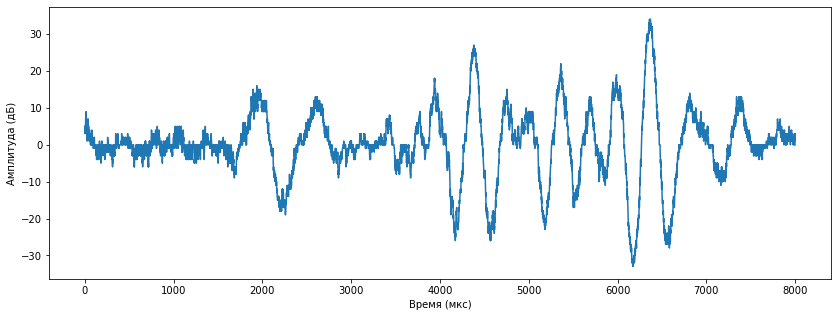

In [1783]:
#torch.save(generator, 'goto01_36:.pth')
#model = torch.load('goto01_36:.pth')
#outputs12 = model(X_train1)
outputs2 = np.array(outputs12[13].detach().numpy())
#sp.io.wavfile.write('sintesS.wav', 22050, outputs2.astype(data.dtype))
sp.io.wavfile.write("goto000.wav", 35100, outputs2.astype(np.int16))
#sf.write('phonemesx.wav', lstxx.detach().numpy(), 35050)
input_data = read("goto000.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio("goto000.wav")

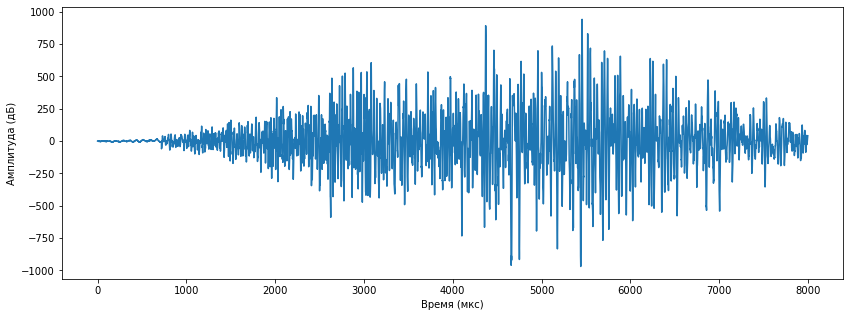

In [1762]:
#torch.save(generator, 'goto01_24:36.pth')
#model = torch.load('goto01_24:36.pth')
#outputs12 = model(X_train1)
outputs2 = np.array(outputs12[11].detach().numpy())
#sp.io.wavfile.write('sintesS.wav', 22050, outputs2.astype(data.dtype))
sp.io.wavfile.write("goto000.wav", 35100, outputs2.astype(np.int16))
#sf.write('phonemesx.wav', lstxx.detach().numpy(), 35050)
input_data = read("goto000.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio("goto000.wav")

<ipython-input-1740-fdc0bf54947c>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('goto01_12:24.pth')


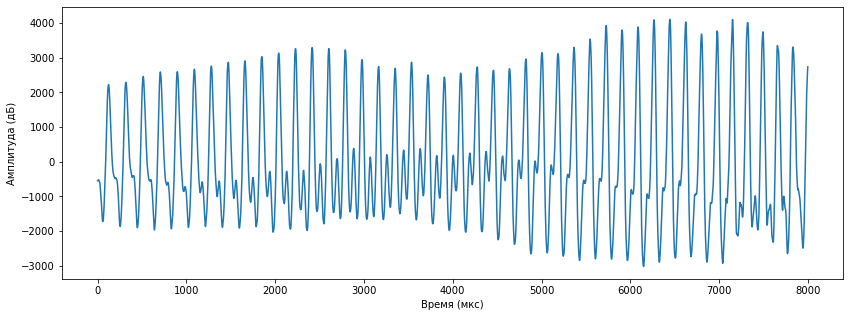

In [1740]:
#torch.save(generator, 'goto01_12:24.pth')
#model = torch.load('goto01_12:24.pth')
#outputs12 = model(X_train1)
outputs2 = np.array(outputs12[11].detach().numpy())
#sp.io.wavfile.write('sintesS.wav', 22050, outputs2.astype(data.dtype))
sp.io.wavfile.write("goto000.wav", 35100, outputs2.astype(np.int16))
#sf.write('phonemesx.wav', lstxx.detach().numpy(), 35050)
input_data = read("goto000.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio("goto000.wav")

In [1485]:
#torch.save(generator, 'goto01_12.pth')
#model = torch.load('goto01_12.pth')
#outputs12 = model(X_train1)
#sf.write( "goto01_03.wav",  outputs12[1].detach().numpy(), 35050)
#import IPython.display as ipd
#ipd.Audio('goto01_03.wav')

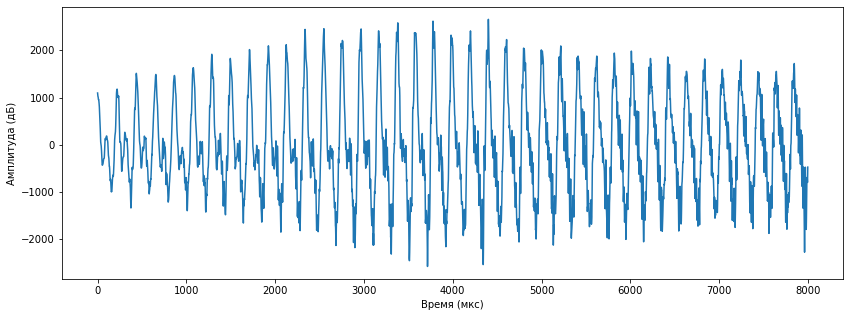

In [1714]:
#torch.save(generator, 'goto01_12.pth')
#model = torch.load('goto01_12.pth')
#outputs12 = model(X_train1)
outputs2 = np.array(outputs12[11].detach().numpy())
#sp.io.wavfile.write('sintesS.wav', 22050, outputs2.astype(data.dtype))
sp.io.wavfile.write("goto000.wav", 35100, outputs2.astype(np.int16))
#sf.write('phonemesx.wav', lstxx.detach().numpy(), 35050)
input_data = read("goto000.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio("goto000.wav")

In [1716]:
outputs12_12 = outputs12 #

In [1741]:
outputs12_1224 = outputs12 #

In [1764]:
outputs12_2436 = outputs12 #

In [1785]:
outputs12_36 = outputs12 #

In [1789]:
#outputsfin = []
outputsfin.append(outputs12_36)

In [1790]:
arr = outputsfin

x = len(arr[0])
y = len(arr)

lst3 = []
for i in range(y):
    for j in arr[i]:
        lst3.append(j)

In [1791]:
len(lst3)

50

In [1792]:
dx = {}
dx = {
    keys[0]: lst3[0],
    keys[1]: lst3[1],
    keys[2]: lst3[2],
    keys[3]: lst3[3],
    keys[4]: lst3[4],
    keys[5]: lst3[5],
    keys[6]: lst3[6],
    keys[7]: lst3[7],
    keys[8]: lst3[8],
    keys[9]: lst3[9],
    keys[10]: lst3[10],
    keys[11]: lst3[11],
    keys[12]: lst3[12],
    keys[13]: lst3[13],
    keys[14]: lst3[14],
    keys[15]: lst3[15],
    keys[16]: lst3[16],
    keys[17]: lst3[17],
    keys[18]: lst3[18],
    keys[19]: lst3[19],
    keys[20]: lst3[20],
    keys[21]: lst3[21],
    keys[22]: lst3[22],
    keys[23]: lst3[23],
    keys[24]: lst3[24],
    keys[25]: lst3[25],
    keys[26]: lst3[26],
    keys[27]: lst3[27],
    keys[28]: lst3[28],
    keys[29]: lst3[29],
    keys[30]: lst3[30],
    keys[31]: lst3[31],
    keys[32]: lst3[32],
    keys[33]: lst3[33],
    keys[34]: lst3[34],
    keys[35]: lst3[35],
    keys[36]: lst3[36],
    keys[37]: lst3[37],
    keys[38]: lst3[38],
    keys[39]: lst3[39],
    keys[40]: lst3[40],
    keys[41]: lst3[41],
    keys[42]: lst3[42],
    keys[43]: lst3[43],
    keys[44]: lst3[44],
    keys[45]: lst3[45],
    keys[46]: lst3[46],
    keys[47]: lst3[47],
    keys[48]: lst3[48],
    keys[49]: lst3[49]
}

In [1793]:
keys2x= list(dx.keys())

In [1809]:
phonemesx = []
phonx = []
for i in range(len(grapheme)):
    phonx = dx[grapheme[i]]
    phonemesx.append(phonx)

In [1810]:
x = len(phonemesx[0])
y = len(phonemesx)

lstxx = []
for i in range(y):
    for j in phonemesx[i]:
        lstxx.append(j)

In [1811]:
lstxx = torch.Tensor(lstxx)

In [1812]:
len(lstxx)

464000

In [1816]:
range(len(lst3))

range(0, 50)

In [1817]:
for i in range(len(lst3)): 
    outputs2 = np.array(lst3[i].detach().numpy())
    sp.io.wavfile.write( 'gen' + keys[i] + '.wav', 35100, outputs2.astype(np.int16))

In [1798]:
outputs2 = np.array(lstxx.detach().numpy())
#sp.io.wavfile.write('sintesS.wav', 22050, outputs2.astype(data.dtype))
sp.io.wavfile.write('phonemesx.wav', 35100, outputs2.astype(np.int16))

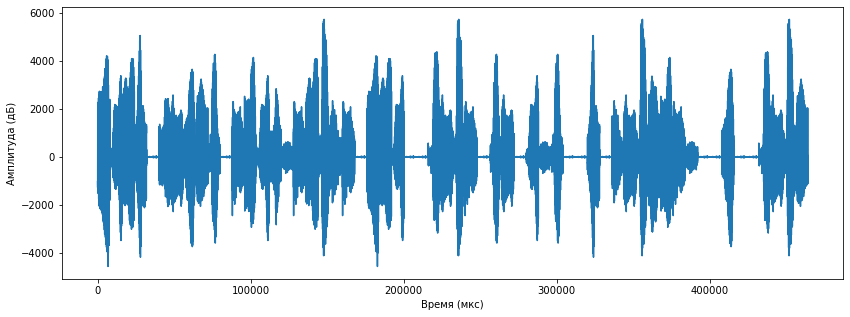

In [1799]:
#sf.write('phonemesx.wav', lstxx.detach().numpy(), 35050)
input_data = read("phonemesx.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('phonemesx.wav')

In [1814]:
outputs2 = np.array(lst3[0].detach().numpy())
#sp.io.wavfile.write('sintesS.wav', 22050, outputs2.astype(data.dtype))
sp.io.wavfile.write('phonemesx123321.wav', 35100, outputs2.astype(np.int16))

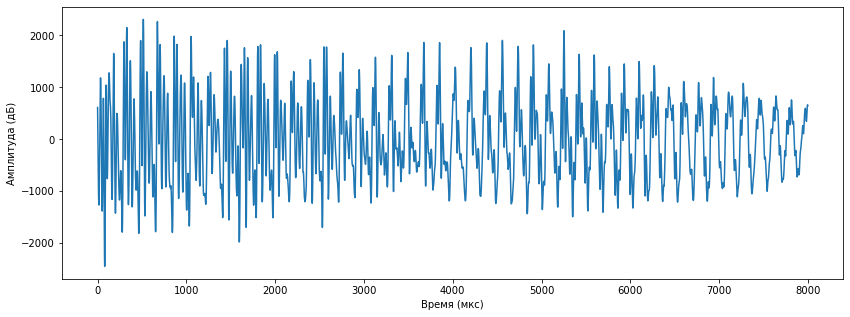

In [1815]:
input_data = read("phonemesx123321.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('phonemesx123321.wav')

In [1474]:
#torch.save(generator, 'goto01_02.pth')
#model = torch.load('goto01_02.pth')
#torch.save(generator, 'goto01_01.pth')
#model = torch.load('goto01_01.pth')
#outputs12 = model(X_train1)
#sf.write( "goto01_02.wav",  outputs12[0].detach().numpy(), 35050)
#import IPython.display as ipd
#ipd.Audio('goto01_02.wav')

# #############################################

In [29]:
import re
sstr = ['корову',
        'мама',
        'папа',
        'фея',]
string_letter = []
for i in range(len(sstr)):
    #lst_string_letter_1 = []
    lower_string = sstr[i].lower()
    no_number_string = re.sub(r'\d+','',lower_string)
    #no_punc_string = re.sub(r'[^\w\s]','', no_number_string)
    no_wspace_string = no_number_string.strip()
    lst_string = [no_wspace_string][0].split()
    lst_string_letter = [no_wspace_string][0].split()
    lst_string_letter_1 = []
    string_letter.append(lst_string_letter)
sentens = []
for i in range(len(string_letter)):
    for j in range(len(string_letter[i])):
        sentens.append(string_letter[i][j])

from navec import Navec

path = 'navec_hudlit_v1_12B_500K_300d_100q.tar'
navec = Navec.load(path)
vec22 = []
vec221 = []
for i in range(len(string_letter)):
    for j in range(len(string_letter[i])):
        if string_letter[i][j] == '?':
            vekt = np.ones(300)*(20)
        if string_letter[i][j] == "!":
            vekt = np.ones(300)*(10)
        if string_letter[i][j] == ".":
            vekt = np.ones(300)*(5)
        if string_letter[i][j] != "." and string_letter[i][j] != "!" and string_letter[i][j] != '?' and string_letter[i][j] != ".":
            vekt = navec[string_letter[i][j]]
        vec22.append(np.fft.ifft(np.fft.fft(vekt)))
    vec221.append(vec22)
    vec22 = []
#vec221_set = vec221
#vec2 = vec221[5][0] - vec221[5][0]
#for j in range(len(vec221)):
#    while len(vec221[j]) != len(vec221[13]):
#        vec221_set[j].append(vec2)
#        #print("1")

In [30]:
string_letter

[['корову'], ['мама'], ['папа'], ['фея']]

In [31]:
sentens

['корову', 'мама', 'папа', 'фея']

In [32]:
len(vec221)

4

In [33]:
IK = [1,2,3,4]

In [37]:
#X_train, X_test, y_train, y_test = train_test_split(IK, MFCCS, test_size=0.1)
X_train = []
X_train = vec221
y_train = []
y_train = IK
#y_train = np.array(y_train)
y_train = torch.Tensor(y_train)
#y_train = torch.unsqueeze(y_train, 0)
#y_train = [t.numpy() for t in y_train]
X_train = np.array(X_train)
X_train = torch.Tensor(X_train)
X_train = [t.numpy() for t in X_train]
X_train = np.array(X_train)
X_train = torch.Tensor(X_train)
#X_train = torch.unsqueeze(X_train, 0)
#y_train = np.array(y_train)
#y_train = torch.Tensor(y_train)
#y_train = torch.unsqueeze(y_train, 0)
X_train1 = X_train.flatten(1, 2)
batch_size = 512
train_dataset = TensorDataset(X_train, X_train)
val_dataset = TensorDataset(X_train, X_train)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

In [269]:
#МУСОР

<ipython-input-270-ca06261cec22>:529: ComplexWarning: Casting complex values to real discards the imaginary part
  sp.io.wavfile.write('zz.wav', 41050, lst.astype(speech_data.dtype))


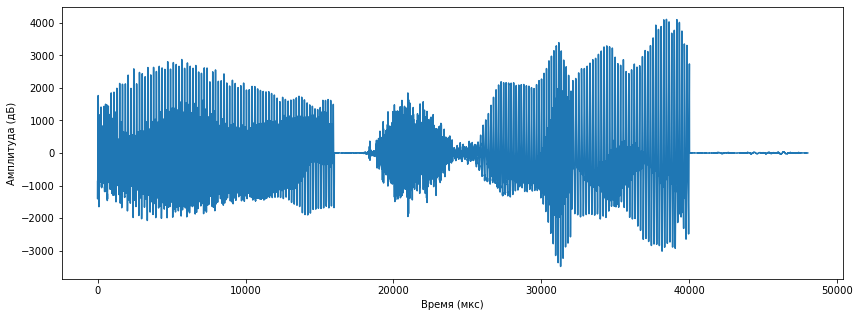

In [270]:
import re
#string = "       рассказ про корову и фею"
#string = ".  Я  очень  стараюсь  ."
#string = "       Она так красива"
#string = "       Какой он врач"
string = "      очень"
#string = "       Вася где работает?"
#string = "       это москва?"
lst_string_letter_2 = accentizer.process_all(string)
lower_string = lst_string_letter_2.lower()
no_number_string = re.sub(r'\d+','',lower_string)
#no_punc_string = re.sub(r'[^\w\s]','', no_number_string)
no_wspace_string = no_number_string.strip()
lst_string = [no_wspace_string][0].split()
lst_string_letter = [no_wspace_string][0].split()
lst_string_letter_1 = []
for j in range(len(no_wspace_string)):
    for i in range(len(no_wspace_string[j])):
        lst_string_letter_0 = [no_wspace_string][0][j].split()
        lst_string_letter_1.append(lst_string_letter_0)
#print(lst_string_letter_1) 
phoneme = {
    "001": "а",
    "002": "б",
    "102": "б'",
    "003": "в",
    "103": "в'",
    "004": "г",
    "104": "г'",
    "005": "д",
    "105": "д'",
    "006": "е",
    "007": "ё",
    "008": "ж",
    "108": "ж'",
    "009": "з",
    "109": "з'",
    "010": "и",
    "011": "й",
    "012": "к",
    "112": "к'",
    "013": "л",
    "113": "л'",
    "014": "м",
    "114": "м'",
    "015": "н",
    "115": "н'",
    "016": "о",
    "017": "п",
    "117": "п'",
    "018": "р",
    "118": "р'",
    "019": "с",
    "119": "с'",
    "020": "т",
    "120": "т'",
    "021": "у",
    "022": "ф",
    "122": "ф'",
    "023": "х",
    "123": "х'",
    "024": "ц",
    "025": "ч",
    "026": "ш",
    "027": "щ",
    "028": "ь",
    "029": "ы",
    "030": "ъ",
    "031": "э",
    "032": "ю",
    "033": "я",
    "034": '',
    "035": "?",
    "036": "-",
    "037": ",",
    "038": ".",
    "039": "+",
    "040": "А",
    "041": "Е",
    "042": "Ё",
    "043": "И",
    "044": "О",
    "045": "У",
    "046": "Ы",
    "047": "Э",
    "048": "Ю",
    "049": "Я"
}
grapheme = []
for i in range(len(lst_string_letter_1)):
    xs = lst_string_letter_1[i]
    s = ''.join(str(x) for x in xs)
    target_grade = s

    keys = list(phoneme.keys())
    index = list(phoneme.values()).index(target_grade)
    key = keys[index]
    grapheme.append(key)
#grapheme
phoneme1 = {
    "002": "б",
    "003": "в",
    "004": "г",
    "005": "д",
    "008": "ж",
    "009": "з",
    "012": "к",
    "013": "л",
    "014": "м",
    "015": "н",
    "017": "п",
    "018": "р",
    "019": "с",
    "020": "т",
    "022": "ф",
    "023": "х",
    "024": "ц",
    "025": "ч",
    "026": "ш",
    "027": "щ"
}
phoneme2 = {
    "102": "б'",
    "103": "в'",
    "104": "г'",
    "105": "д'",
    "108": "ж'",
    "109": "з'",
    "112": "к'",
    "113": "л'",
    "114": "м'",
    "115": "н'",
    "117": "п'",
    "118": "р'",
    "119": "с'",
    "120": "т'",
    "122": "ф'",
    "123": "х'"
}
phoneme4 = {
    "001": "а",
    "006": "е",
    "007": "ё",
    "010": "и",
    "016": "о",
    "021": "у",
#    "028": "ь",
    "029": "ы",
#    "030": "ъ",
    "031": "э",
    "032": "ю",
    "033": "я"
}
phoneme5 = {
    "006": "е",
    "007": "ё",
    "010": "и",
    "032": "ю",
    "033": "я",
    "028": "ь"
}
phoneme_iskl = {
    "035": "?",
    "036": "-",
    "037": ",",
    "038": "."
}
phoneme44 = {
    "040": "А",
    "041": "Е",
    "042": "Ё",
    "043": "И",
    "044": "О",
    "045": "У",
#    "028": "ь",
    "046": "Ы",
#    "030": "ъ",
    "047": "Э",
    "048": "Ю",
    "049": "Я"
}
grapheme_phoneme4 = list(phoneme4.keys())
grapheme_phoneme44 = list(phoneme44.keys())
grapheme0 = list(phoneme.keys())
grapheme1 = list(phoneme5.keys())
grapheme2 = list(phoneme1.keys())
grapheme_iskl = list(phoneme_iskl.keys())
a = grapheme1
b = grapheme
x = []
c = []
x2 = []

for i in a:
    for j in b:
        if i == j:
            c.append(i)
            break
#print(c)
for j in range(len(c)):
    x.append([i for i, ltr in enumerate(grapheme) if ltr == c[j]])
#print(x)   
x2 = [element for each_list in x for element in each_list]
#print(x2)
index_grapheme1 = x2
index_phonem_grapheme1 = c
a = grapheme2
b = grapheme
x = []
c = []
x2 = []

for i in a:
    for j in b:
        if i == j:
            c.append(i)
            break
#print(c)
for j in range(len(c)):
    x.append([i for i, ltr in enumerate(grapheme) if ltr == c[j]])
#print(x)   
x2 = [element for each_list in x for element in each_list]
#print(x2)
index_grapheme2 = x2
index_phonem_grapheme2 = c
a = grapheme_iskl
b = grapheme
x = []
c = []
x2 = []

for i in a:
    for j in b:
        if i == j:
            c.append(i)
            break
#print(c)
for j in range(len(c)):
    x.append([i for i, ltr in enumerate(grapheme) if ltr == c[j]])
#print(x)   
x2 = [element for each_list in x for element in each_list]
#print(x2)
index_grapheme_iskl = x2
index_phonem_grapheme_iskl = c
#//////////////////////////////////////////////////////////////////////////////////
phoneme4 = {
    "001": "а",
    "006": "е",
    "007": "ё",
    "010": "и",
    "016": "о",
    "021": "у",
#    "028": "ь",
    "029": "ы",
#    "030": "ъ",
    "031": "э",
    "032": "ю",
    "033": "я"
}
grapheme_phoneme4 = list(phoneme4.keys())
phoneme44 = {
    "040": "А",
    "041": "Е",
    "042": "Ё",
    "043": "И",
    "044": "О",
    "045": "У",
#    "028": "ь",
    "046": "Ы",
#    "030": "ъ",
    "047": "Э",
    "048": "Ю",
    "049": "Я"
}
grapheme_phoneme44 = list(phoneme44.keys())
phoneme_445 = {
    "041": "Е",
    "042": "Ё",
    "043": "И",
    "048": "Ю",
    "049": "Я"
}
grapheme_phoneme_445 = list(phoneme_445.keys())
cc_1 = []
cc_2 = []
for i in range(len(grapheme)):
    if '039' == grapheme[i]:
        cc_1.append(i)
        cc_2.append(i+1)
cc_3 = []
cc_4 = []
cc_5 = []
for i in range(len(grapheme)):
    for j in range(len(grapheme_phoneme44)):
        if grapheme[i] == "039":
            if grapheme_phoneme4[j] == grapheme[i+1]:
                cc_3.append(i+1)
                cc_4.append(j)
                cc_5.append(j+1)
for j in range(len(cc_3)):
    grapheme[cc_3[j]] = grapheme_phoneme44[cc_4[j]]
grapheme123321 = []
for i in range(len(grapheme)):
    if grapheme[i] != "039":
        grapheme123321.append(grapheme[i]) 
grapheme123321 = []
for i in range(len(grapheme)):
    if grapheme[i] != '039':
        grapheme123321.append(grapheme[i]) 
#grapheme123321 = grapheme
grapheme = grapheme123321
#////////////////////////////////////////////////////////////////
a = grapheme_phoneme_445
b = grapheme
x = []
c = []
x2 = []

for i in a:
    for j in b:
        if i == j:
            c.append(i)
            break
#print(c)
for j in range(len(c)):
    x.append([i for i, ltr in enumerate(grapheme) if ltr == c[j]])
#print(x)   
x2 = [element for each_list in x for element in each_list]
#print(x2)
index_grapheme_phoneme_445 = x2
index_phonem_graphemephoneme_445 = c
a = grapheme2
b = grapheme
x = []
c = []
x2 = []

for i in a:
    for j in b:
        if i == j:
            c.append(i)
            break
#print(c)
for j in range(len(c)):
    x.append([i for i, ltr in enumerate(grapheme) if ltr == c[j]])
#print(x)   
x2 = [element for each_list in x for element in each_list]
#print(x2)
index_grapheme2 = x2
index_phonem_grapheme2 = c
#################################################################################
#ВЫБОР МЯГКОЙ ФОНЕМЫ
str1 = "1"
ind=[]
cc = []
grapheme4 = []
for i in index_grapheme2:
    for j in index_grapheme_phoneme_445:
        if i+1 == j:
            cc.append(i)
            #break
            my_string = grapheme[i]
            result_string = ""
            index = 0
            for k in range(len(my_string)):
                if k != index:
                    result_string += my_string[k]
            grapheme4.append(str1+result_string)
grapheme5 = grapheme
for i in range(len(cc)):
    grapheme5[cc[i]] = grapheme4[i]
import re
string = "       ъ"
lower_string = string.lower()
no_number_string = re.sub(r'\d+','',lower_string)
no_punc_string = re.sub(r'[^\w\s]','', no_number_string)
no_wspace_string = no_punc_string.strip()
lst_string = [no_wspace_string][0].split()
lst_string_letter = [no_wspace_string][0].split()
lst_string_letter_1 = []
for j in range(len(no_wspace_string)):
    for i in range(len(no_wspace_string[j])):
        lst_string_letter_0 = [no_wspace_string][0][j].split()
        lst_string_letter_1.append(lst_string_letter_0)
#print(lst_string_letter_1) 
grapheme6 = []
for i in range(len(lst_string_letter_1)):
    xs = lst_string_letter_1[i]
    s = ''.join(str(x) for x in xs)
    target_grade = s

    keys = list(phoneme.keys())
    index = list(phoneme.values()).index(target_grade)
    key = keys[index]
    grapheme6.append(key)
#grapheme6
a = grapheme6
b = grapheme
x = []
c = []
x2 = []

for i in a:
    for j in b:
        if i == j:
            c.append(i)
            break
#print(c)
for j in range(len(c)):
    x.append([i for i, ltr in enumerate(grapheme) if ltr == c[j]])
#print(x)   
x2 = [element for each_list in x for element in each_list]
#print(x2)
index_grapheme4 = x2
index_phonem_grapheme4 = c
#for i in range(len(index_grapheme4)):
#    grapheme7 = grapheme.pop(index_grapheme4[i])
data_bis1=[]
for i in range(len(keys)): 
    #rate, data = sp.io.wavfile.read(keys[i] + '1' + '.wav')
    rate, data = sp.io.wavfile.read("gen" + keys[i] + '.wav')
    data_bis = np.fft.ifft(np.fft.fft(data))
    data_bis1.append(data_bis)
d = {}
d = {
    keys[0]: data_bis1[0],
    keys[1]: data_bis1[1],
    keys[2]: data_bis1[2],
    keys[3]: data_bis1[3],
    keys[4]: data_bis1[4],
    keys[5]: data_bis1[5],
    keys[6]: data_bis1[6],
    keys[7]: data_bis1[7],
    keys[8]: data_bis1[8],
    keys[9]: data_bis1[9],
    keys[10]: data_bis1[10],
    keys[11]: data_bis1[11],
    keys[12]: data_bis1[12],
    keys[13]: data_bis1[13],
    keys[14]: data_bis1[14],
    keys[15]: data_bis1[15],
    keys[16]: data_bis1[16],
    keys[17]: data_bis1[17],
    keys[18]: data_bis1[18],
    keys[19]: data_bis1[19],
    keys[20]: data_bis1[20],
    keys[21]: data_bis1[21],
    keys[22]: data_bis1[22],
    keys[23]: data_bis1[23],
    keys[24]: data_bis1[24],
    keys[25]: data_bis1[25],
    keys[26]: data_bis1[26],
    keys[27]: data_bis1[27],
    keys[28]: data_bis1[28],
    keys[29]: data_bis1[29],
    keys[30]: data_bis1[30],
    keys[31]: data_bis1[31],
    keys[32]: data_bis1[32],
    keys[33]: data_bis1[33],
    keys[34]: data_bis1[34],
    keys[35]: data_bis1[35],
    keys[36]: data_bis1[36],
    keys[37]: data_bis1[37],
    keys[38]: data_bis1[38],
    keys[39]: data_bis1[39],
    keys[40]: data_bis1[40],
    keys[41]: data_bis1[41],
    keys[42]: data_bis1[42],
    keys[43]: data_bis1[43],
    keys[44]: data_bis1[44],
    keys[45]: data_bis1[45],
    keys[46]: data_bis1[46],
    keys[47]: data_bis1[47],
    keys[48]: data_bis1[48],
    keys[49]: data_bis1[49],
    keys[50]: data_bis1[50],
    keys[51]: data_bis1[51],
    keys[52]: data_bis1[52],
    keys[53]: data_bis1[53],
    keys[54]: data_bis1[54],
    keys[55]: data_bis1[55],
    keys[56]: data_bis1[56],
    keys[57]: data_bis1[57],
    keys[58]: data_bis1[58],
    keys[59]: data_bis1[59],
    keys[60]: data_bis1[60],
    keys[61]: data_bis1[61],
    keys[62]: data_bis1[62],
    keys[63]: data_bis1[63],
    keys[64]: data_bis1[64],
}
keys2= list(d.keys())
phonemes = []
phon = []
for i in range(len(grapheme)):
    phon = d[grapheme[i]]
    phonemes.append(phon)
#удаляем тишину
#new_list=grapheme.copy()
new_list=grapheme
for i in grapheme:
    for j in [grapheme0[50]]:
        if i == j:
            new_list.remove(grapheme0[49])
            #print('1')
            break
phonemes = []
phon = []
for i in range(len(grapheme)):
    phon = d[grapheme[i]]
    phonemes.append(phon)
ind=[]
cc1 = []
cc2 = []
for i in index_grapheme2:
    for j in index_grapheme1:
        if i+1 == j:
            cc1.append(i)
            cc2.append(j)
            break
x = len(phonemes[0])
y = len(phonemes)

lst = []
for i in range(y):
    for j in phonemes[i]:
        lst.append(j)
lst = np.array(lst, dtype=np.complex128)
sp.io.wavfile.write('zz.wav', 41050, lst.astype(speech_data.dtype))
input_data = read("zz.wav")
audio = input_data[1]
plt.figure(figsize=(14, 5))
plt.plot(audio)
plt.ylabel("Амплитуда (дБ)")
plt.xlabel("Время (мкс)")
plt.show()
import IPython.display as ipd
ipd.Audio('zz.wav')